In [ ]:
import kagglehub
kagglehub.login()

Kaggle credentials set.
Kaggle credentials successfully validated.


In [ ]:
nfl_big_data_bowl_2026_prediction_path = kagglehub.competition_download('nfl-big-data-bowl-2026-prediction')
nfl_big_data_bowl_2026_analytics_path = kagglehub.competition_download('nfl-big-data-bowl-2026-analytics')

print('Data source import complete.')

100%|██████████| 103M/103M [00:06<00:00, 16.0MB/s]

Extracting files...


Data source import complete.


# NFL Big Data Bowl 2026 — Prediction

## Indice

1. Configuration
2. Data Loading and Preprocessing
3. Players Physique Inspection
4. Players Abilities Inspection
5. Play Features Computation
6. Play Features per Player
7. Features Organization (Node / Edge / Global)
8. Data and Model
9. Play Visualizations


In [ ]:
!pip install torch_geometric --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.2 MB/s eta 0:00:00


In [ ]:
# Tutti gli import del notebook sono centralizzati qui.

from concurrent.futures import ThreadPoolExecutor, as_completed, ProcessPoolExecutor
from pathlib import Path
import gc
import math
import os
import warnings

from matplotlib.lines import Line2D
from scipy.signal import savgol_filter
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from torch.utils.data import Dataset, DataLoader
from torch_geometric.data import Batch
from torch_geometric.data import Data, Batch
from torch_geometric.nn import MessagePassing
import torch
import torch.nn as nn
import torch.nn.functional as F

import kagglehub

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
warnings.filterwarnings('ignore')

---
# 1. Configuration

In [ ]:
# Config
DATA_PATH = Path(nfl_big_data_bowl_2026_prediction_path)
DATA_ANALYTICS_PATH = Path(nfl_big_data_bowl_2026_analytics_path)
TRAIN_PATH = DATA_PATH / 'train'

WEEKS = list(range(1, 19))
RANDOM_STATE = 42

MAX_INPUT_NODES = 17
MAX_INPUT_FRAMES = 123
MAX_OUTPUT_NODES = 17
MAX_OUTPUT_FRAMES = 94

group_cols = ['game_id', 'play_id', 'nfl_id']
id_dataset = ['game_id', 'play_id', 'nfl_id', 'frame_id']

---
# 2. Data Loading and Preprocessing

In [ ]:
def load_weeks_parallel(week_nums, train_path, max_workers=8):
    def load_week(w):
        inp = pd.read_csv(train_path / f"input_2023_w{w:02d}.csv")
        out = pd.read_csv(train_path / f"output_2023_w{w:02d}.csv")
        return w, inp, out

    inputs, outputs = [], []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = {executor.submit(load_week, w): w for w in week_nums}
        for future in tqdm(as_completed(futures), total=len(futures), desc="Loading weeks"):
            w, inp, out = future.result()
            inputs.append(inp)
            outputs.append(out)

    return pd.concat(inputs, ignore_index=True), pd.concat(outputs, ignore_index=True)

input_df, output_df = load_weeks_parallel(WEEKS, TRAIN_PATH, max_workers=8)
print(f"Data loaded: {len(input_df)} input rows, {input_df['game_id'].nunique()} games")
print(f"Data loaded: {len(output_df)} output rows, {output_df['game_id'].nunique()} games")

aux = pd.read_csv(
    DATA_ANALYTICS_PATH /
    "114239_nfl_competition_files_published_analytics_final/supplementary_data.csv"
)
print(f"Data loaded: {len(aux)} aux rows, {aux['game_id'].nunique()} games")

# MultiIndex for output
output_idx = output_df.set_index(["game_id", "play_id"]).index

context_columns = [
    'game_id', 'play_id', 'quarter', 'game_clock', 'down', 'yards_to_go',
    'pass_result', 'offense_formation', #'receiver_alignment',
    'route_of_targeted_receiver', 'play_action', 'dropback_type',

    'expected_points', 'expected_points_added'
]

# Build MultiIndex aux
aux_context = aux[context_columns].set_index(["game_id", "play_id"])

# Filter rows that match output_df index
aux_df = aux_context.loc[aux_context.index.intersection(output_idx)]
print(f"Filtered: {len(aux_df)} rows, {aux_df.index.get_level_values('game_id').nunique()} games")
aux_df.reset_index(inplace= True)

Loading weeks: 100%|██████████| 18/18 [00:19<00:00,  1.08s/it]


Data loaded: 4880579 input rows, 272 games
Data loaded: 562936 output rows, 272 games
Data loaded: 18009 aux rows, 349 games
Filtered: 14108 rows, 272 games


In [ ]:
input_df["player_position"].replace({ "LB": "ILB", "MLB": "ILB", "T" : "OT"}, inplace= True)

# --- Individual Replacements ---
input_df["player_position"] = input_df["player_position"].mask(input_df["nfl_id"] == 52991, "FS")
input_df["player_position"] = input_df["player_position"].mask(input_df["nfl_id"] == 56275, "FS")
input_df["player_position"] = input_df["player_position"].mask(input_df["nfl_id"] == 46162, "SS")
input_df["player_position"] = input_df["player_position"].mask(input_df["nfl_id"] == 45244, "TE")

input_df = input_df.drop(
    input_df[
        ((input_df["game_id"] == 2023112606) &
        (input_df["play_id"] == 4180)) |
        ((input_df["game_id"] == 2023091001) &
        (input_df["play_id"] == 3216)) |
        ((input_df["game_id"] == 2023121009) &
        (input_df["play_id"] == 3594)) |
        ((input_df["game_id"] == 2023112603) &
        (input_df["play_id"] == 3503))
    ].index
)

output_df = output_df.drop(
    output_df[
        ((output_df["game_id"] == 2023112606) &
        (output_df["play_id"] == 4180)) |
        ((output_df["game_id"] == 2023091001) &
        (output_df["play_id"] == 3216)) |
        ((output_df["game_id"] == 2023121009) &
        (output_df["play_id"] == 3594)) |
        ((output_df["game_id"] == 2023112603) &
        (output_df["play_id"] == 3503))
    ].index
)

aux_df = aux_df.drop(
    aux_df[
        ((aux_df["game_id"] == 2023112606) &
        (aux_df["play_id"] == 4180)) |
        ((aux_df["game_id"] == 2023091001) &
        (aux_df["play_id"] == 3216)) |
        ((aux_df["game_id"] == 2023121009) &
        (aux_df["play_id"] == 3594)) |
        ((aux_df["game_id"] == 2023112603) &
        (aux_df["play_id"] == 3503))
    ].index
)

# --- End of Individual Replacements ---

---
# 3. Players Physique Inspection

In [ ]:
# Convert into Standard Units
def ft_to_m(height_str):
    try:
        feet, inches = map(int, height_str.split('-'))
        return (feet * 12 + inches) * 0.0254
    except:
        return None

In [ ]:
def birthday_to_age(players_df, ref_date= "2025-12-15"):
    if ref_date is None:
          ref_date = pd.Timestamp.today()
    else:
          ref_date = pd.Timestamp(ref_date)

    birth_dates = pd.to_datetime(players_df["player_birth_date"])
    ages = (ref_date - birth_dates).dt.days / 365.25
    return ages

In [ ]:
player_columns = [
    'player_name', 'player_height', 'player_weight',
    'player_birth_date', 'player_position', 'player_side'
]

# Drop duplicates to keep only one row per nfl_id
players_df = input_df.drop_duplicates(subset=['nfl_id'])[ ['nfl_id'] + player_columns ].set_index('nfl_id')

# TO BE REVIEWED I need to find an invariant way of getting age out of birth date (Like inserting default 12/01/2025 but calculating before by 11/01/2023)
# (UPDATED) Decision of computing this with the mean date of season 2023, while default will be mean of predicted weeks

# TO BE REVIEWED I need to translate everything into meters and kilos

players_df["player_age"] = birthday_to_age(players_df, ref_date= "2023-11-15")
players_df['player_height_m'] = players_df["player_height"].apply(ft_to_m)
players_df["player_weight_kg"] = players_df["player_weight"] * 0.45359237
players_df.drop(["player_height", "player_weight", "player_birth_date"], axis= 1, inplace= True)
players_df["player_BMI"] = players_df["player_weight_kg"] / (players_df["player_height_m"] ** 2)

players_df.head(20)

,player_name,player_position,player_side,player_age,player_height_m,player_weight_kg,player_BMI
nfl_id,,,,,,,
54514,Alontae Taylor,CB,Defense,24.950034,1.8288,88.450512,26.446483
38607,Demario Davis,ILB,Defense,34.841889,1.8796,112.490908,31.840989
44851,Marcus Maye,FS,Defense,30.685832,1.8288,93.893621,28.073959
44823,Marshon Lattimore,CB,Defense,27.488022,1.8288,87.089735,26.039614
53505,Paulson Adebo,CB,Defense,24.369610,1.8288,87.543327,26.175237
53489,Pete Werner,ILB,Defense,25.445585,1.9050,109.769354,30.247616
40017,Tyrann Mathieu,FS,Defense,31.507187,1.7526,86.182550,28.057807
46095,Calvin Ridley,WR,Offense,28.903491,1.8542,86.182550,25.067221
46116,Christian Kirk,WR,Offense,26.989733,1.8034,90.718474,27.894052


In [ ]:
def get_player(nfl_id,
               players_df= players_df):
    return players_df.loc[nfl_id]

get_player(46456)

,46456
player_name,Darious Williams
player_position,CB
player_side,Defense
player_age,30.669405
player_height_m,1.7526
player_weight_kg,84.821773
player_BMI,27.614789


In [ ]:
positions_df = players_df.drop(["player_name", "player_side"], axis= 1)

positions_phyiscal_summary_df = positions_df.groupby(by= "player_position").agg(["mean", "std", "min", "max"])
positions_phyiscal_summary_df.fillna(0, inplace= True)
positions_phyiscal_summary_df

player_age                                 player_height_m  \
                      mean       std        min        max            mean   
player_position                                                              
CB               25.942429  2.615588  21.382615  33.776865        1.827624   
DE               26.791939  3.059477  21.806982  35.616701        1.933944   
DT               27.536968  2.954971  22.108145  37.204654        1.907592   
FB               28.150034  2.680231  23.529090  32.563997        1.859280   
FS               27.043192  3.021968  22.094456  34.781656        1.831419   
ILB              26.623947  2.496945  21.555099  34.841889        1.869524   
K                39.263518  0.000000  39.263518  39.263518        1.778000   
NT               28.745893  2.200980  24.084873  32.520192        1.893887   
OLB              26.487760  3.042409  21.199179  36.038330        1.908735   
OT               29.774127  0.878923  29.152635  30.395619        2.019300   
P                25.815195  0.000000  25.815195  25.815195        1.879600   
QB               28.291257  3.970914  21.483915  38.828200        1.895642   
RB               25.778100  2.534616  21.111567  33.823409        1.804737   
SS               26.260960  2.759417  22.045175  35.597536        1.841500   
TE               26.716487  3.011176  22.245038  39.490760        1.946371   
WR               26.349293  2.743930  21.524983  34.765229        1.848605   

                                          player_weight_kg            \
                      std     min     max             mean       std   
player_position                                                        
CB               0.041195  1.7272  1.9304        87.335431  4.155358   
DE               0.032402  1.8288  2.0066       122.190400  7.754789   
DT               0.045568  1.8288  2.0320       137.679170  7.370645   
FB               0.033532  1.8034  1.9050       111.946597  8.755625   
FS               0.042039  1.7272  1.9304        92.051194  3.953684   
ILB              0.033033  1.8034  1.9558       106.046897  3.946913   
K                0.000000  1.7780  1.7780        91.172066  0.000000   
NT               0.037063  1.8034  1.9304       145.631500  7.459664   
OLB              0.040372  1.8034  2.0066       112.834437  7.916068   
OT               0.053882  1.9812  2.0574       150.365871  4.169597   
P                0.000000  1.8796  1.8796        88.904105  0.000000   
QB               0.041028  1.7780  1.9812        99.557557  4.677939   
RB               0.043358  1.6764  1.9050        96.795930  6.100402   
SS               0.037674  1.7780  1.9304        92.180713  3.425427   
TE               0.033569  1.8288  2.0320       113.016663  4.675004   
WR               0.062514  1.6764  1.9812        90.182955  7.111989   

                                        player_BMI                       \
                        min         max       mean       std        min   
player_position                                                           
CB                77.110703   98.429544  26.161904  1.284238  21.826484   
DE               102.058283  149.685482  32.682321  2.132331  28.459555   
DT               123.377125  162.386068  37.898069  2.701212  31.432434   
FB               105.687022  141.067227  32.368167  2.067592  29.372685   
FS                80.739442  100.697506  27.455218  1.098509  24.953127   
ILB               94.800805  116.119647  30.363469  1.426018  26.833737   
K                 91.172066   91.172066  28.840201  0.000000  28.840201   
NT               137.438488  157.396552  40.624485  2.253107  37.872015   
OLB               96.615175  140.613635  30.960531  1.801065  27.604083   
OT               147.417520  153.314221  36.943033  2.993025  34.826644   
P                 88.904105   88.904105  25.164653  0.000000  25.164653   
QB                87.996920  111.130131  27.710043  1.110998  25.196573   
RB                79.832257  115.666054

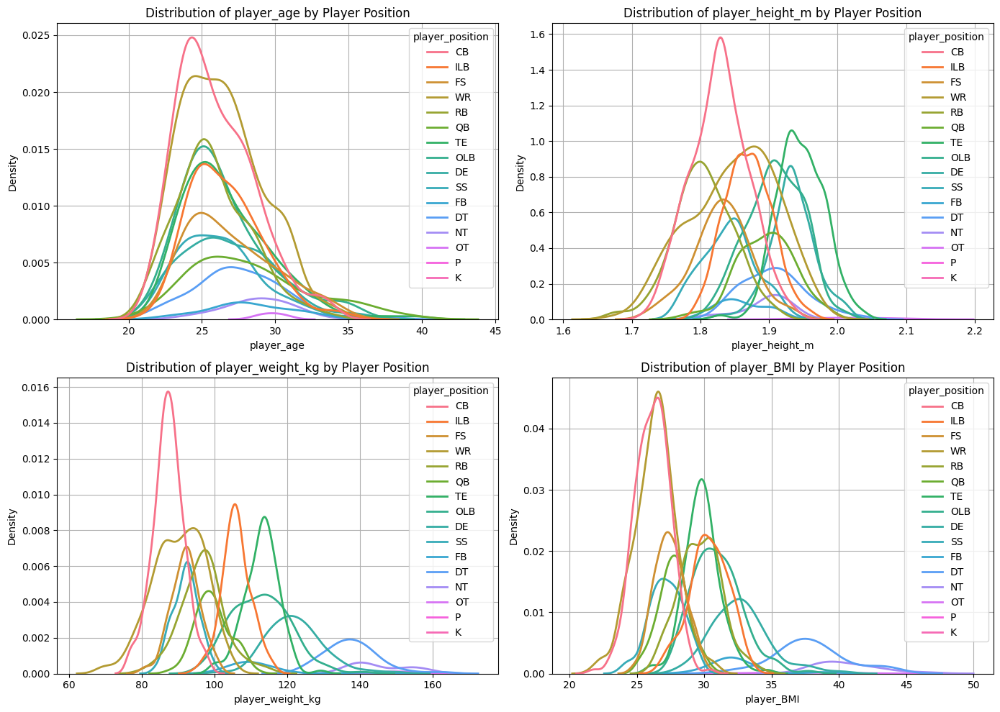

In [ ]:
# Plot distribution of numeric features by player_position
numeric_cols = positions_df.drop("player_position", axis=1).columns

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for ax, col in zip(axes, numeric_cols):
    sns.kdeplot(
        data=positions_df,
        x=col,
        hue="player_position",
        common_norm=True,
        fill=False,
        linewidth=2,
        ax=ax
    )
    ax.set_title(f"Distribution of {col} by Player Position")
    ax.set_xlabel(col)
    ax.set_ylabel("Density")
    ax.grid(True)

plt.tight_layout()
plt.show()

## 3.1 Preprocessing of Player Physique Inspection

In [ ]:
def normalize_players(df):

    numeric_cols = ["player_age", "player_height_m", "player_weight_kg", "player_BMI"]

    # --- Global normalization ---
    global_norm = df[numeric_cols].copy()
    global_norm = (global_norm - global_norm.mean()) / global_norm.std(ddof=0)
    global_norm.columns = [col + "_global_norm" for col in numeric_cols]

    # --- Positional normalization ---
    positional_norm = (
        df.groupby("player_position")[numeric_cols]
          .transform(lambda x: (x - x.mean()) / x.std(ddof=0))
    )
    positional_norm.columns = [col + "_position_norm" for col in numeric_cols]

    # --- Concatenate all together ---
    df_out = pd.concat([df, global_norm, positional_norm], axis=1) #df_out = pd.concat([df, positional_norm], axis=1)
    return df_out

In [ ]:
preprocessed_players_df = normalize_players(players_df.drop(["player_name"], axis= 1))

preprocessed_players_df = pd.get_dummies(
    preprocessed_players_df,
    columns=['player_side', 'player_position']
)

preprocessed_players_df.fillna(0, inplace= True)
preprocessed_players_df

,player_age,player_height_m,player_weight_kg,player_BMI,player_age_global_norm,player_height_m_global_norm,player_weight_kg_global_norm,player_BMI_global_norm,player_age_position_norm,player_height_m_position_norm,player_weight_kg_position_norm,player_BMI_position_norm,player_side_Defense,player_side_Offense,player_position_CB,player_position_DE,player_position_DT,player_position_FB,player_position_FS,player_position_ILB,player_position_K,player_position_NT,player_position_OLB,player_position_OT,player_position_P,player_position_QB,player_position_RB,player_position_SS,player_position_TE,player_position_WR
nfl_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
54514,24.950034,1.8288,88.450512,26.446483,-0.554935,-0.618793,-0.869838,-0.769632,-0.380297,0.028612,0.268971,0.222109,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
38607,34.841889,1.8796,112.490908,31.840989,2.803272,0.195284,0.725989,0.834633,3.304883,0.306298,1.639460,1.040424,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
44851,30.685832,1.8288,93.893621,28.073959,1.392323,-0.618793,-0.508519,-0.285639,1.211649,-0.062613,0.468423,0.566182,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
44823,27.488022,1.8288,87.089735,26.039614,0.306692,-0.618793,-0.960168,-0.890631,0.592289,0.028612,-0.059265,-0.095445,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
53505,24.369610,1.8288,87.543327,26.175237,-0.751985,-0.618793,-0.930058,-0.850298,-0.602722,0.028612,0.050147,0.010407,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55047,24.536619,1.9050,88.450512,24.373079,-0.695287,0.602323,-0.869838,-1.386239,-0.629046,1.696699,-1.096210,-2.300697,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
43335,28.654346,1.9304,149.685482,40.168449,0.702650,1.009361,3.195004,3.311127,0.612304,-0.110022,3.566357,3.531363,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
56243,25.207392,1.9050,113.398093,31.247537,-0.467564,0.602323,0.786209,0.658147,-0.503074,-1.237125,0.081900,1.079617,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False


---
# 4. Players Abilities Inspection

In [ ]:
def get_play(game_id, play_id,
             input_df= input_df, output_df= output_df):

    prepass_play_df = input_df[(input_df["game_id"] == game_id) & (input_df["play_id"] == play_id)]
    if prepass_play_df.empty:
        print(f"No input data found for game_id={game_id}, play_id={play_id}")
        return None

    postpass_play_df = output_df[(output_df["game_id"] == game_id) & (output_df["play_id"] == play_id)]
    if postpass_play_df.empty:
        print(f"No output data found for game_id={game_id}, play_id={play_id}")
        return None

    prepass_num_frames = prepass_play_df["frame_id"].max()
    postpass_play_df["frame_id"] += prepass_num_frames

    return prepass_play_df, postpass_play_df

prepass_df, postpass_df = get_play(2023101900 ,78)
prepass_df.head()

,game_id,play_id,player_to_predict,nfl_id,frame_id,play_direction,absolute_yardline_number,player_name,player_height,player_weight,player_birth_date,player_position,player_side,player_role,x,y,s,a,dir,o,num_frames_output,ball_land_x,ball_land_y
0,2023101900,78,False,54514,1,right,35,Alontae Taylor,6-0,195,1998-12-03,CB,Defense,Defensive Coverage,38.30,18.62,0.14,0.17,210.10,277.45,12,44.080002,47.619999
1,2023101900,78,False,54514,2,right,35,Alontae Taylor,6-0,195,1998-12-03,CB,Defense,Defensive Coverage,38.31,18.58,0.30,0.25,183.01,278.61,12,44.080002,47.619999
2,2023101900,78,False,54514,3,right,35,Alontae Taylor,6-0,195,1998-12-03,CB,Defense,Defensive Coverage,38.32,18.54,0.36,0.16,172.37,278.61,12,44.080002,47.619999
3,2023101900,78,False,54514,4,right,35,Alontae Taylor,6-0,195,1998-12-03,CB,Defense,Defensive Coverage,38.35,18.55,0.26,0.05,146.71,278.61,12,44.080002,47.619999
4,2023101900,78,False,54514,5,right,35,Alontae Taylor,6-0,195,1998-12-03,CB,Defense,Defensive Coverage,38.38,18.54,0.27,0.05,128.83,278.61,12,44.080002,47.619999


In [ ]:
postpass_df.head()

,game_id,play_id,nfl_id,frame_id,x,y
0,2023101900,78,44851,23,45.00,39.84
1,2023101900,78,44851,24,44.95,40.28
2,2023101900,78,44851,25,44.86,40.74
3,2023101900,78,44851,26,44.74,41.24
4,2023101900,78,44851,27,44.59,41.77


## 4.1. Standardization of a Play

In [ ]:
def standardize_plays(input_df, output_df):
    """
    Standardizes both input and output tracking data so that all plays
    are represented as moving toward the right.

    Parameters
    ----------
    input_df : pd.DataFrame
        Input tracking data (before the pass, includes play_direction)
    output_df : pd.DataFrame
        Output tracking data (after the pass, no play_direction column)

    Returns
    -------
    input_std : pd.DataFrame
        Standardized input dataframe
    output_std : pd.DataFrame
        Standardized output dataframe
    """

    field_length = 120
    field_width = 53.3

    # =====================================================
    # Identify which plays go left
    # =====================================================
    left_plays = (
        input_df.loc[input_df["play_direction"].str.lower() == "left", ["game_id", "play_id"]]
        .drop_duplicates()
        .assign(left_play=True)
    )

    # Merge info about play direction into output_df (using game_id & play_id)
    output_df = output_df.merge(left_plays, on=["game_id", "play_id"], how="left")
    output_df["left_play"] = output_df["left_play"].fillna(False)

    # =====================================================
    # INPUT STANDARDIZATION
    # =====================================================
    mask_left_input = input_df["play_direction"].str.lower() == "left"

    input_df.loc[mask_left_input, "x"] = field_length - input_df.loc[mask_left_input, "x"]
    input_df.loc[mask_left_input, "y"] = field_width - input_df.loc[mask_left_input, "y"]

    if "absolute_yardline_number" in input_df.columns:
        input_df.loc[mask_left_input, "absolute_yardline_number"] = (
            field_length - input_df.loc[mask_left_input, "absolute_yardline_number"]
        )

    if "ball_land_x" in input_df.columns:
        input_df.loc[mask_left_input, "ball_land_x"] = field_length - input_df.loc[mask_left_input, "ball_land_x"]
    if "ball_land_y" in input_df.columns:
        input_df.loc[mask_left_input, "ball_land_y"] = field_width - input_df.loc[mask_left_input, "ball_land_y"]

    for col in ["o", "dir"]:
        if col in input_df.columns:
            input_df.loc[mask_left_input, col] = (input_df.loc[mask_left_input, col] + 180) % 360

    input_df["play_direction"] = "right"

    # =====================================================
    # OUTPUT STANDARDIZATION (based on corresponding input play direction)
    # =====================================================
    mask_left_output = output_df["left_play"]

    output_df.loc[mask_left_output, "x"] = field_length - output_df.loc[mask_left_output, "x"]
    output_df.loc[mask_left_output, "y"] = field_width - output_df.loc[mask_left_output, "y"]

    input_df.drop(columns= ["play_direction"], inplace= True)
    output_df.drop(columns=["left_play"], inplace= True)

    return input_df, output_df

In [ ]:
input_df[input_df["play_id"] == 340][:5]

,game_id,play_id,player_to_predict,nfl_id,frame_id,play_direction,absolute_yardline_number,player_name,player_height,player_weight,player_birth_date,player_position,player_side,player_role,x,y,s,a,dir,o,num_frames_output,ball_land_x,ball_land_y
833,2023101900,340,False,53494,1,left,85,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,71.30,19.93,2.15,0.89,209.83,98.97,5,84.099998,24.879999
834,2023101900,340,False,53494,2,left,85,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,71.19,19.75,2.12,0.95,212.66,98.97,5,84.099998,24.879999
835,2023101900,340,False,53494,3,left,85,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,71.07,19.58,2.14,0.94,216.06,100.28,5,84.099998,24.879999
836,2023101900,340,False,53494,4,left,85,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,70.94,19.41,2.12,1.00,219.58,100.28,5,84.099998,24.879999
837,2023101900,340,False,53494,5,left,85,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,70.80,19.25,2.13,1.08,223.63,98.52,5,84.099998,24.879999


In [ ]:
output_df[output_df["play_id"] == 340][:5]

,game_id,play_id,nfl_id,frame_id,x,y
136,2023101900,340,47790,1,79.43,22.51
137,2023101900,340,47790,2,79.30,22.65
138,2023101900,340,47790,3,79.21,22.79
139,2023101900,340,47790,4,79.18,22.92
140,2023101900,340,47790,5,79.21,23.05


In [ ]:
input_df, output_df = standardize_plays(input_df, output_df)

input_df[input_df["play_id"] == 340][:5]

,game_id,play_id,player_to_predict,nfl_id,frame_id,absolute_yardline_number,player_name,player_height,player_weight,player_birth_date,player_position,player_side,player_role,x,y,s,a,dir,o,num_frames_output,ball_land_x,ball_land_y
833,2023101900,340,False,53494,1,35,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,48.70,33.37,2.15,0.89,29.83,278.97,5,35.900002,28.420001
834,2023101900,340,False,53494,2,35,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,48.81,33.55,2.12,0.95,32.66,278.97,5,35.900002,28.420001
835,2023101900,340,False,53494,3,35,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,48.93,33.72,2.14,0.94,36.06,280.28,5,35.900002,28.420001
836,2023101900,340,False,53494,4,35,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,49.06,33.89,2.12,1.00,39.58,280.28,5,35.900002,28.420001
837,2023101900,340,False,53494,5,35,Andre Cisco,6-0,203,2000-03-23,FS,Defense,Defensive Coverage,49.20,34.05,2.13,1.08,43.63,278.52,5,35.900002,28.420001


In [ ]:
output_df[output_df["play_id"] == 340][:5]

,game_id,play_id,nfl_id,frame_id,x,y
136,2023101900,340,47790,1,40.57,30.79
137,2023101900,340,47790,2,40.70,30.65
138,2023101900,340,47790,3,40.79,30.51
139,2023101900,340,47790,4,40.82,30.38
140,2023101900,340,47790,5,40.79,30.25


(14104, 3)


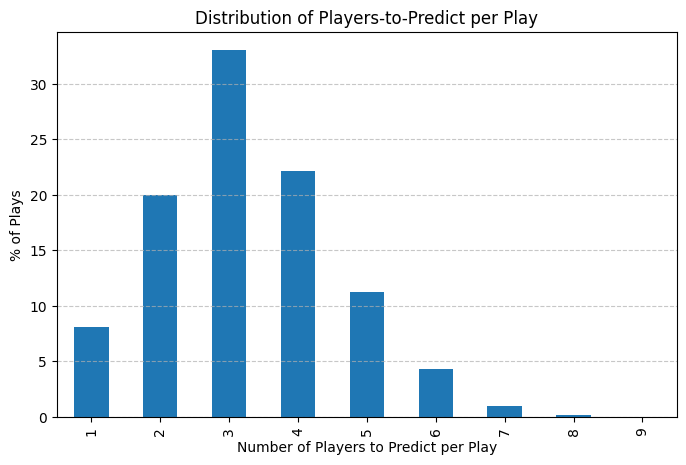

In [ ]:
# Compute number of predicted players per play
ret = (
    input_df[input_df["player_to_predict"]]
    .groupby(["game_id", "play_id"])["nfl_id"]
    .nunique()
    .reset_index(name="num_players_to_predict")
)
print(ret.shape)

# Count occurrences of each number of predicted players
counts = ret["num_players_to_predict"].value_counts().sort_index()

# Plot
plt.figure(figsize=(8,5))
(counts / counts.sum() * 100).plot(kind='bar')
plt.ylabel("% of Plays")
plt.xlabel("Number of Players to Predict per Play")
plt.title("Distribution of Players-to-Predict per Play")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

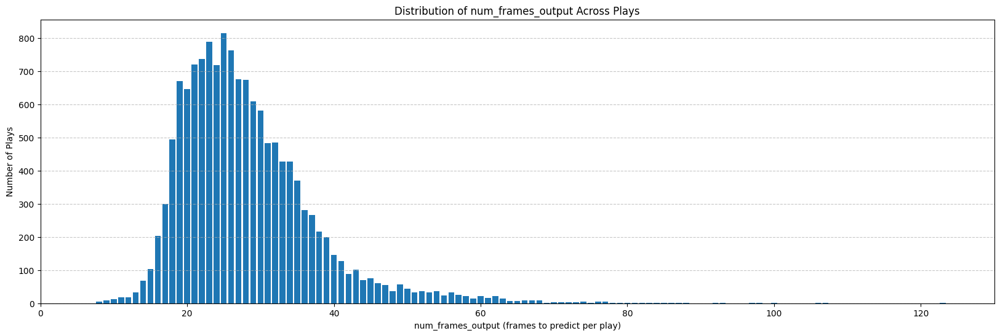

In [ ]:
# Group by play to get the num_frames_output value
frames_per_play = (
    input_df.groupby(["game_id", "play_id"])["frame_id"]
    .max()
    .reset_index(name="num_frames_output")
)

# Count occurrences
counts = frames_per_play["num_frames_output"].value_counts().sort_index()

# Plot
plt.figure(figsize=(20,6))
plt.bar(counts.index, counts.values)
plt.xlim(0, 130)
plt.xlabel("num_frames_output (frames to predict per play)")
plt.ylabel("Number of Plays")
plt.title("Distribution of num_frames_output Across Plays")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

---
# 5. Play Features Computation

## 5.1 Individual Objects features

### 5.1.1 Ball Travel Features

In [ ]:
def get_ball_stats(prepass_play_df, postpass_play_df):

    frame_rate = 10

    passer = prepass_play_df[prepass_play_df["player_role"] == "Passer"]["nfl_id"].unique()[0]

    scrimmage = prepass_play_df["absolute_yardline_number"].iloc[0]
    thrown_at_x = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == passer)]["x"].values[0]
    thrown_at_y = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == passer)]["y"].values[0]
    landed_at_x = prepass_play_df["ball_land_x"].iloc[0]
    landed_at_y = prepass_play_df["ball_land_y"].iloc[0]

    dx, dy = landed_at_x - thrown_at_x, landed_at_y - thrown_at_y
    dist = np.sqrt(dx**2 + dy**2)
    dir = ((90 - np.degrees(np.arctan2(dy, dx)) + 180) % 360) - 180

    if landed_at_y < 0:
        side_dist =  landed_at_y  # out of bounds bottom
    elif landed_at_y > 53.3:
        side_dist = 53.3 - landed_at_y  # out of bounds top
    else:
        side_dist =  min(landed_at_y, 53.3 - landed_at_y)

    end_dist = 120 - landed_at_x  # moving toward right endzone

    ball_stats = []
    ball_stats.append({

        "game_id": prepass_play_df["game_id"].iloc[0],
        "play_id": prepass_play_df["play_id"].iloc[0],

        "ball_throwing_time": prepass_play_df["frame_id"].max() / frame_rate,
        "ball_air_time": prepass_play_df["num_frames_output"].values[0] / frame_rate,

        "scrimmage": scrimmage,
        "ball_at_throw_x": thrown_at_x,
        "ball_at_throw_y": thrown_at_y,

        "ball_at_landing_x": landed_at_x,
        "ball_at_landing_y": landed_at_y,

        "ball_travel_distance": dist,
        "ball_travel_x": dx,
        "ball_travel_y": dy,
        "ball_travel_dir": dir,

        "ball_sideline_distance": side_dist,
        "ball_goalline_distance": end_dist - 10,
        "ball_endzone_distance": end_dist
    })

    return ball_stats

### 5.1.2 Targeted Receiver Features

In [ ]:
def get_target_stats(prepass_play_df, postpass_play_df):

    passer = prepass_play_df[prepass_play_df["player_role"] == "Passer"]["nfl_id"].unique()[0]

    landed_at_x = prepass_play_df["ball_land_x"].iloc[0]
    landed_at_y = prepass_play_df["ball_land_y"].iloc[0]

    targeted_receiver = prepass_play_df[prepass_play_df["player_role"] == "Targeted Receiver"]["nfl_id"].unique()[0]

    target_at_throw_x = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == targeted_receiver)]["x"].values[0]
    target_at_throw_y = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == targeted_receiver)]["y"].values[0]
    target_at_landing_x = postpass_play_df[(postpass_play_df["frame_id"] == postpass_play_df["frame_id"].max()) & (postpass_play_df["nfl_id"] == targeted_receiver)]["x"].values[0]
    target_at_landing_y = postpass_play_df[(postpass_play_df["frame_id"] == postpass_play_df["frame_id"].max()) & (postpass_play_df["nfl_id"] == targeted_receiver)]["y"].values[0]

    erb_dx, erb_dy = landed_at_x - target_at_throw_x ,  landed_at_y - target_at_throw_y
    expected_path_dist = np.sqrt(erb_dx**2 + erb_dy**2)
    erb_dir = ((90 - np.degrees(np.arctan2(erb_dy, erb_dx)) + 180) % 360) - 180

    rrb_dx, rrb_dy = target_at_landing_x - target_at_throw_x, target_at_landing_y - target_at_throw_y
    real_path_dist = np.sqrt(rrb_dx**2 + rrb_dy**2)
    rrb_dir = ((90 - np.degrees(np.arctan2(rrb_dy, rrb_dx)) + 180) % 360) - 180

    rb_dx, rb_dy = landed_at_x - target_at_landing_x, landed_at_y - target_at_landing_y
    catch_dist = np.sqrt(rb_dx**2 + rb_dy**2)
    rb_dir = ((90 - np.degrees(np.arctan2(rb_dy, rb_dx)) + 180) % 360) - 180

    target_stats = []
    target_stats.append({

        "game_id": prepass_play_df["game_id"].iloc[0],
        "play_id": prepass_play_df["play_id"].iloc[0],
        "nfl_id": targeted_receiver,

        "player_at_throw_x": target_at_throw_x,
        "player_at_throw_y": target_at_throw_y,

        "player_at_landing_x": target_at_landing_x,
        "player_at_landing_y": target_at_landing_y,

        "expected_path_distance": expected_path_dist,
        "expected_path_dist_x" : erb_dx,
        "expected_path_dist_y" : erb_dy,
        "expected_path_dir": erb_dir,

        "real_path_distance": real_path_dist,
        "real_path_dist_x" : rrb_dx,
        "real_path_dist_y" : rrb_dy,
        "real_path_dir": rrb_dir,

        "catch_distance": catch_dist,
        "catch_dist_x" : rb_dx,
        "catch_dist_y" : rb_dy,
        "catch_dir": rb_dir,

        # TO BE ADDED: First order and second order values and lags

    })

    return target_stats

### 5.1.3 Predicted Defenders Features

In [ ]:
def get_predicted_defenders_stats(prepass_play_df, postpass_play_df):

    landed_at_x = prepass_play_df["ball_land_x"].iloc[0]
    landed_at_y = prepass_play_df["ball_land_y"].iloc[0]

    targeted_receiver = prepass_play_df[prepass_play_df["player_role"] == "Targeted Receiver"]["nfl_id"].unique()[0]

    target_at_throw_x = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == targeted_receiver)]["x"].values[0]
    target_at_throw_y = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == targeted_receiver)]["y"].values[0]
    target_at_landing_x = postpass_play_df[(postpass_play_df["frame_id"] == postpass_play_df["frame_id"].max()) & (postpass_play_df["nfl_id"] == targeted_receiver)]["x"].values[0]
    target_at_landing_y = postpass_play_df[(postpass_play_df["frame_id"] == postpass_play_df["frame_id"].max()) & (postpass_play_df["nfl_id"] == targeted_receiver)]["y"].values[0]

    defenders = prepass_play_df[(prepass_play_df["player_role"] == "Defensive Coverage") & (prepass_play_df["player_to_predict"] == True)]["nfl_id"].unique()
    defenders_stats = []

    if len(defenders) > 0:
        for defender in defenders:
            defender_at_throw_x = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == defender)]["x"].values[0]
            defender_at_throw_y = prepass_play_df[(prepass_play_df["frame_id"] == prepass_play_df["frame_id"].max()) & (prepass_play_df["nfl_id"] == defender)]["y"].values[0]
            defender_at_landing_x = postpass_play_df[(postpass_play_df["frame_id"] == postpass_play_df["frame_id"].max()) & (postpass_play_df["nfl_id"] == defender)]["x"].values[0]
            defender_at_landing_y = postpass_play_df[(postpass_play_df["frame_id"] == postpass_play_df["frame_id"].max()) & (postpass_play_df["nfl_id"] == defender)]["y"].values[0]

            edb_dx, edb_dy = landed_at_x - defender_at_throw_x ,  landed_at_y - defender_at_throw_y
            expected_path_dist = np.sqrt(edb_dx**2 + edb_dy**2)
            edb_dir = ((90 - np.degrees(np.arctan2(edb_dy, edb_dx)) + 180) % 360) - 180

            rdb_dx, rdb_dy = defender_at_landing_x - defender_at_throw_x, defender_at_landing_y - defender_at_throw_y
            real_path_dist = np.sqrt(rdb_dx**2 + rdb_dy**2)
            rdb_dir = ((90 - np.degrees(np.arctan2(rdb_dy, rdb_dx)) + 180) % 360) - 180

            db_dx, db_dy = landed_at_x - defender_at_landing_x, landed_at_y - defender_at_landing_y
            catch_dist = np.sqrt(db_dx**2 + db_dy**2)
            db_dir = ((90 - np.degrees(np.arctan2(db_dy, db_dx)) + 180) % 360) - 180

            drt_dx, drt_dy = target_at_throw_x - defender_at_throw_x,  target_at_throw_y - defender_at_throw_y
            prepass_cover_dist = np.sqrt(drt_dx**2 + drt_dy**2)
            drt_dir = ((90 - np.degrees(np.arctan2(drt_dy, drt_dx)) + 180) % 360) - 180

            drc_dx, drc_dy =  target_at_landing_x - defender_at_landing_x, target_at_landing_y - defender_at_landing_y
            postpass_cover_dist = np.sqrt(drc_dx**2 + drc_dy**2)
            drc_dir = ((90 - np.degrees(np.arctan2(drc_dy, drc_dx)) + 180) % 360) - 180

            defenders_stats.append({

                "game_id": prepass_play_df["game_id"].iloc[0],
                "play_id": prepass_play_df["play_id"].iloc[0],
                "nfl_id": defender,

                "player_at_throw_x": defender_at_throw_x,
                "player_at_throw_y": defender_at_throw_y,

                "player_at_landing_x": defender_at_landing_x,
                "player_at_landing_y": defender_at_landing_y,

                "expected_path_distance": expected_path_dist,
                "expected_path_dist_x" : edb_dx,
                "expected_path_dist_y" : edb_dy,
                "expected_path_dir": edb_dir,

                "real_path_distance": real_path_dist,
                "real_path_dist_x" : rdb_dx,
                "real_path_dist_y" : rdb_dy,
                "real_path_dir": rdb_dir,

                "catch_distance": catch_dist,
                "catch_dist_x" : db_dx,
                "catch_dist_y" : db_dy,
                "catch_dir": db_dir,

                "defender_target_at_throw_distance": prepass_cover_dist,
                "defender_target_at_throw_dist_x": drt_dx,
                "defender_target_at_throw_dist_y": drt_dy,
                "defender_target_at_throw_dir": drt_dir,

                "defender_target_at_landing_distance": postpass_cover_dist,
                "defender_target_at_landing_dist_x": drc_dx,
                "defender_target_at_landing_dist_y": drc_dy,
                "defender_target_at_landing_dir": drc_dir

                # TO BE ADDED: First order and second order quantities and lags

            })
    return defenders_stats

    """
    else:

        keys = [
            "nfl_id",
            "defender_at_throw_x", "defender_at_throw_y",
            "defender_at_landing_x", "defender_at_landing_y",
            "expected_path_distance", "expected_path_dist_x", "expected_path_dist_y", "expected_path_dir",
            "real_path_distance", "real_path_dist_x", "real_path_dist_y", "real_path_dir",
            "defender_catch_distance", "defender_catch_dist_x", "defender_catch_dist_y", "defender_catch_dir",
            "defender_target_distance_at_throw", "defender_target_dist_at_throw_x", "defender_target_dist_at_throw_y", "defender_target_dir_at_throw",
            "defender_target_distance_at_landing", "defender_target_dist_at_landing_x", "defender_target_dist_at_landing_y", "defender_target_dir_at_landing"
        ]

        return pd.Series({k: np.nan for k in keys})
    """

## 5.2 Team Features

### 5.2.1 Offense Features

In [ ]:
# --- Offensive Play Features ---
def get_singleback_prob(first_frame, scrimmage, passer):

    # Identify QB
    qb_x = float(first_frame.loc[first_frame['nfl_id'] == passer, 'x'].iloc[0])
    # Estimate line of scrimmage (LOS) as minimum x of offensive players
    qb_depth = abs(qb_x - scrimmage)

    singleback_qb_prob = 1 / (1 + np.exp(3.5 * (qb_depth - 2)))

    # Identify Ball Carrier
    offense_players = first_frame[(first_frame["player_side"] == "Offense") & (first_frame["nfl_id"] != passer)]
    # Compute absolute distance from the line of scrimmage
    bc_depth = (offense_players['x'] - scrimmage).abs().max()
    # Smooth logistic probability for Ball Carrier
    d = np.asarray(bc_depth, dtype=float)
    a= 1.46482
    b= 3.7
    x = a * (d - b)
    singleback_bc_prob = 1.0 / (1.0 + np.exp(-x))

    singleback_prob = .8 * singleback_qb_prob  + .2 * singleback_bc_prob

    return float(singleback_prob), float(bc_depth)

def get_shotgun_prob(first_frame, scrimmage, passer):

    # Identify QB
    qb_x = float(first_frame.loc[first_frame['nfl_id'] == passer, 'x'].iloc[0])
    # Estimate line of scrimmage (LOS) as minimum x of offensive players
    qb_depth = abs(qb_x - scrimmage)

    # Smooth logistic probability
    shotgun_prob = 1.0 / (1.0 + np.exp(-1.8 * (qb_depth - 3.5)))

    return float(shotgun_prob), float(qb_depth)

def get_play_action_prob(play_df, scrimmage, passer):

    # Track QB trajectory for early frames
    qb_track = play_df[(play_df["nfl_id"] == passer) & (play_df["frame_id"] <= 20)]
    qb_x = qb_track["x"].values
    qb_y = qb_track["y"].values

    # Identify offensive players excluding the passer
    first_frame = play_df[play_df["frame_id"] == play_df["frame_id"].min()]
    offense_players = first_frame[
        (first_frame["player_side"] == "Offense") & (first_frame["nfl_id"] != passer)
    ]

    # Players 4+ yards behind the line of scrimmage (potential ball carriers)
    mask = (scrimmage - offense_players['x']) >= 4
    backfield_players = offense_players.loc[mask, "nfl_id"].values

    pa_scores = []

    for bc_id in backfield_players:
        bc_track = play_df[(play_df["nfl_id"] == bc_id) & (play_df["frame_id"] <= 20)]
        bc_x = bc_track["x"].values
        bc_y = bc_track["y"].values

        rel_x = qb_x - bc_x
        rel_y = qb_y - bc_y
        rel_dist = np.sqrt(rel_x**2 + rel_y**2)

        min_dist = rel_dist.min()
        pa_scores.append(1 / (1 + np.exp(1.79 * (min_dist - 2.2))))

    # Max probability from all potential carriers (if any)
    pa_prob = np.max(pa_scores) if len(pa_scores) > 0 else 0.0
    return pa_prob

def get_motion_existence(first_frame):

    offense_players = first_frame[first_frame["player_side"] == "Offense"]

    if offense_players[offense_players["s"] > 1]["nfl_id"].nunique() == 0:
        return False
    else:
        return True

def get_backfield_emptiness(first_frame, scrimmage, passer):

    offense_players = first_frame[first_frame["player_side"] == "Offense"]

    # Identify QB
    qb_x = float(offense_players.loc[offense_players['nfl_id'] == passer, 'x'].iloc[0])

    # Estimate line of scrimmage (LOS) as minimum x of offensive players
    farthest_idx = (offense_players['x'] - scrimmage).abs().idxmax()
    farthest_player_id = offense_players.loc[farthest_idx, 'nfl_id']

    qb_is_farthest = (farthest_player_id == passer)
    near_los = (offense_players[offense_players["nfl_id"] != passer]['x'] - scrimmage).abs().max() <= 3

    # Empty backfield = QB farthest + everyone else near LOS
    return bool(qb_is_farthest and near_los)

In [ ]:
def get_offense_stats(prepass_play_df, postpass_play_df):

    first_frame = prepass_play_df[prepass_play_df['frame_id'] == 1]
    scrimmage = prepass_play_df["absolute_yardline_number"].iloc[0]
    passer = prepass_play_df[prepass_play_df["player_role"] == "Passer"]["nfl_id"].unique()[0]

    sb_prob, bc_depth = get_singleback_prob(first_frame, scrimmage, passer)
    sg_prob, qb_depth = get_shotgun_prob(first_frame, scrimmage, passer)
    pa_prob = get_play_action_prob(prepass_play_df, scrimmage, passer)

    mtn_player = get_motion_existence(first_frame)
    empty_bf = get_backfield_emptiness(first_frame, scrimmage, passer)
    num_receivers = prepass_play_df[(prepass_play_df["player_role"] == "Other Route Runner") | (prepass_play_df["player_role"] == "Targeted Receiver")]["nfl_id"].nunique()

    offense_stats = []
    offense_stats.append({

        "game_id": prepass_play_df["game_id"].iloc[0],
        "play_id": prepass_play_df["play_id"].iloc[0],

        "singleback_form_prob": sb_prob,
        "shotgun_form_prob": sg_prob,

        "qb_depth": qb_depth,
        "motion_player": mtn_player,
        "empty_backfield": empty_bf,

        "play_action_prob": pa_prob,

        "num_receiving_players": num_receivers
    })

    return offense_stats

### 5.2.2 Defense Features

In [ ]:
def get_coverage_stats(play_df):

    route_runners = play_df[play_df["player_role"].isin(["Targeted Receiver", "Other Route Runner"])]
    defenders = play_df[play_df["player_role"] == "Defensive Coverage"]

    # Unique identifiers
    frames = sorted(play_df["frame_id"].unique())
    rr_ids = sorted(route_runners["nfl_id"].unique())
    def_ids = sorted(defenders["nfl_id"].unique())

    # Initialize 3D matrix (frames × defenders × receivers)
    D = np.full((len(frames), len(def_ids), len(rr_ids)), np.nan)

    # Fill the matrix
    for i, f in enumerate(frames):
        rr_frame = route_runners[route_runners["frame_id"] == f]
        def_frame = defenders[defenders["frame_id"] == f]

        # Extract positions as arrays
        rr_pos = rr_frame.set_index("nfl_id")[["x", "y"]].reindex(rr_ids).values
        def_pos = def_frame.set_index("nfl_id")[["x", "y"]].reindex(def_ids).values

        # Compute pairwise distances for this frame (broadcasting)
        # shape: (n_defenders, n_receivers)
        dist_matrix = np.sqrt(
            np.sum((def_pos[:, None, :] - rr_pos[None, :, :])**2, axis=2)
        )

        D[i, :, :] = dist_matrix

    records = []
    n_frames, n_defenders, n_receivers = D.shape

    for i in range(n_frames):
        for j in range(n_receivers):
            dist_vec = D[i, :, j]
            if np.all(np.isnan(dist_vec)):
                # No defenders present
                closest = [np.nan, np.nan]
                closest_dist = [np.nan, np.nan]
            else:
                # indices of the 2 smallest distances
                idx_sorted = np.argsort(dist_vec)[:2]
                closest = [def_ids[idx_sorted[0]], def_ids[idx_sorted[1]]]
                closest_dist = [dist_vec[idx_sorted[0]], dist_vec[idx_sorted[1]]]

            records.append({
                "nfl_id": rr_ids[j],
                "frame_id": frames[i],
                "closest_def_1": closest[0],
                "closest_def_2": closest[1],
                "dist_1": closest_dist[0],
                "dist_2": closest_dist[1]
            })

    coverage_df = pd.DataFrame(records)#.set_index("nfl_id")
    return coverage_df

def get_man_coverage_prob(coverage_df):

    result_records = []
    for rr in coverage_df['nfl_id'].unique():
        rr_df = coverage_df[coverage_df['nfl_id'] == rr]
        defenders = pd.unique(rr_df[['closest_def_1', 'closest_def_2']].values.ravel())

        for d in defenders:
            # check if defender is always in top 2
            in_top2 = rr_df.apply(lambda row: d in [row['closest_def_1'], row['closest_def_2']], axis=1)
            always_closest = in_top2.all()

            # compute distances only when defender is in top 2
            relevant_rows = rr_df[in_top2]
            dist_min = relevant_rows.apply(lambda row: row['dist_1'] if row['closest_def_1']==d else row['dist_2'], axis=1)

            if always_closest or dist_min.mean() <= 6:
                result_records.append({
                    'nfl_id': rr,
                    'defender_nfl_id': d,
                    'is_consistently_closest': always_closest,
                    'avg_min_dist': dist_min.mean(),
                })

    result_df = pd.DataFrame(result_records).sort_values(["avg_min_dist"]).reset_index(drop= True)
    print(result_df)

    man_defenders = []
    for rr in result_df['nfl_id'].unique():

        rr_df = result_df[result_df['nfl_id'] == rr]
        print(rr_df)
        for dp in rr_df["defender_nfl_id"].unique():
            print(dp)
            dp_df = rr_df[rr_df["defender_nfl_id"] == dp].sort_values(["defender_nfl_id","avg_min_dist"])
            if int(dp) not in man_defenders:
                man_defenders.append(int(dp))
                break
        print(man_defenders)

    mc_percentage = len(man_defenders) / len(coverage_df['nfl_id'].unique())

    return 0.04 + (0.995 - 0.04) / (1 + np.exp(-11 * (mc_percentage - 0.55)))

In [ ]:
def get_man_coverage_prob(coverage_df):
    """
    Estimate man coverage probability from defender–receiver proximity data.

    Input:
        coverage_df: DataFrame with columns:
            nfl_id, closest_def_1, closest_def_2, dist_1, dist_2

    Output:
        result_df: DataFrame with per-pair metrics
        mc_prob: float, estimated probability of man coverage
    """

    result_records = []

    # --- Step 1: Build receiver-defender pairs ---
    for rr in coverage_df['nfl_id'].unique():
        rr_df = coverage_df[coverage_df['nfl_id'] == rr]
        defenders = pd.unique(rr_df[['closest_def_1', 'closest_def_2']].values.ravel())

        for d in defenders:
            in_top2 = rr_df.apply(lambda row: d in [row['closest_def_1'], row['closest_def_2']], axis=1)
            always_closest = in_top2.all()

            relevant_rows = rr_df[in_top2]
            dist_min = relevant_rows.apply(
                lambda row: row['dist_1'] if row['closest_def_1'] == d else row['dist_2'], axis=1
            )

            if always_closest or dist_min.mean() <= 6:
                result_records.append({
                    'nfl_id': rr,
                    'defender_nfl_id': d,
                    'is_consistently_closest': always_closest,
                    'avg_min_dist': dist_min.mean(),
                })

    result_df = pd.DataFrame(result_records)
    if result_df.empty:
        return result_df, 0.0

    # --- Step 2: Shadowing indicator ---
    result_df['is_shadowing'] = (
        result_df['is_consistently_closest'] &
        (result_df['avg_min_dist'] < 10)
    )

    # --- Step 3: Distinctness (how exclusive defenders are) ---
    defender_counts = result_df['defender_nfl_id'].value_counts()
    result_df['distinctness'] = result_df['defender_nfl_id'].map(
        lambda d: 1.0 / defender_counts.get(d, 1)
    )

    # --- Step 4: Soft closeness (smooth distance weighting) ---
    tau = 6.0
    result_df['soft_closeness'] = np.exp(-result_df['avg_min_dist'] / tau)

    # --- Step 5: Shadow score (combined strength) ---
    result_df['shadow_score'] = (
        result_df['distinctness'] * result_df['soft_closeness']
    )

    # --- Step 6: Aggregate to get man coverage percentage ---
    # Take each receiver’s top shadowing defender
    receiver_shadow_strength = (
        result_df.groupby('nfl_id')['shadow_score'].max().mean()
    )

    # --- Step 7: Map percentage of shadowed receivers to man coverage probability ---
    def mc_prob_from_shadowed(p_shadowed):
        a, b, k, x0 = 0.04, 0.995, 11.0, 0.55
        p = np.clip(p_shadowed, 0.0, 1.0)
        return a + (b - a) / (1 + np.exp(-k * (p - x0)))

    mc_prob = mc_prob_from_shadowed(receiver_shadow_strength)

    return float(mc_prob)

In [ ]:
def get_defense_stats(prepass_play_df, postpass_play_df):

    first_frame = prepass_play_df[prepass_play_df['frame_id'] == 1]
    scrimmage = prepass_play_df["absolute_yardline_number"].iloc[0]
    passer = prepass_play_df[prepass_play_df["player_role"] == "Passer"]["nfl_id"].unique()[0]

    cov_df = get_coverage_stats(prepass_play_df)
    mc_prob = get_man_coverage_prob(cov_df)

    num_defenders = prepass_play_df[prepass_play_df["player_role"] == "Defensive Coverage"]["nfl_id"].nunique()

    defense_stats = []
    defense_stats.append({

        "game_id": prepass_play_df["game_id"].iloc[0],
        "play_id": prepass_play_df["play_id"].iloc[0],

        "num_defensive_players": num_defenders
    })

    return defense_stats

## 5.C Complete Prepass Features Computation

In [ ]:
def get_play_stats(game_id, play_id, input_df= input_df, output_df= output_df):

    prepass_play_df, postpass_play_df = get_play(game_id, play_id)

    ball_stats = get_ball_stats(prepass_play_df, postpass_play_df)
    target_stats = get_target_stats(prepass_play_df, postpass_play_df)
    predicted_defenders_stats = get_predicted_defenders_stats(prepass_play_df, postpass_play_df)
    offense_stats = get_offense_stats(prepass_play_df, postpass_play_df)
    defense_stats = get_defense_stats(prepass_play_df, postpass_play_df)

    return  pd.DataFrame(ball_stats).set_index(['game_id', 'play_id']), \
            pd.DataFrame(target_stats).set_index(['game_id', 'play_id', 'nfl_id']), \
            pd.DataFrame(predicted_defenders_stats).set_index(['game_id', 'play_id', 'nfl_id']) if predicted_defenders_stats != [] else pd.DataFrame(predicted_defenders_stats), \
            pd.DataFrame(offense_stats).set_index(['game_id', 'play_id']), \
            pd.DataFrame(defense_stats).set_index(['game_id', 'play_id'])

In [ ]:
ball_stats_df, target_stats_df, predicted_defenders_stats_df, offense_stats_df, defense_stats_df = get_play_stats(2023101900, 78)

In [ ]:
ball_stats_df

,,ball_throwing_time,ball_air_time,scrimmage,ball_at_throw_x,ball_at_throw_y,ball_at_landing_x,ball_at_landing_y,ball_travel_distance,ball_travel_x,ball_travel_y,ball_travel_dir,ball_sideline_distance,ball_goalline_distance,ball_endzone_distance
game_id,play_id,,,,,,,,,,,,,,
2023101900,78,2.2,1.2,35,27.42,29.87,44.080002,47.619999,24.343749,16.660002,17.749999,43.185662,5.680001,65.919998,75.919998


In [ ]:
target_stats_df

,,,player_at_throw_x,player_at_throw_y,player_at_landing_x,player_at_landing_y,expected_path_distance,expected_path_dist_x,expected_path_dist_y,expected_path_dir,real_path_distance,real_path_dist_x,real_path_dist_y,real_path_dir,catch_distance,catch_dist_x,catch_dist_y,catch_dir
game_id,play_id,nfl_id,,,,,,,,,,,,,,,,
2023101900,78,44835,41.94,39.82,44.45,47.3,8.088238,2.140002,7.799999,15.342114,7.889899,2.51,7.48,18.54977,0.489181,-0.369998,0.319999,-49.144578


In [ ]:
predicted_defenders_stats_df

player_at_throw_x  player_at_throw_y  \
game_id    play_id nfl_id                                         
2023101900 78      44851               45.02              39.46   
                   44823               41.85              47.72   

                           player_at_landing_x  player_at_landing_y  \
game_id    play_id nfl_id                                             
2023101900 78      44851                 43.42                46.10   
                   44823                 50.80                50.53   

                           expected_path_distance  expected_path_dist_x  \
game_id    play_id nfl_id                                                 
2023101900 78      44851                 8.213962             -0.939998   
                   44823                 2.232243              2.230002   

                           expected_path_dist_y  expected_path_dir  \
game_id    play_id nfl_id                                            
2023101900 78      44851               8.159999          -6.571272   
                   44823              -0.100001          92.567623   

                           real_path_distance  real_path_dist_x  \
game_id    play_id nfl_id                                         
2023101900 78      44851             6.830051             -1.60   
                   44823             9.380757              8.95   

                           real_path_dist_y  real_path_dir  catch_distance  \
game_id    play_id nfl_id                                                    
2023101900 78      44851               6.64     -13.547939        1.657106   
                   44823               2.81      72.569460        7.323010   

                           catch_dist_x  catch_dist_y   catch_dir  \
game_id    play_id nfl_id                                           
2023101900 78      44851       0.660002      1.519999   23.471066   
                   44823      -6.719998     -2.910001 -113.414348   

                           defender_target_at_throw_distance  \
game_id    play_id nfl_id                                      
2023101900 78      44851                            3.100968   
                   44823                            7.900513   

                           defender_target_at_throw_dist_x  \
game_id    play_id nfl_id                                    
2023101900 78      44851                             -3.08   
                   44823                              0.09   

                           defender_target_at_throw_dist_y  \
game_id    play_id nfl_id                                    
2023101900 78      44851                              0.36   
                   44823                             -7.90   

                           defender_target_at_throw_dir  \
game_id    play_id nfl_id                                 
2023101900 78      44851                     -83.333340   
                   44823                     179.347292   

                           defender_target_at_landing_distance  \
game_id    play_id nfl_id                                        
2023101900 78      44851                              1.581423   
                   44823                              7.124282   

                           defender_target_at_landing_dist_x  \
game_id    play_id nfl_id                                      
2023101900 78      44851                                1.03   
                   44823                               -6.35   

                           defender_target_at_landing_dist_y  \
game_id    play_id nfl_id                                      
2023101900 78      44851                                1.20   
                   44823                               -3.23   

                           defender_target_at_landing_dir  
game_id    play_id nfl_id                                  
2023101900 78      44851                        40.640592  
                   44823                      -116.960684

In [ ]:
offense_stats_df

,,singleback_form_prob,shotgun_form_prob,qb_depth,motion_player,empty_backfield,play_action_prob,num_receiving_players
game_id,play_id,,,,,,,
2023101900,78,0.179754,0.941144,5.04,False,False,0.457631,5


In [ ]:
defense_stats_df

,,num_defensive_players
game_id,play_id,
2023101900,78,7


---
# 6. Play Features per Player

## 6.1 Predicted Players Dataframe

In [ ]:
def get_predicted_players_df(game_id, play_id):

    per_play_cols = ['player_role',
                     'player_at_throw_x', 'player_at_throw_y', 'player_at_landing_x', 'player_at_landing_y',
                     'expected_path_distance', 'expected_path_dist_x','expected_path_dist_y', 'expected_path_dir',
                     'real_path_distance', 'real_path_dist_x', 'real_path_dist_y', 'real_path_dir',
                     'catch_distance', 'catch_dist_x', 'catch_dist_y', 'catch_dir',
                     'defender_target_at_throw_distance', 'defender_target_at_throw_dist_x', 'defender_target_at_throw_dist_y', 'defender_target_at_throw_dir',
                     'defender_target_at_landing_distance', 'defender_target_at_landing_dist_x', 'defender_target_at_landing_dist_y', 'defender_target_at_landing_dir']

    target_cols = ['player_at_throw_x', 'player_at_throw_y', 'player_at_landing_x',
       'player_at_landing_y', 'expected_path_distance', 'expected_path_dist_x',
       'expected_path_dist_y', 'expected_path_dir', 'real_path_distance',
       'real_path_dist_x', 'real_path_dist_y', 'real_path_dir',
       'catch_distance', 'catch_dist_x', 'catch_dist_y', 'catch_dir']

    def_cols = ['player_at_throw_x', 'player_at_throw_y', 'player_at_landing_x',
       'player_at_landing_y', 'expected_path_distance', 'expected_path_dist_x',
       'expected_path_dist_y', 'expected_path_dir', 'real_path_distance',
       'real_path_dist_x', 'real_path_dist_y', 'real_path_dir',
       'catch_distance', 'catch_dist_x', 'catch_dist_y', 'catch_dir',
       'defender_target_at_throw_distance', 'defender_target_at_throw_dist_x',
       'defender_target_at_throw_dist_y', 'defender_target_at_throw_dir',
       'defender_target_at_landing_distance',
       'defender_target_at_landing_dist_x',
       'defender_target_at_landing_dist_y', 'defender_target_at_landing_dir']

    _, target_stats_df, defenders_stats_df, _, _ = get_play_stats(game_id, play_id)

    if target_stats_df.empty:
        print(f"No targeted receiver on play {play_id} \n")
        return pd.DataFrame(columns=per_play_cols)

    if defenders_stats_df.empty:
        print(f"No defenders tracked on play {play_id} \n")
        defenders_stats_df = pd.DataFrame(columns=def_cols)

    target_stats_df['player_role'] = 'Targeted Receiver'
    defenders_stats_df['player_role'] = 'Defensive Coverage'

    # --- Align columns ---
    target_stats_df = target_stats_df.reindex(columns= per_play_cols, fill_value= np.nan)
    defenders_stats_df = defenders_stats_df.reindex(columns= per_play_cols, fill_value= np.nan)

    # --- Merge ---
    combined_df = pd.concat([target_stats_df, defenders_stats_df], ignore_index= False)
    combined_df.index.names = ["game_id", "play_id", "nfl_id"]

    return combined_df

In [ ]:
predicted_players_df = get_predicted_players_df(2023101900, 78)
predicted_players_df

player_role  player_at_throw_x  \
game_id    play_id nfl_id                                          
2023101900 78      44835    Targeted Receiver              41.94   
                   44851   Defensive Coverage              45.02   
                   44823   Defensive Coverage              41.85   

                           player_at_throw_y  player_at_landing_x  \
game_id    play_id nfl_id                                           
2023101900 78      44835               39.82                44.45   
                   44851               39.46                43.42   
                   44823               47.72                50.80   

                           player_at_landing_y  expected_path_distance  \
game_id    play_id nfl_id                                                
2023101900 78      44835                 47.30                8.088238   
                   44851                 46.10                8.213962   
                   44823                 50.53                2.232243   

                           expected_path_dist_x  expected_path_dist_y  \
game_id    play_id nfl_id                                               
2023101900 78      44835               2.140002              7.799999   
                   44851              -0.939998              8.159999   
                   44823               2.230002             -0.100001   

                           expected_path_dir  real_path_distance  \
game_id    play_id nfl_id                                          
2023101900 78      44835           15.342114            7.889899   
                   44851           -6.571272            6.830051   
                   44823           92.567623            9.380757   

                           real_path_dist_x  real_path_dist_y  real_path_dir  \
game_id    play_id nfl_id                                                      
2023101900 78      44835               2.51              7.48      18.549770   
                   44851              -1.60              6.64     -13.547939   
                   44823               8.95              2.81      72.569460   

                           catch_distance  catch_dist_x  catch_dist_y  \
game_id    play_id nfl_id                                               
2023101900 78      44835         0.489181     -0.369998      0.319999   
                   44851         1.657106      0.660002      1.519999   
                   44823         7.323010     -6.719998     -2.910001   

                            catch_dir  defender_target_at_throw_distance  \
game_id    play_id nfl_id                                                  
2023101900 78      44835   -49.144578                                NaN   
                   44851    23.471066                           3.100968   
                   44823  -113.414348                           7.900513   

                           defender_target_at_throw_dist_x  \
game_id    play_id nfl_id                                    
2023101900 78      44835                               NaN   
                   44851                             -3.08   
                   44823                              0.09   

                           defender_target_at_throw_dist_y  \
game_id    play_id nfl_id                                    
2023101900 78      44835                               NaN   
                   44851                              0.36   
                   44823                             -7.90   

                           defender_target_at_throw_dir  \
game_id    play_id nfl_id                                 
2023101900 78      44835                            NaN   
                   44851                     -83.333340   
                   44823                     179.347292   

                           defender_target_at_landing_distance  \
game_id    play_id nfl_id                                        
2023101900 78      44835                                   NaN   
     

## 6.2 Per Play Features

---
# 7. Features Organization

## 7.1 Features Computation

### 7.1.1 Node Features

In [ ]:
def preprocess_play(game_id, play_id):
    play_df, _ = get_play(game_id, play_id)

    # Select only relevant columns
    gnn_cols = ['game_id', 'play_id', 'frame_id', 'nfl_id',
                'player_role', 'x', 'y', 's', 'a', 'dir', 'o']

    play_df = play_df[gnn_cols]

    # One-hot encode roles once
    play_df = pd.get_dummies(play_df, columns=['player_role'])
    play_df.columns = [col.replace(" ", "_") for col in play_df.columns]

    # Merge physical attributes once
    physical_df = preprocessed_players_df.reset_index()
    play_df = play_df.merge(physical_df, on="nfl_id", how="left")

    # Drop useless columns once
    play_df = play_df.drop(['game_id', 'play_id'], axis=1)

    # Convert once to float
    play_df = play_df.astype(float)

    # Split by frame: dict {frame_id: numpy array}
    frames = {
    fid: df.drop("frame_id", axis=1)
           .to_numpy()
    for fid, df in play_df.groupby("frame_id")
    }

    return frames

In [ ]:
def get_node_features(preprocessed_play_dict, frame_id):
    frames =  preprocessed_play_dict[frame_id]

    node_features = frames[:, 1:]
    node_ids = frames[:, 0].astype(int)

    return node_features, node_ids

In [ ]:
node_features, node_ids = get_node_features(preprocess_play(2023101900, 227), 1)
node_features.shape, node_ids

((14, 40),
 array([56011, 44851, 44823, 53505, 53489, 40017, 47915, 52482, 46095,
        44835, 53707, 53454, 53430, 46116]))

In [ ]:
def pack_play_features(preprocessed_play_dict):
    """
    Converts preprocessed play dict into flattened node features with unique node IDs.

    Args:
        preprocessed_play_dict: dict of {frame_id: frame_data}
        num_players: number of players per frame

    Returns:
        all_node_features: [num_nodes, F_node]
        node_ids: [num_nodes] (t*num_players + n)
        nfl_ids: [num_nodes] original player IDs repeated per frame
    """
    node_features_list = []
    nfl_ids_list = []

    for t, frame_id in enumerate(sorted(preprocessed_play_dict.keys())):
        features, nfl_ids_frame = get_node_features(preprocessed_play_dict, frame_id)  # [num_players_in_frame, F_node], [num_players_in_frame]
        num_players = len(nfl_ids_frame)

        # Pad if fewer than num_players
        if features.shape[0] < num_players:
            pad_feats = np.zeros((num_players - features.shape[0], features.shape[1]))
            features = np.vstack([features, pad_feats])

            pad_ids = np.zeros(num_players - len(nfl_ids_frame), dtype=nfl_ids_frame.dtype)
            nfl_ids_frame = np.hstack([nfl_ids_frame, pad_ids])

        node_features_list.append(features)
        nfl_ids_list.append(nfl_ids_frame)

    # Stack along frames and flatten
    all_node_features = np.vstack(node_features_list)  # [num_frames*num_players, F_node]

    # Node IDs: t*num_players + n
    num_frames = len(node_features_list)
    node_ids = np.arange(num_frames * num_players)

    return all_node_features, node_ids, nfl_ids_frame

In [ ]:
all_node_features, all_node_ids, nfl_ids = pack_play_features(preprocess_play(2023101900, 78))
all_node_features[-2 :], all_node_ids[-10:], nfl_ids

(array([[ 2.74200000e+01,  2.98700000e+01,  9.80000000e-01,
          2.73000000e+00,  2.83150000e+02,  1.07660000e+02,
          0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
          0.00000000e+00,  2.41095140e+01,  1.98120000e+00,
          9.97903214e+01,  2.54232918e+01, -8.40285232e-01,
          1.82343856e+00, -1.17089364e-01, -1.07391787e+00,
         -1.06009077e+00,  2.09920705e+00,  5.00885400e-02,
         -2.07196081e+00,  0.00000000e+00,  1.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          0.00000000e+00],
        [ 4.19400000e+01,  3.98200000e+01,  6.38000000e+00,
          5.67000000e+00,  4.91300000e+01,  1.30000000e-01,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
          1.0

### 7.1.2 Edge Features

In [ ]:
def get_edge_features(node_features, num_frames, num_players, threshold=15, k=3, return_splits=False):
    """
    Compute spatial (KNN per frame) + temporal (same-player across frames) edges
    for a play.

    Args:
        node_features: np.array shape [T, P, F] where:
            positions = [:, :, :2], speed = [:, :, 2], accel = [:, :, 3],
            direction = [:, :, 4], orientations = [:, :, 5]
        threshold: unused here (kept for API compatibility)
        k: number of spatial neighbors per player (does NOT include self)
        return_splits: if True returns (edge_attr, edge_index, n_spatial_edges)

    Returns:
        edge_attr: [E, 7] float32, columns = [dist, dx, dy, speed_diff, accel_diff, dir_diff, ori_diff]
        edge_index: [E, 2] int64, flattened indices in range [0, T*P-1] (dst, src)
        (optional) n_spatial_edges: int number of spatial edges (useful to split arrays)
    """
    positions = node_features[:, :2]   # [T* P, 2]
    speed = node_features[:, 2]        # [T* P]
    accel = node_features[:, 3]        # [T* P]
    direction = node_features[:, 4]    # [T* P]
    orientations = node_features[:, 5] # [T* P]

    spatial_attr_list = []
    spatial_index_list = []

    # --- Spatial edges: compute KNN per frame and offset indices by frame ---
    for t in range(num_frames):
        pos_t = positions[t * num_players : (t + 1) * num_players]                # [P, 2]

        # pairwise distances (P x P)
        diff = pos_t[:, None, :] - pos_t[None, :, :]
        dist_matrix = np.sqrt((diff ** 2).sum(axis=2))
        np.fill_diagonal(dist_matrix, np.inf)

        # k nearest neighbors per node
        knn_idx = np.argpartition(dist_matrix, kth=k, axis=1)[:, :k]  # [P, k]

        # source/target indices in frame-local coords
        i_local = np.repeat(np.arange(num_players), k)        # [P*k]
        j_local = knn_idx.reshape(-1)                         # [P*k]

        # Offset to flattened node indices across frames
        frame_offset = t * num_players
        i_idx = (i_local + frame_offset).astype(np.int64)
        j_idx = (j_local + frame_offset).astype(np.int64)

        xi = pos_t[i_local]
        xj = pos_t[j_local]

        dx = (xj[:, 0] - xi[:, 0]).astype(np.float32)
        dy = (xj[:, 1] - xi[:, 1]).astype(np.float32)
        dist = np.sqrt(dx**2 + dy**2).astype(np.float32)

        # speed/accel/dir/ori diffs computed in frame-local indices
        spd_diff = (speed[j_idx] - speed[i_idx]).astype(np.float32)
        acc_diff = (accel[j_idx] - accel[i_idx]).astype(np.float32)

        dir_i = direction[i_idx]
        dir_j = direction[j_idx]
        dir_diff = (((dir_j - dir_i + 180) % 360) - 180).astype(np.float32)

        ori_i = orientations[i_idx]
        ori_j = orientations[j_idx]
        ori_diff = (((ori_j - ori_i + 180) % 360) - 180).astype(np.float32)

        spatial_attr_list.append(np.stack([dist, dx, dy, spd_diff, acc_diff, dir_diff, ori_diff], axis=1))
        spatial_index_list.append(np.stack([i_idx, j_idx], axis=1))

    # concatenate spatial across frames
    if spatial_attr_list:
        edge_spatial_attr = np.concatenate(spatial_attr_list, axis=0).astype(np.float32)  # [T*P*k, 7]
        edge_spatial_index = np.concatenate(spatial_index_list, axis=0).astype(np.int64)   # [T*P*k, 2]
    else:
        edge_spatial_attr = np.zeros((0,7), dtype=np.float32)
        edge_spatial_index = np.zeros((0,2), dtype=np.int64)

    n_spatial = edge_spatial_attr.shape[0]

    # --- Temporal edges: connect same player across consecutive frames with proper offsets ---
    temporal_attr_list = []
    temporal_index_list = []

    for t in range(num_frames - 1):
        start_idx_t = t * num_players
        start_idx_t1 = (t + 1) * num_players

        pos_t = positions[start_idx_t : start_idx_t + num_players]    # [P, 2]
        pos_t1 = positions[start_idx_t1 : start_idx_t1 + num_players] # [P, 2]

        # flattened indices
        i_idx = np.arange(start_idx_t, start_idx_t + num_players)
        j_idx = np.arange(start_idx_t1, start_idx_t1 + num_players)

        # flattened indices for frame t and t+1
        i = (np.arange(num_players) + t * num_players).astype(np.int64)        # [P]
        j = (np.arange(num_players) + (t + 1) * num_players).astype(np.int64)  # [P]

        dx = (pos_t1[:, 0] - pos_t[:, 0]).astype(np.float32)
        dy = (pos_t1[:, 1] - pos_t[:, 1]).astype(np.float32)
        dist = np.sqrt(dx**2 + dy**2).astype(np.float32)

        spd_diff = (speed[j_idx] - speed[i_idx]).astype(np.float32)
        acc_diff = (accel[j_idx] - accel[i_idx]).astype(np.float32)
        dir_diff = (((direction[j_idx] - direction[i_idx] + 180) % 360) - 180).astype(np.float32)
        ori_diff = (((orientations[j_idx] - orientations[i_idx] + 180) % 360) - 180).astype(np.float32)

        temporal_attr_list.append(np.stack([dist, dx, dy, spd_diff, acc_diff, dir_diff, ori_diff], axis=1))
        temporal_index_list.append(np.stack([i_idx, j_idx], axis=1))

    if temporal_attr_list:
        edge_temporal_attr = np.concatenate(temporal_attr_list, axis=0).astype(np.float32)  # [(T-1)*P, 7]
        edge_temporal_index = np.concatenate(temporal_index_list, axis=0).astype(np.int64)   # [(T-1)*P, 2]
    else:
        edge_temporal_attr = np.zeros((0,7), dtype=np.float32)
        edge_temporal_index = np.zeros((0,2), dtype=np.int64)

    # --- Combine spatial + temporal ---
    edge_attr = np.concatenate([edge_spatial_attr, edge_temporal_attr], axis=0)
    edge_index = np.concatenate([edge_spatial_index, edge_temporal_index], axis=0)

    if return_splits:
        return edge_attr, edge_index, n_spatial
    return edge_attr, edge_index

In [ ]:
edge_features, edge_indexes, n_spatial= get_edge_features(all_node_features, int(all_node_ids.shape[0] / nfl_ids.shape[0]), nfl_ids.shape[0], return_splits= True)
# Since we know that edges come from a complete graph we do not return indexes
edge_features.shape, edge_indexes[-2: ], n_spatial

((1131, 7),
 array([[271, 284],
        [272, 285]]),
 858)

### 7.1.3 Global Features

In [ ]:
aux_df[(aux_df["game_id"] == 2023101900) & (aux_df["play_id"] == 78)]

,game_id,play_id,quarter,game_clock,down,yards_to_go,pass_result,offense_formation,route_of_targeted_receiver,play_action,dropback_type,expected_points,expected_points_added
4937,2023101900,78,1,14:26,2,10,C,SHOTGUN,OUT,False,TRADITIONAL,0.860305,1.97351


In [ ]:
def preprocess_aux(df):
    df = df.copy()

    # ---- Keep keys ----
    keys = df[["game_id", "play_id"]]

    # ---- Normalize fixed-range columns ----
    df["game_clock_sec"] = (
        df["game_clock"]
        .str.split(":")
        .apply(lambda x: int(x[0]) * 60 + int(x[1]))
    )
    df["game_clock_norm"] = df["game_clock_sec"] / 900.0

    df["yards_to_go_norm"] = df["yards_to_go"] / 100.0
    df["expected_points_norm"] = df["expected_points"] / 6.0

    # ---- Min-max scaled columns ----
    mm_cols = ["expected_points_added"]# "defenders_in_the_box"]

    scaler = MinMaxScaler()
    df[[f"{c}_mm" for c in mm_cols]] = scaler.fit_transform(df[mm_cols])

    # ---- One-hot encode categorical columns ----
    ohe_cols = [
        "quarter", "down", "pass_result", "offense_formation",
        "route_of_targeted_receiver", "play_action", "dropback_type"
    ]
    df_ohe = pd.get_dummies(df[ohe_cols], columns=ohe_cols, prefix=ohe_cols)

    # ---- Final dataframe ----
    final_df = pd.concat(
        [
            keys,
            df[["game_clock_norm", "yards_to_go_norm", "expected_points_norm"]],
            df[[f"{c}_mm" for c in mm_cols]],
            df_ohe
        ],
        axis=1
    )

    return final_df

In [ ]:
aux_df_preprocessed = preprocess_aux(aux_df)
aux_df_preprocessed.head()

,game_id,play_id,game_clock_norm,yards_to_go_norm,expected_points_norm,expected_points_added_mm,quarter_1,quarter_2,quarter_3,quarter_4,quarter_5,down_1,down_2,down_3,down_4,pass_result_C,pass_result_I,pass_result_IN,offense_formation_EMPTY,offense_formation_I_FORM,offense_formation_JUMBO,offense_formation_PISTOL,offense_formation_SHOTGUN,offense_formation_SINGLEBACK,offense_formation_WILDCAT,route_of_targeted_receiver_ANGLE,route_of_targeted_receiver_CORNER,route_of_targeted_receiver_CROSS,route_of_targeted_receiver_FLAT,route_of_targeted_receiver_GO,route_of_targeted_receiver_HITCH,route_of_targeted_receiver_IN,route_of_targeted_receiver_OUT,route_of_targeted_receiver_POST,route_of_targeted_receiver_SCREEN,route_of_targeted_receiver_SLANT,route_of_targeted_receiver_WHEEL,play_action_False,play_action_True,dropback_type_DESIGNED_ROLLOUT_LEFT,dropback_type_DESIGNED_ROLLOUT_RIGHT,dropback_type_SCRAMBLE,dropback_type_SCRAMBLE_ROLLOUT_LEFT,dropback_type_SCRAMBLE_ROLLOUT_RIGHT,dropback_type_TRADITIONAL
0,2023090700,3461,0.717778,0.12,-0.110736,0.717937,False,False,False,True,False,False,False,True,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,True
1,2023090700,461,0.500000,0.10,0.321022,0.642998,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True
2,2023090700,1940,0.010000,0.10,0.046982,0.576141,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True
3,2023090700,1711,0.050000,0.10,0.575392,0.689703,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True
4,2023090700,1588,0.126667,0.10,0.320254,0.564805,False,True,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True


In [ ]:
def get_global_features(game_id, play_id):

    play_df, postpass_play_df = get_play(game_id, play_id)
    pred_mask = play_df[play_df["frame_id"] == 1]["player_to_predict"].to_numpy()

    ball_df = pd.DataFrame(get_ball_stats(play_df, postpass_play_df))
    more_df = aux_df_preprocessed[(aux_df_preprocessed["game_id"] == game_id) & (aux_df_preprocessed["play_id"] == play_id)]

    play_row = pd.merge(
        ball_df,
        more_df,
        on=["game_id", "play_id"],
        how="inner"  # or "left" if you want to keep all ball_df rows
    )

    # If you want only one row per play, make sure there are no duplicates:
    play_row = play_row.groupby(["game_id", "play_id"]).first().reset_index()

    # game_id/play_id sono identificatori (~2e9): darli in pasto alla rete come
    # feature numeriche schiaccia tutto il resto del vettore. Vanno rimossi.
    play_row = play_row.drop(columns=["game_id", "play_id"])

    return pred_mask, play_row.to_numpy(dtype= np.float32).ravel()

In [ ]:
pred_mask, global_df = get_global_features(2023101900, 78)
pred_mask, global_df

(array([False, False,  True,  True, False, False, False, False, False,
        False, False, False,  True]),
 array([ 2.2       ,  1.2       , 35.        , 27.42      , 29.87      ,
        44.08      , 47.62      , 24.34375   , 16.660002  , 17.749998  ,
        43.18566   ,  5.6800013 , 65.92      , 75.92      ,  0.9622222 ,
         0.1       ,  0.14338422,  0.6724017 ,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  1.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  1.        ], dtype=float32))

---
# 8. Data and Model

## 8.1 DataLoader Composition

In [ ]:
class PaddedPlayDataset(Dataset):
    def __init__(self, input_df, output_df, preprocess_play_fn,
                 max_frames= 150, max_output_frames= 100,
                 max_nodes= 22, max_output_nodes= 22, split='train', threshold= 20, k= 5):

        self.input_df = input_df
        self.output_df = output_df
        self.preprocess_play_fn = preprocess_play_fn

        self.max_frames = max_frames
        self.max_nodes = max_nodes
        self.max_output_frames = max_output_frames
        self.max_output_nodes = max_output_nodes

        self.threshold = threshold
        self.k = k

        # Build dataset list
        self.dataset = []
        plays = input_df[["game_id", "play_id"]].drop_duplicates()

        for _, row in tqdm(plays.iterrows(), total=len(plays), desc=f"Processing {split}"):
            game = row["game_id"]
            play = row["play_id"]
            prep = preprocess_play_fn(game, play)
            self.dataset.append((game, play, prep))

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):

        game, play, prep_dict = self.dataset[idx]

        F_node = 40
        F_edge = 7

        # Allocate padded tensors
        x_nodes = torch.zeros((self.max_frames * self.max_nodes, F_node), dtype=torch.float32)
        x_edges = torch.full(
            (self.max_nodes * (self.max_frames * self.k + self.max_frames - 1), F_edge),
            fill_value=-1.0,
            dtype=torch.float32
        )
        edge_index = torch.full(
            (self.max_nodes * (self.max_frames * self.k + self.max_frames - 1), 2),
            fill_value=-1,
            dtype=torch.int64
        )

        edge_mask = torch.zeros(self.max_nodes * (self.max_frames * self.k + self.max_frames - 1), dtype=torch.bool)
        input_mask = torch.zeros((self.max_frames, self.max_nodes), dtype=torch.bool)

        # Global features
        pred_mask, global_feats = get_global_features(game, play)

        all_node_features, all_node_ids, node_ids = pack_play_features(prep_dict)

        num_nodes = len(node_ids)
        num_frames = int(len(all_node_ids) / len(node_ids))

        # Sostituisci la riga incriminata con un controllo dinamico
        features_tensor = torch.tensor(all_node_features, dtype=torch.float32)
        # Stampa di debug per capire quale giocata rompe il codice (la vedrai prima del crash)
        if features_tensor.shape[1] != x_nodes.shape[1]:
            print(f"ERRORE: Giocata {game, play}con feature inconsistenti!")
            print(f"Shape attesa: {x_nodes.shape[1]}, Shape trovata: {features_tensor.shape[1]}")
        else:
            x_nodes[:num_frames * num_nodes] = features_tensor

        #x_nodes[:num_frames * num_nodes] = torch.tensor(all_node_features, dtype=torch.float32)
        input_mask[:num_frames, :num_nodes] = True

        edge_attr, edge_idx, spatial_features = get_edge_features(all_node_features,
                                                                  num_frames= num_frames,
                                                                  num_players= num_nodes,
                                                                  k = self.k,
                                                                  return_splits= True)
        total_edges = edge_attr.shape[0]

        x_edges[:total_edges] = torch.tensor(edge_attr, dtype=torch.float32)
        edge_index[:total_edges] = torch.tensor(edge_idx, dtype=torch.int64)

        edge_mask[:total_edges] = True

        # ---- Output (Y) ----
        y = torch.zeros((self.max_output_frames, self.max_output_nodes, 2), dtype=torch.float32)
        output_mask = torch.zeros((self.max_output_frames, self.max_output_nodes), dtype=torch.bool)

        play_frames = sorted(self.output_df[
            (self.output_df["game_id"] == game) &
            (self.output_df["play_id"] == play)
        ]["frame_id"].unique())

        # Must use the last frame's node order
        node_order = node_ids

        for t, frame_id in enumerate(play_frames):
            if t >= self.max_output_frames:
                break

            frame_df = self.output_df[
                (self.output_df["game_id"] == game) &
                (self.output_df["play_id"] == play) &
                (self.output_df["frame_id"] == frame_id)
            ].set_index("nfl_id")

            for n_idx, nfl_id in enumerate(node_order):
                if nfl_id in frame_df.index:
                    y[t, n_idx] = torch.tensor(frame_df.loc[nfl_id, ["x", "y"]].values, dtype=torch.float32)
                    output_mask[t, n_idx] = 1

        return {
            "x_nodes": x_nodes,           # [F, N, 40]
            "num_players": num_nodes,
            "x_edges": x_edges,           # [F, N, k, 6]
            "edge_index": edge_index,     # [F, N, k, 2]
            "spatial_features": spatial_features, # []
            "edge_mask": edge_mask,       # [F, N, k]
            "x_global": global_feats,     # [F_global]
            "y": y,                       # [F_out, N, 2]
            "input_mask": input_mask,     # [F, N]
            "output_mask": output_mask    # [F_out, N]
        }

## 8.2 PyG Model

### 8.2.1 PyG Batch Composition

In [ ]:
def get_gnn_batch(batch):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    graphs = []

    for b in range(batch["x_nodes"].shape[0]):

        x = torch.tensor(batch['x_nodes'][b], dtype=torch.float)
        edge_index = torch.tensor(batch['edge_index'][b], dtype=torch.long).t().contiguous()
        edge_attr = torch.tensor(batch['x_edges'][b], dtype=torch.float)

        num_nodes = batch["input_mask"][b].sum()
        num_frames = batch["input_mask"][b, :, 0].sum()
        num_edges = batch["edge_mask"][b].sum()

        num_players = batch["num_players"][b]
        x_global = batch["x_global"][b].view(1, -1)   # [1, G] -> [B, G] dopo il batching

        num_output_frames = batch["output_mask"][b, :, num_players - 1].sum()
        num_spatial = int(batch["spatial_features"][b])
        edge_index= edge_index[:, :num_edges]
        edge_attr= edge_attr[:num_edges]

        last_nodes = np.arange(num_nodes - num_players, num_nodes)
        predicted_nodes = batch["output_mask"][b, 0, :num_players].bool()

        graphs.append(Data(x= x[:num_nodes],
                           edge_index_spatial= edge_index[:, :num_spatial],     # only spatial edges
                           edge_attr_spatial= edge_attr[:num_spatial],
                           edge_index_temporal= edge_index[:, num_spatial:],    # only temporal edges
                           edge_attr_temporal= edge_attr[num_spatial:],
                           x_global= x_global,
                           num_frames = num_frames,
                           num_output_frames = num_output_frames,
                           predicted_nodes = np.array(predicted_nodes),
                           last_nodes= last_nodes))

    gnn_batch = Batch.from_data_list(graphs)
    return gnn_batch

### 8.2.2 Encoder Definition

In [ ]:
class GATEncoder(MessagePassing):
    def __init__(self, node_in_dim, edge_in_dim, hidden_dim):
        super().__init__(aggr='mean')
        self.node_proj = nn.Linear(node_in_dim, hidden_dim)
        self.edge_proj = nn.Linear(edge_in_dim, hidden_dim)

    def forward(self, x, edge_index, edge_attr):
        node_h = self.node_proj(x)
        edge_h = self.edge_proj(edge_attr)
        return self.propagate(edge_index,
                              x= node_h,
                              edge_attr= edge_h)

    def message(self, x_j, edge_attr):
        return x_j + edge_attr

    def update(self, aggr_out):
        return aggr_out

class TGATEncoder(nn.Module):
    def __init__(self, node_in_dim, edge_in_dim, hidden_dim, out_dim):
        super().__init__()

        hidden_dim_spatial = hidden_dim // 3
        hidden_dim_temporal = hidden_dim - hidden_dim_spatial

        self.spatial_gat = GATEncoder(node_in_dim, edge_in_dim, hidden_dim_spatial)
        self.temporal_gat = GATEncoder(node_in_dim, edge_in_dim, hidden_dim_temporal)
        self.fuse = nn.Linear(hidden_dim_spatial + hidden_dim_temporal, out_dim)

    def forward(self, x, edge_index_spatial, edge_attr_spatial,
                      edge_index_temporal, edge_attr_temporal):

        h_spatial = self.spatial_gat(x, edge_index_spatial, edge_attr_spatial)
        h_temporal = self.temporal_gat(x, edge_index_temporal, edge_attr_temporal)

        return self.fuse(torch.cat([h_spatial, h_temporal], dim=-1))

### 8.2.3 Model Definition

In [ ]:
class PyGNetTGAT(nn.Module):
    def __init__(self, node_in_dim, edge_in_dim, global_in_dim, hidden_dim=128,out_dim=32,
                 max_frames=MAX_OUTPUT_FRAMES, max_players=MAX_OUTPUT_NODES):
        super().__init__()

        self.encoder = TGATEncoder(node_in_dim, edge_in_dim, hidden_dim - 2, out_dim)

        # deve combaciare con l'uscita dell'encoder (hidden_dim - 2), non con hidden_dim
        self.global_proj = nn.Linear(global_in_dim, hidden_dim - 2) if global_in_dim else None

        self.max_frames = max_frames
        self.max_players = max_players

        # Regressore finale: decodifica direttamente per-giocatore, senza layer di interazione
        self.regressor = nn.Sequential(
            nn.Linear(hidden_dim, 512),
            nn.ReLU(),
            nn.Linear(512, self.max_frames * 2)
        )

    def forward(self, batch: Batch):
        # 1. Encoding (TGAT fa il grosso del lavoro spazio-temporale)
        node_embed = self.encoder(
            batch.x,
            batch.edge_index_spatial, batch.edge_attr_spatial,
            batch.edge_index_temporal, batch.edge_attr_temporal
        )
        if self.global_proj and hasattr(batch, 'x_global'):
            global_embed = self.global_proj(batch.x_global)          # [B, H]
            node_embed = node_embed + global_embed[batch.batch]      # broadcast to nodes

        # 2. Padding
        # --- Pad nodes to the max number of nodes in the batch ---
        B = batch.num_graphs

        padded_nodes = torch.zeros((B, self.max_players, node_embed.shape[1] + 2), device= node_embed.device)

        for i in range(B):

            # last_nodes[i] e' locale al grafo i (le ultime num_players righe del suo range),
            # ma node_embed/batch.x sono concatenati globalmente da Batch.from_data_list.
            # batch.ptr[i] e' offset iniziale globale del grafo i (gia' precalcolato da PyG,
            # nessuna scansione necessaria): sommarlo basta per ottenere gli indici globali
            # corretti in O(num_players) invece di uno scan O(nodi totali del batch) come faceva
            # 'batch.batch == i' (che azzerava lo speedup del batching: scan ripetuto B volte,
            # costo che cresce con la batch size invece di restare costante).
            offset = int(batch.ptr[i])
            last_idx = torch.as_tensor(batch.last_nodes[i], dtype=torch.long, device=node_embed.device) + offset

            h_last = node_embed[last_idx]
            last_xy = batch.x[last_idx, :2]

            h_final = torch.cat([h_last, last_xy], dim=-1)

            padded_node = torch.zeros((self.max_players, h_final.shape[1]), device=node_embed.device)
            padded_node[:len(h_final)] = h_final

            padded_nodes[i] = padded_node

        # TO BE REVIEWED Possibile aggiunta dell'attributo player_to_predict ai padded_nodes

        # --- 3. Decodifica diretta per-giocatore (nessun layer di interazione/attention) ---
        out = self.regressor(padded_nodes)

        reshaped_out = out.view(B, self.max_players, self.max_frames, 2).permute(0, 2, 1, 3)
        for i in range(B):
            reshaped_out[i, batch.num_frames[i]:] = 0

        return reshaped_out


## 8.3 Training and Loss

### 8.3.1 Training and Validation Loop (One Epoch)

In [ ]:

def train_one_epoch(model, loader, gnn_batch_list, optimizer, device):
    model.train()
    total_epoch_loss = 0

    # Usiamo tqdm per monitorare il progresso (utile per i tempi lunghi del TGAT)
    pbar = tqdm(enumerate(loader), total=len(loader), desc="Training")

    for i, batch in pbar:
        # Recupero dati dal batch del DataLoader
        y_true = batch["y"].to(device)                  # [B, T, N, 2]
        output_mask = batch["output_mask"].to(device)   # [B, T, N]

        # Recupero il batch corrispondente per la GNN
        gnn_batch = gnn_batch_list[i].to(device)

        # 1. Forward Pass
        # Il modello decodifica direttamente per-giocatore (Regressore One-Shot)
        y_pred = model(gnn_batch) # Restituisce [B, T, N, 2]

        # 2. Loss Calculation
        loss = masked_rmse(y_pred, y_true, output_mask)

        # 3. Backward Pass & Optimization
        optimizer.zero_grad()
        loss.backward()

        # Gradient Clipping: vitale per le GNN spazio-temporali
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm= 1.0)

        optimizer.step()

        # Update statistiche
        total_epoch_loss += loss.item()
        pbar.set_postfix({"Loss": f"{loss.item():.4f}"})

    return total_epoch_loss / len(loader)

@torch.no_grad()
def validate_one_epoch(model, loader, gnn_batch_list, device):
    model.eval()
    total_val_loss = 0

    pbar = tqdm(zip(loader, gnn_batch_list), total=len(loader), desc="Validation")

    for i, (batch, gnn_batch) in enumerate(pbar):

        y_true = batch["y"].to(device)
        output_mask = batch["output_mask"].to(device)
        gnn_batch = gnn_batch.to(device)

        # Forward
        y_pred = model(gnn_batch)

        # Loss
        loss = masked_rmse(y_pred, y_true, output_mask)

        total_val_loss += loss.item()

        avg_loss = total_val_loss / (i + 1)
        pbar.set_postfix({"Val Loss": f"{avg_loss:.4f}"})

    return total_val_loss / len(loader)

### 8.3.2 Loss Function Definition

In [ ]:

def masked_rmse(y_pred, y_true, output_mask):
    """
    y_pred, y_true: [B, T, N, 2]
    output_mask:    [B, T, N] (bool: True per dati validi)
    """
    mask = output_mask.bool().unsqueeze(-1).expand_as(y_pred)  # [B, T, N, 2]

    pred_masked = y_pred[mask]
    true_masked = y_true[mask]

    mse = F.mse_loss(pred_masked, true_masked, reduction='mean')
    return torch.sqrt(mse)


### 8.3.3 Custom Scheduler

In [ ]:
class PercentPlateauScheduler:
    """
    Reduce LR when metric improvement is below a percentage threshold.

    Args:
        optimizer: torch optimizer
        mode: 'min' or 'max'
        factor: LR reduction factor (0.1 -> reduce LR to 10%)
        percent_threshold: percentage required for improvement (e.g. 0.05 = 5%)
        patience: number of epochs without meeting the threshold
        min_lr: lower LR bound
        cooldown: cooldown epochs after LR update
        eps: minimal LR change
    """

    def __init__(self, optimizer, mode='min', factor=0.1,
                 percent_threshold=0.05, patience=5, min_lr=0, cooldown=0, eps=1e-8):

        self.optimizer = optimizer
        self.mode = mode
        self.factor = factor
        self.percent_threshold = percent_threshold
        self.patience = patience
        self.min_lr = min_lr
        self.cooldown = cooldown
        self.eps = eps

        self.best = None
        self.num_bad_epochs = 0
        self.cooldown_counter = 0

        self.mode_worse = float('inf') if mode == 'min' else -float('inf')

    def step(self, metric):
        if self.best is None:
            self.best = metric
            return

        # Compute percentage improvement
        if self.mode == 'min':
            improvement = (self.best - metric) / max(abs(self.best), 1e-12)
        else:
            improvement = (metric - self.best) / max(abs(self.best), 1e-12)

        # Check if improvement is meaningful
        if improvement >= self.percent_threshold:
            self.best = metric
            self.num_bad_epochs = 0
        else:
            self.num_bad_epochs += 1

        # Handle cooldown
        if self.cooldown_counter > 0:
            self.cooldown_counter -= 1
            return

        # Plateau → reduce LR
        if self.num_bad_epochs >= self.patience:
            self._reduce_lr()
            self.cooldown_counter = self.cooldown
            self.num_bad_epochs = 0

    def _reduce_lr(self):
        for param_group in self.optimizer.param_groups:
            old_lr = param_group['lr']
            new_lr = max(old_lr * self.factor, self.min_lr)
            if old_lr - new_lr > self.eps:
                param_group['lr'] = new_lr
                print(f"Reducing LR: {old_lr:.2e} → {new_lr:.2e}")

### 8.3.4 Dataset Creation

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# RANDOM_STATE copriva solo lo split sklearn, non PyTorch (init pesi, shuffling).
torch.manual_seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(RANDOM_STATE)


node_in_dim = 40       # node features
edge_in_dim = 7        # edge features
# Deriva dinamicamente il numero di feature globali (evita mismatch se
# aux_df_preprocessed cambia numero di colonne)
_sample_pred_mask, _sample_global_feats = get_global_features(
    *input_df[["game_id", "play_id"]].drop_duplicates().iloc[0]
)
global_in_dim = len(_sample_global_feats)
#print(f"global_in_dim rilevato dinamicamente: {global_in_dim}")
hidden_dim = 512        # embedding dimension


In [ ]:
# ------------------------------------------------------------------
# Dataset reduction: 3000 train / 1000 val / 1000 test plays.
#
# Goal: shrink the play pool while keeping the natural spread of
# sequence lengths instead of collapsing toward the most common ones.
# We stratify on the JOINT length of:
#   - num_input_frames  (pre-pass frames, from input_df)
#   - num_output_frames (post-pass frames to predict, from output_df)
# and sample as evenly as possible across the resulting bins (uniform
# across bins, not proportional to how common a length is), so rare
# short/long plays keep a fair share instead of being drowned out.
# The same bin labels are then used to stratify the train/val/test
# split, so all three sets end up with comparable length distributions
# and, by construction of train_test_split, no (game_id, play_id) is
# shared between them.
# ------------------------------------------------------------------

N_TRAIN, N_VAL, N_TEST = 3000, 1000, 1000
N_TOTAL = N_TRAIN + N_VAL + N_TEST
N_LENGTH_BINS = 10

input_len_per_play = (
    input_df.groupby(["game_id", "play_id"])["frame_id"]
    .max()
    .rename("num_input_frames")
)
output_len_per_play = (
    output_df.groupby(["game_id", "play_id"])["frame_id"]
    .max()
    .rename("num_output_frames")
)

play_lengths = pd.concat([input_len_per_play, output_len_per_play], axis=1).dropna()
play_lengths["num_output_frames"] = play_lengths["num_output_frames"].astype(int)

play_lengths["input_len_bin"] = pd.qcut(
    play_lengths["num_input_frames"], q=N_LENGTH_BINS, duplicates="drop"
)
play_lengths["output_len_bin"] = pd.qcut(
    play_lengths["num_output_frames"], q=N_LENGTH_BINS, duplicates="drop"
)
play_lengths["length_bin"] = (
    play_lengths["input_len_bin"].astype(str) + " | " + play_lengths["output_len_bin"].astype(str)
)


def uniform_sample_by_bin(df, bin_col, n_total, random_state):
    """Sample n_total rows spread as evenly as possible across bin_col
    categories. Bins that run out of rows hand their leftover quota to
    the remaining bins, so the total always comes out to n_total."""
    rng = np.random.RandomState(random_state)
    pools = {b: g for b, g in df.groupby(bin_col) if len(g) > 0}

    selected_idx = []
    n_left = n_total
    bins_left = list(pools.keys())
    while n_left > 0 and bins_left:
        order = rng.permutation(len(bins_left))
        bins_left = [bins_left[i] for i in order]
        share = max(1, n_left // len(bins_left))
        next_bins_left = []
        for b in bins_left:
            avail = pools[b]
            take = min(share, len(avail))
            if take > 0:
                chosen = avail.sample(n=take, random_state=random_state)
                selected_idx.extend(chosen.index.tolist())
                pools[b] = avail.drop(chosen.index)
                n_left -= take
            if len(pools[b]) > 0:
                next_bins_left.append(b)
            if n_left <= 0:
                break
        bins_left = next_bins_left

    return df.loc[selected_idx]


sampled_plays = uniform_sample_by_bin(play_lengths, "length_bin", N_TOTAL, RANDOM_STATE)

# Bins with a single play can't be stratified further (train_test_split
# needs >= 2 members per class); merge those into a shared "rare" bucket.
strat_counts = sampled_plays["length_bin"].value_counts()
safe_strat_col = sampled_plays["length_bin"].where(
    sampled_plays["length_bin"].map(strat_counts) >= 2, other="__rare__"
)

train_plays, temp_plays = train_test_split(
    sampled_plays,
    test_size=N_VAL + N_TEST,
    random_state=RANDOM_STATE,
    shuffle=True,
    stratify=safe_strat_col,
)

temp_strat_col = safe_strat_col.loc[temp_plays.index]
temp_strat_counts = temp_strat_col.value_counts()
temp_strat_col = temp_strat_col.where(temp_strat_col.map(temp_strat_counts) >= 2, other="__rare__")

val_plays, test_plays = train_test_split(
    temp_plays,
    test_size=N_TEST,
    random_state=RANDOM_STATE,
    shuffle=True,
    stratify=temp_strat_col,
)

print(f"Sampled pool: {len(sampled_plays)} plays "
      f"(covering {sampled_plays['length_bin'].nunique()}/{play_lengths['length_bin'].nunique()} length bins)")
print(f"train={len(train_plays)}  val={len(val_plays)}  test={len(test_plays)}")


In [ ]:
# ------------------------------------------------------------------
# Split sanity checks: no play repeated across splits, and comparable
# input/output length distributions between train, val and test.
# ------------------------------------------------------------------

train_idx = set(train_plays.index)
val_idx = set(val_plays.index)
test_idx = set(test_plays.index)

assert train_idx.isdisjoint(val_idx), "Train/Val overlap detected!"
assert train_idx.isdisjoint(test_idx), "Train/Test overlap detected!"
assert val_idx.isdisjoint(test_idx), "Val/Test overlap detected!"
print(f"No (game_id, play_id) repeated across splits "
      f"(train={len(train_idx)}, val={len(val_idx)}, test={len(test_idx)})")

split_labels = pd.concat([
    train_plays.assign(split="train"),
    val_plays.assign(split="val"),
    test_plays.assign(split="test"),
])

print("\nMean / std of frame lengths per split:")
print(split_labels.groupby("split")[["num_input_frames", "num_output_frames"]].agg(["mean", "std"]))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
colors = {"train": "tab:blue", "val": "tab:orange", "test": "tab:green"}
for split_name, color in colors.items():
    subset = split_labels[split_labels["split"] == split_name]
    axes[0].hist(subset["num_input_frames"], bins=30, alpha=0.5, density=True, label=split_name, color=color)
    axes[1].hist(subset["num_output_frames"], bins=30, alpha=0.5, density=True, label=split_name, color=color)

axes[0].set_title("Input frame-length distribution by split")
axes[0].set_xlabel("num_input_frames")
axes[0].set_ylabel("Density")
axes[0].legend()

axes[1].set_title("Output frame-length distribution by split")
axes[1].set_xlabel("num_output_frames")
axes[1].set_ylabel("Density")
axes[1].legend()

plt.tight_layout()
plt.show()


In [ ]:
train_dataset = PaddedPlayDataset(
    input_df[input_df.set_index(["game_id","play_id"]).index.isin(train_plays.index)],
    output_df,
    preprocess_play,
    max_frames= MAX_INPUT_FRAMES,
    max_nodes= MAX_INPUT_NODES,
    max_output_nodes= MAX_OUTPUT_NODES,
    max_output_frames= MAX_OUTPUT_FRAMES,
    split= "Train"
)
val_dataset = PaddedPlayDataset(
    input_df[input_df.set_index(["game_id","play_id"]).index.isin(val_plays.index)],
    output_df,
    preprocess_play,
    max_frames= MAX_INPUT_FRAMES,
    max_nodes= MAX_INPUT_NODES,
    max_output_nodes= MAX_OUTPUT_NODES,
    max_output_frames= MAX_OUTPUT_FRAMES,
    split= "Validation"
)
test_dataset = PaddedPlayDataset(
    input_df[input_df.set_index(["game_id","play_id"]).index.isin(test_plays.index)],
    output_df,
    preprocess_play,
    max_frames= MAX_INPUT_FRAMES,
    max_nodes= MAX_INPUT_NODES,
    max_output_nodes= MAX_OUTPUT_NODES,
    max_output_frames= MAX_OUTPUT_FRAMES,
    split= "Test"
)

BATCH_SIZE = 1

# shuffle=False e' obbligatorio: gnn_train_batch_list viene precalcolato UNA volta
# iterando questo loader. Con shuffle=True ogni epoca ripercorre i dati in ordine
# diverso, accoppiando gnn_train_batch_list[i] con la y di un'altra giocata.
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle= False)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle= False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle= False)

gnn_train_batch_list = [get_gnn_batch(batch) for batch in tqdm(train_loader, desc="Processing Train")]
gnn_val_batch_list   = [get_gnn_batch(batch) for batch in tqdm(val_loader, desc="Processing Validation")]
gnn_test_batch_list  = [get_gnn_batch(batch) for batch in tqdm(test_loader, desc="Processing Test")]

batch = next(iter(train_loader))
print("\nBatch x_nodes:", batch["x_nodes"].shape)
print("Batch x_edges:", batch["x_edges"].shape)
print("Batch edge_index:", batch["edge_index"].shape)
print("Batch spatial_features:", batch["spatial_features"].shape)
print("Batch num_players", batch["num_players"].shape)
print("Batch edge_mask:", batch["edge_mask"].shape)
print("Batch x_global:", batch["x_global"].shape)
print("Batch y:", batch["y"].shape)

print("\nBatch input_mask:", batch["input_mask"].shape)
print("Batch output_mask:", batch["output_mask"].shape)

## 8.4 Training Log

Epoch 1/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.52it/s, Val Loss=5.0075]


✅ Best model saved
Train Loss: 7.6001 | Val Loss: 5.0075 | LR: 1.00e-03
Epoch 2/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.93it/s, Val Loss=3.5349]


✅ Best model saved
Train Loss: 4.5275 | Val Loss: 3.5349 | LR: 1.00e-03
Epoch 3/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.06it/s, Val Loss=4.6823]


Train Loss: 3.5501 | Val Loss: 4.6823 | LR: 1.00e-03
Epoch 4/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.06it/s, Val Loss=3.1801]


✅ Best model saved
Train Loss: 3.1232 | Val Loss: 3.1801 | LR: 1.00e-03
Epoch 5/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.53it/s, Val Loss=2.6730]


✅ Best model saved
Train Loss: 2.8543 | Val Loss: 2.6730 | LR: 1.00e-03
Epoch 6/50


Validation: 100%|██████████| 200/200 [00:17<00:00, 11.12it/s, Val Loss=2.5781]


✅ Best model saved
Train Loss: 2.5674 | Val Loss: 2.5781 | LR: 1.00e-03
Epoch 7/50


Validation: 100%|██████████| 200/200 [00:17<00:00, 11.14it/s, Val Loss=2.8085]


Train Loss: 2.4856 | Val Loss: 2.8085 | LR: 1.00e-03
Epoch 8/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.44it/s, Val Loss=2.5153]


✅ Best model saved
Train Loss: 2.4437 | Val Loss: 2.5153 | LR: 1.00e-03
Epoch 9/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.42it/s, Val Loss=2.6205]


Train Loss: 2.2334 | Val Loss: 2.6205 | LR: 1.00e-03
Epoch 10/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.33it/s, Val Loss=2.1346]


✅ Best model saved
Train Loss: 2.1990 | Val Loss: 2.1346 | LR: 1.00e-03
Epoch 11/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.98it/s, Val Loss=2.9184]


Train Loss: 2.0772 | Val Loss: 2.9184 | LR: 1.00e-03
Epoch 12/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.52it/s, Val Loss=2.4094]


Train Loss: 2.0323 | Val Loss: 2.4094 | LR: 1.00e-03
Epoch 13/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.44it/s, Val Loss=1.9531]


✅ Best model saved
Train Loss: 1.9942 | Val Loss: 1.9531 | LR: 1.00e-03
Epoch 14/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.22it/s, Val Loss=2.2960]


Train Loss: 1.9159 | Val Loss: 2.2960 | LR: 1.00e-03
Epoch 15/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.16it/s, Val Loss=2.1166]


Train Loss: 1.8421 | Val Loss: 2.1166 | LR: 1.00e-03
Epoch 16/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.62it/s, Val Loss=2.0894]


Train Loss: 1.8201 | Val Loss: 2.0894 | LR: 1.00e-03
Epoch 17/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.98it/s, Val Loss=2.1612]


Train Loss: 1.7882 | Val Loss: 2.1612 | LR: 1.00e-03
Epoch 18/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.96it/s, Val Loss=1.9463]


✅ Best model saved
Train Loss: 1.8470 | Val Loss: 1.9463 | LR: 1.00e-03
Epoch 19/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.72it/s, Val Loss=1.7405]


✅ Best model saved
Train Loss: 1.7855 | Val Loss: 1.7405 | LR: 1.00e-03
Epoch 20/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.61it/s, Val Loss=2.0319]


Train Loss: 1.7809 | Val Loss: 2.0319 | LR: 1.00e-03
Epoch 21/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.96it/s, Val Loss=1.9858]


Train Loss: 1.7403 | Val Loss: 1.9858 | LR: 1.00e-03
Epoch 22/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.35it/s, Val Loss=1.9223]


Train Loss: 1.6678 | Val Loss: 1.9223 | LR: 1.00e-03
Epoch 23/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.28it/s, Val Loss=1.7151]


✅ Best model saved
Train Loss: 1.7223 | Val Loss: 1.7151 | LR: 1.00e-03
Epoch 24/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.30it/s, Val Loss=2.1299]


Train Loss: 1.6484 | Val Loss: 2.1299 | LR: 1.00e-03
Epoch 25/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.37it/s, Val Loss=1.7480]


Train Loss: 1.7462 | Val Loss: 1.7480 | LR: 1.00e-03
Epoch 26/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.38it/s, Val Loss=2.1629]


Train Loss: 1.6569 | Val Loss: 2.1629 | LR: 1.00e-03
Epoch 27/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.27it/s, Val Loss=1.7654]


Train Loss: 1.5494 | Val Loss: 1.7654 | LR: 1.00e-03
Epoch 28/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.61it/s, Val Loss=1.8397]


Train Loss: 1.5904 | Val Loss: 1.8397 | LR: 1.00e-03
Epoch 29/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.01it/s, Val Loss=1.8304]


Reducing LR: 1.00e-03 → 5.00e-04
Train Loss: 1.5482 | Val Loss: 1.8304 | LR: 5.00e-04
Epoch 30/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.96it/s, Val Loss=1.7867]


Train Loss: 1.1687 | Val Loss: 1.7867 | LR: 5.00e-04
Epoch 31/50


Validation: 100%|██████████| 200/200 [00:17<00:00, 11.11it/s, Val Loss=1.6984]


✅ Best model saved
Train Loss: 1.1379 | Val Loss: 1.6984 | LR: 5.00e-04
Epoch 32/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.21it/s, Val Loss=1.6637]


✅ Best model saved
Train Loss: 1.1411 | Val Loss: 1.6637 | LR: 5.00e-04
Epoch 33/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.54it/s, Val Loss=1.5910]


✅ Best model saved
Train Loss: 1.1436 | Val Loss: 1.5910 | LR: 5.00e-04
Epoch 34/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.39it/s, Val Loss=1.4977]


✅ Best model saved
Train Loss: 1.1172 | Val Loss: 1.4977 | LR: 5.00e-04
Epoch 35/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.38it/s, Val Loss=1.5111]


Train Loss: 1.1580 | Val Loss: 1.5111 | LR: 5.00e-04
Epoch 36/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.59it/s, Val Loss=1.6396]


Train Loss: 1.1212 | Val Loss: 1.6396 | LR: 5.00e-04
Epoch 37/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.91it/s, Val Loss=1.7577]


Train Loss: 1.1439 | Val Loss: 1.7577 | LR: 5.00e-04
Epoch 38/50


Validation: 100%|██████████| 200/200 [00:17<00:00, 11.11it/s, Val Loss=1.5408]


Train Loss: 1.1165 | Val Loss: 1.5408 | LR: 5.00e-04
Epoch 39/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.72it/s, Val Loss=1.5897]


Train Loss: 1.1569 | Val Loss: 1.5897 | LR: 5.00e-04
Epoch 40/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.41it/s, Val Loss=1.5884]


Reducing LR: 5.00e-04 → 2.50e-04
Train Loss: 1.1210 | Val Loss: 1.5884 | LR: 2.50e-04
Epoch 41/50


Validation: 100%|██████████| 200/200 [00:17<00:00, 11.14it/s, Val Loss=1.3592]


✅ Best model saved
Train Loss: 0.9415 | Val Loss: 1.3592 | LR: 2.50e-04
Epoch 42/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.06it/s, Val Loss=1.4251]


Train Loss: 0.9285 | Val Loss: 1.4251 | LR: 2.50e-04
Epoch 43/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.83it/s, Val Loss=1.3972]


Train Loss: 0.9247 | Val Loss: 1.3972 | LR: 2.50e-04
Epoch 44/50


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.44it/s, Val Loss=1.4079]


Train Loss: 0.9153 | Val Loss: 1.4079 | LR: 2.50e-04
Epoch 45/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.77it/s, Val Loss=1.3571]


✅ Best model saved
Train Loss: 0.9162 | Val Loss: 1.3571 | LR: 2.50e-04
Epoch 46/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.91it/s, Val Loss=1.3301]


✅ Best model saved
Train Loss: 0.9154 | Val Loss: 1.3301 | LR: 2.50e-04
Epoch 47/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.07it/s, Val Loss=1.3466]


Train Loss: 0.9193 | Val Loss: 1.3466 | LR: 2.50e-04
Epoch 48/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.56it/s, Val Loss=1.2813]


✅ Best model saved
Train Loss: 0.9130 | Val Loss: 1.2813 | LR: 2.50e-04
Epoch 49/50


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.06it/s, Val Loss=1.2405]


✅ Best model saved
Train Loss: 0.8923 | Val Loss: 1.2405 | LR: 2.50e-04
Epoch 50/50


Validation: 100%|██████████| 200/200 [00:17<00:00, 11.16it/s, Val Loss=1.2706]


Train Loss: 0.8903 | Val Loss: 1.2706 | LR: 2.50e-04


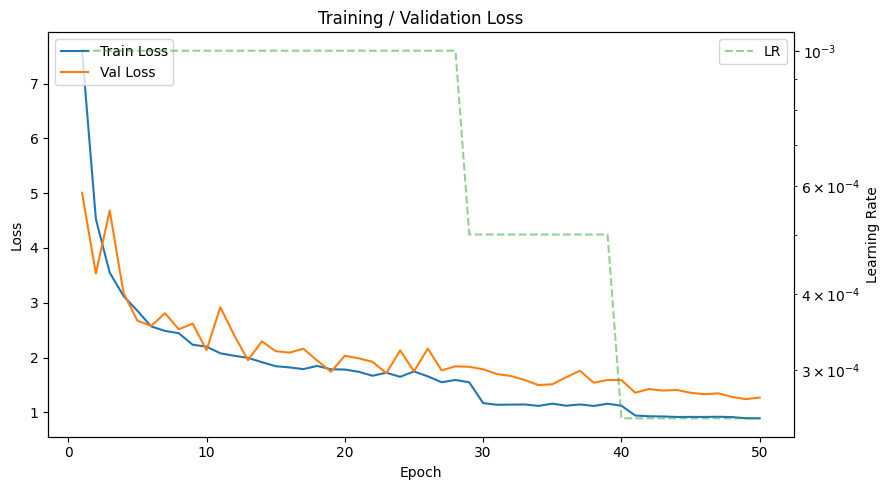

In [64]:
torch.set_float32_matmul_precision("medium")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = PyGNetTGAT(
    node_in_dim,
    edge_in_dim,
    global_in_dim,
    hidden_dim,
    hidden_dim - 2
).to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)

scheduler = PercentPlateauScheduler(
    optimizer,
    mode= 'min',
    percent_threshold= 0.01,
    patience= 6,
    factor= 0.5
)

NUM_EPOCHS = 50
best_val_loss = float("inf")
train_loss_history = []
val_loss_history = []
lr_history = []

for epoch in range(NUM_EPOCHS):

    print(f"Epoch {epoch+1}/{NUM_EPOCHS}")

    # 🔹 1. TRAIN
    avg_train_loss = train_one_epoch(
        model,
        train_loader,
        gnn_train_batch_list,
        optimizer,
        device
    )

    # 🔹 2. VALIDATION
    avg_val_loss = validate_one_epoch(
        model,
        val_loader,
        gnn_val_batch_list,
        device
    )

    # 🔹 3. Scheduler (⚠️ meglio usare VAL, non TRAIN)
    scheduler.step(avg_val_loss)

    # 🔹 4. Save best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "best_model.pt")
        print("✅ Best model saved")

    # 🔹 5. Logging
    current_lr = optimizer.param_groups[0]['lr']
    train_loss_history.append(avg_train_loss)
    val_loss_history.append(avg_val_loss)
    lr_history.append(current_lr)
    print(
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f} | "
        f"LR: {current_lr:.2e}"
    )

# 🔹 6. Plot loss curves
fig, ax1 = plt.subplots(figsize=(9, 5))
ax1.plot(range(1, NUM_EPOCHS + 1), train_loss_history, label='Train Loss', color='tab:blue')
ax1.plot(range(1, NUM_EPOCHS + 1), val_loss_history, label='Val Loss', color='tab:orange')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend(loc='upper left')
ax1.set_title('Training / Validation Loss')

ax2 = ax1.twinx()
ax2.plot(range(1, NUM_EPOCHS + 1), lr_history, label='LR', color='tab:green', linestyle='--', alpha=0.5)
ax2.set_ylabel('Learning Rate')
ax2.set_yscale('log')
ax2.legend(loc='upper right')

fig.tight_layout()
plt.show()


In [65]:
torch.save(model.state_dict(), "model_50ep_1000tr_1bs_512hd.pt")

Epoch 51/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.72it/s, Val Loss=1.1489]


✅ Best model saved
Train Loss: 0.7676 | Val Loss: 1.1489 | LR: 6.25e-05
Epoch 52/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.82it/s, Val Loss=1.1288]


✅ Best model saved
Train Loss: 0.7552 | Val Loss: 1.1288 | LR: 6.25e-05
Epoch 53/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.98it/s, Val Loss=1.1229]


✅ Best model saved
Train Loss: 0.7500 | Val Loss: 1.1229 | LR: 6.25e-05
Epoch 54/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.34it/s, Val Loss=1.1240]


Train Loss: 0.7458 | Val Loss: 1.1240 | LR: 6.25e-05
Epoch 55/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.03it/s, Val Loss=1.1202]


✅ Best model saved
Train Loss: 0.7410 | Val Loss: 1.1202 | LR: 6.25e-05
Epoch 56/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.43it/s, Val Loss=1.1215]


Train Loss: 0.7376 | Val Loss: 1.1215 | LR: 6.25e-05
Epoch 57/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.47it/s, Val Loss=1.1156]


✅ Best model saved
Train Loss: 0.7347 | Val Loss: 1.1156 | LR: 6.25e-05
Epoch 58/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.23it/s, Val Loss=1.1179]


Train Loss: 0.7336 | Val Loss: 1.1179 | LR: 6.25e-05
Epoch 59/75


Validation: 100%|██████████| 200/200 [00:20<00:00,  9.93it/s, Val Loss=1.1111]


✅ Best model saved
Train Loss: 0.7301 | Val Loss: 1.1111 | LR: 6.25e-05
Epoch 60/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.01it/s, Val Loss=1.1056]


✅ Best model saved
Train Loss: 0.7273 | Val Loss: 1.1056 | LR: 6.25e-05
Epoch 61/75


Validation: 100%|██████████| 200/200 [00:20<00:00,  9.65it/s, Val Loss=1.1029]


✅ Best model saved
Train Loss: 0.7249 | Val Loss: 1.1029 | LR: 6.25e-05
Epoch 62/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.25it/s, Val Loss=1.0998]


✅ Best model saved
Train Loss: 0.7218 | Val Loss: 1.0998 | LR: 6.25e-05
Epoch 63/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.46it/s, Val Loss=1.0957]


✅ Best model saved
Train Loss: 0.7195 | Val Loss: 1.0957 | LR: 6.25e-05
Epoch 64/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.53it/s, Val Loss=1.0956]


✅ Best model saved
Train Loss: 0.7170 | Val Loss: 1.0956 | LR: 6.25e-05
Epoch 65/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.13it/s, Val Loss=1.0925]


✅ Best model saved
Train Loss: 0.7151 | Val Loss: 1.0925 | LR: 6.25e-05
Epoch 66/75


Validation: 100%|██████████| 200/200 [00:20<00:00,  9.95it/s, Val Loss=1.0900]


✅ Best model saved
Train Loss: 0.7137 | Val Loss: 1.0900 | LR: 6.25e-05
Epoch 67/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.07it/s, Val Loss=1.0904]


Train Loss: 0.7105 | Val Loss: 1.0904 | LR: 6.25e-05
Epoch 68/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.38it/s, Val Loss=1.0863]


✅ Best model saved
Train Loss: 0.7103 | Val Loss: 1.0863 | LR: 6.25e-05
Epoch 69/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.94it/s, Val Loss=1.0840]


✅ Best model saved
Train Loss: 0.7080 | Val Loss: 1.0840 | LR: 6.25e-05
Epoch 70/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.91it/s, Val Loss=1.0813]


✅ Best model saved
Train Loss: 0.7046 | Val Loss: 1.0813 | LR: 6.25e-05
Epoch 71/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 11.05it/s, Val Loss=1.0794]


✅ Best model saved
Train Loss: 0.7040 | Val Loss: 1.0794 | LR: 6.25e-05
Epoch 72/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.75it/s, Val Loss=1.0777]


✅ Best model saved
Train Loss: 0.7001 | Val Loss: 1.0777 | LR: 6.25e-05
Epoch 73/75


Validation: 100%|██████████| 200/200 [00:19<00:00, 10.15it/s, Val Loss=1.0748]


✅ Best model saved
Train Loss: 0.6993 | Val Loss: 1.0748 | LR: 6.25e-05
Epoch 74/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.92it/s, Val Loss=1.0725]


✅ Best model saved
Train Loss: 0.6963 | Val Loss: 1.0725 | LR: 6.25e-05
Epoch 75/75


Validation: 100%|██████████| 200/200 [00:18<00:00, 10.77it/s, Val Loss=1.0729]


Train Loss: 0.6943 | Val Loss: 1.0729 | LR: 6.25e-05


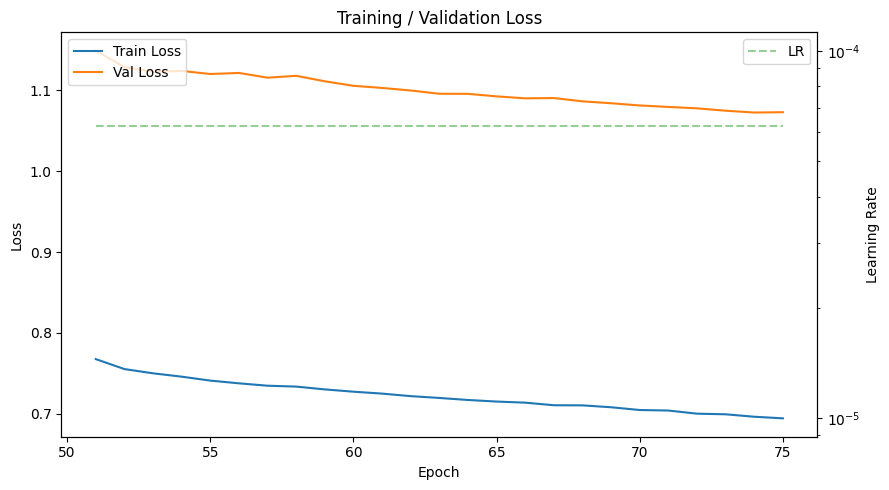

In [66]:
optimizer = torch.optim.AdamW(model.parameters(), lr=6.25e-5)

scheduler = PercentPlateauScheduler(
    optimizer,
    mode= 'min',
    percent_threshold= 0.01,
    patience= 6,
    factor= 0.5
)

NUM_EPOCHS = 25
best_val_loss = float("inf")
train_loss_history = []
val_loss_history = []
lr_history = []

for epoch in range(NUM_EPOCHS):

    print(f"Epoch {epoch+51}/{NUM_EPOCHS+50}")

    # 🔹 1. TRAIN
    avg_train_loss = train_one_epoch(
        model,
        train_loader,
        gnn_train_batch_list,
        optimizer,
        device
    )

    # 🔹 2. VALIDATION
    avg_val_loss = validate_one_epoch(
        model,
        val_loader,
        gnn_val_batch_list,
        device
    )

    # 🔹 3. Scheduler (⚠️ meglio usare VAL, non TRAIN)
    scheduler.step(avg_val_loss)

    # 🔹 4. Save best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "best_model.pt")
        print("✅ Best model saved")

    # 🔹 5. Logging
    current_lr = optimizer.param_groups[0]['lr']
    train_loss_history.append(avg_train_loss)
    val_loss_history.append(avg_val_loss)
    lr_history.append(current_lr)
    print(
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f} | "
        f"LR: {current_lr:.2e}"
    )

# 🔹 6. Plot loss curves
fig, ax1 = plt.subplots(figsize=(9, 5))
ax1.plot(range(51, NUM_EPOCHS + 51), train_loss_history, label='Train Loss', color='tab:blue')
ax1.plot(range(51, NUM_EPOCHS + 51), val_loss_history, label='Val Loss', color='tab:orange')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend(loc='upper left')
ax1.set_title('Training / Validation Loss')

ax2 = ax1.twinx()
ax2.plot(range(51, NUM_EPOCHS + 51), lr_history, label='LR', color='tab:green', linestyle='--', alpha=0.5)
ax2.set_ylabel('Learning Rate')
ax2.set_yscale('log')
ax2.legend(loc='upper right')

fig.tight_layout()
plt.show()


In [67]:
torch.save(model.state_dict(), "model_75ep_1000tr_1bs_512hd.pt")

## 8.5 Smoothing Functions

In [68]:

def smooth_pred(y_pred, window_length=7, polyorder=2):
    """
    Applica il filtro Savitzky-Golay alle predizioni del modello.

    Args:
        y_pred (torch.Tensor): Output del modello in forma [B, T, N, 2]
        window_length (int): Lunghezza della finestra del filtro (deve essere dispari)
        polyorder (int): Ordine del polinomio per il fitting

    Returns:
        torch.Tensor: Traiettorie smoothate nella stessa forma originale
    """
    # 1. Spostiamo in CPU e convertiamo in NumPy per SciPy
    # Usiamo detach() per sicurezza, anche se post-inferenza
    device = y_pred.device
    y_pred_np = y_pred.detach().cpu().numpy()

    # 2. Applichiamo il filtro lungo l'asse temporale (axis=0 -> T)
    # savgol_filter lavora nativamente su array multidimensionali
    y_smooth_np = savgol_filter(y_pred_np,
                                window_length=window_length,
                                polyorder= polyorder,
                                axis= 0,
                                mode= 'nearest') # 'nearest' aiuta ai bordi del futuro

    # 3. Riconvertiamo in Tensor e riportiamo al device originale
    return torch.from_numpy(y_smooth_np).to(device)

In [69]:
def smooth_trajectories_with_context(y_pred, x_past= None, window_length=11, polyorder=2):

    # 1. Spostiamo in CPU e convertiamo in NumPy per SciPy
    # Usiamo detach() per sicurezza, anche se post-inferenza
    device = y_pred.device
    y_pred_np = y_pred.detach().cpu()

    x_past = x_past.permute(1, 0, 2)
    combined = torch.cat([x_past, y_pred_np[:, :x_past.shape[1]]])

    smoothed = savgol_filter(combined,
                             window_length= window_length,
                             polyorder= polyorder,
                             axis= 0,
                             mode='nearest')

    # 3. Riportiamo in Tensor
    smoothed_full = torch.from_numpy(smoothed).to(device)

    # 4. TAGLIO: Prendiamo solo la parte del futuro (T_out)
    # Importante: manteniamo solo i frame dal T_in in poi
    refined_pred = smoothed_full[x_past.shape[0]:, :, :]

    # 5. ANCORAGGIO FISICO (Hard Fix)
    # Forza il primo frame predetto a essere IDENTICO all'ultimo della storia
    # Questo garantisce continuità spaziale perfetta (0 gap)
    #refined_pred[0, :, :] = x_past[-1, :, :].clone()

    return refined_pred

## 8.6 Test Set Evaluation

In [70]:
# Carico il miglior modello

# Test finale
test_loss = validate_one_epoch(
    model,
    test_loader,
    gnn_test_batch_list,
    device
)

print(f"\n🚀 Test Loss: {test_loss:.4f}")

Validation: 100%|██████████| 200/200 [00:19<00:00, 10.50it/s, Val Loss=0.6516]


🚀 Test Loss: 0.6516


In [71]:
# Carico il miglior modello

# Test finale
test_loss = validate_one_epoch(
    model,
    test_loader,
    gnn_test_batch_list,
    device
)

print(f"\n🚀 Test Loss: {test_loss:.4f}")

Validation: 100%|██████████| 200/200 [00:17<00:00, 11.23it/s, Val Loss=0.6516]


🚀 Test Loss: 0.6516


---
# 9. Results Visualization

In [72]:
def draw_football_field(ax= None, scrimmage= None, field_color= 'white', line_color= 'lightgrey', lw=2):
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6.33))

    # Field background
    ax.set_facecolor(field_color)

    # Line of Scrimmage
    ax.plot([0,53.3], [scrimmage, scrimmage], color= "#00000066", linewidth= lw, zorder= 1, clip_on= True)

    # End zones
    #if direction == 'right':
    ax.add_patch(plt.Rectangle((0,0), 53.3, 10, facecolor='darkblue', alpha=0.4, zorder= 0, clip_on= True))
    ax.add_patch(plt.Rectangle((0,110), 53.3, 10, facecolor='darkred', alpha=0.4, zorder= 0, clip_on= True))

    # Yard lines every 5 yards
    for x in range(0, 121, 5):
        lw_line = lw if x % 10 == 0 else lw/2
        if x != 5 and x != 115:
            ax.plot([0, 53.3], [x, x], color=line_color, linewidth=lw_line, zorder= 0, clip_on= True)

        # Yard line numbers (every 10 yards, mirrored correctly)
        if 10 < x < 110 and x % 10 == 0:
            display_num = x - 10 if x <= 60 else 110 - x  # Mirror numbers after 50
            ax.text(3, x, str(display_num), color= line_color, fontsize= 20, ha='center', va='center', rotation= 270, zorder= 0, clip_on= True)
            ax.text(53.3 - 3, x, str(display_num), color= line_color, fontsize= 20, ha='center', va='center', rotation= 90, zorder= 0, clip_on= True)

    # Sidelines and end zone borders
    ax.plot([0,0], [0, 120], color=line_color, linewidth=lw, zorder= 0, clip_on= True)
    ax.plot([53.3,53.3], [0, 120],color=line_color, linewidth=lw, zorder= 0, clip_on= True)
    ax.plot([0,53.3], [0,0], color=line_color, linewidth=lw, zorder= 0, clip_on= True)
    ax.plot([0,53.3], [120,120], color=line_color, linewidth=lw, zorder= 0, clip_on= True)

    # Hash marks
    for x in range(10, 111):
        for y in [0.4, 53.3 - 0.4]:
            ax.plot([y, y+0.2], [x, x], color=line_color, linewidth=1, zorder= 0, clip_on= True)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])

    return ax

In [73]:

def visualize_comparison(input_batch, input_mask, target_batch, pred_batch, output_mask, scrimmage= None, ball=None, batch_idx=0):
    """
    Args:
        input_batch:  [B, T_in, N, 2]  - Storia passata
        input_mask:   [B, T_in, N]     - Maschera di validità
        target_batch: [B, T_out, N, 2] - Realtà (Ground Truth)
        pred_batch:   [B, T_out, N, 2] - Predizione del modello
        output_mask:  [B, T_out, N]    - Maschera di validità
    """

    min_y, max_y = 130, -10
    fig, ax = plt.subplots()

    # Colors
    offense_roles = ["Passer", "Other Route Runner"]
    defense_color = 'red'
    offense_color = 'blue'
    defense_pred_color = 'darkred'
    offense_pred_color = 'darkblue'
    alpha_prepass = 0.2
    alpha_postpass = 0.7
    ball_color = 'orange'

    def get_player_color_by_side(side, pred= False):
        if pred:
            return defense_pred_color if side[0] else offense_pred_color
        return defense_color if side[0] else offense_color

    # PRE-PASS REPRESENTATION
    # ========================
    prepass = input_batch[batch_idx, :, :2]
    side = input_batch[batch_idx, :, 22:24]
    mask = input_mask[batch_idx]

    num_players = int(mask[0].sum())
    frames_per_player = mask.sum(dim = 0)
    num_frames = int(frames_per_player.max())

    num_nodes = num_players * num_frames
    filtered_prepass = prepass[:num_nodes]

    complete_prepass = torch.zeros((num_players, num_frames, 2))
    for n in range(num_nodes):
        complete_prepass[n % num_players, n // num_players] = filtered_prepass[n]

    if complete_prepass[:, :, 0].min() < min_y :
        min_y = complete_prepass[:, :, 0].min()
    if complete_prepass[:, :, 1].max() > max_y :
        max_y = complete_prepass[:, :, 0].max()

    for n in range(complete_prepass.shape[0]):
        ax.plot(complete_prepass[n, :, 1].cpu().numpy(), complete_prepass[n, :, 0].cpu().numpy(),
                color= get_player_color_by_side(side[n % num_players]), alpha= alpha_prepass, linewidth=2)

    # POST-PASS REPRESENTATION
    # ========================
    y_true = target_batch[batch_idx]
    y_pred = pred_batch[batch_idx]
    mask = output_mask[batch_idx]
    frames_per_player = mask.sum(axis=0)

    # Setup campo NFL (Length X: 0-120, Width Y: 0-53.3)
    ax.set_xlim(-5, 55)

    for n in range(y_true.shape[1]):
        valid_frames = int(frames_per_player[n])
        if valid_frames == 0:
            continue

        # 2. GROUND TRUTH
        # Rappresenta quello che è successo davvero
        ax.plot(y_true[:valid_frames, n, 1].cpu().numpy(), y_true[:valid_frames, n, 0].cpu().numpy(),
                color= get_player_color_by_side(side[n]), alpha= alpha_postpass, linewidth=2)

        # 3. PREDIZIONE
        # Rappresenta l'ipotesi del tuo modello
        loss_x = F.mse_loss(y_true[:valid_frames, n], y_pred[:valid_frames, n])

        print(f"[PRE]   Player {n} mse_loss: {loss_x}")
        y_pred = smooth_trajectories_with_context(y_pred[:valid_frames], complete_prepass)
        print(f"[POST]  Player {n} mse_loss: {F.mse_loss(y_true[:valid_frames, n], y_pred[:valid_frames, n])}")

        ax.plot(y_pred[:valid_frames, n, 1].cpu().numpy(), y_pred[:valid_frames, n, 0].cpu().numpy(),
                color=get_player_color_by_side(side[n], True), alpha= alpha_postpass, linewidth=2)

        # Marker finale per evidenziare l'errore di sfasamento (FDE)
        ax.scatter(y_true[valid_frames-1, n, 1].cpu().numpy(), y_true[valid_frames-1, n, 0].cpu().numpy(), color= get_player_color_by_side(side[n]), s=30, alpha=0.5)
        ax.scatter(y_pred[valid_frames-1, n, 1].cpu().numpy(), y_pred[valid_frames-1, n, 0].cpu().numpy(), color= get_player_color_by_side(side[n], True), s=30, alpha=0.5)

        if y_true[:valid_frames, n, 0].min() < min_y :
            min_y = y_true[:valid_frames, n, 0].min()
        if y_true[:valid_frames, n, 0].max() > max_y :
            max_y = y_true[:valid_frames, n, 0].max()

        if y_pred[:valid_frames, n, 0].min() < min_y :
            min_y = y_pred[:valid_frames, n, 0].min()
        if y_pred[:valid_frames, n, 0].max() > max_y :
            max_y = y_pred[:valid_frames, n, 0].max()

    ax.set_ylim(min_y.cpu() - 10, max_y.cpu() + 10)
    ax.set_title(f"Comparison GT vs Prediction - Play {batch_idx}")
    draw_football_field(ax, scrimmage)
    ax.scatter(ball[1], ball[0], color= 'orange')

    # Legenda pulita
    legend_elements = [
        Line2D([0], [0], color='green', lw=2, label='Ground Truth'),
        Line2D([0], [0], color='red', lw=2, linestyle='--', label='Model Prediction')
    ]

    plt.tight_layout()
    plt.show()

[PRE]   Player 4 mse_loss: 0.08420675992965698
[POST]  Player 4 mse_loss: 0.06133656948804855
[PRE]   Player 6 mse_loss: 0.0784403458237648
[POST]  Player 6 mse_loss: 0.08546926826238632
[PRE]   Player 10 mse_loss: 0.08698853105306625
[POST]  Player 10 mse_loss: 0.10963402688503265


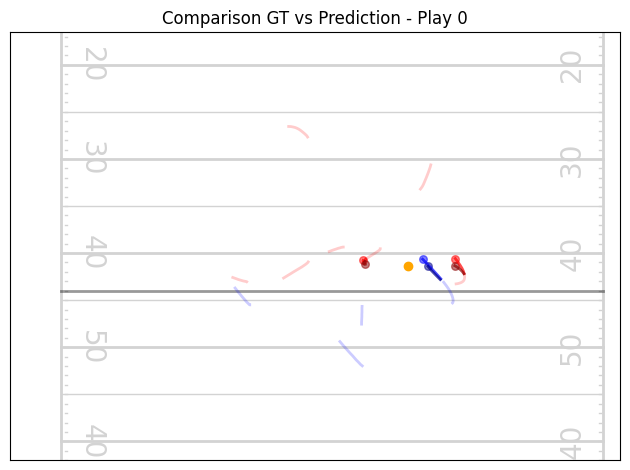

[PRE]   Player 2 mse_loss: 0.06991255283355713
[POST]  Player 2 mse_loss: 0.0689171701669693
[PRE]   Player 3 mse_loss: 0.08433368057012558
[POST]  Player 3 mse_loss: 0.08272465318441391
[PRE]   Player 9 mse_loss: 0.0590067021548748
[POST]  Player 9 mse_loss: 0.06717729568481445


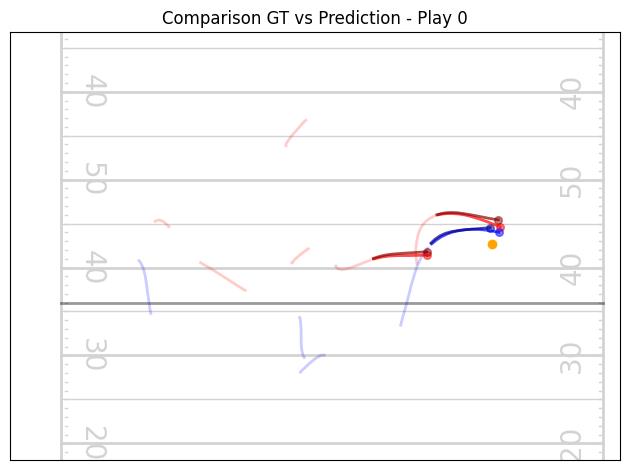

[PRE]   Player 0 mse_loss: 0.12188344448804855
[POST]  Player 0 mse_loss: 0.14000193774700165
[PRE]   Player 5 mse_loss: 0.08170182257890701
[POST]  Player 5 mse_loss: 0.07164592295885086
[PRE]   Player 12 mse_loss: 0.016853127628564835
[POST]  Player 12 mse_loss: 0.023990362882614136


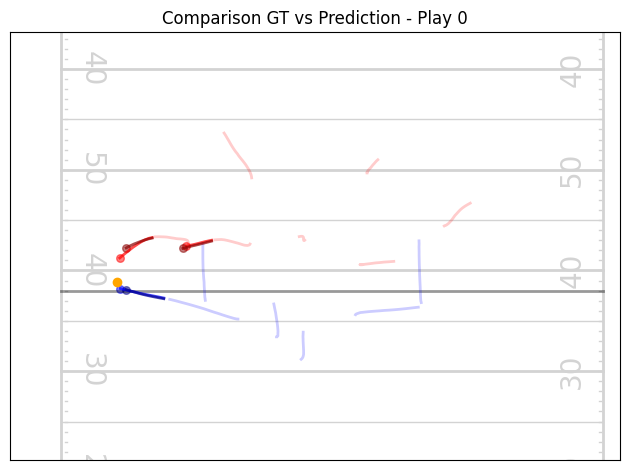

[PRE]   Player 2 mse_loss: 0.54921954870224
[POST]  Player 2 mse_loss: 0.5388392806053162
[PRE]   Player 3 mse_loss: 0.14269685745239258
[POST]  Player 3 mse_loss: 0.14907898008823395
[PRE]   Player 5 mse_loss: 0.2799392640590668
[POST]  Player 5 mse_loss: 0.27778688073158264
[PRE]   Player 10 mse_loss: 0.09685483574867249
[POST]  Player 10 mse_loss: 0.08942880481481552


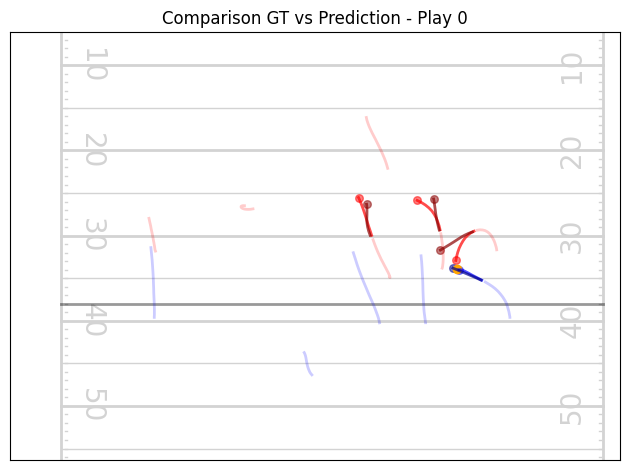

[PRE]   Player 4 mse_loss: 0.2929933965206146
[POST]  Player 4 mse_loss: 0.2976023852825165
[PRE]   Player 11 mse_loss: 0.2604545056819916
[POST]  Player 11 mse_loss: 0.2766953408718109


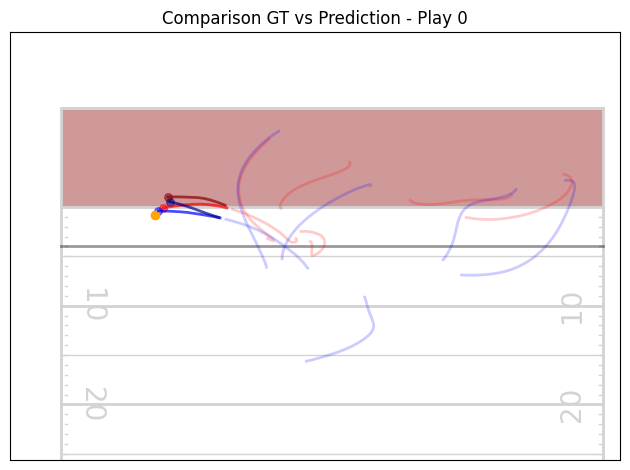

[PRE]   Player 2 mse_loss: 0.9017958641052246
[POST]  Player 2 mse_loss: 0.8898266553878784
[PRE]   Player 3 mse_loss: 0.20219576358795166
[POST]  Player 3 mse_loss: 0.22466884553432465
[PRE]   Player 4 mse_loss: 0.41217172145843506
[POST]  Player 4 mse_loss: 0.41501736640930176
[PRE]   Player 5 mse_loss: 0.7049895524978638
[POST]  Player 5 mse_loss: 0.6911308169364929
[PRE]   Player 10 mse_loss: 0.3105083405971527
[POST]  Player 10 mse_loss: 0.3246915638446808


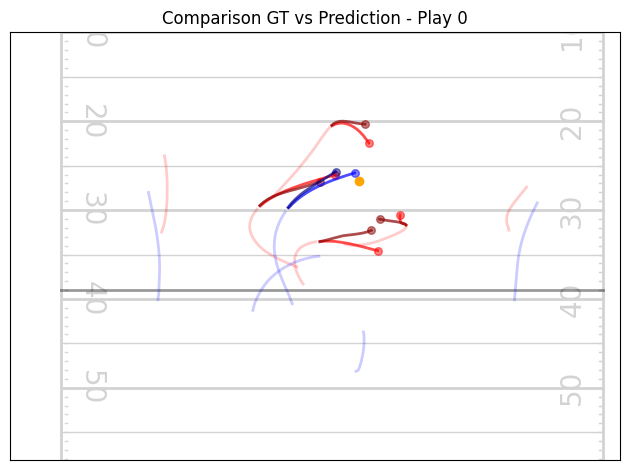

[PRE]   Player 0 mse_loss: 0.04961760714650154
[POST]  Player 0 mse_loss: 0.06870865821838379
[PRE]   Player 1 mse_loss: 0.40518710017204285
[POST]  Player 1 mse_loss: 0.3870648443698883
[PRE]   Player 4 mse_loss: 0.26116979122161865
[POST]  Player 4 mse_loss: 0.26168665289878845
[PRE]   Player 11 mse_loss: 0.07420755922794342
[POST]  Player 11 mse_loss: 0.07984563708305359


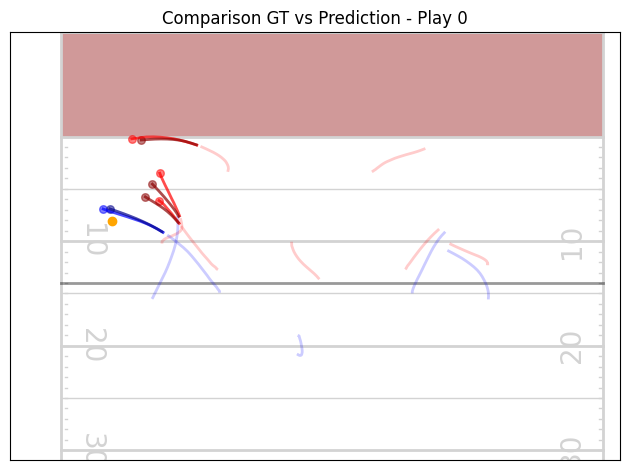

[PRE]   Player 2 mse_loss: 0.009638682007789612
[POST]  Player 2 mse_loss: 0.009792013093829155
[PRE]   Player 13 mse_loss: 0.009200440719723701
[POST]  Player 13 mse_loss: 0.018331123515963554


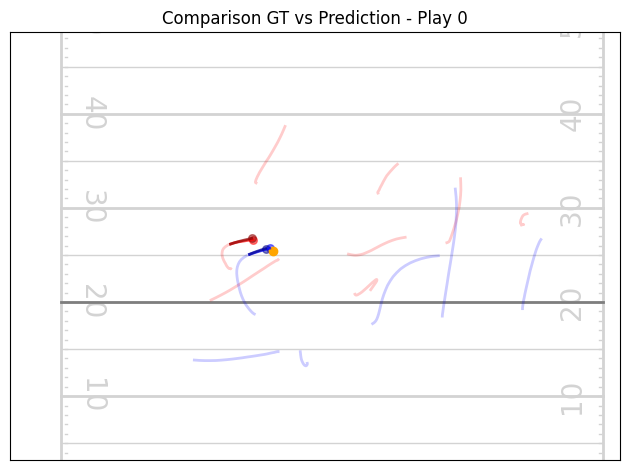

[PRE]   Player 3 mse_loss: 0.09040700644254684
[POST]  Player 3 mse_loss: 0.10966269671916962
[PRE]   Player 4 mse_loss: 1.1643646955490112
[POST]  Player 4 mse_loss: 1.1812009811401367
[PRE]   Player 6 mse_loss: 0.17576541006565094
[POST]  Player 6 mse_loss: 0.19272688031196594
[PRE]   Player 12 mse_loss: 0.24186694622039795
[POST]  Player 12 mse_loss: 0.2541331350803375


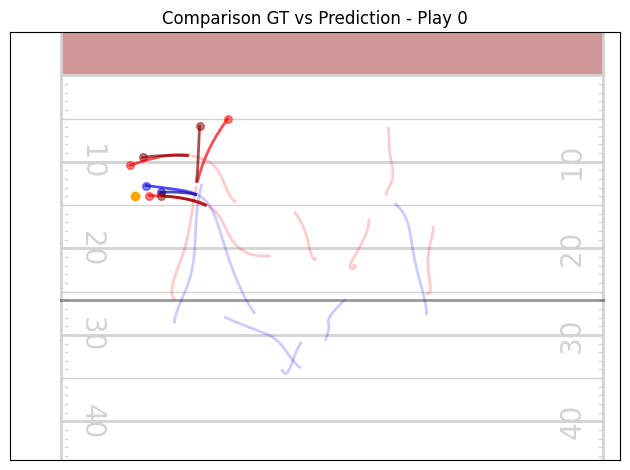

[PRE]   Player 3 mse_loss: 0.07734420150518417
[POST]  Player 3 mse_loss: 0.07552444934844971
[PRE]   Player 6 mse_loss: 0.18331710994243622
[POST]  Player 6 mse_loss: 0.1805429309606552
[PRE]   Player 12 mse_loss: 0.03705703839659691
[POST]  Player 12 mse_loss: 0.03710212931036949


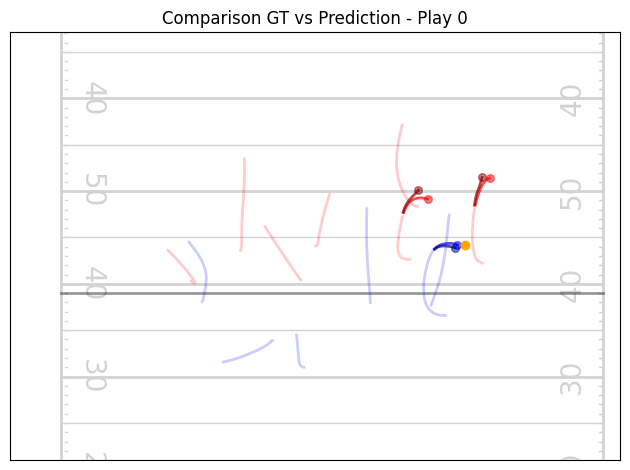

[PRE]   Player 0 mse_loss: 0.003324710763990879
[POST]  Player 0 mse_loss: 0.003402486676350236
[PRE]   Player 3 mse_loss: 0.03840294107794762
[POST]  Player 3 mse_loss: 0.03788332641124725
[PRE]   Player 5 mse_loss: 0.12902069091796875
[POST]  Player 5 mse_loss: 0.1506694257259369
[PRE]   Player 12 mse_loss: 0.0502333790063858
[POST]  Player 12 mse_loss: 0.06616213917732239


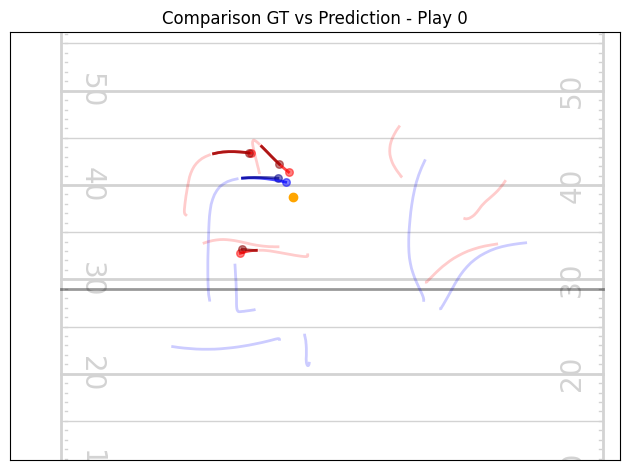

[PRE]   Player 0 mse_loss: 0.45416319370269775
[POST]  Player 0 mse_loss: 0.4461188018321991
[PRE]   Player 3 mse_loss: 0.17045123875141144
[POST]  Player 3 mse_loss: 0.17906151711940765
[PRE]   Player 4 mse_loss: 1.7439370155334473
[POST]  Player 4 mse_loss: 1.7367234230041504
[PRE]   Player 5 mse_loss: 0.18624207377433777
[POST]  Player 5 mse_loss: 0.18412962555885315
[PRE]   Player 6 mse_loss: 0.20636707544326782
[POST]  Player 6 mse_loss: 0.20642894506454468
[PRE]   Player 12 mse_loss: 0.10951370000839233
[POST]  Player 12 mse_loss: 0.11446934938430786


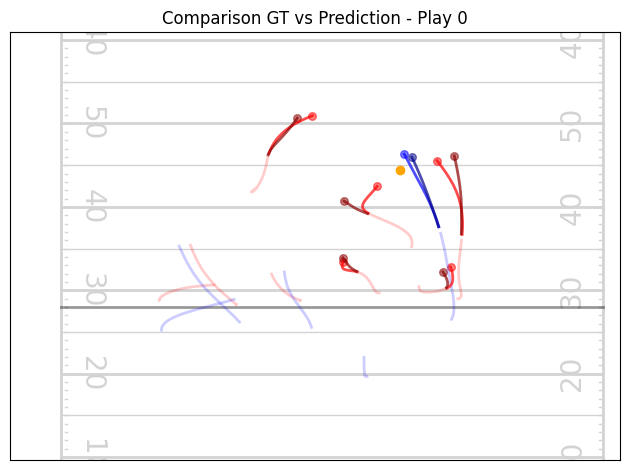

[PRE]   Player 1 mse_loss: 0.15154995024204254
[POST]  Player 1 mse_loss: 0.15741117298603058
[PRE]   Player 2 mse_loss: 0.0688122883439064
[POST]  Player 2 mse_loss: 0.07611873000860214
[PRE]   Player 3 mse_loss: 0.8160325288772583
[POST]  Player 3 mse_loss: 0.8155713081359863
[PRE]   Player 4 mse_loss: 2.2279434204101562
[POST]  Player 4 mse_loss: 2.20967960357666
[PRE]   Player 11 mse_loss: 0.1179850846529007
[POST]  Player 11 mse_loss: 0.11865963041782379


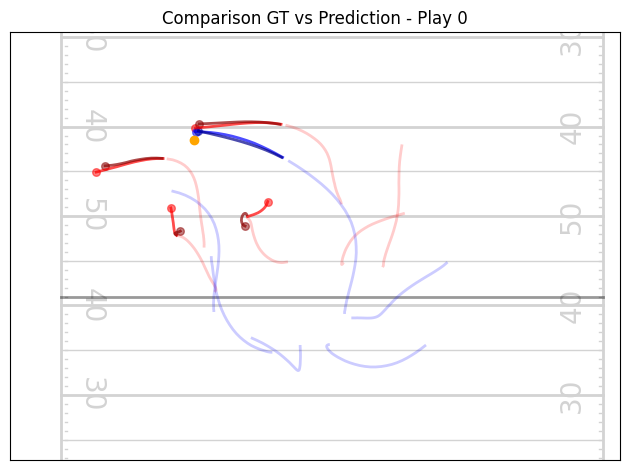

[PRE]   Player 0 mse_loss: 0.07512110471725464
[POST]  Player 0 mse_loss: 0.06463649123907089
[PRE]   Player 3 mse_loss: 0.04855920001864433
[POST]  Player 3 mse_loss: 0.05712936073541641
[PRE]   Player 4 mse_loss: 0.7858847975730896
[POST]  Player 4 mse_loss: 0.7792864441871643
[PRE]   Player 5 mse_loss: 0.0939471647143364
[POST]  Player 5 mse_loss: 0.09783436357975006
[PRE]   Player 12 mse_loss: 0.07041551172733307
[POST]  Player 12 mse_loss: 0.07265110313892365


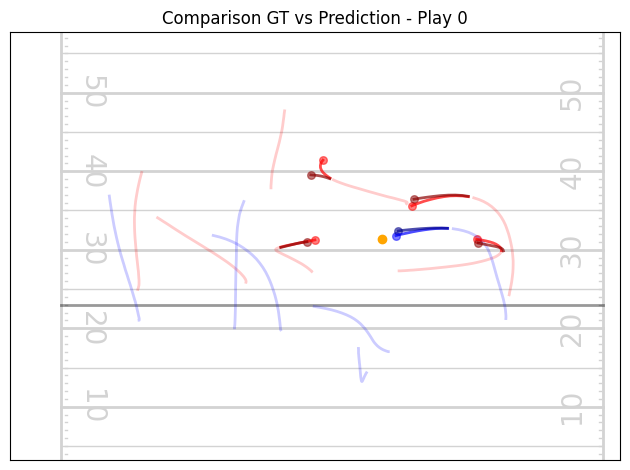

[PRE]   Player 0 mse_loss: 0.7857449054718018
[POST]  Player 0 mse_loss: 0.7766999006271362
[PRE]   Player 1 mse_loss: 1.211476445198059
[POST]  Player 1 mse_loss: 1.2322930097579956
[PRE]   Player 3 mse_loss: 0.2704319357872009
[POST]  Player 3 mse_loss: 0.2756456732749939
[PRE]   Player 5 mse_loss: 0.17552942037582397
[POST]  Player 5 mse_loss: 0.18802575767040253
[PRE]   Player 6 mse_loss: 7.78692626953125
[POST]  Player 6 mse_loss: 7.784249782562256
[PRE]   Player 10 mse_loss: 1.3960649967193604
[POST]  Player 10 mse_loss: 1.4213716983795166


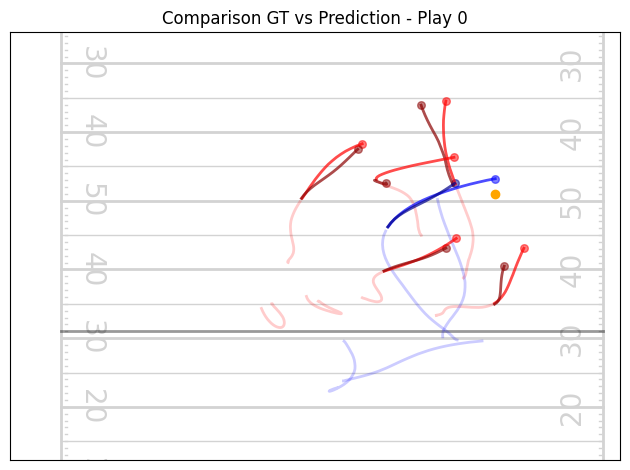

[PRE]   Player 2 mse_loss: 0.4459105134010315
[POST]  Player 2 mse_loss: 0.46342211961746216
[PRE]   Player 9 mse_loss: 0.04150613769888878
[POST]  Player 9 mse_loss: 0.045571472495794296


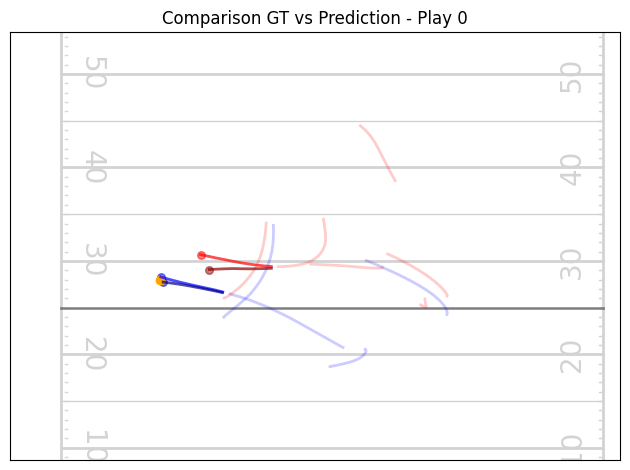

[PRE]   Player 3 mse_loss: 0.10352013260126114
[POST]  Player 3 mse_loss: 0.1002013236284256
[PRE]   Player 12 mse_loss: 0.0509834811091423
[POST]  Player 12 mse_loss: 0.0662468746304512


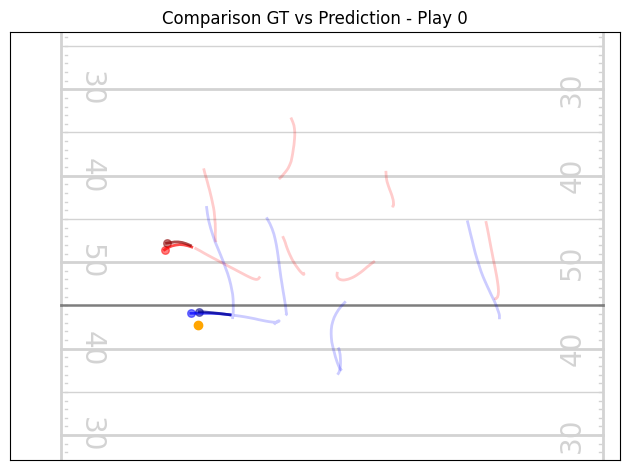

[PRE]   Player 5 mse_loss: 0.12414254248142242
[POST]  Player 5 mse_loss: 0.12892001867294312
[PRE]   Player 6 mse_loss: 0.19222784042358398
[POST]  Player 6 mse_loss: 0.17105932533740997
[PRE]   Player 12 mse_loss: 0.16964589059352875
[POST]  Player 12 mse_loss: 0.18675649166107178


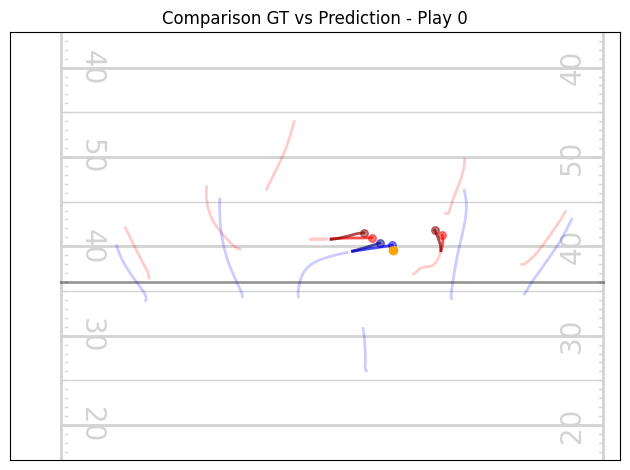

[PRE]   Player 1 mse_loss: 0.12009603530168533
[POST]  Player 1 mse_loss: 0.1321265548467636
[PRE]   Player 3 mse_loss: 0.6176009774208069
[POST]  Player 3 mse_loss: 0.6564810872077942
[PRE]   Player 6 mse_loss: 0.20968736708164215
[POST]  Player 6 mse_loss: 0.20338405668735504
[PRE]   Player 12 mse_loss: 0.027404097840189934
[POST]  Player 12 mse_loss: 0.026565667241811752


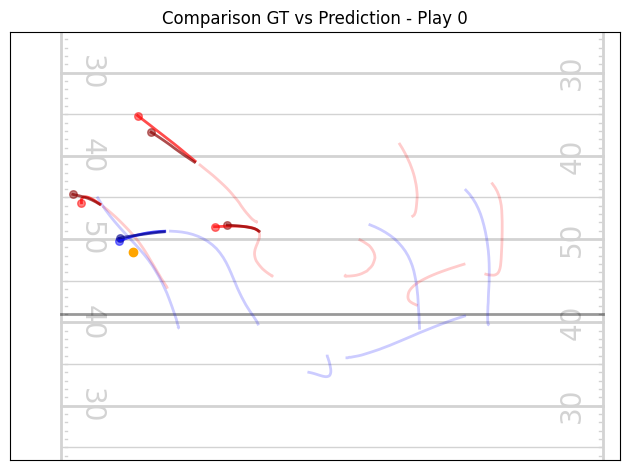

[PRE]   Player 3 mse_loss: 0.035920798778533936
[POST]  Player 3 mse_loss: 0.05294015258550644
[PRE]   Player 12 mse_loss: 0.04894616827368736
[POST]  Player 12 mse_loss: 0.05328236147761345


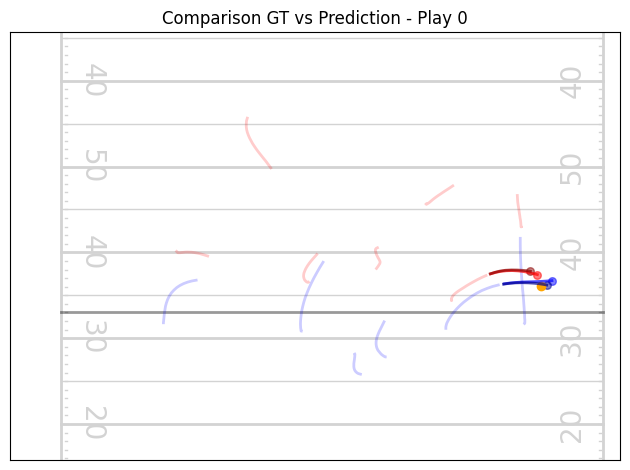

[PRE]   Player 1 mse_loss: 0.0960523709654808
[POST]  Player 1 mse_loss: 0.09490756690502167
[PRE]   Player 11 mse_loss: 0.01336739957332611
[POST]  Player 11 mse_loss: 0.01636524870991707


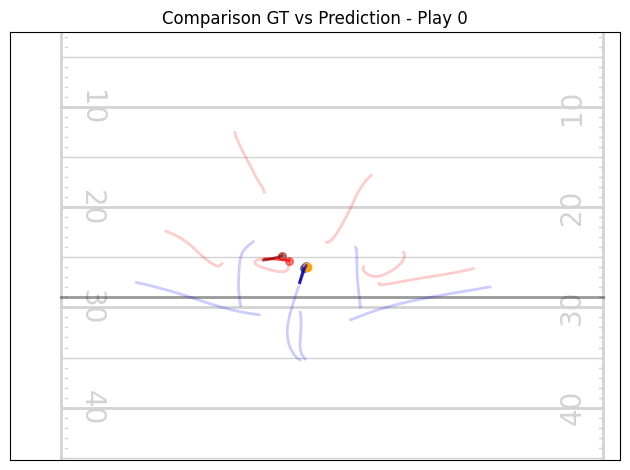

[PRE]   Player 2 mse_loss: 0.027739405632019043
[POST]  Player 2 mse_loss: 0.024905811995267868
[PRE]   Player 4 mse_loss: 0.3067893981933594
[POST]  Player 4 mse_loss: 0.30517005920410156
[PRE]   Player 5 mse_loss: 0.13564462959766388
[POST]  Player 5 mse_loss: 0.14614808559417725
[PRE]   Player 9 mse_loss: 0.021455591544508934
[POST]  Player 9 mse_loss: 0.030075054615736008


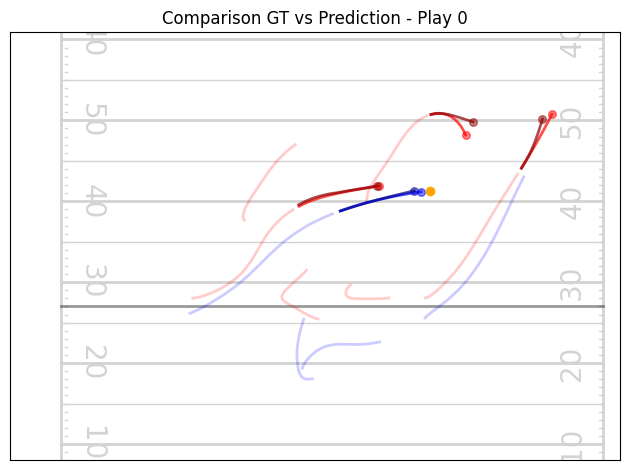

[PRE]   Player 12 mse_loss: 0.04917662590742111
[POST]  Player 12 mse_loss: 0.03902766853570938


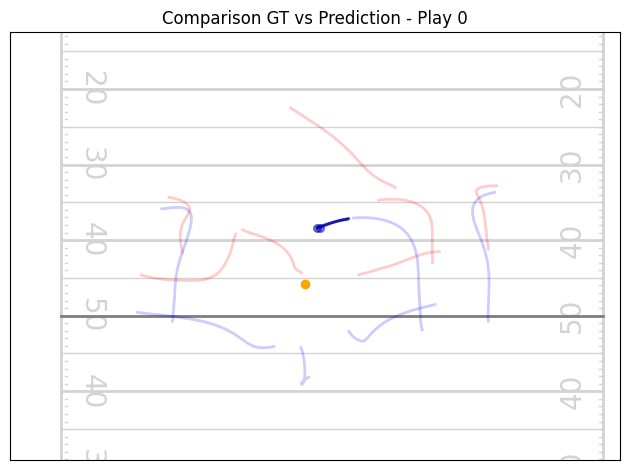

[PRE]   Player 0 mse_loss: 0.025418827310204506
[POST]  Player 0 mse_loss: 0.033846184611320496
[PRE]   Player 3 mse_loss: 0.5086036920547485
[POST]  Player 3 mse_loss: 0.4888266324996948
[PRE]   Player 9 mse_loss: 0.026341527700424194
[POST]  Player 9 mse_loss: 0.037639521062374115


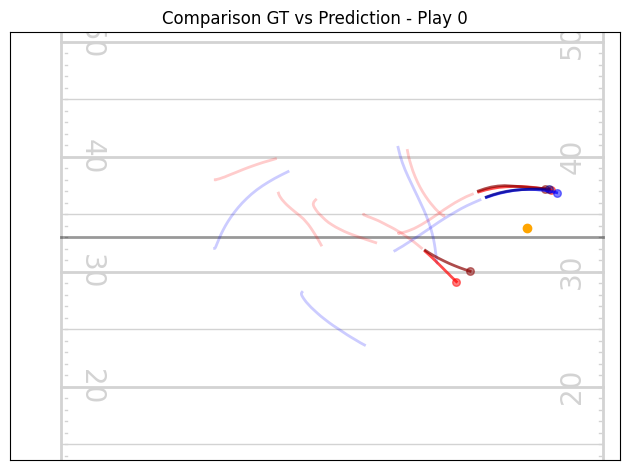

[PRE]   Player 3 mse_loss: 0.4127550721168518
[POST]  Player 3 mse_loss: 0.41478997468948364
[PRE]   Player 5 mse_loss: 0.611199140548706
[POST]  Player 5 mse_loss: 0.5970441699028015
[PRE]   Player 12 mse_loss: 0.7074481248855591
[POST]  Player 12 mse_loss: 0.7143518924713135


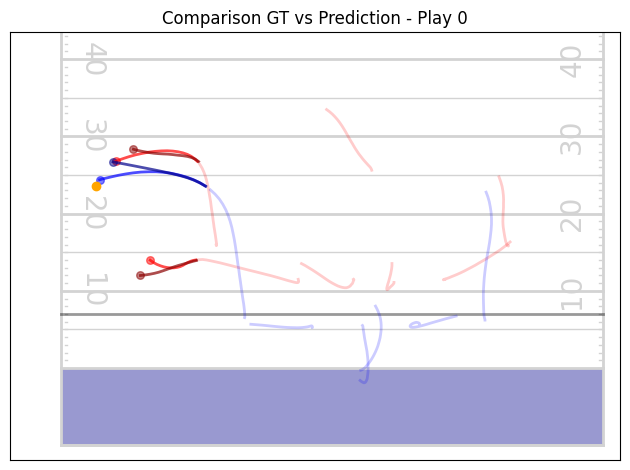

[PRE]   Player 6 mse_loss: 0.040574826300144196
[POST]  Player 6 mse_loss: 0.04338332638144493
[PRE]   Player 12 mse_loss: 0.19252991676330566
[POST]  Player 12 mse_loss: 0.2173299491405487


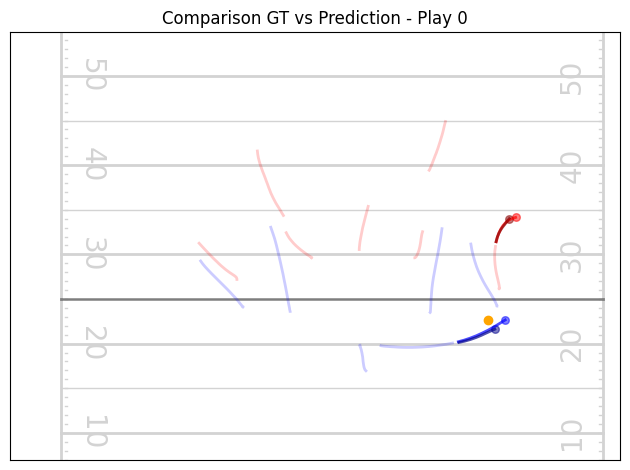

[PRE]   Player 4 mse_loss: 0.011469506658613682
[POST]  Player 4 mse_loss: 0.006138052325695753
[PRE]   Player 6 mse_loss: 0.024423502385616302
[POST]  Player 6 mse_loss: 0.030028387904167175
[PRE]   Player 12 mse_loss: 0.042785901576280594
[POST]  Player 12 mse_loss: 0.04740263149142265


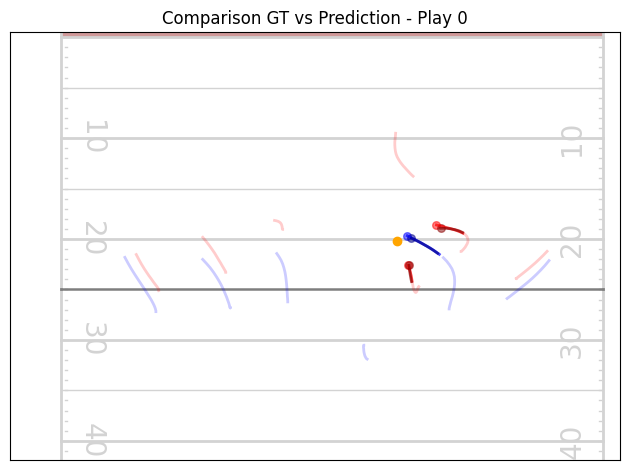

[PRE]   Player 1 mse_loss: 3.749746322631836
[POST]  Player 1 mse_loss: 3.7638092041015625
[PRE]   Player 4 mse_loss: 0.40980640053749084
[POST]  Player 4 mse_loss: 0.4116888642311096
[PRE]   Player 5 mse_loss: 0.33520153164863586
[POST]  Player 5 mse_loss: 0.3524172604084015
[PRE]   Player 9 mse_loss: 1.7485744953155518
[POST]  Player 9 mse_loss: 1.7667670249938965


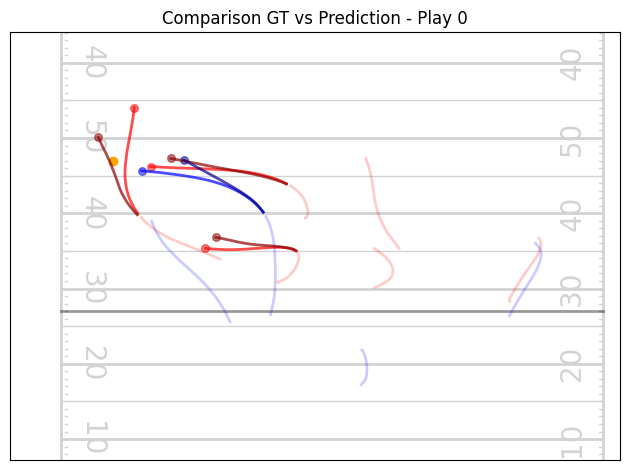

[PRE]   Player 0 mse_loss: 0.406277596950531
[POST]  Player 0 mse_loss: 0.37942829728126526
[PRE]   Player 1 mse_loss: 0.5046442151069641
[POST]  Player 1 mse_loss: 0.4996659457683563
[PRE]   Player 3 mse_loss: 0.23095427453517914
[POST]  Player 3 mse_loss: 0.2176072895526886
[PRE]   Player 12 mse_loss: 0.10509683936834335
[POST]  Player 12 mse_loss: 0.10387792438268661


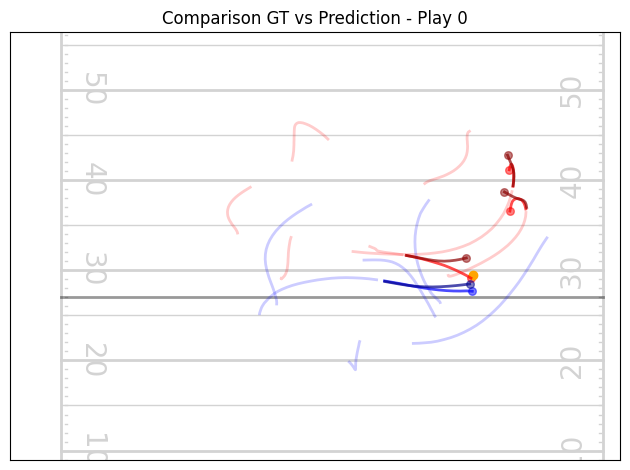

[PRE]   Player 3 mse_loss: 11.302364349365234
[POST]  Player 3 mse_loss: 11.2816162109375
[PRE]   Player 4 mse_loss: 11.955110549926758
[POST]  Player 4 mse_loss: 11.980538368225098
[PRE]   Player 5 mse_loss: 0.33765915036201477
[POST]  Player 5 mse_loss: 0.341968297958374
[PRE]   Player 12 mse_loss: 1.4297744035720825
[POST]  Player 12 mse_loss: 1.4042773246765137


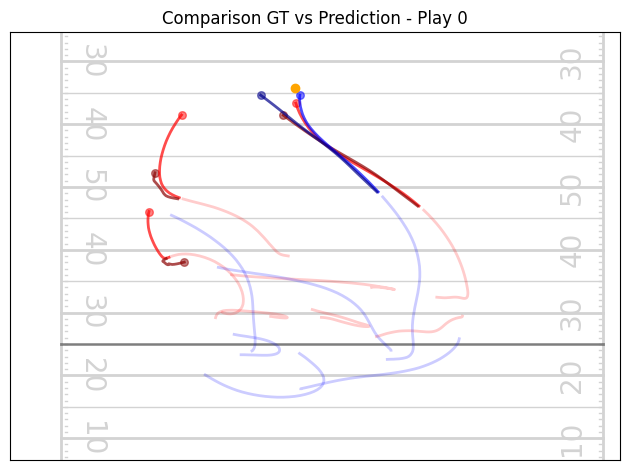

[PRE]   Player 1 mse_loss: 0.43456926941871643
[POST]  Player 1 mse_loss: 0.4095645546913147
[PRE]   Player 12 mse_loss: 0.4712795615196228
[POST]  Player 12 mse_loss: 0.4542068839073181


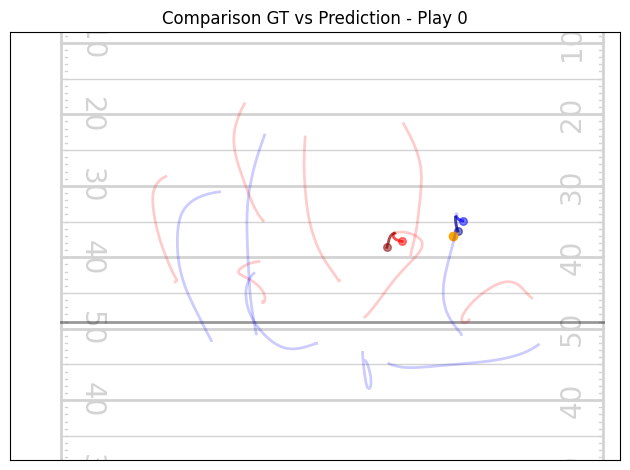

[PRE]   Player 4 mse_loss: 0.044720351696014404
[POST]  Player 4 mse_loss: 0.04755602404475212
[PRE]   Player 12 mse_loss: 0.010048691183328629
[POST]  Player 12 mse_loss: 0.013469040393829346


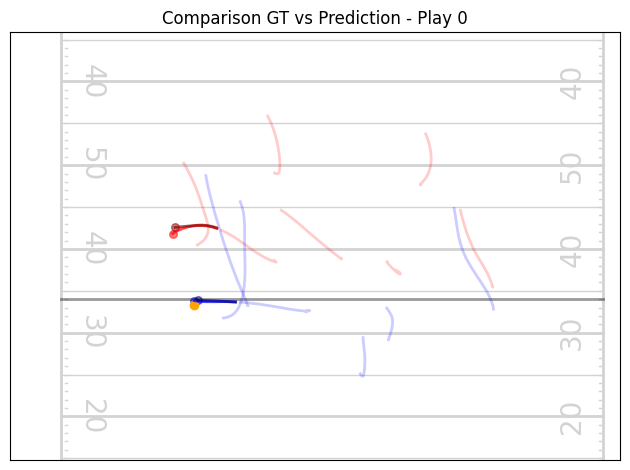

[PRE]   Player 4 mse_loss: 0.06112586334347725
[POST]  Player 4 mse_loss: 0.060189761221408844
[PRE]   Player 11 mse_loss: 0.024703482165932655
[POST]  Player 11 mse_loss: 0.03436978533864021


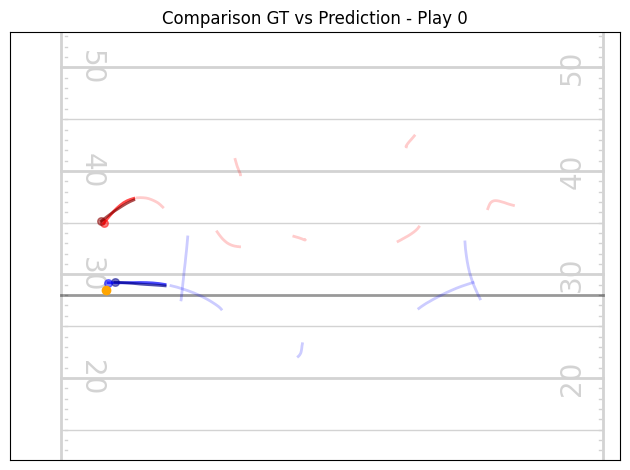

[PRE]   Player 0 mse_loss: 0.02349706180393696
[POST]  Player 0 mse_loss: 0.01835050992667675
[PRE]   Player 1 mse_loss: 0.019178660586476326
[POST]  Player 1 mse_loss: 0.028002222999930382
[PRE]   Player 3 mse_loss: 0.0748417004942894
[POST]  Player 3 mse_loss: 0.09199369698762894
[PRE]   Player 12 mse_loss: 0.2181074172258377
[POST]  Player 12 mse_loss: 0.2299664318561554


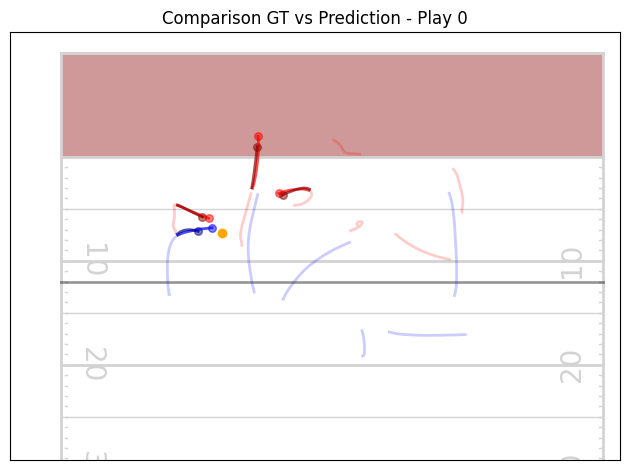

[PRE]   Player 1 mse_loss: 3.5171852111816406
[POST]  Player 1 mse_loss: 3.4606645107269287
[PRE]   Player 3 mse_loss: 0.7359551191329956
[POST]  Player 3 mse_loss: 0.7168027758598328
[PRE]   Player 10 mse_loss: 0.49005213379859924
[POST]  Player 10 mse_loss: 0.4854238033294678


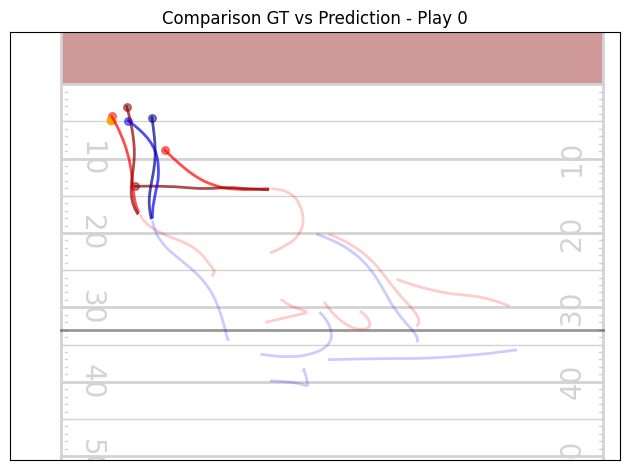

[PRE]   Player 3 mse_loss: 0.01726408302783966
[POST]  Player 3 mse_loss: 0.017820104956626892
[PRE]   Player 4 mse_loss: 0.05168812721967697
[POST]  Player 4 mse_loss: 0.057966720312833786
[PRE]   Player 11 mse_loss: 0.0869598388671875
[POST]  Player 11 mse_loss: 0.08833198994398117


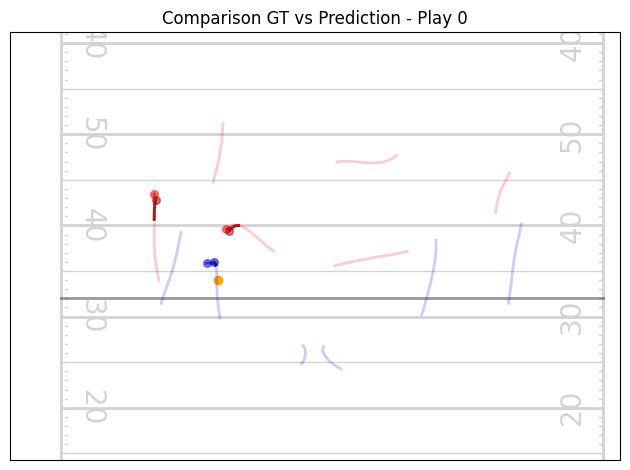

[PRE]   Player 0 mse_loss: 1.345247745513916
[POST]  Player 0 mse_loss: 1.204384684562683
[PRE]   Player 1 mse_loss: 1.9262020587921143
[POST]  Player 1 mse_loss: 1.8950695991516113
[PRE]   Player 12 mse_loss: 0.5772220492362976
[POST]  Player 12 mse_loss: 0.5747318267822266


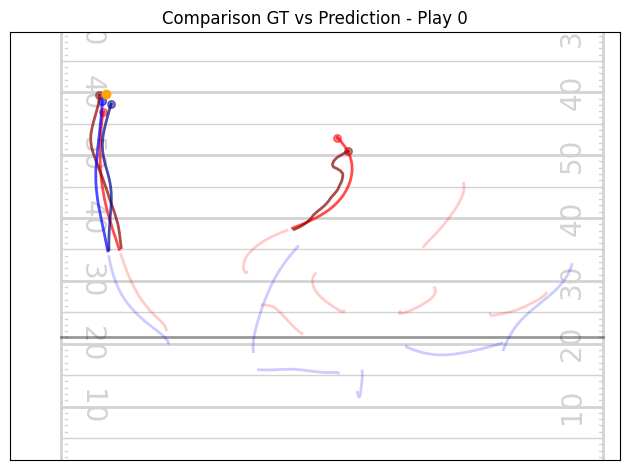

[PRE]   Player 2 mse_loss: 0.10410311818122864
[POST]  Player 2 mse_loss: 0.12395356595516205
[PRE]   Player 11 mse_loss: 0.017291733995079994
[POST]  Player 11 mse_loss: 0.03070659749209881


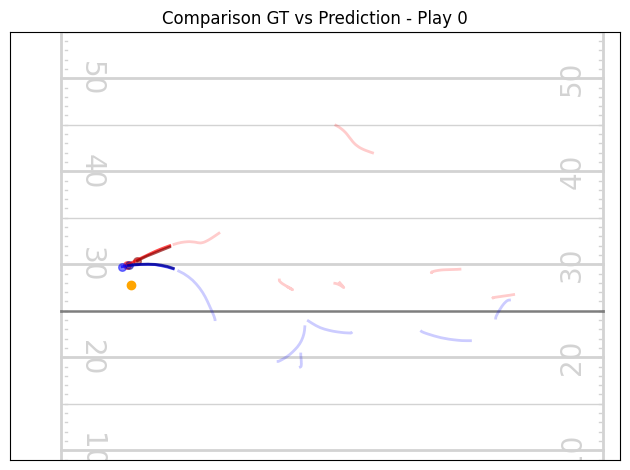

[PRE]   Player 12 mse_loss: 0.07011295855045319
[POST]  Player 12 mse_loss: 0.07273323833942413


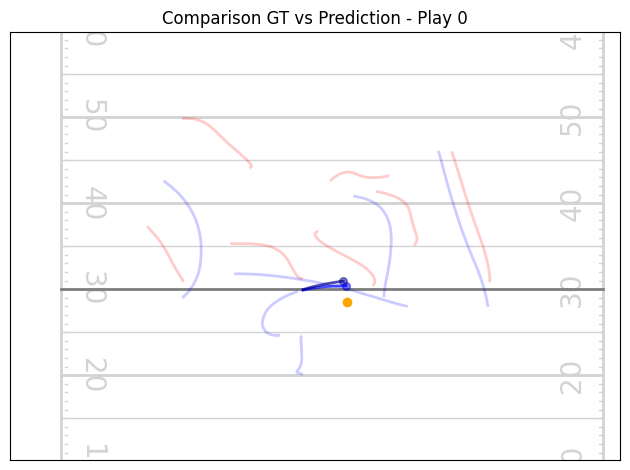

[PRE]   Player 5 mse_loss: 0.15620389580726624
[POST]  Player 5 mse_loss: 0.1521838754415512
[PRE]   Player 11 mse_loss: 0.22479234635829926
[POST]  Player 11 mse_loss: 0.22072651982307434


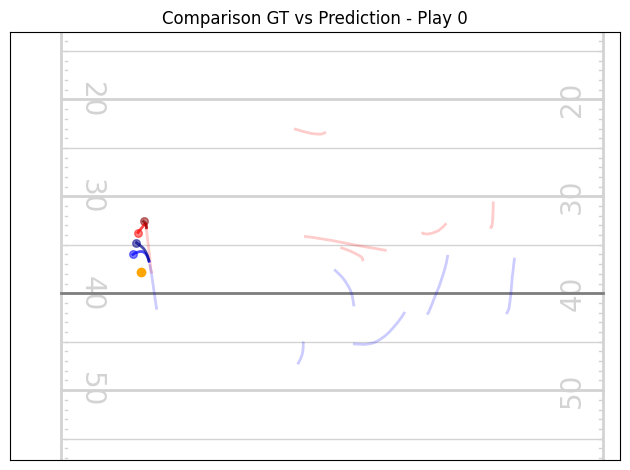

[PRE]   Player 1 mse_loss: 0.042044129222631454
[POST]  Player 1 mse_loss: 0.03102857433259487
[PRE]   Player 12 mse_loss: 0.023375865072011948
[POST]  Player 12 mse_loss: 0.019404608756303787


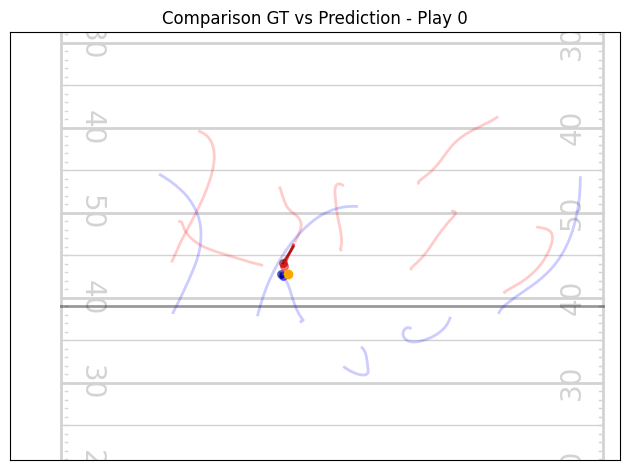

[PRE]   Player 0 mse_loss: 0.9332375526428223
[POST]  Player 0 mse_loss: 0.8928953409194946
[PRE]   Player 1 mse_loss: 1.968431830406189
[POST]  Player 1 mse_loss: 1.9705839157104492
[PRE]   Player 3 mse_loss: 0.09424881637096405
[POST]  Player 3 mse_loss: 0.09602146595716476
[PRE]   Player 12 mse_loss: 0.17742536962032318
[POST]  Player 12 mse_loss: 0.17143741250038147


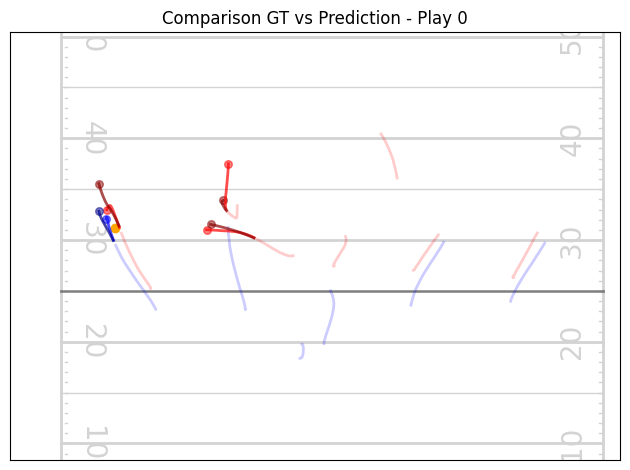

[PRE]   Player 0 mse_loss: 0.34606117010116577
[POST]  Player 0 mse_loss: 0.3344971835613251
[PRE]   Player 1 mse_loss: 0.021993858739733696
[POST]  Player 1 mse_loss: 0.028973408043384552
[PRE]   Player 2 mse_loss: 0.06799716502428055
[POST]  Player 2 mse_loss: 0.07261919230222702
[PRE]   Player 3 mse_loss: 0.4983619153499603
[POST]  Player 3 mse_loss: 0.5105364918708801
[PRE]   Player 4 mse_loss: 0.04189178720116615
[POST]  Player 4 mse_loss: 0.04052048921585083
[PRE]   Player 12 mse_loss: 0.039203960448503494
[POST]  Player 12 mse_loss: 0.0335119403898716


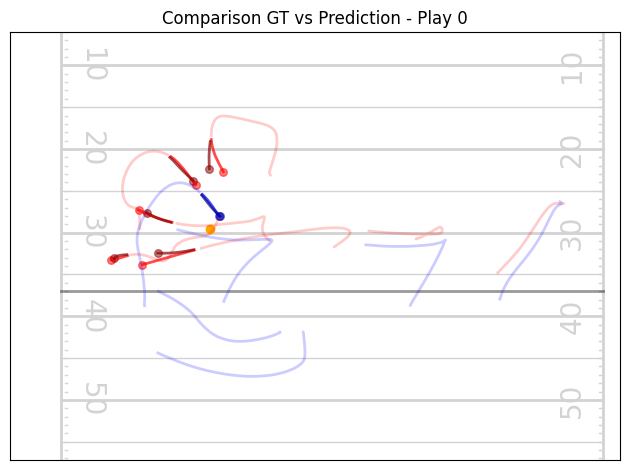

[PRE]   Player 0 mse_loss: 0.11693017929792404
[POST]  Player 0 mse_loss: 0.1017952635884285
[PRE]   Player 3 mse_loss: 0.03777439519762993
[POST]  Player 3 mse_loss: 0.04959525540471077
[PRE]   Player 9 mse_loss: 0.11140049993991852
[POST]  Player 9 mse_loss: 0.10347814112901688


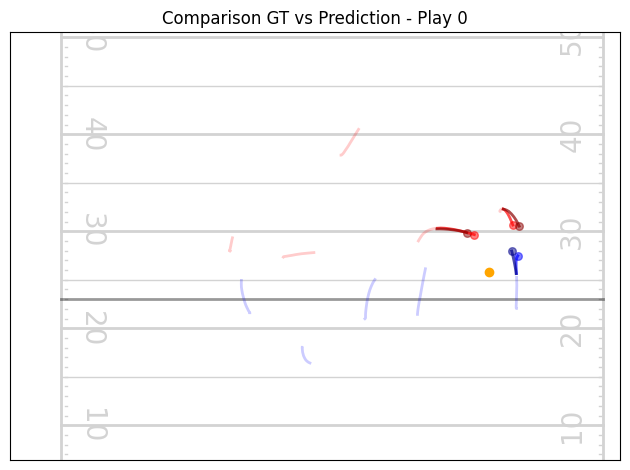

[PRE]   Player 1 mse_loss: 0.02072916552424431
[POST]  Player 1 mse_loss: 0.017302002757787704
[PRE]   Player 3 mse_loss: 0.02460445836186409
[POST]  Player 3 mse_loss: 0.026801280677318573
[PRE]   Player 4 mse_loss: 0.07296501100063324
[POST]  Player 4 mse_loss: 0.07529095560312271
[PRE]   Player 5 mse_loss: 0.22662274539470673
[POST]  Player 5 mse_loss: 0.22041571140289307
[PRE]   Player 12 mse_loss: 0.04362780600786209
[POST]  Player 12 mse_loss: 0.05398031324148178


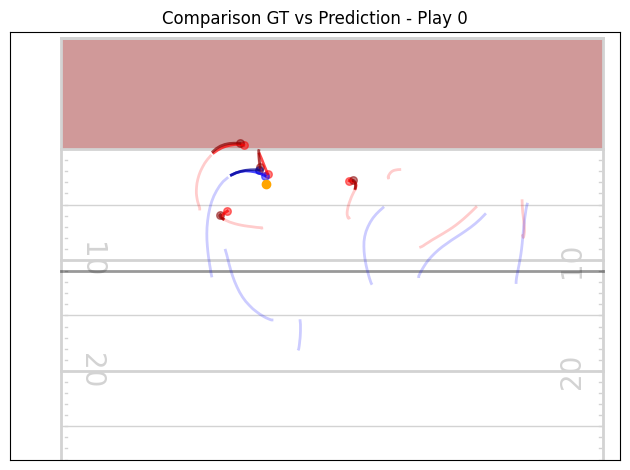

[PRE]   Player 0 mse_loss: 0.8441722393035889
[POST]  Player 0 mse_loss: 0.8403244018554688
[PRE]   Player 12 mse_loss: 0.922674834728241
[POST]  Player 12 mse_loss: 0.9378266334533691


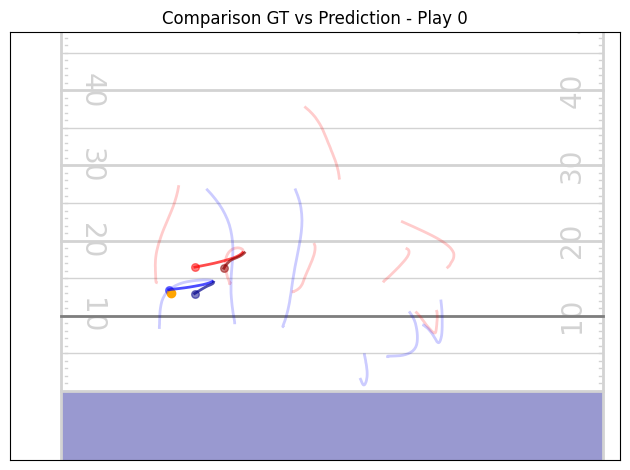

[PRE]   Player 2 mse_loss: 0.12520094215869904
[POST]  Player 2 mse_loss: 0.11045169085264206
[PRE]   Player 5 mse_loss: 0.21913538873195648
[POST]  Player 5 mse_loss: 0.2210746556520462
[PRE]   Player 12 mse_loss: 0.064832404255867
[POST]  Player 12 mse_loss: 0.07056884467601776


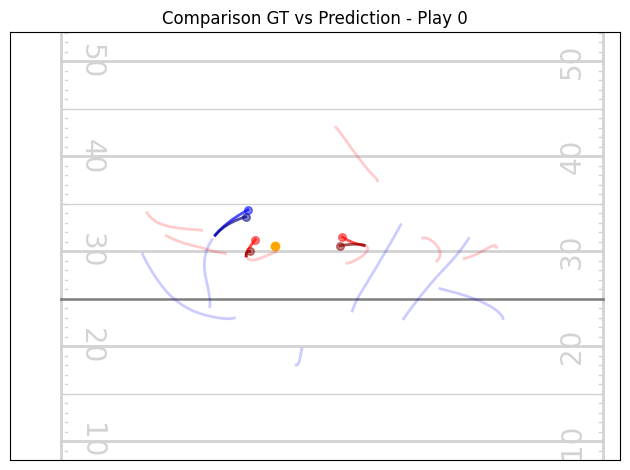

[PRE]   Player 0 mse_loss: 0.09466712921857834
[POST]  Player 0 mse_loss: 0.08560647815465927
[PRE]   Player 1 mse_loss: 0.010212145745754242
[POST]  Player 1 mse_loss: 0.015304972417652607
[PRE]   Player 4 mse_loss: 0.016702085733413696
[POST]  Player 4 mse_loss: 0.017076639458537102
[PRE]   Player 13 mse_loss: 0.051534127444028854
[POST]  Player 13 mse_loss: 0.0700642392039299


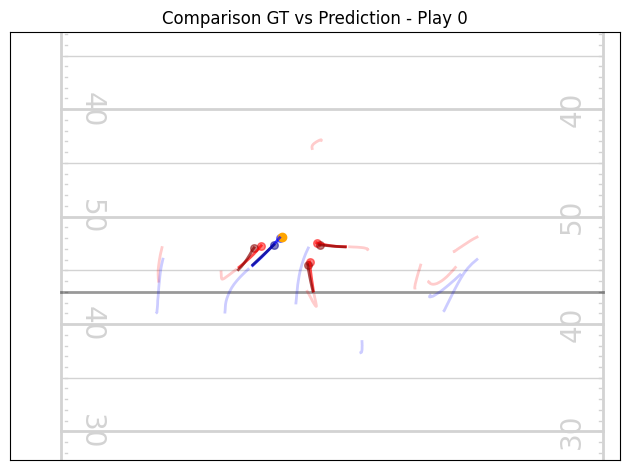

[PRE]   Player 0 mse_loss: 0.09064220637083054
[POST]  Player 0 mse_loss: 0.08861926198005676
[PRE]   Player 4 mse_loss: 0.02641071192920208
[POST]  Player 4 mse_loss: 0.03400628641247749
[PRE]   Player 11 mse_loss: 0.0358198881149292
[POST]  Player 11 mse_loss: 0.03692004084587097


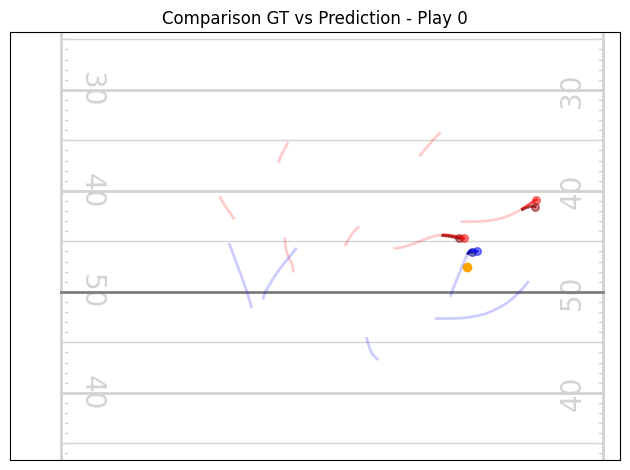

[PRE]   Player 1 mse_loss: 0.20439425110816956
[POST]  Player 1 mse_loss: 0.20285269618034363
[PRE]   Player 3 mse_loss: 0.9355300664901733
[POST]  Player 3 mse_loss: 0.939965009689331
[PRE]   Player 4 mse_loss: 0.9458960890769958
[POST]  Player 4 mse_loss: 0.9458662271499634
[PRE]   Player 11 mse_loss: 0.16176870465278625
[POST]  Player 11 mse_loss: 0.16834229230880737


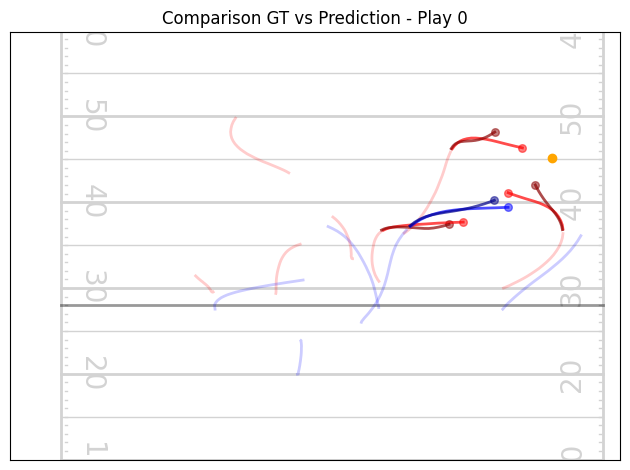

[PRE]   Player 5 mse_loss: 0.24402910470962524
[POST]  Player 5 mse_loss: 0.24577756226062775
[PRE]   Player 11 mse_loss: 0.07705174386501312
[POST]  Player 11 mse_loss: 0.07937952876091003


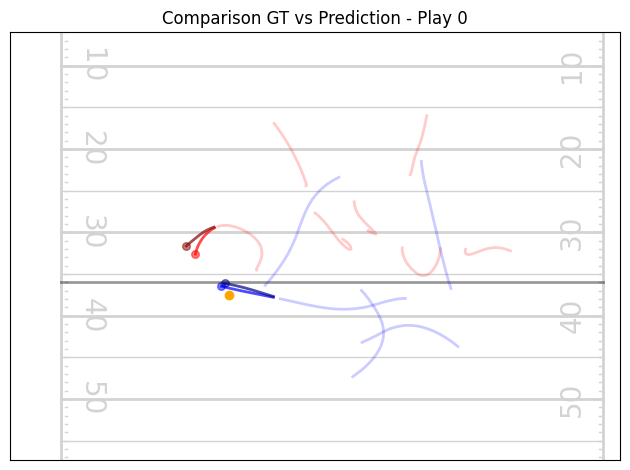

[PRE]   Player 10 mse_loss: 0.048499539494514465
[POST]  Player 10 mse_loss: 0.05171722546219826


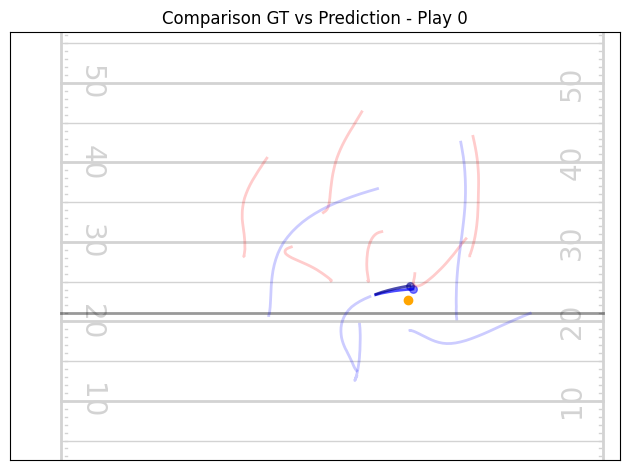

[PRE]   Player 2 mse_loss: 0.41960105299949646
[POST]  Player 2 mse_loss: 0.43674764037132263
[PRE]   Player 6 mse_loss: 0.09764617681503296
[POST]  Player 6 mse_loss: 0.09051094949245453
[PRE]   Player 12 mse_loss: 0.04824905842542648
[POST]  Player 12 mse_loss: 0.05088728666305542


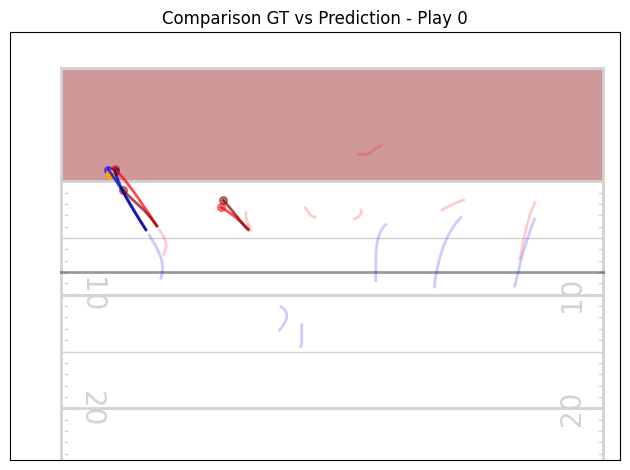

[PRE]   Player 3 mse_loss: 0.03201707825064659
[POST]  Player 3 mse_loss: 0.0413130447268486
[PRE]   Player 11 mse_loss: 0.004237735643982887
[POST]  Player 11 mse_loss: 0.01423792913556099


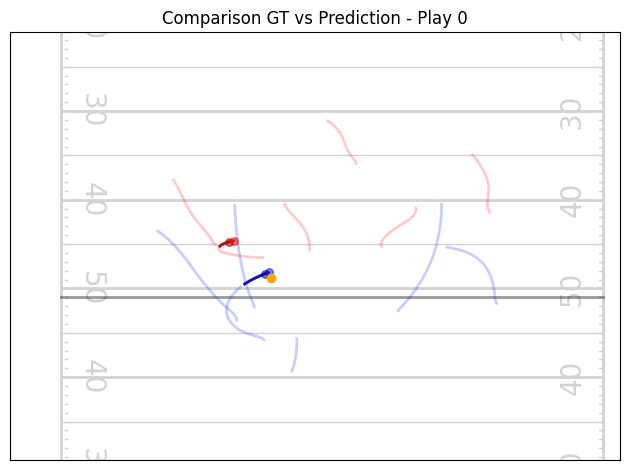

[PRE]   Player 1 mse_loss: 0.034379348158836365
[POST]  Player 1 mse_loss: 0.027545031160116196
[PRE]   Player 9 mse_loss: 0.018027091398835182
[POST]  Player 9 mse_loss: 0.019100870937108994


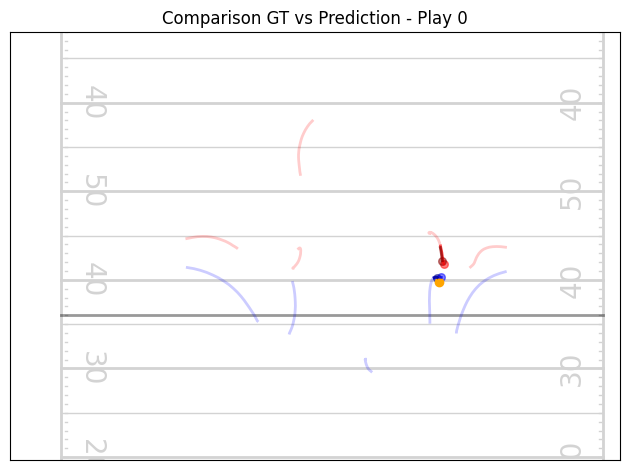

[PRE]   Player 0 mse_loss: 2.9502763748168945
[POST]  Player 0 mse_loss: 2.9309675693511963
[PRE]   Player 2 mse_loss: 3.1834499835968018
[POST]  Player 2 mse_loss: 3.187019109725952
[PRE]   Player 4 mse_loss: 0.6478264927864075
[POST]  Player 4 mse_loss: 0.6648630499839783
[PRE]   Player 12 mse_loss: 0.743388831615448
[POST]  Player 12 mse_loss: 0.7636793255805969


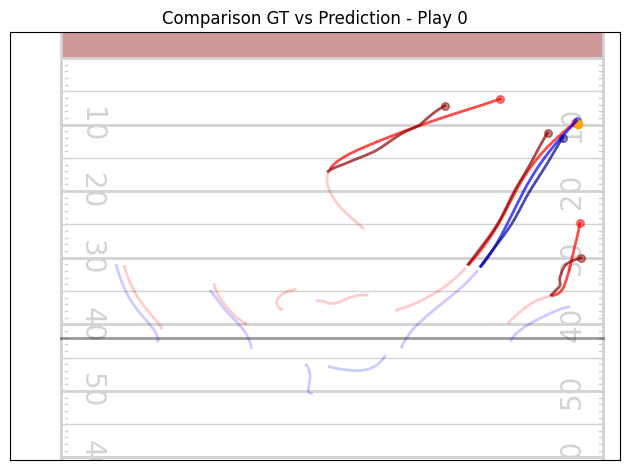

[PRE]   Player 0 mse_loss: 0.5378848314285278
[POST]  Player 0 mse_loss: 0.5150599479675293
[PRE]   Player 1 mse_loss: 0.11348051577806473
[POST]  Player 1 mse_loss: 0.10997357964515686
[PRE]   Player 2 mse_loss: 0.10612031072378159
[POST]  Player 2 mse_loss: 0.11435111612081528
[PRE]   Player 4 mse_loss: 0.12432447075843811
[POST]  Player 4 mse_loss: 0.13885828852653503
[PRE]   Player 12 mse_loss: 0.07107987999916077
[POST]  Player 12 mse_loss: 0.07110271602869034


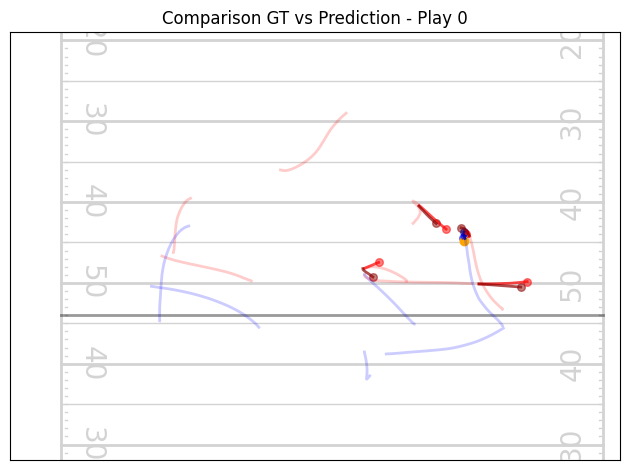

[PRE]   Player 0 mse_loss: 0.2900410592556
[POST]  Player 0 mse_loss: 0.28728505969047546
[PRE]   Player 1 mse_loss: 2.291083812713623
[POST]  Player 1 mse_loss: 2.2645957469940186
[PRE]   Player 5 mse_loss: 0.448974609375
[POST]  Player 5 mse_loss: 0.45837152004241943
[PRE]   Player 10 mse_loss: 0.04690384119749069
[POST]  Player 10 mse_loss: 0.047328609973192215


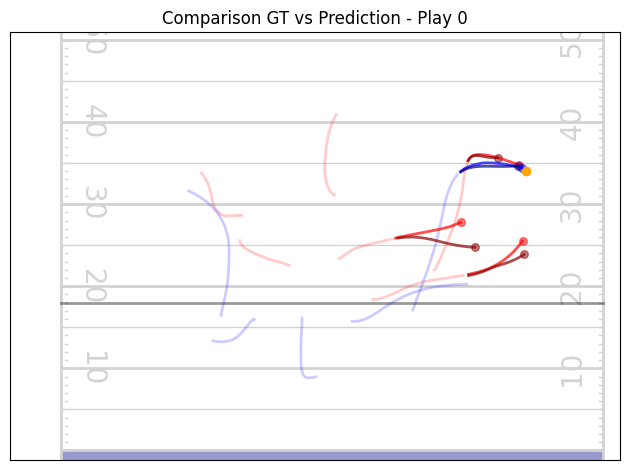

[PRE]   Player 6 mse_loss: 0.15357939898967743
[POST]  Player 6 mse_loss: 0.14393778145313263
[PRE]   Player 11 mse_loss: 0.07427244633436203
[POST]  Player 11 mse_loss: 0.07193641364574432


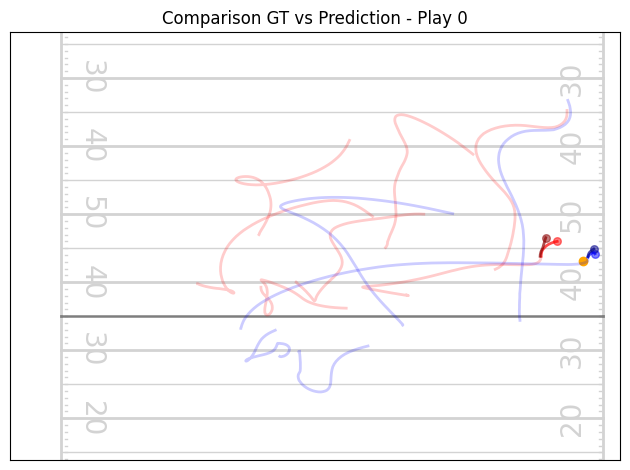

[PRE]   Player 11 mse_loss: 1.918958067893982
[POST]  Player 11 mse_loss: 1.8639860153198242


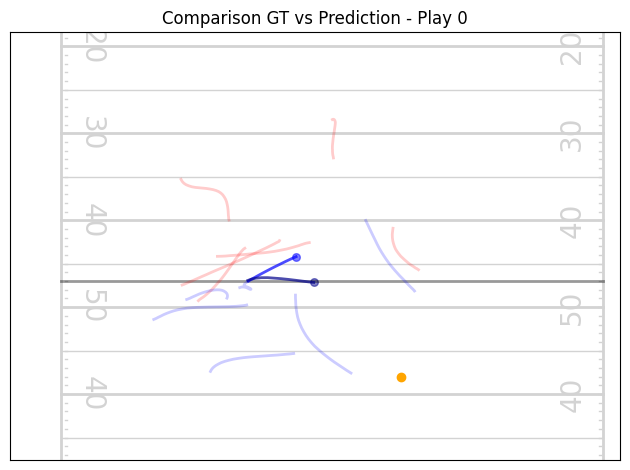

[PRE]   Player 1 mse_loss: 0.2665424048900604
[POST]  Player 1 mse_loss: 0.2822803556919098
[PRE]   Player 4 mse_loss: 0.7420719265937805
[POST]  Player 4 mse_loss: 0.689047634601593
[PRE]   Player 5 mse_loss: 0.15915247797966003
[POST]  Player 5 mse_loss: 0.15495112538337708
[PRE]   Player 11 mse_loss: 0.14997383952140808
[POST]  Player 11 mse_loss: 0.17601914703845978


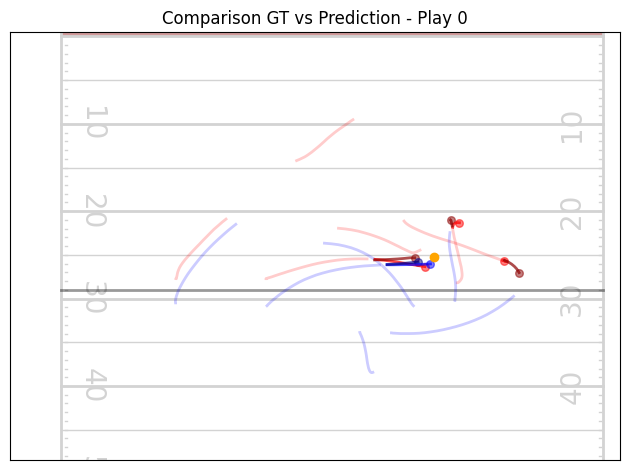

[PRE]   Player 12 mse_loss: 0.012487856671214104
[POST]  Player 12 mse_loss: 0.014300885610282421


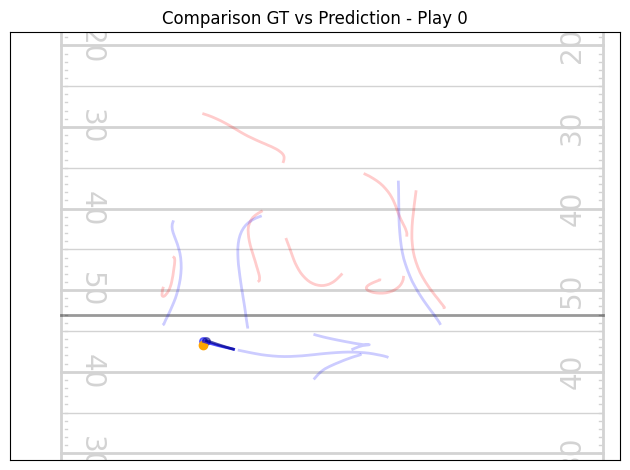

[PRE]   Player 4 mse_loss: 0.04919106513261795
[POST]  Player 4 mse_loss: 0.041112929582595825
[PRE]   Player 12 mse_loss: 0.05675206705927849
[POST]  Player 12 mse_loss: 0.046846553683280945


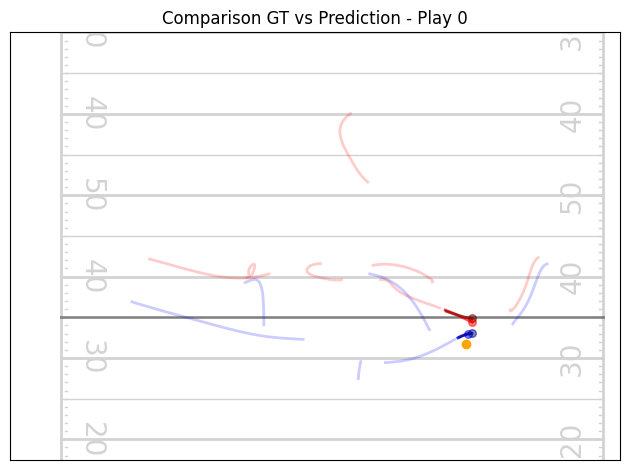

[PRE]   Player 1 mse_loss: 0.326126366853714
[POST]  Player 1 mse_loss: 0.3377416431903839
[PRE]   Player 3 mse_loss: 0.9620609879493713
[POST]  Player 3 mse_loss: 0.9605313539505005
[PRE]   Player 12 mse_loss: 0.34660783410072327
[POST]  Player 12 mse_loss: 0.3497626483440399


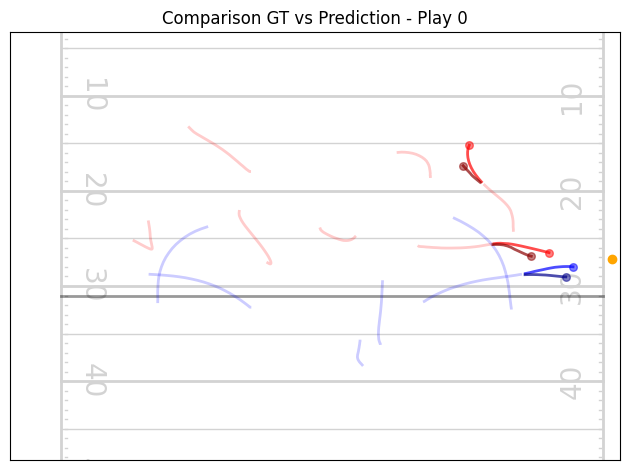

[PRE]   Player 3 mse_loss: 0.08887439966201782
[POST]  Player 3 mse_loss: 0.08936084806919098
[PRE]   Player 10 mse_loss: 0.037566088140010834
[POST]  Player 10 mse_loss: 0.034803349524736404


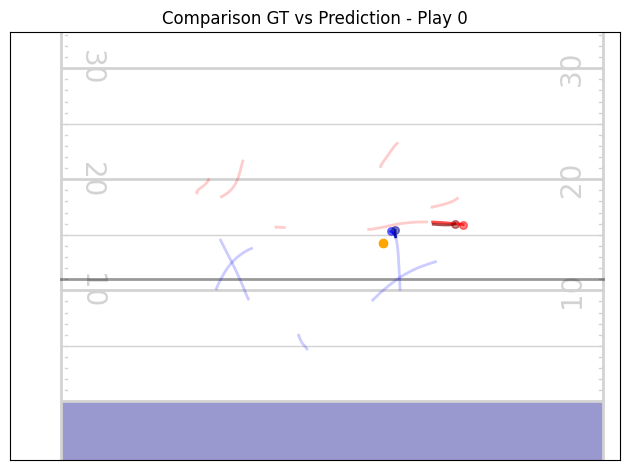

[PRE]   Player 0 mse_loss: 0.10317239165306091
[POST]  Player 0 mse_loss: 0.11780358850955963
[PRE]   Player 12 mse_loss: 0.08060301840305328
[POST]  Player 12 mse_loss: 0.1003236174583435


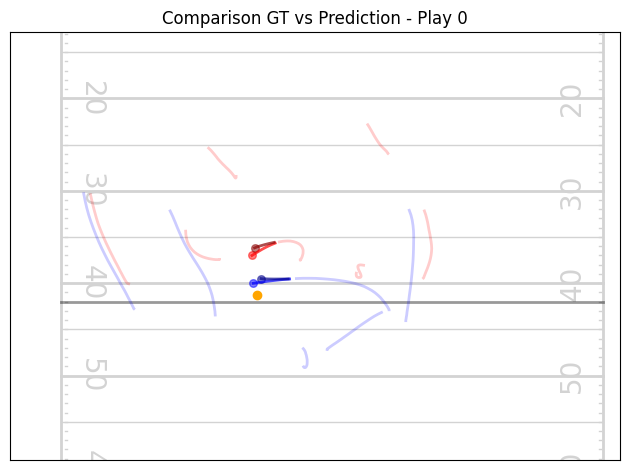

[PRE]   Player 2 mse_loss: 0.06065010279417038
[POST]  Player 2 mse_loss: 0.06864260882139206
[PRE]   Player 4 mse_loss: 0.038247425109148026
[POST]  Player 4 mse_loss: 0.030709605664014816
[PRE]   Player 6 mse_loss: 0.07679569721221924
[POST]  Player 6 mse_loss: 0.09181875735521317
[PRE]   Player 11 mse_loss: 0.03920205309987068
[POST]  Player 11 mse_loss: 0.05101998150348663


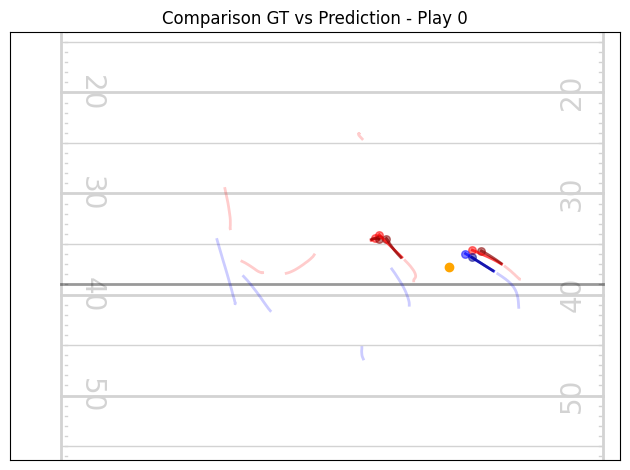

[PRE]   Player 1 mse_loss: 0.06313610076904297
[POST]  Player 1 mse_loss: 0.05519016459584236
[PRE]   Player 3 mse_loss: 0.05725804343819618
[POST]  Player 3 mse_loss: 0.054941028356552124
[PRE]   Player 11 mse_loss: 0.08380866795778275
[POST]  Player 11 mse_loss: 0.08088919520378113


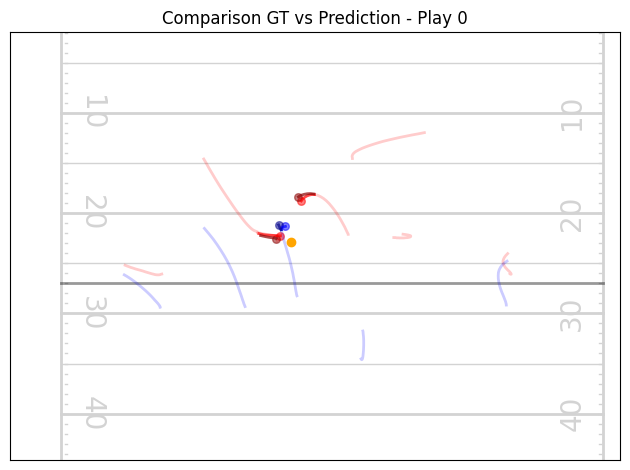

[PRE]   Player 5 mse_loss: 0.03885803744196892
[POST]  Player 5 mse_loss: 0.0336412750184536
[PRE]   Player 12 mse_loss: 0.7271487712860107
[POST]  Player 12 mse_loss: 0.746481716632843


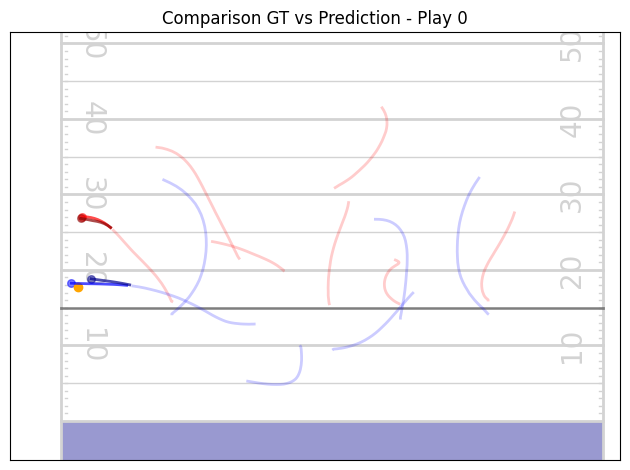

[PRE]   Player 1 mse_loss: 0.1622915267944336
[POST]  Player 1 mse_loss: 0.16489487886428833
[PRE]   Player 12 mse_loss: 0.018745502457022667
[POST]  Player 12 mse_loss: 0.022604482248425484


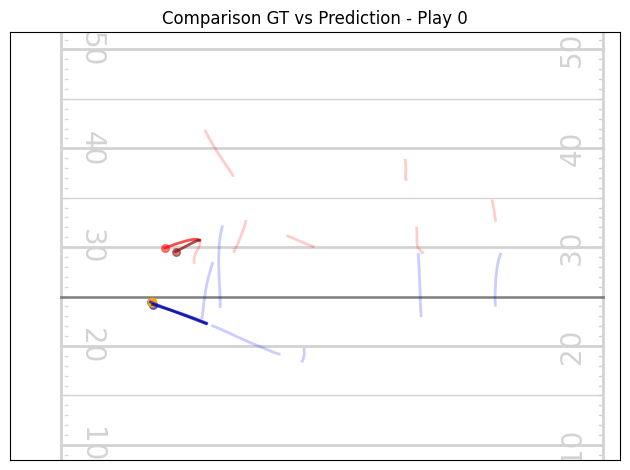

[PRE]   Player 3 mse_loss: 1.8807971477508545
[POST]  Player 3 mse_loss: 1.6059837341308594
[PRE]   Player 4 mse_loss: 1.5391910076141357
[POST]  Player 4 mse_loss: 1.5032455921173096
[PRE]   Player 6 mse_loss: 4.826887130737305
[POST]  Player 6 mse_loss: 4.778111934661865
[PRE]   Player 11 mse_loss: 0.7182167768478394
[POST]  Player 11 mse_loss: 0.7318747639656067


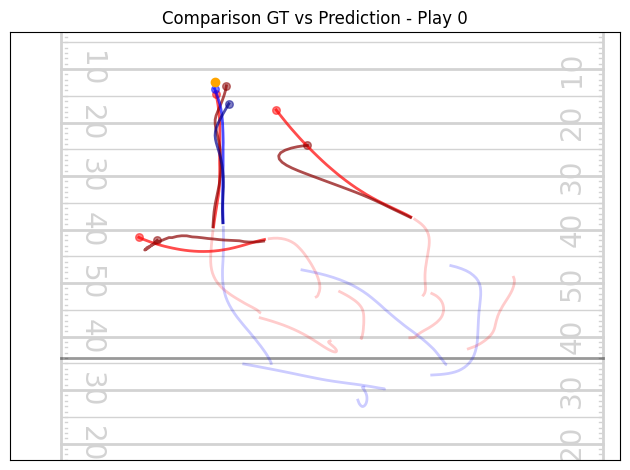

[PRE]   Player 3 mse_loss: 0.008779141120612621
[POST]  Player 3 mse_loss: 0.00720731308683753
[PRE]   Player 4 mse_loss: 0.22409777343273163
[POST]  Player 4 mse_loss: 0.1960175633430481
[PRE]   Player 12 mse_loss: 0.03974095359444618
[POST]  Player 12 mse_loss: 0.03525148704648018


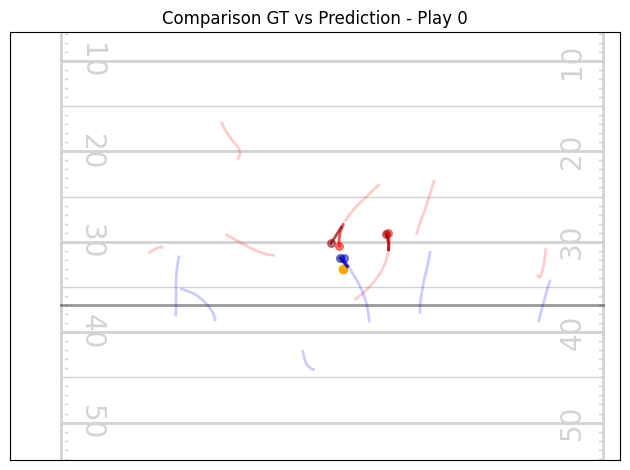

[PRE]   Player 11 mse_loss: 0.02020317316055298
[POST]  Player 11 mse_loss: 0.021136704832315445


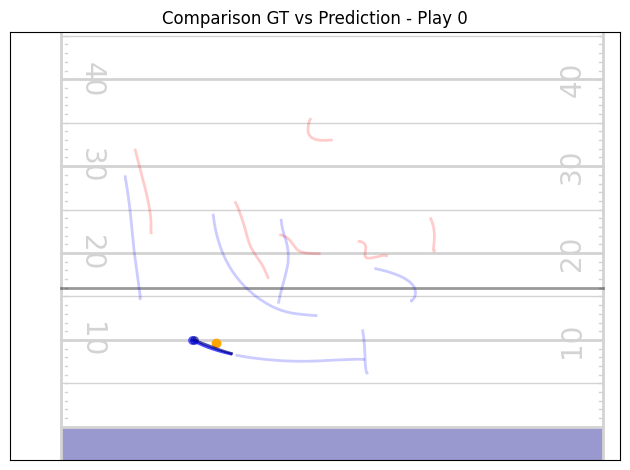

[PRE]   Player 10 mse_loss: 0.062418002635240555
[POST]  Player 10 mse_loss: 0.07718101888895035


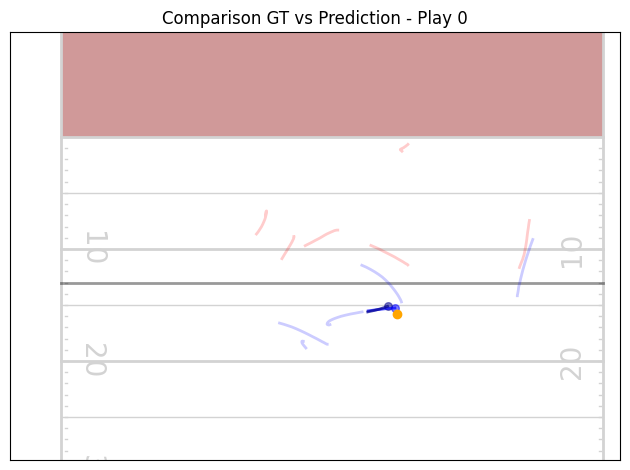

[PRE]   Player 3 mse_loss: 0.10483318567276001
[POST]  Player 3 mse_loss: 0.1123114675283432
[PRE]   Player 12 mse_loss: 0.1009725034236908
[POST]  Player 12 mse_loss: 0.10944969207048416


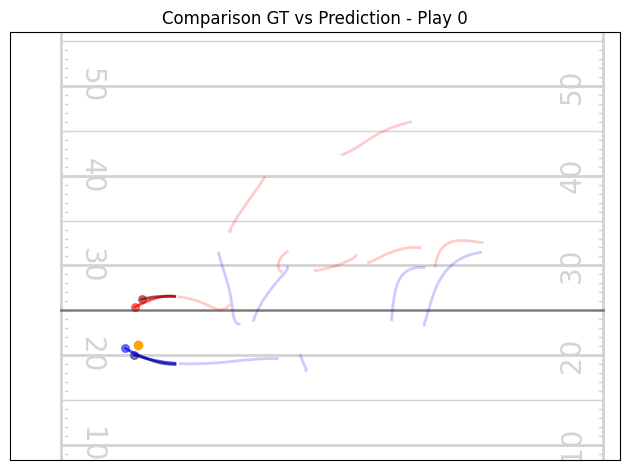

[PRE]   Player 1 mse_loss: 0.02975206822156906
[POST]  Player 1 mse_loss: 0.02154502272605896
[PRE]   Player 4 mse_loss: 0.3539740741252899
[POST]  Player 4 mse_loss: 0.36665621399879456
[PRE]   Player 6 mse_loss: 0.03861807659268379
[POST]  Player 6 mse_loss: 0.043091826140880585
[PRE]   Player 12 mse_loss: 0.024549121037125587
[POST]  Player 12 mse_loss: 0.029473543167114258


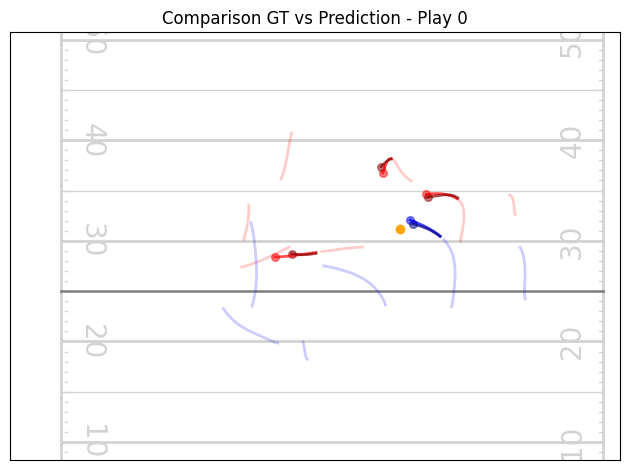

[PRE]   Player 6 mse_loss: 0.10405896604061127
[POST]  Player 6 mse_loss: 0.1156717985868454
[PRE]   Player 12 mse_loss: 0.08795719593763351
[POST]  Player 12 mse_loss: 0.10489275306463242


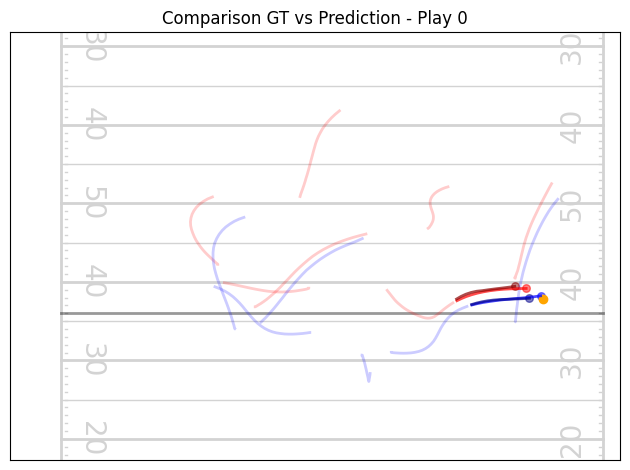

[PRE]   Player 0 mse_loss: 0.13011685013771057
[POST]  Player 0 mse_loss: 0.1414995938539505
[PRE]   Player 5 mse_loss: 0.07937119156122208
[POST]  Player 5 mse_loss: 0.07758807390928268
[PRE]   Player 10 mse_loss: 0.13909444212913513
[POST]  Player 10 mse_loss: 0.15229493379592896


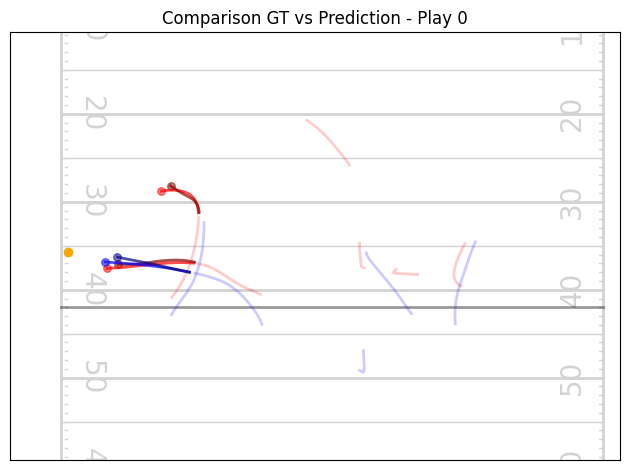

[PRE]   Player 0 mse_loss: 2.9322335720062256
[POST]  Player 0 mse_loss: 2.9029858112335205
[PRE]   Player 1 mse_loss: 0.08046531677246094
[POST]  Player 1 mse_loss: 0.0812978446483612
[PRE]   Player 3 mse_loss: 0.43906790018081665
[POST]  Player 3 mse_loss: 0.4362618923187256
[PRE]   Player 11 mse_loss: 0.1232583299279213
[POST]  Player 11 mse_loss: 0.10798908025026321


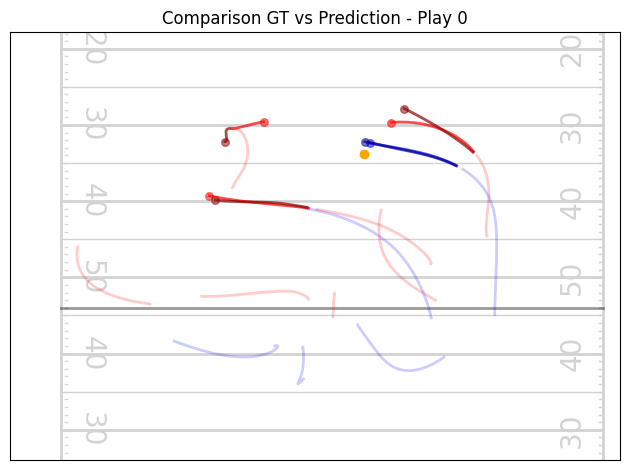

[PRE]   Player 5 mse_loss: 0.21937528252601624
[POST]  Player 5 mse_loss: 0.21837829053401947
[PRE]   Player 10 mse_loss: 1.806632161140442
[POST]  Player 10 mse_loss: 1.6999157667160034


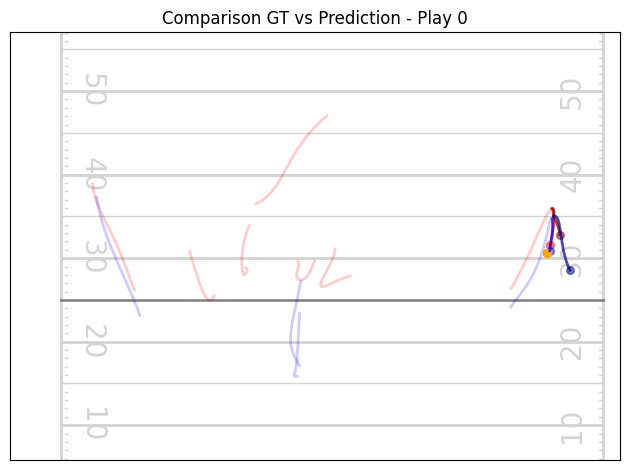

[PRE]   Player 0 mse_loss: 0.8804147243499756
[POST]  Player 0 mse_loss: 0.8765870928764343
[PRE]   Player 1 mse_loss: 0.6990106105804443
[POST]  Player 1 mse_loss: 0.7113564610481262
[PRE]   Player 3 mse_loss: 0.747369110584259
[POST]  Player 3 mse_loss: 0.760199785232544
[PRE]   Player 11 mse_loss: 0.05095663294196129
[POST]  Player 11 mse_loss: 0.04868645220994949


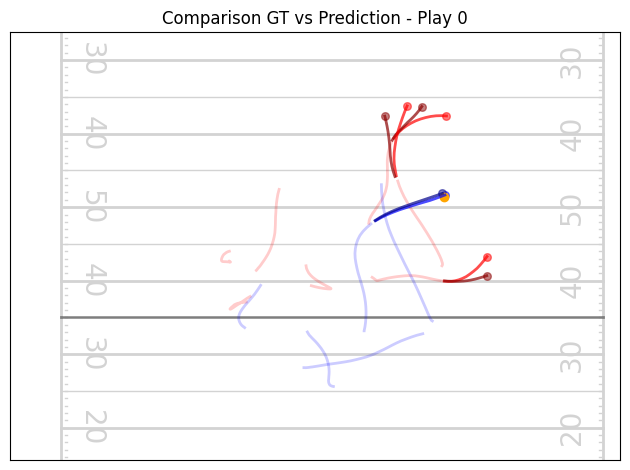

[PRE]   Player 1 mse_loss: 0.16993100941181183
[POST]  Player 1 mse_loss: 0.18147605657577515
[PRE]   Player 6 mse_loss: 0.8047555685043335
[POST]  Player 6 mse_loss: 0.8258482813835144
[PRE]   Player 12 mse_loss: 0.4265415072441101
[POST]  Player 12 mse_loss: 0.4405253827571869


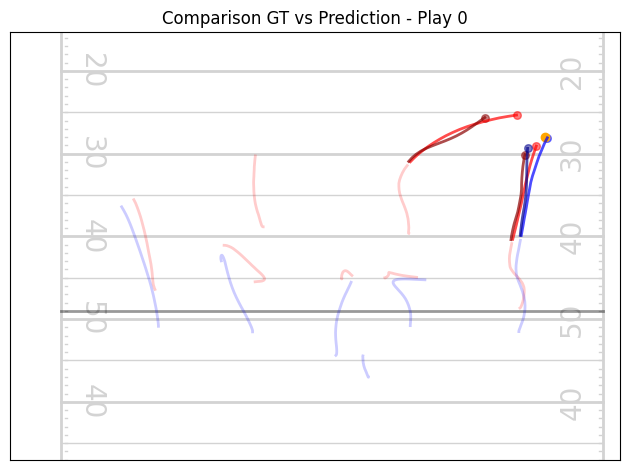

[PRE]   Player 2 mse_loss: 0.04687875509262085
[POST]  Player 2 mse_loss: 0.04763948172330856
[PRE]   Player 11 mse_loss: 0.06814534962177277
[POST]  Player 11 mse_loss: 0.07592450082302094


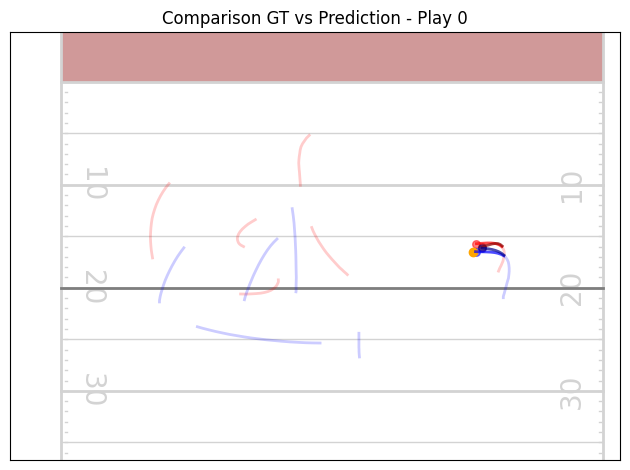

[PRE]   Player 0 mse_loss: 0.05743845924735069
[POST]  Player 0 mse_loss: 0.067110575735569
[PRE]   Player 2 mse_loss: 0.2379712164402008
[POST]  Player 2 mse_loss: 0.23973210155963898
[PRE]   Player 5 mse_loss: 0.00784169603139162
[POST]  Player 5 mse_loss: 0.00712813762947917
[PRE]   Player 11 mse_loss: 0.025316832587122917
[POST]  Player 11 mse_loss: 0.026585286483168602


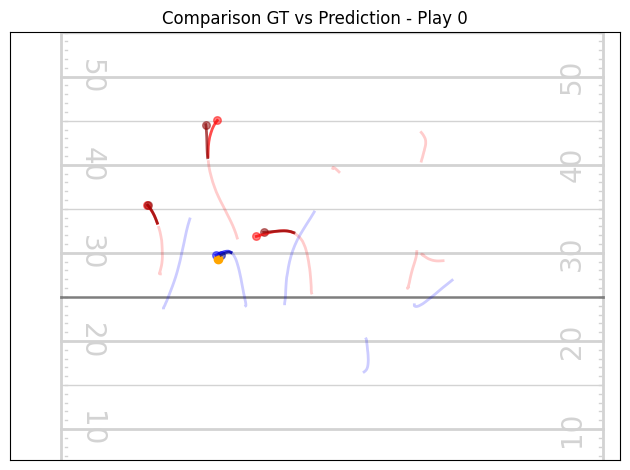

[PRE]   Player 1 mse_loss: 0.5936402678489685
[POST]  Player 1 mse_loss: 0.3333570957183838
[PRE]   Player 12 mse_loss: 0.005994786974042654
[POST]  Player 12 mse_loss: 0.004980884026736021


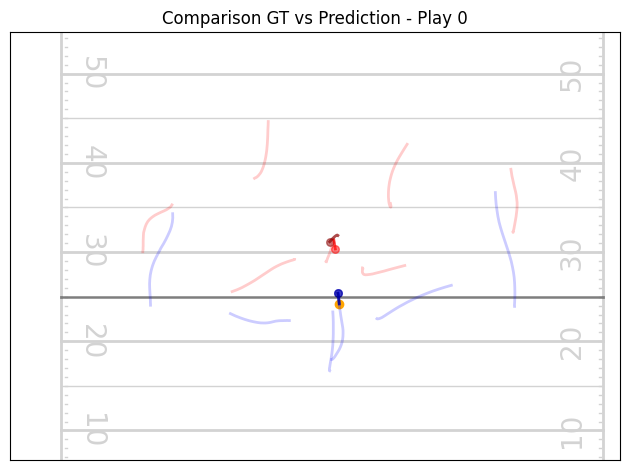

[PRE]   Player 1 mse_loss: 0.3547082543373108
[POST]  Player 1 mse_loss: 0.35492393374443054
[PRE]   Player 3 mse_loss: 0.3585260808467865
[POST]  Player 3 mse_loss: 0.35032492876052856
[PRE]   Player 11 mse_loss: 0.18125836551189423
[POST]  Player 11 mse_loss: 0.2220645397901535


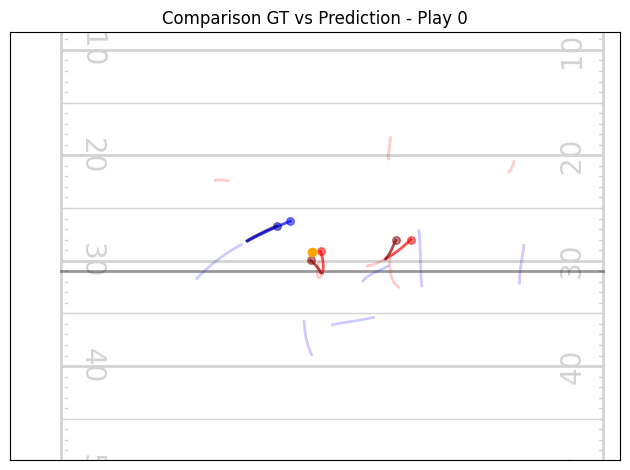

[PRE]   Player 2 mse_loss: 0.35922345519065857
[POST]  Player 2 mse_loss: 0.34878799319267273
[PRE]   Player 3 mse_loss: 0.31148284673690796
[POST]  Player 3 mse_loss: 0.29806190729141235
[PRE]   Player 5 mse_loss: 0.6736542582511902
[POST]  Player 5 mse_loss: 0.5924323797225952
[PRE]   Player 12 mse_loss: 0.24256792664527893
[POST]  Player 12 mse_loss: 0.2624706029891968


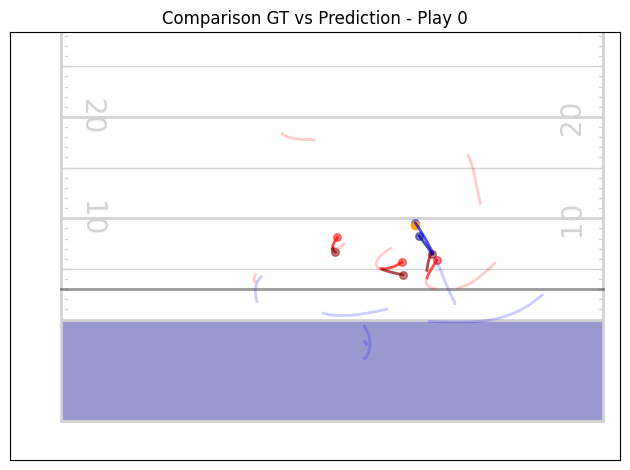

[PRE]   Player 5 mse_loss: 0.09212278574705124
[POST]  Player 5 mse_loss: 0.09549935162067413
[PRE]   Player 12 mse_loss: 0.017421012744307518
[POST]  Player 12 mse_loss: 0.02982274442911148


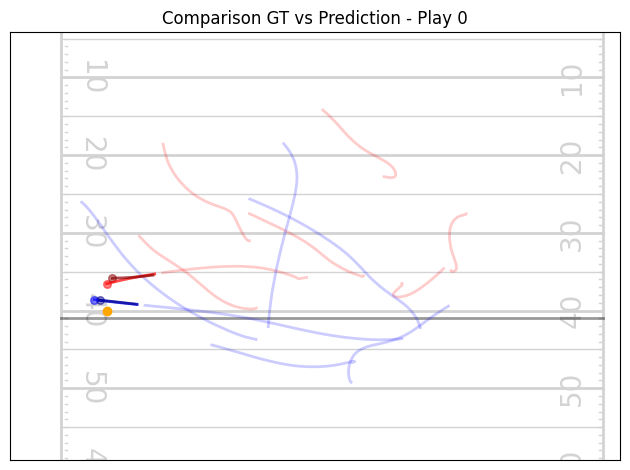

[PRE]   Player 5 mse_loss: 0.016166087239980698
[POST]  Player 5 mse_loss: 0.02286919206380844
[PRE]   Player 12 mse_loss: 0.015181699767708778
[POST]  Player 12 mse_loss: 0.021676290780305862


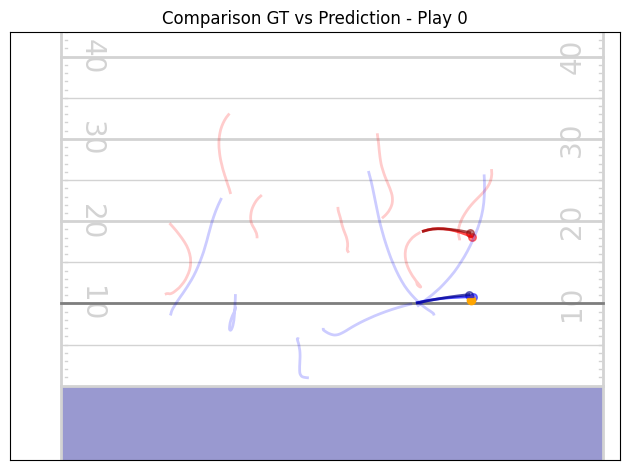

[PRE]   Player 2 mse_loss: 1.0275532007217407
[POST]  Player 2 mse_loss: 1.037469506263733
[PRE]   Player 3 mse_loss: 0.08607646077871323
[POST]  Player 3 mse_loss: 0.08973842859268188
[PRE]   Player 5 mse_loss: 4.284591197967529
[POST]  Player 5 mse_loss: 4.282690525054932
[PRE]   Player 12 mse_loss: 5.403212070465088
[POST]  Player 12 mse_loss: 5.396816730499268


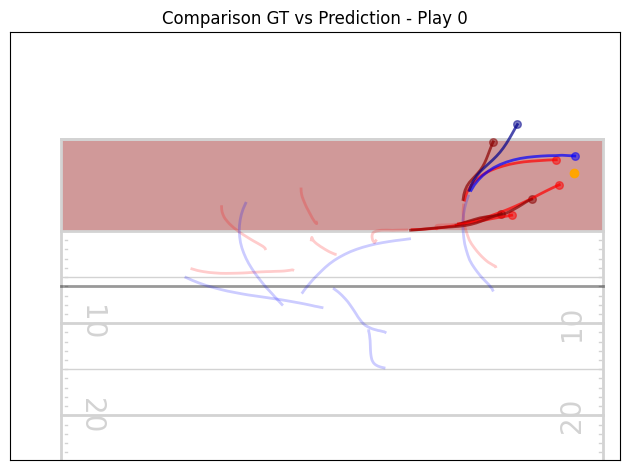

[PRE]   Player 1 mse_loss: 0.060424283146858215
[POST]  Player 1 mse_loss: 0.048311442136764526
[PRE]   Player 2 mse_loss: 0.1212645024061203
[POST]  Player 2 mse_loss: 0.11699480563402176
[PRE]   Player 3 mse_loss: 0.12830877304077148
[POST]  Player 3 mse_loss: 0.11425197124481201
[PRE]   Player 12 mse_loss: 0.03797629475593567
[POST]  Player 12 mse_loss: 0.04914822429418564


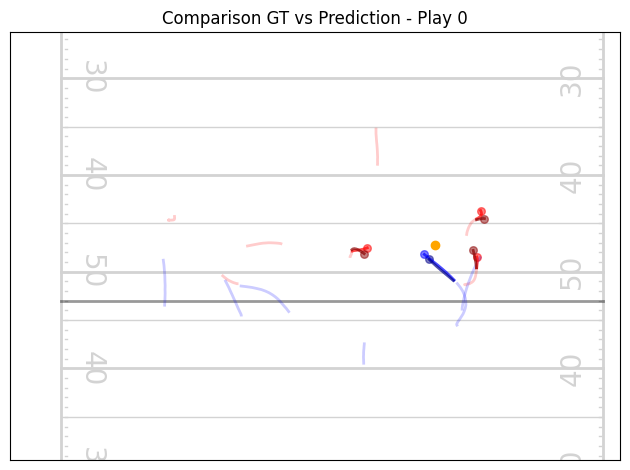

[PRE]   Player 2 mse_loss: 0.028422920033335686
[POST]  Player 2 mse_loss: 0.01913399063050747
[PRE]   Player 5 mse_loss: 0.012720733880996704
[POST]  Player 5 mse_loss: 0.01421805378049612
[PRE]   Player 12 mse_loss: 0.051021184772253036
[POST]  Player 12 mse_loss: 0.04490569233894348


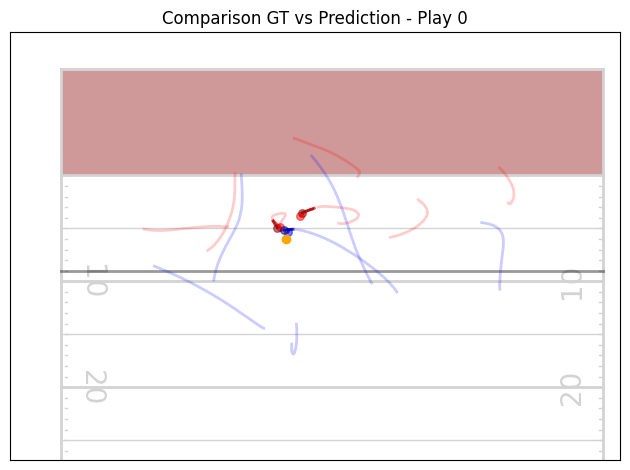

[PRE]   Player 2 mse_loss: 0.5878203511238098
[POST]  Player 2 mse_loss: 0.5627242922782898
[PRE]   Player 4 mse_loss: 0.10783474892377853
[POST]  Player 4 mse_loss: 0.11439130455255508
[PRE]   Player 5 mse_loss: 1.0935677289962769
[POST]  Player 5 mse_loss: 1.1058012247085571
[PRE]   Player 12 mse_loss: 0.017809180542826653
[POST]  Player 12 mse_loss: 0.017989538609981537


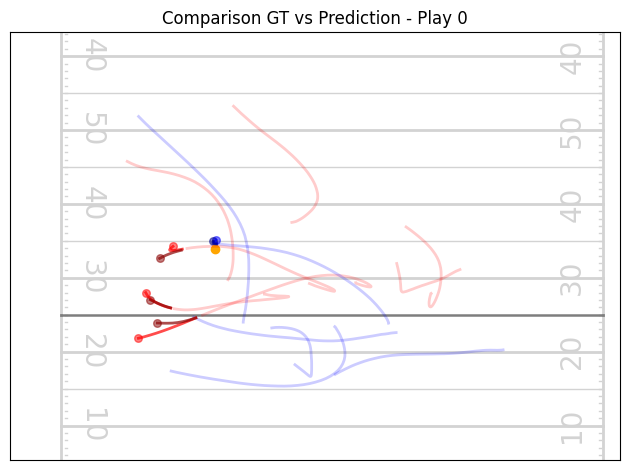

[PRE]   Player 3 mse_loss: 0.5466814041137695
[POST]  Player 3 mse_loss: 0.5673157572746277
[PRE]   Player 12 mse_loss: 0.3415759801864624
[POST]  Player 12 mse_loss: 0.31908300518989563


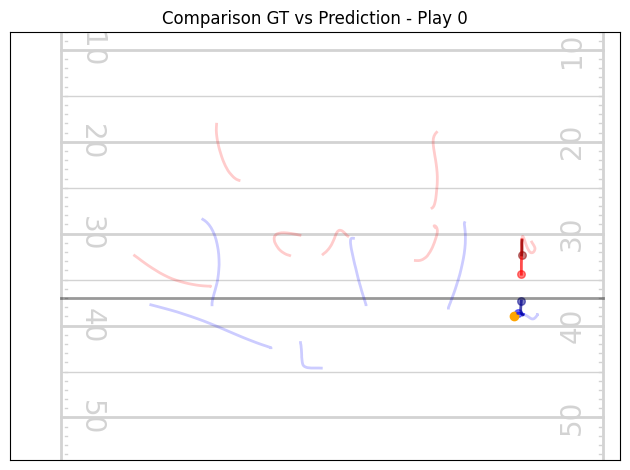

[PRE]   Player 2 mse_loss: 0.060020562261343
[POST]  Player 2 mse_loss: 0.05792677029967308
[PRE]   Player 5 mse_loss: 0.011677457951009274
[POST]  Player 5 mse_loss: 0.0122903510928154
[PRE]   Player 13 mse_loss: 0.02263456955552101
[POST]  Player 13 mse_loss: 0.021253500133752823


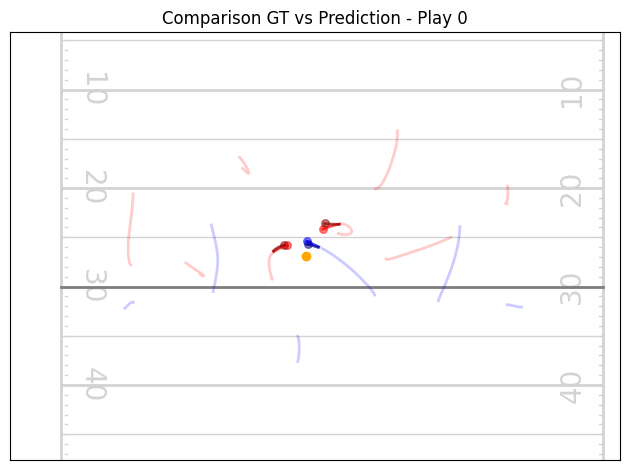

[PRE]   Player 5 mse_loss: 0.2586137056350708
[POST]  Player 5 mse_loss: 0.27277877926826477
[PRE]   Player 11 mse_loss: 0.21497222781181335
[POST]  Player 11 mse_loss: 0.22267989814281464


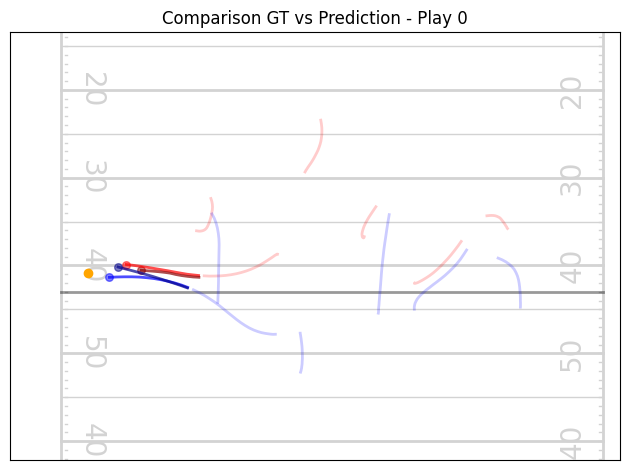

[PRE]   Player 0 mse_loss: 2.348541736602783
[POST]  Player 0 mse_loss: 2.354999303817749
[PRE]   Player 3 mse_loss: 1.7129191160202026
[POST]  Player 3 mse_loss: 1.7385550737380981
[PRE]   Player 5 mse_loss: 2.8891732692718506
[POST]  Player 5 mse_loss: 2.8711962699890137
[PRE]   Player 10 mse_loss: 0.2825906276702881
[POST]  Player 10 mse_loss: 0.2863774299621582


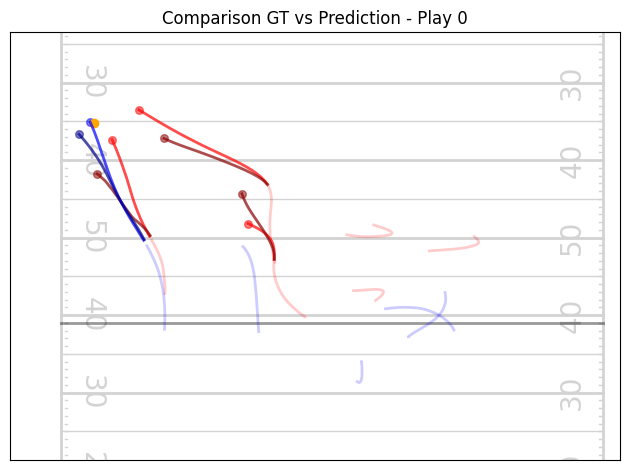

[PRE]   Player 0 mse_loss: 0.0815742015838623
[POST]  Player 0 mse_loss: 0.08719365298748016
[PRE]   Player 2 mse_loss: 0.08416608721017838
[POST]  Player 2 mse_loss: 0.097682423889637
[PRE]   Player 3 mse_loss: 0.07357523590326309
[POST]  Player 3 mse_loss: 0.05928569287061691
[PRE]   Player 4 mse_loss: 0.04709313437342644
[POST]  Player 4 mse_loss: 0.044447917491197586
[PRE]   Player 11 mse_loss: 0.055203743278980255
[POST]  Player 11 mse_loss: 0.06769200414419174


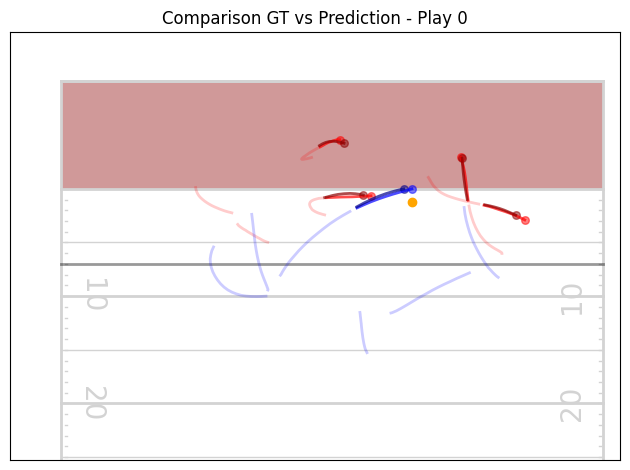

[PRE]   Player 1 mse_loss: 0.24521513283252716
[POST]  Player 1 mse_loss: 0.23797069489955902
[PRE]   Player 6 mse_loss: 2.0936639308929443
[POST]  Player 6 mse_loss: 2.1033384799957275
[PRE]   Player 11 mse_loss: 0.07829585671424866
[POST]  Player 11 mse_loss: 0.06868615746498108


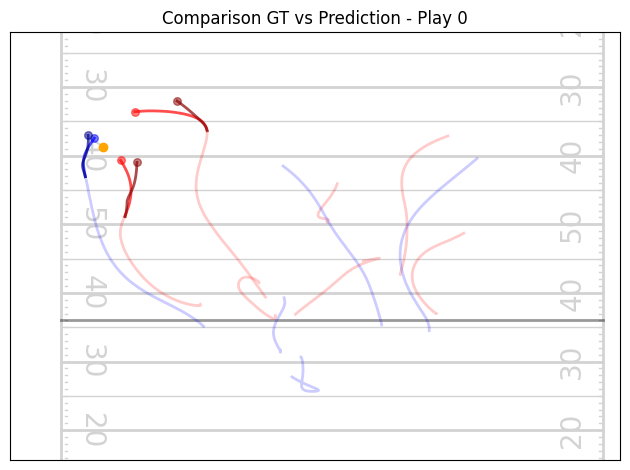

[PRE]   Player 1 mse_loss: 0.1504105180501938
[POST]  Player 1 mse_loss: 0.17086556553840637
[PRE]   Player 2 mse_loss: 0.30267438292503357
[POST]  Player 2 mse_loss: 0.28028202056884766
[PRE]   Player 12 mse_loss: 0.0755036473274231
[POST]  Player 12 mse_loss: 0.08447679877281189


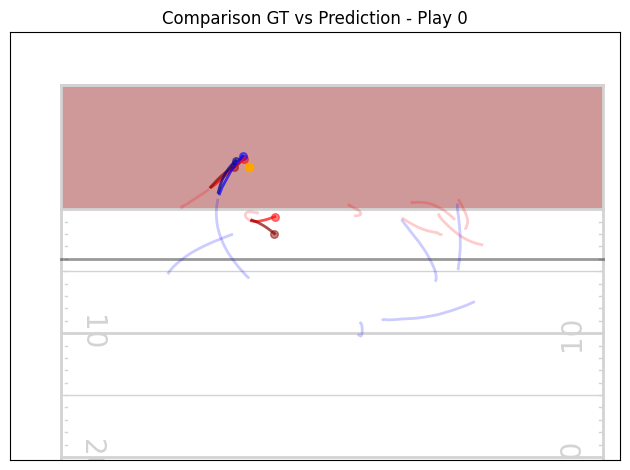

[PRE]   Player 0 mse_loss: 0.06953886896371841
[POST]  Player 0 mse_loss: 0.055796947330236435
[PRE]   Player 2 mse_loss: 0.0811866819858551
[POST]  Player 2 mse_loss: 0.09409597516059875
[PRE]   Player 4 mse_loss: 0.0876457616686821
[POST]  Player 4 mse_loss: 0.09059364348649979
[PRE]   Player 5 mse_loss: 0.5116530656814575
[POST]  Player 5 mse_loss: 0.5417137742042542
[PRE]   Player 11 mse_loss: 0.1995047628879547
[POST]  Player 11 mse_loss: 0.22379007935523987


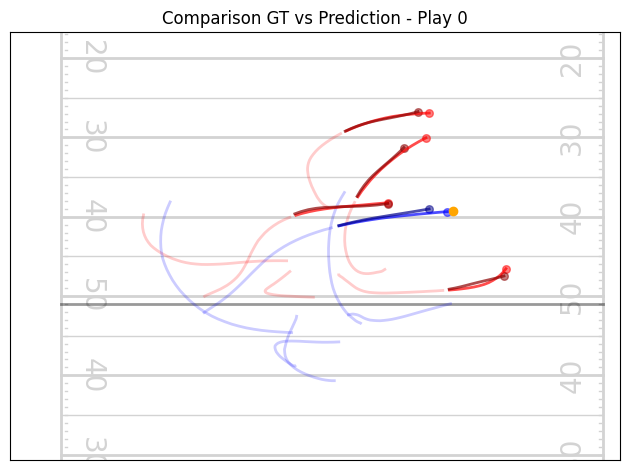

[PRE]   Player 12 mse_loss: 0.009947250597178936
[POST]  Player 12 mse_loss: 0.009646376594901085


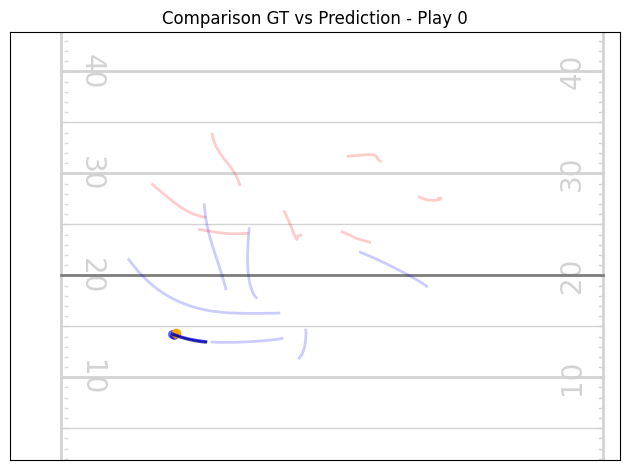

[PRE]   Player 0 mse_loss: 0.26057374477386475
[POST]  Player 0 mse_loss: 0.24212299287319183
[PRE]   Player 11 mse_loss: 0.10785803943872452
[POST]  Player 11 mse_loss: 0.09601767361164093


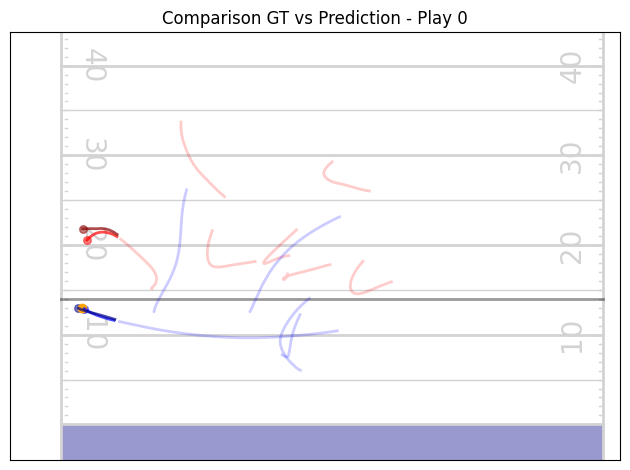

[PRE]   Player 1 mse_loss: 0.14242786169052124
[POST]  Player 1 mse_loss: 0.13676592707633972
[PRE]   Player 2 mse_loss: 0.2359616458415985
[POST]  Player 2 mse_loss: 0.22218310832977295
[PRE]   Player 3 mse_loss: 0.06981221586465836
[POST]  Player 3 mse_loss: 0.07160592079162598
[PRE]   Player 4 mse_loss: 0.042419955134391785
[POST]  Player 4 mse_loss: 0.03844881057739258
[PRE]   Player 6 mse_loss: 0.03954894840717316
[POST]  Player 6 mse_loss: 0.04025682061910629
[PRE]   Player 12 mse_loss: 0.22252768278121948
[POST]  Player 12 mse_loss: 0.22724293172359467


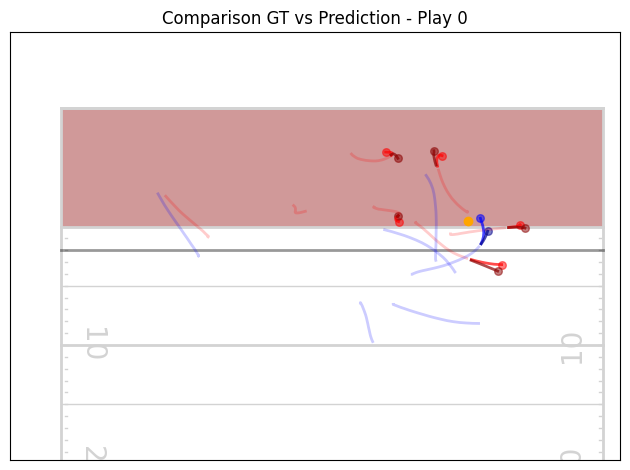

[PRE]   Player 3 mse_loss: 0.29184097051620483
[POST]  Player 3 mse_loss: 0.2896074056625366
[PRE]   Player 4 mse_loss: 0.4357108473777771
[POST]  Player 4 mse_loss: 0.3839876353740692
[PRE]   Player 12 mse_loss: 0.27530962228775024
[POST]  Player 12 mse_loss: 0.2761708199977875


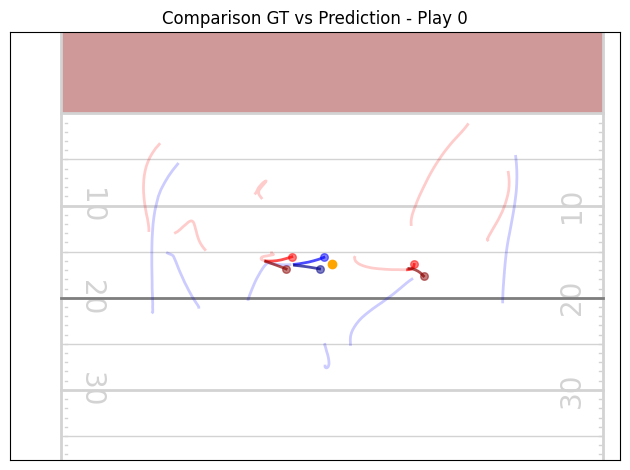

[PRE]   Player 0 mse_loss: 0.05478527024388313
[POST]  Player 0 mse_loss: 0.07594683766365051
[PRE]   Player 3 mse_loss: 0.4835846722126007
[POST]  Player 3 mse_loss: 0.4758765995502472
[PRE]   Player 5 mse_loss: 0.2527061998844147
[POST]  Player 5 mse_loss: 0.23950454592704773
[PRE]   Player 12 mse_loss: 0.1171794906258583
[POST]  Player 12 mse_loss: 0.14061878621578217


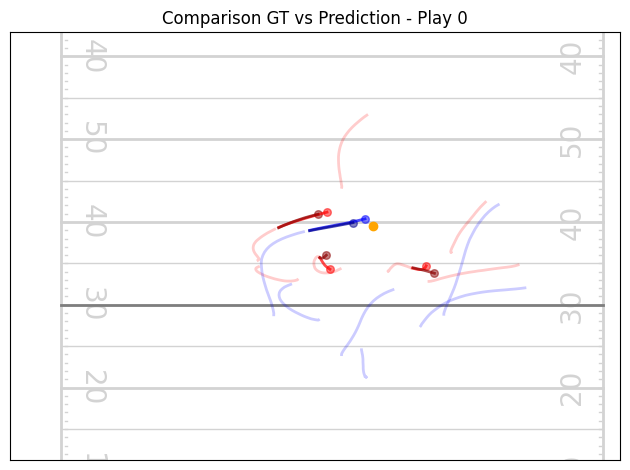

[PRE]   Player 0 mse_loss: 0.44310811161994934
[POST]  Player 0 mse_loss: 0.4200708866119385
[PRE]   Player 2 mse_loss: 2.4404966831207275
[POST]  Player 2 mse_loss: 2.4676811695098877
[PRE]   Player 4 mse_loss: 0.18510617315769196
[POST]  Player 4 mse_loss: 0.18679481744766235
[PRE]   Player 9 mse_loss: 0.11620800197124481
[POST]  Player 9 mse_loss: 0.12191778421401978


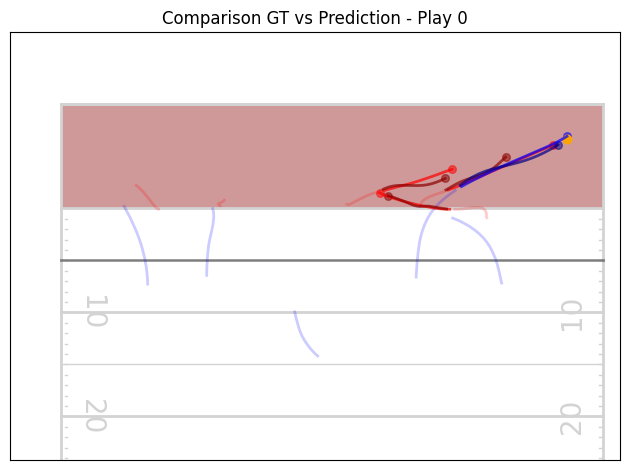

[PRE]   Player 2 mse_loss: 0.014217227697372437
[POST]  Player 2 mse_loss: 0.02203279361128807
[PRE]   Player 3 mse_loss: 0.09214391559362411
[POST]  Player 3 mse_loss: 0.10358364880084991
[PRE]   Player 4 mse_loss: 0.05461151897907257
[POST]  Player 4 mse_loss: 0.06080799549818039
[PRE]   Player 12 mse_loss: 0.02297068201005459
[POST]  Player 12 mse_loss: 0.01903904601931572


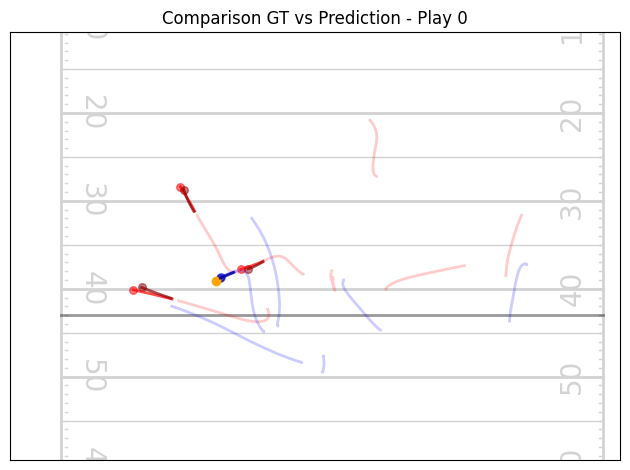

[PRE]   Player 3 mse_loss: 5.107816696166992
[POST]  Player 3 mse_loss: 5.070613861083984
[PRE]   Player 4 mse_loss: 0.1672997772693634
[POST]  Player 4 mse_loss: 0.16331295669078827
[PRE]   Player 5 mse_loss: 2.4131710529327393
[POST]  Player 5 mse_loss: 2.421255588531494
[PRE]   Player 11 mse_loss: 0.71495121717453
[POST]  Player 11 mse_loss: 0.7285134196281433


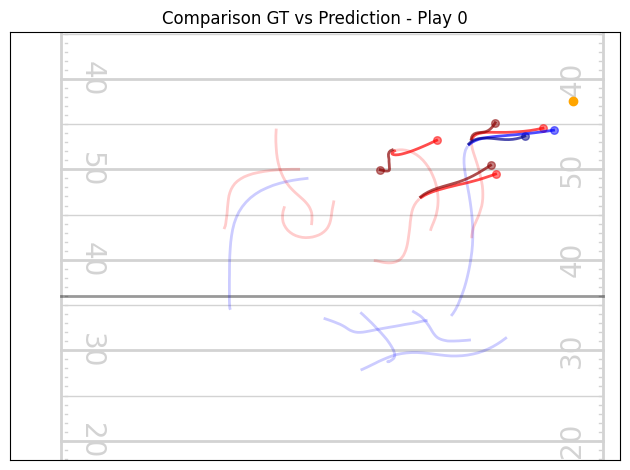

[PRE]   Player 3 mse_loss: 0.07536695897579193
[POST]  Player 3 mse_loss: 0.05796613544225693
[PRE]   Player 4 mse_loss: 0.10217843949794769
[POST]  Player 4 mse_loss: 0.0982847809791565
[PRE]   Player 5 mse_loss: 0.34609031677246094
[POST]  Player 5 mse_loss: 0.3577722907066345
[PRE]   Player 6 mse_loss: 1.0042996406555176
[POST]  Player 6 mse_loss: 0.9924671053886414
[PRE]   Player 12 mse_loss: 0.4477022588253021
[POST]  Player 12 mse_loss: 0.46231162548065186


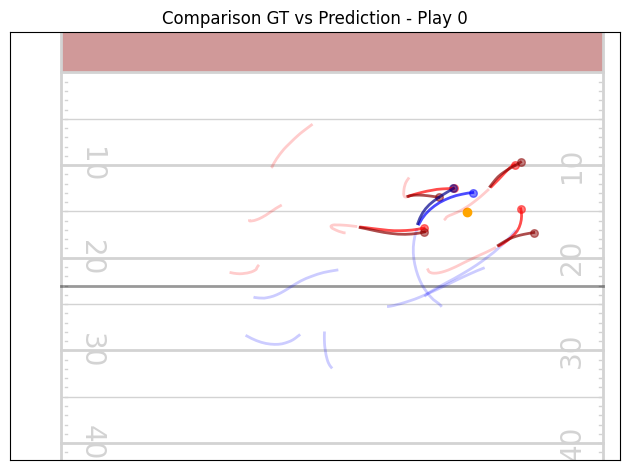

[PRE]   Player 12 mse_loss: 0.040812842547893524
[POST]  Player 12 mse_loss: 0.060117267072200775


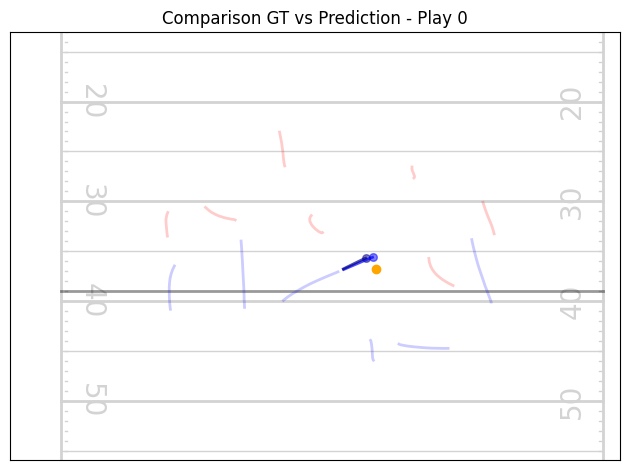

[PRE]   Player 2 mse_loss: 551.5986938476562
[POST]  Player 2 mse_loss: 344.528076171875
[PRE]   Player 4 mse_loss: 319.121826171875
[POST]  Player 4 mse_loss: 271.3703308105469
[PRE]   Player 6 mse_loss: 216.22097778320312
[POST]  Player 6 mse_loss: 191.85011291503906
[PRE]   Player 11 mse_loss: 263.41815185546875
[POST]  Player 11 mse_loss: 239.59950256347656


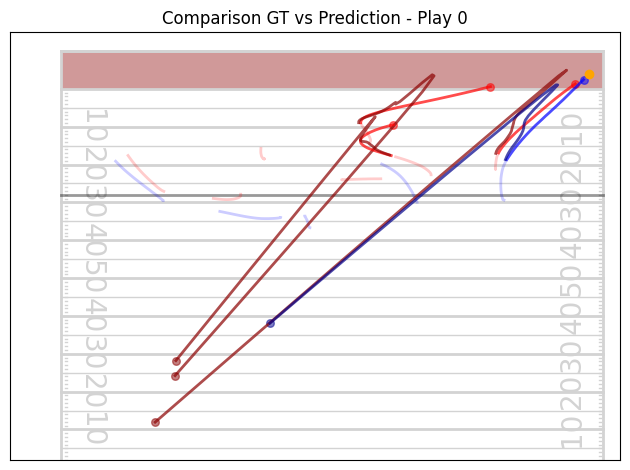

[PRE]   Player 0 mse_loss: 0.21560624241828918
[POST]  Player 0 mse_loss: 0.20995201170444489
[PRE]   Player 1 mse_loss: 0.8318607807159424
[POST]  Player 1 mse_loss: 0.8624265193939209
[PRE]   Player 2 mse_loss: 0.35510388016700745
[POST]  Player 2 mse_loss: 0.3758487403392792
[PRE]   Player 3 mse_loss: 0.1759425550699234
[POST]  Player 3 mse_loss: 0.18827562034130096
[PRE]   Player 5 mse_loss: 1.7586582899093628
[POST]  Player 5 mse_loss: 1.751610517501831
[PRE]   Player 11 mse_loss: 0.056787725538015366
[POST]  Player 11 mse_loss: 0.06644455343484879


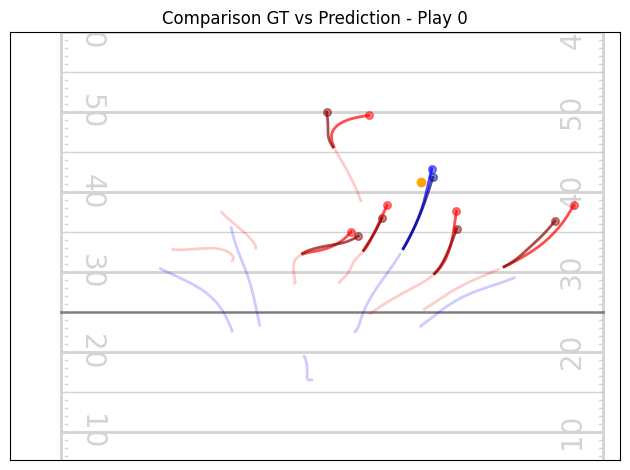

[PRE]   Player 1 mse_loss: 0.11934145539999008
[POST]  Player 1 mse_loss: 0.1051475778222084
[PRE]   Player 4 mse_loss: 0.20515145361423492
[POST]  Player 4 mse_loss: 0.20350342988967896
[PRE]   Player 12 mse_loss: 0.07664614915847778
[POST]  Player 12 mse_loss: 0.082620769739151


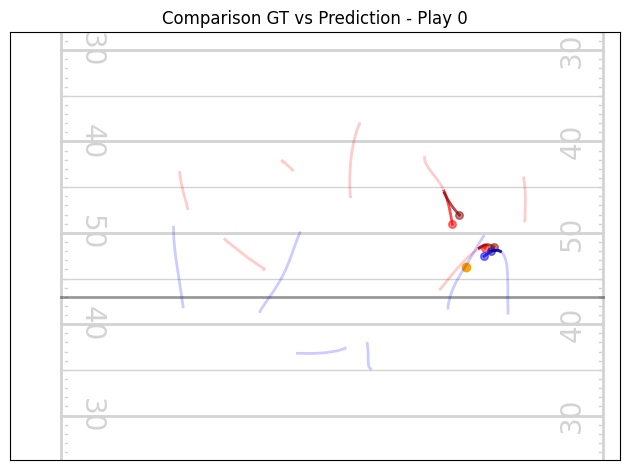

[PRE]   Player 4 mse_loss: 0.05524591729044914
[POST]  Player 4 mse_loss: 0.07110072672367096
[PRE]   Player 5 mse_loss: 0.24248367547988892
[POST]  Player 5 mse_loss: 0.2697368562221527
[PRE]   Player 10 mse_loss: 0.024545269086956978
[POST]  Player 10 mse_loss: 0.037734560668468475


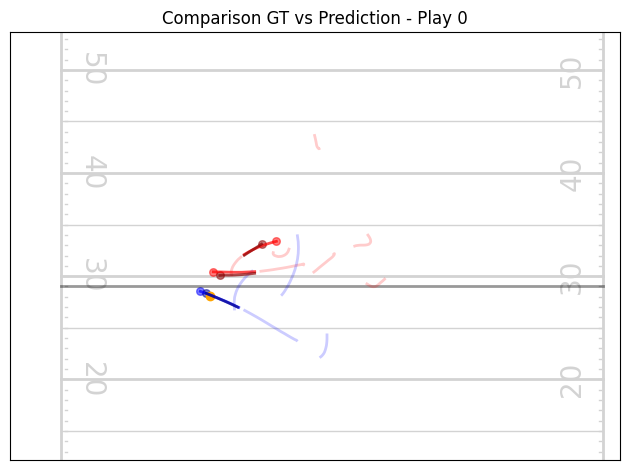

[PRE]   Player 0 mse_loss: 0.05181094631552696
[POST]  Player 0 mse_loss: 0.05472785234451294
[PRE]   Player 1 mse_loss: 0.13296912610530853
[POST]  Player 1 mse_loss: 0.14843975007534027
[PRE]   Player 2 mse_loss: 0.11359959095716476
[POST]  Player 2 mse_loss: 0.11120454221963882
[PRE]   Player 3 mse_loss: 0.14908282458782196
[POST]  Player 3 mse_loss: 0.1569632738828659
[PRE]   Player 4 mse_loss: 0.17626123130321503
[POST]  Player 4 mse_loss: 0.16386933624744415
[PRE]   Player 6 mse_loss: 0.03632568195462227
[POST]  Player 6 mse_loss: 0.03820914775133133
[PRE]   Player 12 mse_loss: 0.16216139495372772
[POST]  Player 12 mse_loss: 0.17891035974025726


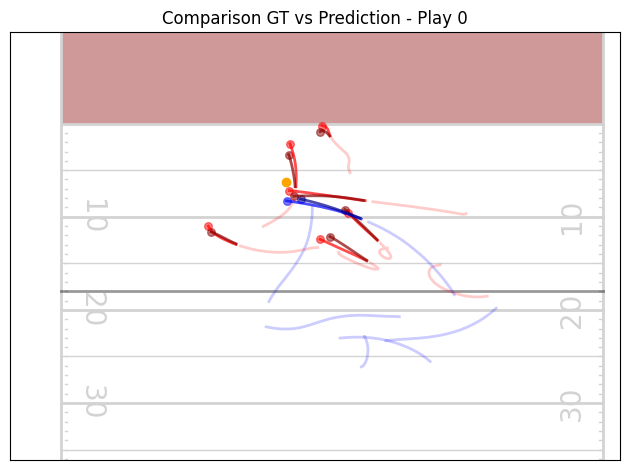

[PRE]   Player 2 mse_loss: 0.11412452161312103
[POST]  Player 2 mse_loss: 0.12633103132247925
[PRE]   Player 12 mse_loss: 0.2214421182870865
[POST]  Player 12 mse_loss: 0.22216758131980896


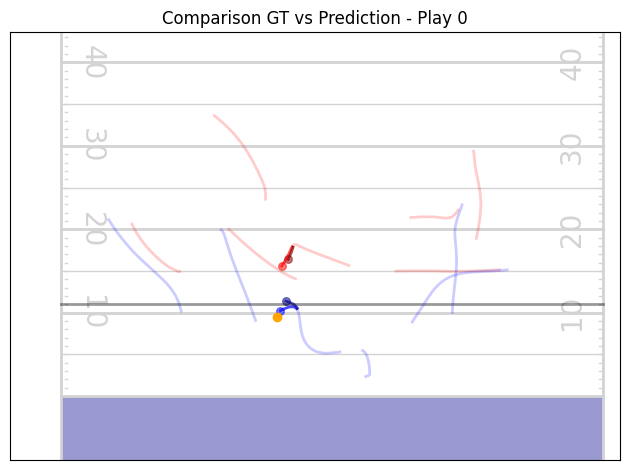

[PRE]   Player 4 mse_loss: 0.05030570179224014
[POST]  Player 4 mse_loss: 0.04828312247991562
[PRE]   Player 12 mse_loss: 0.02664639614522457
[POST]  Player 12 mse_loss: 0.028353536501526833


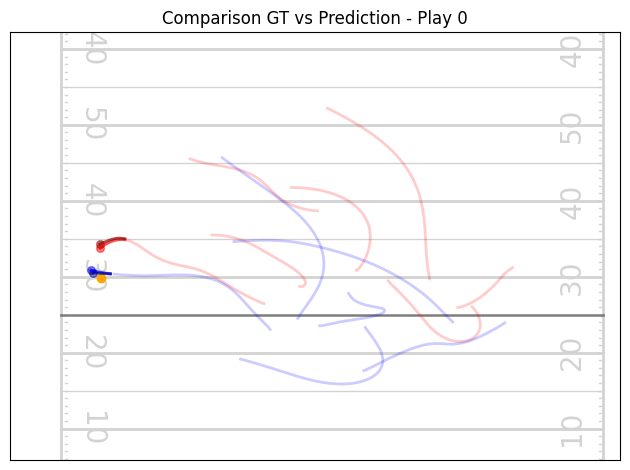

[PRE]   Player 3 mse_loss: 0.12945504486560822
[POST]  Player 3 mse_loss: 0.12705573439598083
[PRE]   Player 4 mse_loss: 0.24719099700450897
[POST]  Player 4 mse_loss: 0.26626452803611755
[PRE]   Player 5 mse_loss: 3.5349745750427246
[POST]  Player 5 mse_loss: 3.450570583343506
[PRE]   Player 12 mse_loss: 0.13700810074806213
[POST]  Player 12 mse_loss: 0.1574745774269104


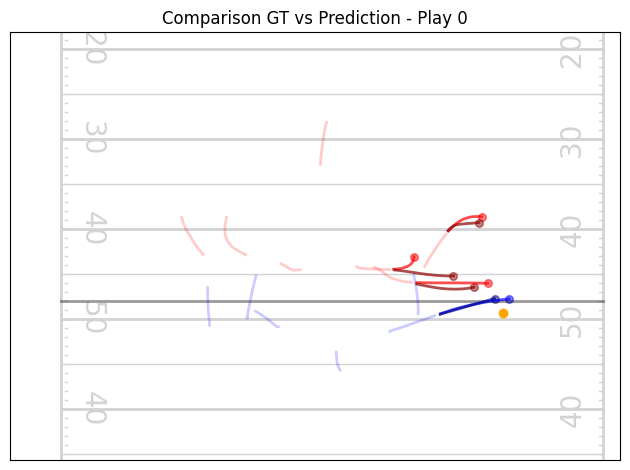

[PRE]   Player 1 mse_loss: 0.08362509310245514
[POST]  Player 1 mse_loss: 0.09434619545936584
[PRE]   Player 3 mse_loss: 0.12165196239948273
[POST]  Player 3 mse_loss: 0.12457063049077988
[PRE]   Player 4 mse_loss: 0.30536675453186035
[POST]  Player 4 mse_loss: 0.297578901052475
[PRE]   Player 5 mse_loss: 0.09705593436956406
[POST]  Player 5 mse_loss: 0.11049161106348038
[PRE]   Player 12 mse_loss: 0.13536176085472107
[POST]  Player 12 mse_loss: 0.1542171686887741


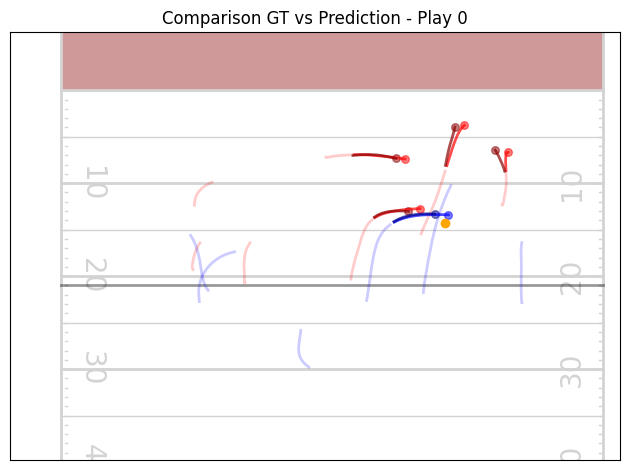

[PRE]   Player 5 mse_loss: 0.023498522117733955
[POST]  Player 5 mse_loss: 0.03559039160609245
[PRE]   Player 10 mse_loss: 0.033511798828840256
[POST]  Player 10 mse_loss: 0.04750142619013786


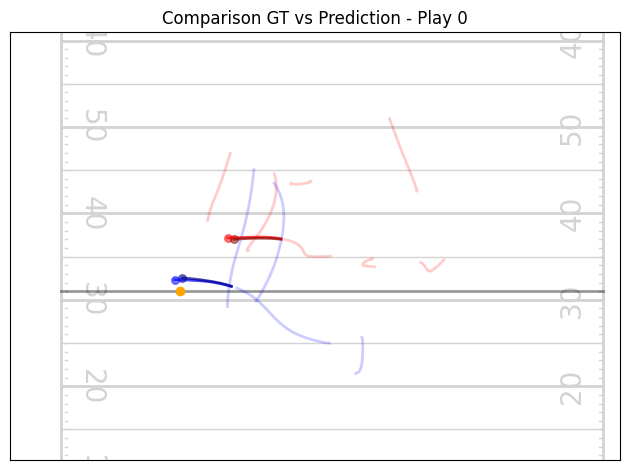

[PRE]   Player 3 mse_loss: 0.05228371545672417
[POST]  Player 3 mse_loss: 0.03879702836275101
[PRE]   Player 4 mse_loss: 0.15563258528709412
[POST]  Player 4 mse_loss: 0.1860194206237793
[PRE]   Player 12 mse_loss: 0.018574059009552002
[POST]  Player 12 mse_loss: 0.0201066043227911


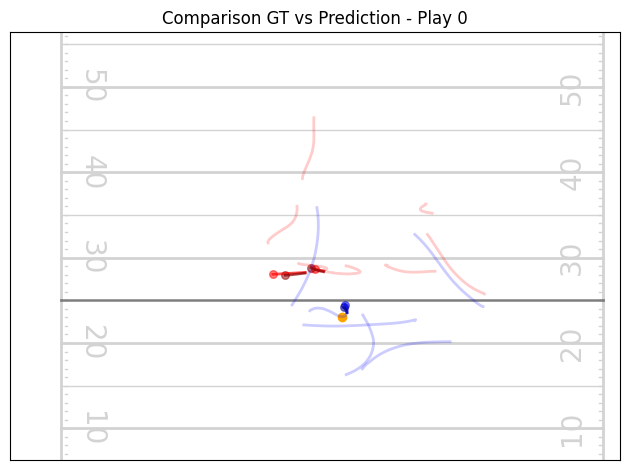

[PRE]   Player 0 mse_loss: 0.4625406265258789
[POST]  Player 0 mse_loss: 0.454568088054657
[PRE]   Player 2 mse_loss: 0.8063425421714783
[POST]  Player 2 mse_loss: 0.8380632400512695
[PRE]   Player 3 mse_loss: 0.2780689597129822
[POST]  Player 3 mse_loss: 0.27995994687080383
[PRE]   Player 12 mse_loss: 0.15662424266338348
[POST]  Player 12 mse_loss: 0.1750679463148117


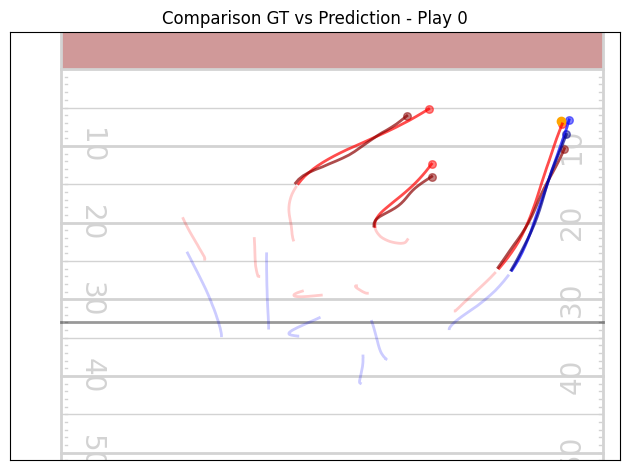

[PRE]   Player 0 mse_loss: 0.05603097751736641
[POST]  Player 0 mse_loss: 0.06373614072799683
[PRE]   Player 3 mse_loss: 0.12267012149095535
[POST]  Player 3 mse_loss: 0.13733990490436554
[PRE]   Player 4 mse_loss: 0.08545570820569992
[POST]  Player 4 mse_loss: 0.10141701251268387
[PRE]   Player 12 mse_loss: 0.03673749044537544
[POST]  Player 12 mse_loss: 0.03329180181026459


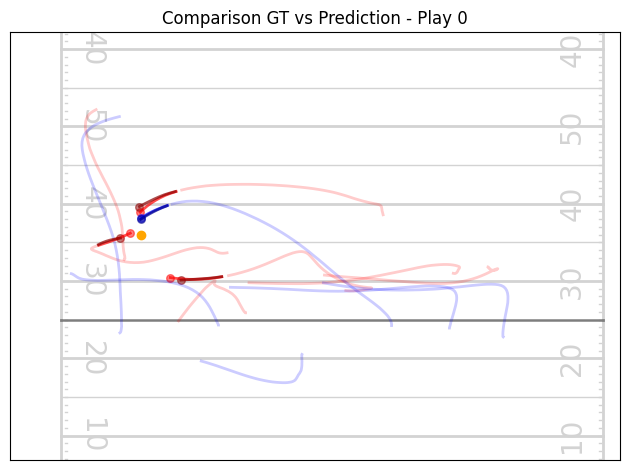

[PRE]   Player 0 mse_loss: 0.0489954948425293
[POST]  Player 0 mse_loss: 0.05189807713031769
[PRE]   Player 3 mse_loss: 3.259833812713623
[POST]  Player 3 mse_loss: 3.275165319442749
[PRE]   Player 12 mse_loss: 0.3526492118835449
[POST]  Player 12 mse_loss: 0.3780217170715332


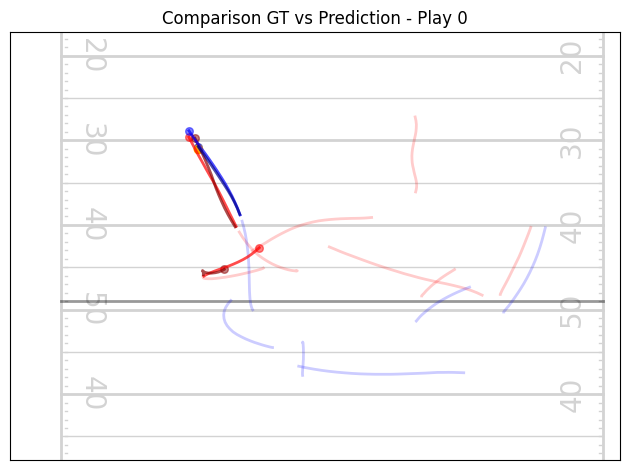

[PRE]   Player 0 mse_loss: 0.055846937000751495
[POST]  Player 0 mse_loss: 0.05836322531104088
[PRE]   Player 2 mse_loss: 0.02602422423660755
[POST]  Player 2 mse_loss: 0.02287931740283966
[PRE]   Player 3 mse_loss: 0.08023464679718018
[POST]  Player 3 mse_loss: 0.08499862998723984
[PRE]   Player 11 mse_loss: 0.16197796165943146
[POST]  Player 11 mse_loss: 0.1543409377336502


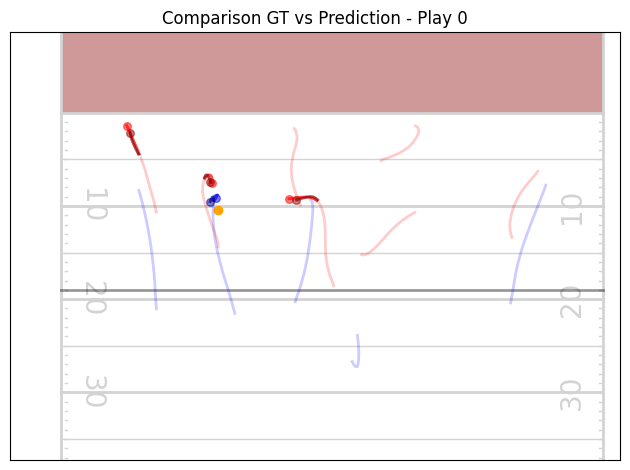

[PRE]   Player 2 mse_loss: 0.11026722192764282
[POST]  Player 2 mse_loss: 0.09219158440828323
[PRE]   Player 3 mse_loss: 0.1585637927055359
[POST]  Player 3 mse_loss: 0.17408137023448944
[PRE]   Player 4 mse_loss: 0.07035962492227554
[POST]  Player 4 mse_loss: 0.08549993485212326
[PRE]   Player 12 mse_loss: 0.017980176955461502
[POST]  Player 12 mse_loss: 0.015229356475174427


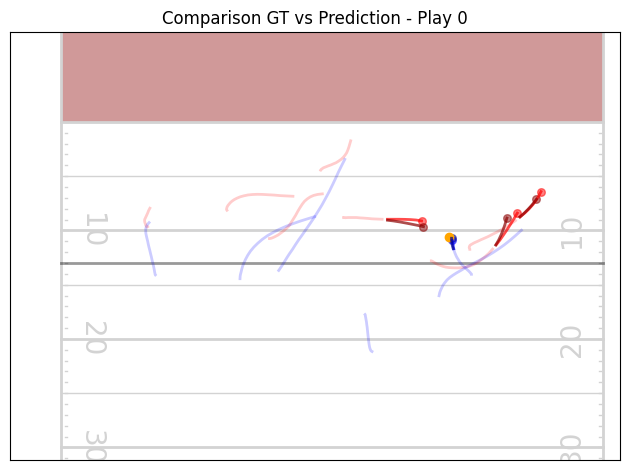

[PRE]   Player 1 mse_loss: 0.06139465421438217
[POST]  Player 1 mse_loss: 0.08163942396640778
[PRE]   Player 2 mse_loss: 0.293955534696579
[POST]  Player 2 mse_loss: 0.32358497381210327
[PRE]   Player 6 mse_loss: 0.08913545310497284
[POST]  Player 6 mse_loss: 0.10499142855405807
[PRE]   Player 12 mse_loss: 0.20666643977165222
[POST]  Player 12 mse_loss: 0.22927185893058777


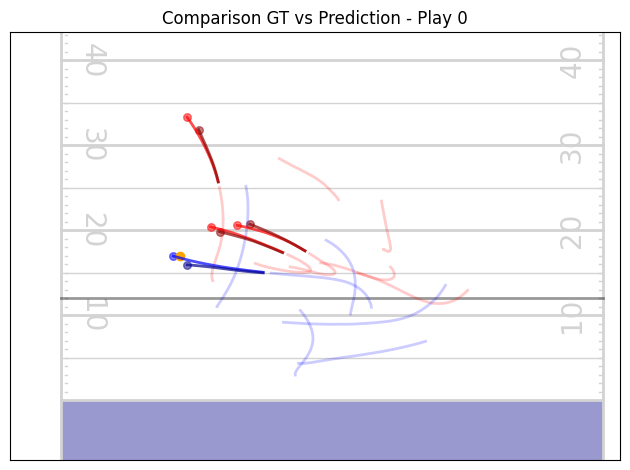

[PRE]   Player 3 mse_loss: 0.07168281823396683
[POST]  Player 3 mse_loss: 0.07743795961141586
[PRE]   Player 5 mse_loss: 0.053106408566236496
[POST]  Player 5 mse_loss: 0.04714994877576828
[PRE]   Player 13 mse_loss: 0.06928016990423203
[POST]  Player 13 mse_loss: 0.08145948499441147


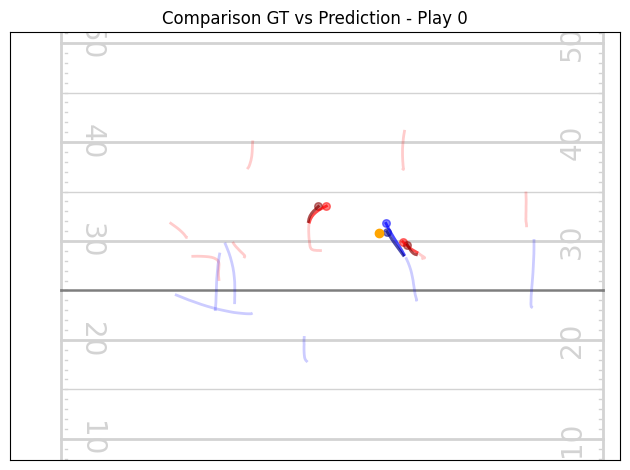

[PRE]   Player 1 mse_loss: 0.15688617527484894
[POST]  Player 1 mse_loss: 0.17051894962787628
[PRE]   Player 2 mse_loss: 0.34978777170181274
[POST]  Player 2 mse_loss: 0.34823185205459595
[PRE]   Player 11 mse_loss: 0.16097858548164368
[POST]  Player 11 mse_loss: 0.1786459982395172


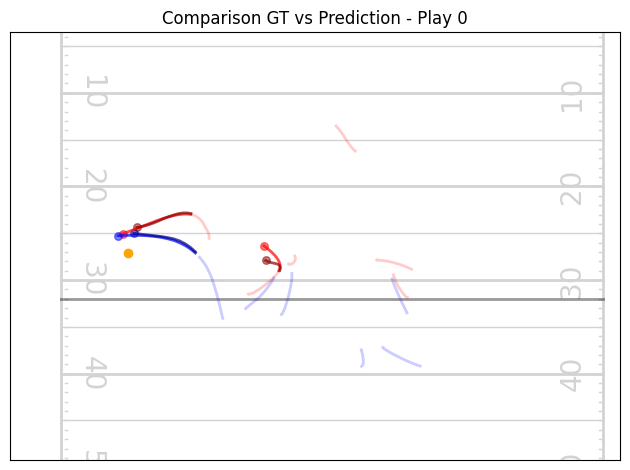

[PRE]   Player 0 mse_loss: 0.13201259076595306
[POST]  Player 0 mse_loss: 0.13808220624923706
[PRE]   Player 11 mse_loss: 0.21780864894390106
[POST]  Player 11 mse_loss: 0.2231711447238922


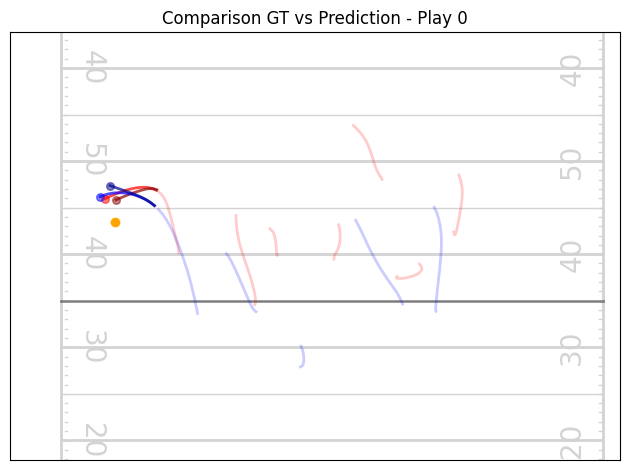

[PRE]   Player 2 mse_loss: 0.26713189482688904
[POST]  Player 2 mse_loss: 0.2542605698108673
[PRE]   Player 3 mse_loss: 0.592715322971344
[POST]  Player 3 mse_loss: 0.5665813684463501
[PRE]   Player 4 mse_loss: 0.38519197702407837
[POST]  Player 4 mse_loss: 0.4020352065563202
[PRE]   Player 12 mse_loss: 0.269313246011734
[POST]  Player 12 mse_loss: 0.2525803744792938


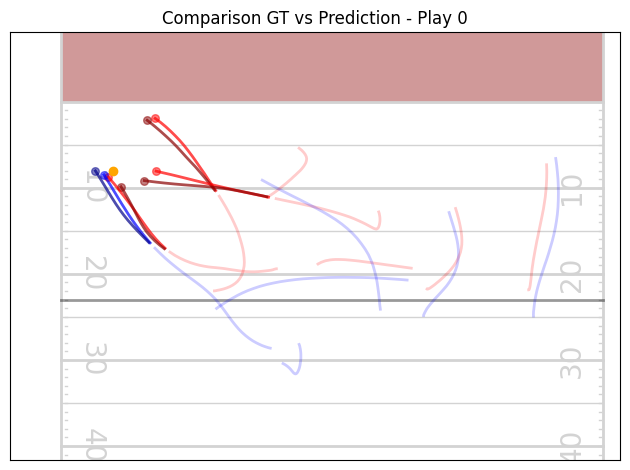

[PRE]   Player 1 mse_loss: 0.7827897667884827
[POST]  Player 1 mse_loss: 0.7666603922843933
[PRE]   Player 3 mse_loss: 1.0337109565734863
[POST]  Player 3 mse_loss: 1.012033224105835
[PRE]   Player 4 mse_loss: 4.02117919921875
[POST]  Player 4 mse_loss: 4.004408359527588
[PRE]   Player 8 mse_loss: 1.0258034467697144
[POST]  Player 8 mse_loss: 1.011757731437683


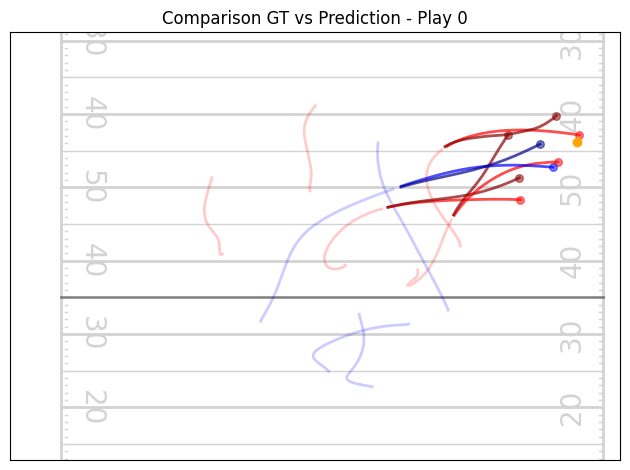

[PRE]   Player 1 mse_loss: 0.019066786393523216
[POST]  Player 1 mse_loss: 0.01500018686056137
[PRE]   Player 2 mse_loss: 0.06642904132604599
[POST]  Player 2 mse_loss: 0.06971462815999985
[PRE]   Player 3 mse_loss: 0.21588313579559326
[POST]  Player 3 mse_loss: 0.21186457574367523
[PRE]   Player 4 mse_loss: 0.12218894809484482
[POST]  Player 4 mse_loss: 0.13707223534584045
[PRE]   Player 13 mse_loss: 0.060932088643312454
[POST]  Player 13 mse_loss: 0.06454577296972275


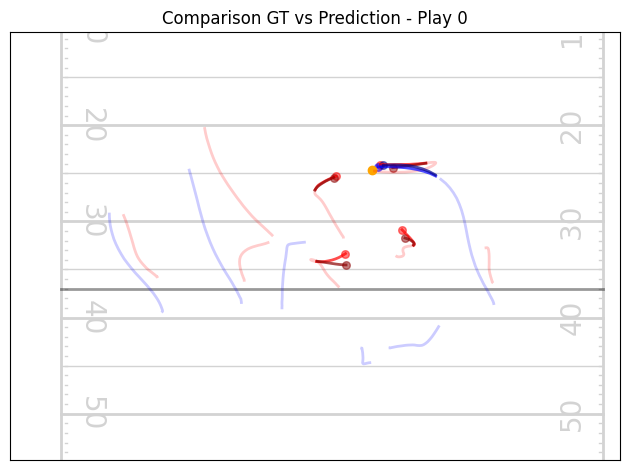

[PRE]   Player 0 mse_loss: 0.025035809725522995
[POST]  Player 0 mse_loss: 0.03490925580263138
[PRE]   Player 11 mse_loss: 0.051184844225645065
[POST]  Player 11 mse_loss: 0.07076346129179001


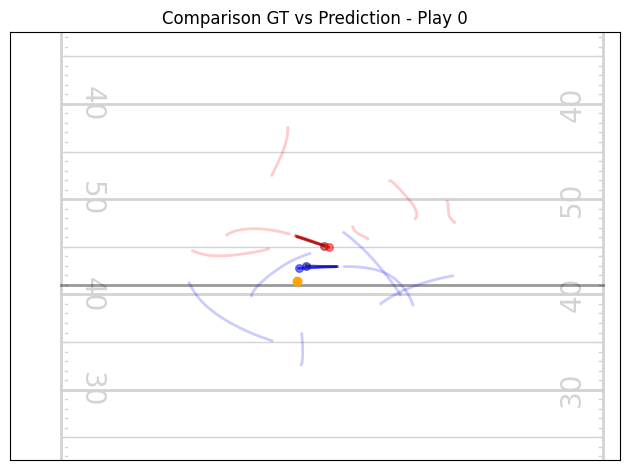

[PRE]   Player 2 mse_loss: 0.5650131106376648
[POST]  Player 2 mse_loss: 0.5689315795898438
[PRE]   Player 3 mse_loss: 0.16523593664169312
[POST]  Player 3 mse_loss: 0.18419985473155975
[PRE]   Player 4 mse_loss: 0.03713986650109291
[POST]  Player 4 mse_loss: 0.0519399419426918
[PRE]   Player 5 mse_loss: 0.08938417583703995
[POST]  Player 5 mse_loss: 0.08650445193052292
[PRE]   Player 6 mse_loss: 0.11751017719507217
[POST]  Player 6 mse_loss: 0.12251843512058258
[PRE]   Player 12 mse_loss: 0.05018238350749016
[POST]  Player 12 mse_loss: 0.0636843591928482


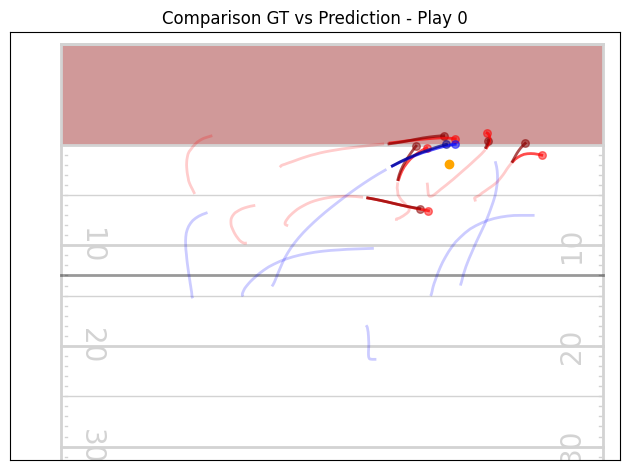

[PRE]   Player 5 mse_loss: 0.028147179633378983
[POST]  Player 5 mse_loss: 0.03500625491142273
[PRE]   Player 6 mse_loss: 0.41794508695602417
[POST]  Player 6 mse_loss: 0.40033823251724243
[PRE]   Player 12 mse_loss: 0.024888217449188232
[POST]  Player 12 mse_loss: 0.03596700727939606


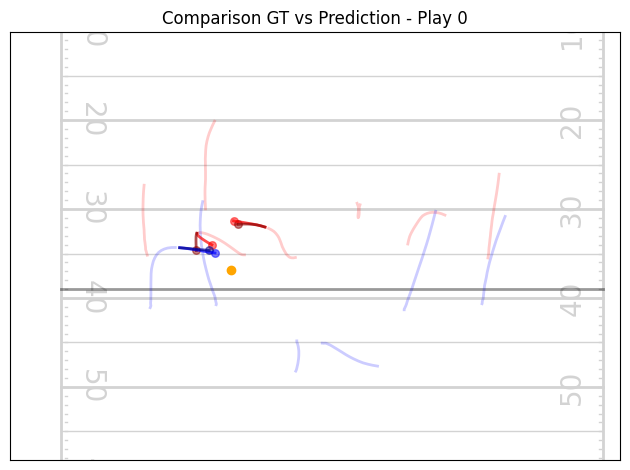

[PRE]   Player 2 mse_loss: 1.247744083404541
[POST]  Player 2 mse_loss: 1.1888046264648438
[PRE]   Player 3 mse_loss: 4.531787395477295
[POST]  Player 3 mse_loss: 4.544040679931641
[PRE]   Player 4 mse_loss: 2.234013557434082
[POST]  Player 4 mse_loss: 2.235960006713867
[PRE]   Player 5 mse_loss: 0.7684360146522522
[POST]  Player 5 mse_loss: 0.7536381483078003
[PRE]   Player 12 mse_loss: 1.072489619255066
[POST]  Player 12 mse_loss: 1.085201382637024


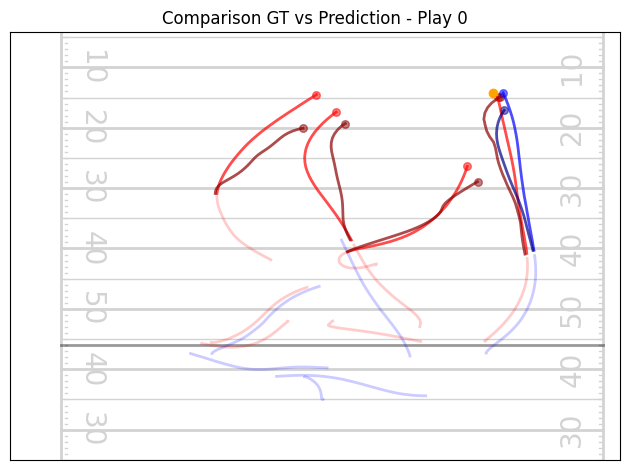

[PRE]   Player 3 mse_loss: 0.02900705859065056
[POST]  Player 3 mse_loss: 0.03312167525291443
[PRE]   Player 4 mse_loss: 0.3994337320327759
[POST]  Player 4 mse_loss: 0.39801374077796936
[PRE]   Player 5 mse_loss: 0.049285974353551865
[POST]  Player 5 mse_loss: 0.056578293442726135
[PRE]   Player 11 mse_loss: 0.21033786237239838
[POST]  Player 11 mse_loss: 0.22951796650886536


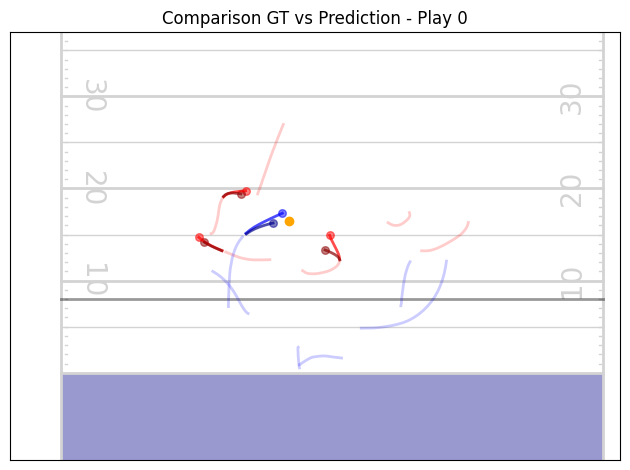

[PRE]   Player 0 mse_loss: 2.479429244995117
[POST]  Player 0 mse_loss: 2.4928784370422363
[PRE]   Player 1 mse_loss: 7.0587992668151855
[POST]  Player 1 mse_loss: 7.017598628997803
[PRE]   Player 2 mse_loss: 6.958757400512695
[POST]  Player 2 mse_loss: 6.866517543792725
[PRE]   Player 3 mse_loss: 2.0083606243133545
[POST]  Player 3 mse_loss: 1.9945948123931885
[PRE]   Player 9 mse_loss: 0.046235352754592896
[POST]  Player 9 mse_loss: 0.048456162214279175


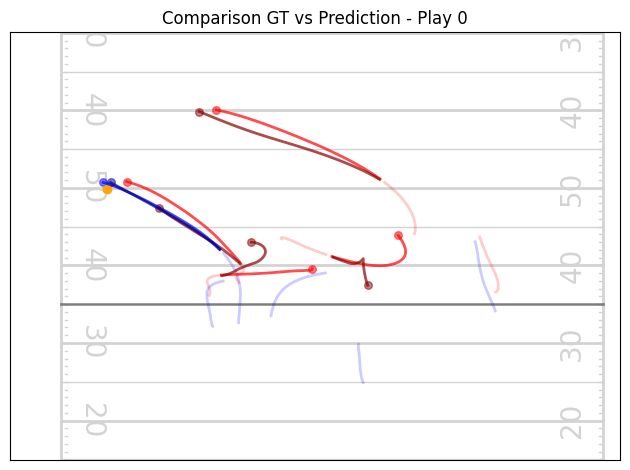

[PRE]   Player 0 mse_loss: 0.1273810714483261
[POST]  Player 0 mse_loss: 0.12096123397350311
[PRE]   Player 3 mse_loss: 0.0875362977385521
[POST]  Player 3 mse_loss: 0.10005971044301987
[PRE]   Player 4 mse_loss: 0.05180177092552185
[POST]  Player 4 mse_loss: 0.056060075759887695
[PRE]   Player 5 mse_loss: 0.4000953733921051
[POST]  Player 5 mse_loss: 0.4321371614933014
[PRE]   Player 11 mse_loss: 0.13617512583732605
[POST]  Player 11 mse_loss: 0.15358884632587433


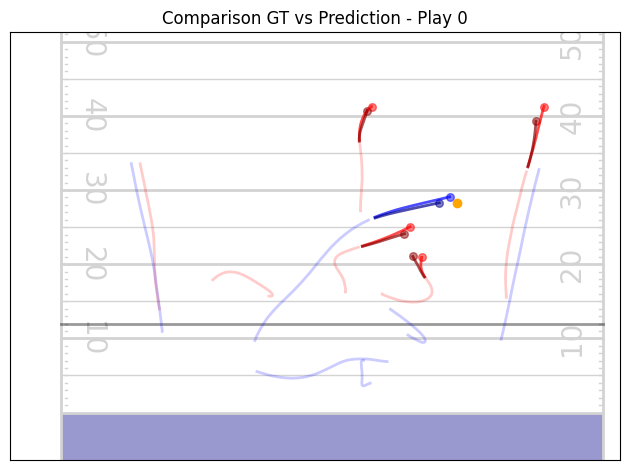

[PRE]   Player 5 mse_loss: 0.011117455549538136
[POST]  Player 5 mse_loss: 0.014319919049739838
[PRE]   Player 6 mse_loss: 0.1780707836151123
[POST]  Player 6 mse_loss: 0.22689713537693024
[PRE]   Player 12 mse_loss: 0.18307259678840637
[POST]  Player 12 mse_loss: 0.21996469795703888


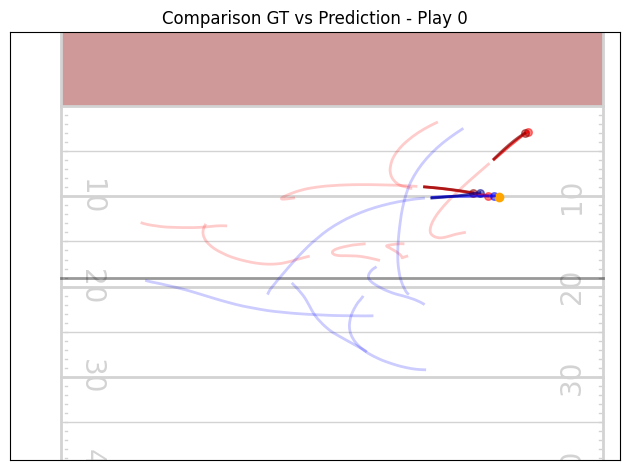

[PRE]   Player 3 mse_loss: 0.06418729573488235
[POST]  Player 3 mse_loss: 0.07863976806402206
[PRE]   Player 4 mse_loss: 0.061215393245220184
[POST]  Player 4 mse_loss: 0.038365911692380905
[PRE]   Player 12 mse_loss: 0.19466596841812134
[POST]  Player 12 mse_loss: 0.217569500207901


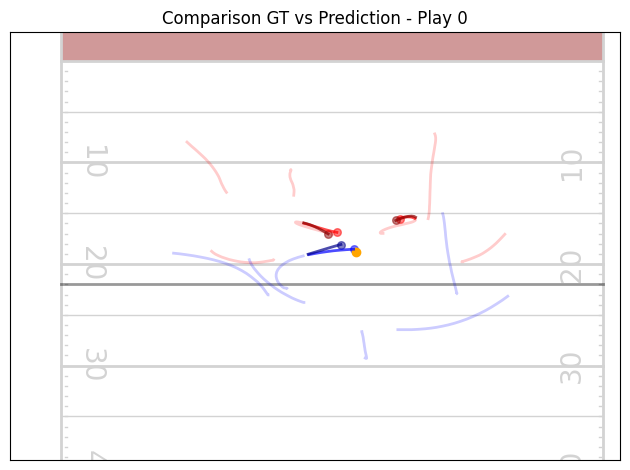

[PRE]   Player 1 mse_loss: 0.11367662250995636
[POST]  Player 1 mse_loss: 0.11970726400613785
[PRE]   Player 12 mse_loss: 0.00358811323530972
[POST]  Player 12 mse_loss: 0.008691071532666683


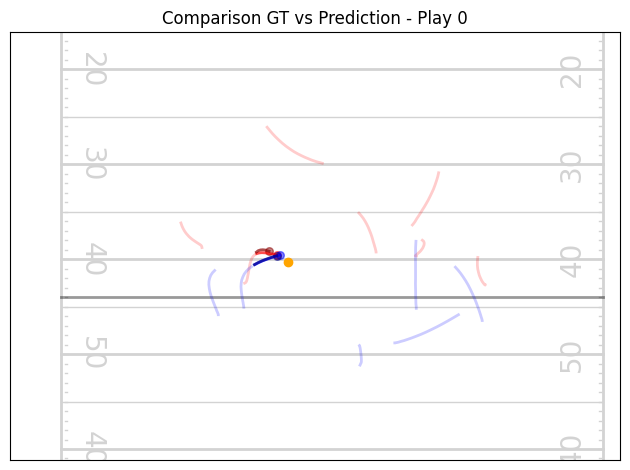

[PRE]   Player 5 mse_loss: 0.3937988579273224
[POST]  Player 5 mse_loss: 0.363801509141922
[PRE]   Player 10 mse_loss: 0.026752673089504242
[POST]  Player 10 mse_loss: 0.02938673458993435


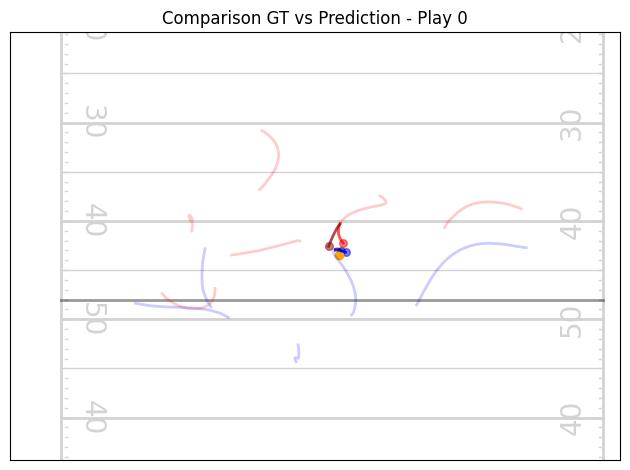

[PRE]   Player 2 mse_loss: 1.6933236122131348
[POST]  Player 2 mse_loss: 1.6750956773757935
[PRE]   Player 5 mse_loss: 1.8528974056243896
[POST]  Player 5 mse_loss: 1.8505009412765503
[PRE]   Player 11 mse_loss: 0.7640970349311829
[POST]  Player 11 mse_loss: 0.7525113224983215


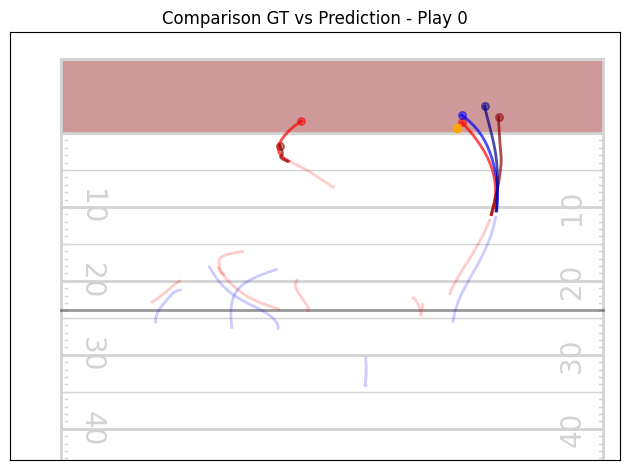

[PRE]   Player 0 mse_loss: 0.13912780582904816
[POST]  Player 0 mse_loss: 0.1419880986213684
[PRE]   Player 1 mse_loss: 0.4010835587978363
[POST]  Player 1 mse_loss: 0.3964318037033081
[PRE]   Player 2 mse_loss: 0.26845139265060425
[POST]  Player 2 mse_loss: 0.2797278165817261
[PRE]   Player 5 mse_loss: 0.20714472234249115
[POST]  Player 5 mse_loss: 0.20214885473251343
[PRE]   Player 11 mse_loss: 0.8715282082557678
[POST]  Player 11 mse_loss: 0.855422854423523


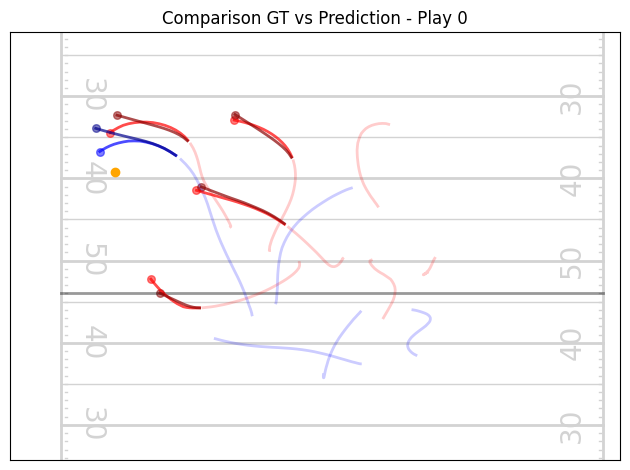

[PRE]   Player 0 mse_loss: 0.08969259262084961
[POST]  Player 0 mse_loss: 0.08381026983261108
[PRE]   Player 6 mse_loss: 0.8127031326293945
[POST]  Player 6 mse_loss: 0.8021411895751953
[PRE]   Player 12 mse_loss: 0.14725270867347717
[POST]  Player 12 mse_loss: 0.17281274497509003


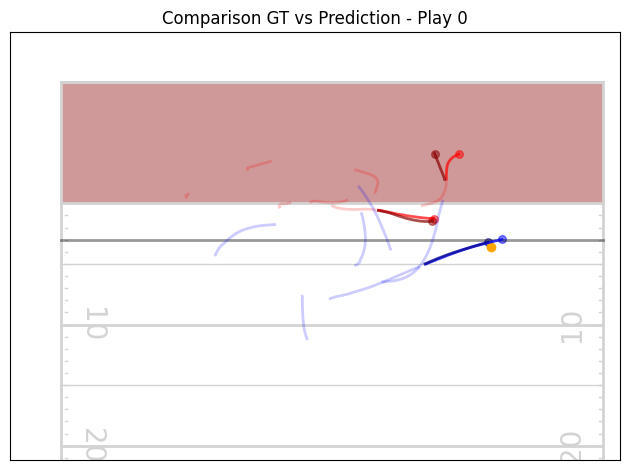

[PRE]   Player 3 mse_loss: 0.19559721648693085
[POST]  Player 3 mse_loss: 0.21394458413124084
[PRE]   Player 4 mse_loss: 0.5279709100723267
[POST]  Player 4 mse_loss: 0.5384734272956848
[PRE]   Player 10 mse_loss: 0.044377584010362625
[POST]  Player 10 mse_loss: 0.05532537028193474


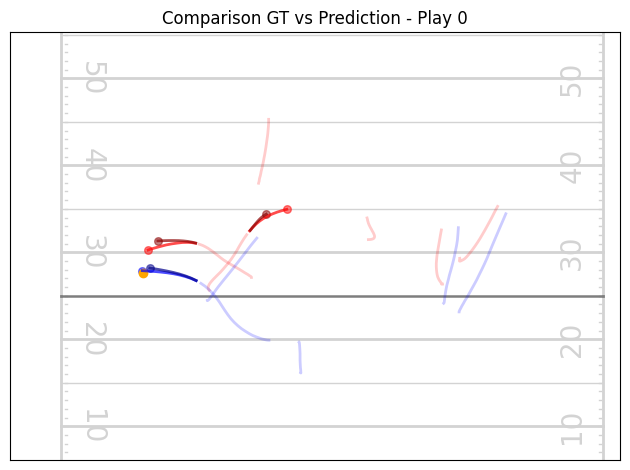

[PRE]   Player 0 mse_loss: 0.06983987987041473
[POST]  Player 0 mse_loss: 0.07798872888088226
[PRE]   Player 1 mse_loss: 0.03501015529036522
[POST]  Player 1 mse_loss: 0.027811629697680473
[PRE]   Player 12 mse_loss: 0.02709440514445305
[POST]  Player 12 mse_loss: 0.039599984884262085


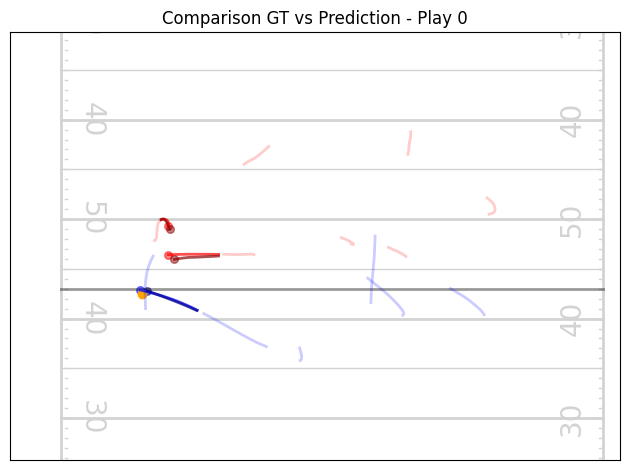

[PRE]   Player 9 mse_loss: 0.10460691899061203
[POST]  Player 9 mse_loss: 0.12362430989742279


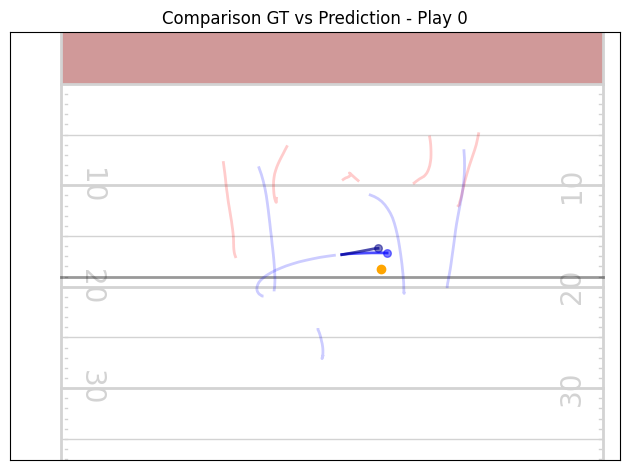

[PRE]   Player 0 mse_loss: 0.06725864112377167
[POST]  Player 0 mse_loss: 0.0694386437535286
[PRE]   Player 1 mse_loss: 0.03607501462101936
[POST]  Player 1 mse_loss: 0.05313640460371971
[PRE]   Player 2 mse_loss: 0.052095506340265274
[POST]  Player 2 mse_loss: 0.06651419401168823
[PRE]   Player 3 mse_loss: 0.03738272935152054
[POST]  Player 3 mse_loss: 0.037754420191049576
[PRE]   Player 5 mse_loss: 0.21876868605613708
[POST]  Player 5 mse_loss: 0.24333158135414124
[PRE]   Player 9 mse_loss: 0.0874650627374649
[POST]  Player 9 mse_loss: 0.10563334077596664


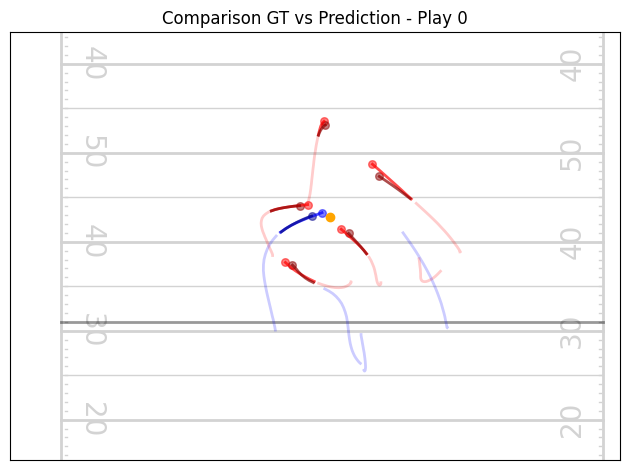

[PRE]   Player 10 mse_loss: 0.07042530179023743
[POST]  Player 10 mse_loss: 0.0791115015745163


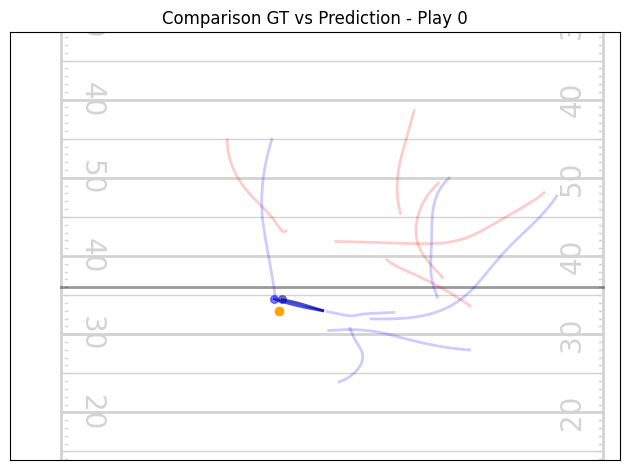

[PRE]   Player 0 mse_loss: 0.503675103187561
[POST]  Player 0 mse_loss: 0.483570396900177
[PRE]   Player 1 mse_loss: 0.4621621072292328
[POST]  Player 1 mse_loss: 0.44833144545555115
[PRE]   Player 2 mse_loss: 0.5851805806159973
[POST]  Player 2 mse_loss: 0.5957837700843811
[PRE]   Player 7 mse_loss: 1.3440604209899902
[POST]  Player 7 mse_loss: 1.3328860998153687
[PRE]   Player 13 mse_loss: 0.6031864285469055
[POST]  Player 13 mse_loss: 0.5956392884254456


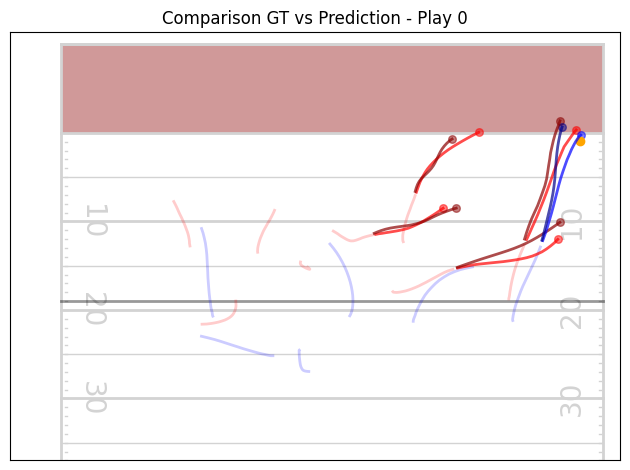

[PRE]   Player 6 mse_loss: 0.06984178721904755
[POST]  Player 6 mse_loss: 0.0720754936337471
[PRE]   Player 12 mse_loss: 0.017973128706216812
[POST]  Player 12 mse_loss: 0.03092755377292633


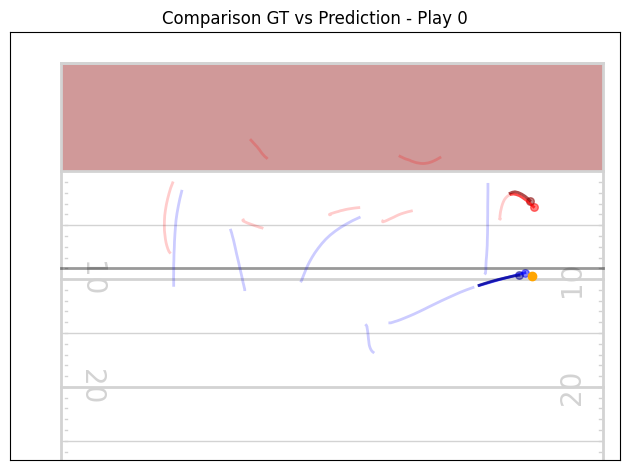

[PRE]   Player 0 mse_loss: 0.43811559677124023
[POST]  Player 0 mse_loss: 0.4244946837425232
[PRE]   Player 4 mse_loss: 0.7240096926689148
[POST]  Player 4 mse_loss: 0.738456666469574
[PRE]   Player 12 mse_loss: 0.20803609490394592
[POST]  Player 12 mse_loss: 0.20345139503479004


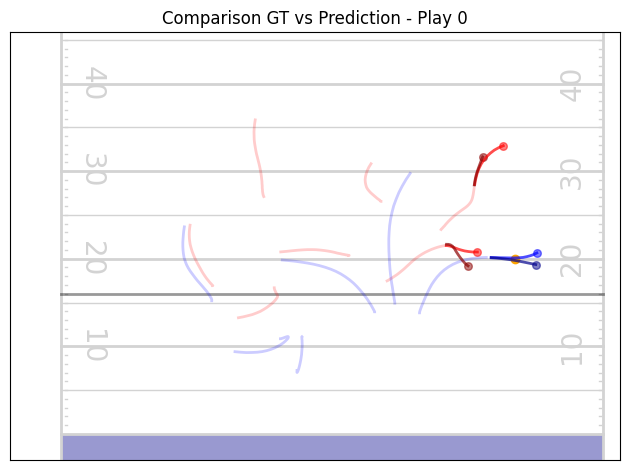

[PRE]   Player 4 mse_loss: 0.08912529796361923
[POST]  Player 4 mse_loss: 0.09180476516485214
[PRE]   Player 10 mse_loss: 0.07882590591907501
[POST]  Player 10 mse_loss: 0.0884762853384018


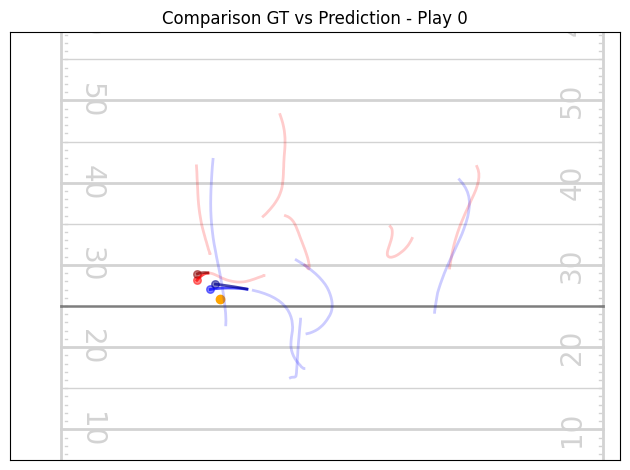

[PRE]   Player 2 mse_loss: 0.06600411981344223
[POST]  Player 2 mse_loss: 0.08216924965381622
[PRE]   Player 11 mse_loss: 0.04869009181857109
[POST]  Player 11 mse_loss: 0.05799943208694458


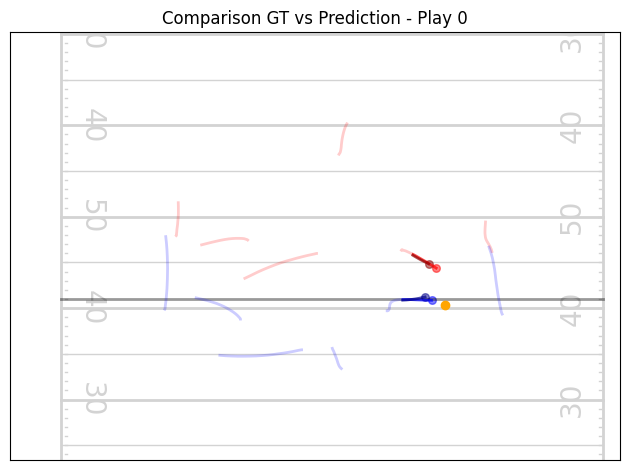

[PRE]   Player 3 mse_loss: 0.3157562017440796
[POST]  Player 3 mse_loss: 0.28404951095581055
[PRE]   Player 6 mse_loss: 0.20501300692558289
[POST]  Player 6 mse_loss: 0.20020300149917603
[PRE]   Player 12 mse_loss: 0.07574145495891571
[POST]  Player 12 mse_loss: 0.07078801095485687


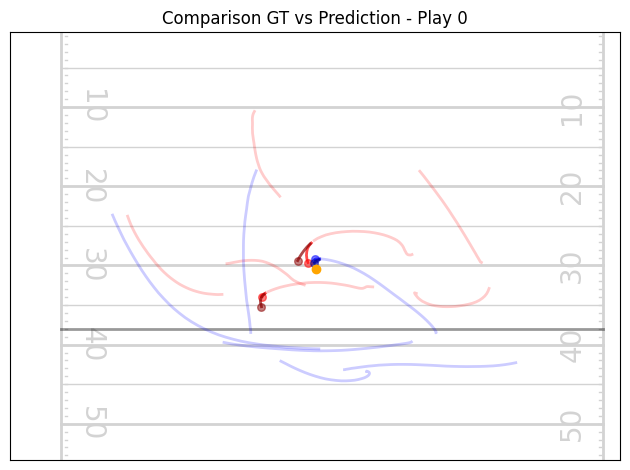

[PRE]   Player 4 mse_loss: 0.39020201563835144
[POST]  Player 4 mse_loss: 0.4128958284854889
[PRE]   Player 5 mse_loss: 1.1174646615982056
[POST]  Player 5 mse_loss: 1.1369563341140747
[PRE]   Player 12 mse_loss: 0.12061075121164322
[POST]  Player 12 mse_loss: 0.13905532658100128


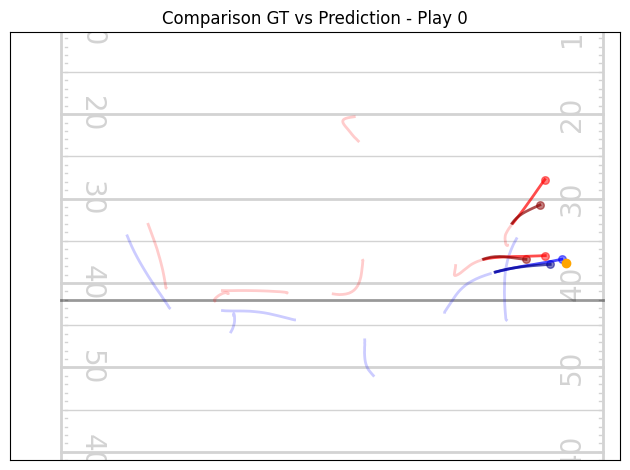

[PRE]   Player 2 mse_loss: 0.46619927883148193
[POST]  Player 2 mse_loss: 0.4785805642604828
[PRE]   Player 3 mse_loss: 2.8095290660858154
[POST]  Player 3 mse_loss: 2.7785680294036865
[PRE]   Player 4 mse_loss: 0.2738529443740845
[POST]  Player 4 mse_loss: 0.29077965021133423
[PRE]   Player 9 mse_loss: 0.25625303387641907
[POST]  Player 9 mse_loss: 0.2663169801235199


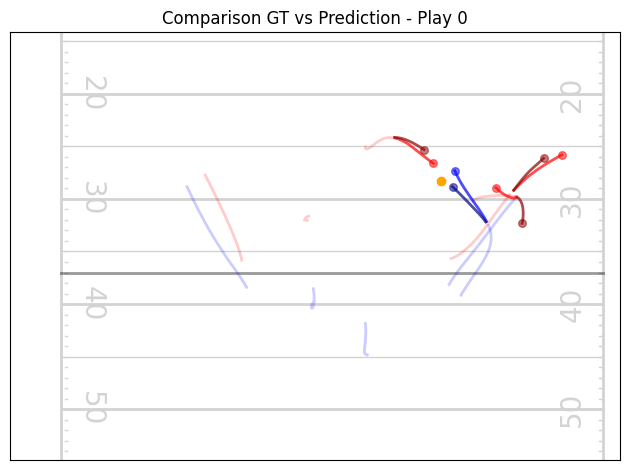

[PRE]   Player 4 mse_loss: 0.21008875966072083
[POST]  Player 4 mse_loss: 0.21924641728401184
[PRE]   Player 10 mse_loss: 0.0481540746986866
[POST]  Player 10 mse_loss: 0.07062364369630814


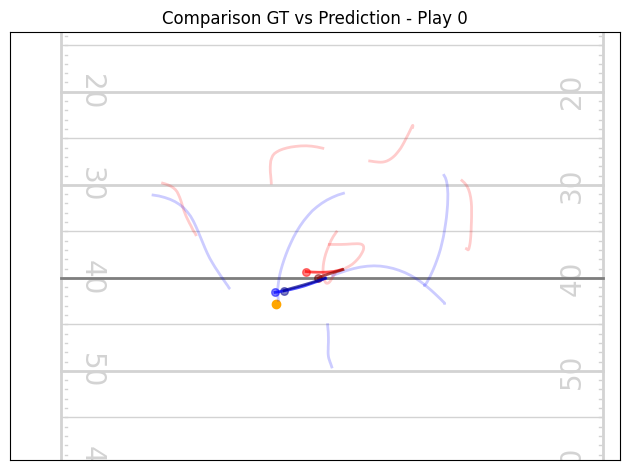

[PRE]   Player 0 mse_loss: 3.4321141242980957
[POST]  Player 0 mse_loss: 3.334866762161255
[PRE]   Player 4 mse_loss: 1.8497059345245361
[POST]  Player 4 mse_loss: 1.8818901777267456
[PRE]   Player 7 mse_loss: 1.0761381387710571
[POST]  Player 7 mse_loss: 1.0903319120407104
[PRE]   Player 12 mse_loss: 1.523179054260254
[POST]  Player 12 mse_loss: 1.5234941244125366


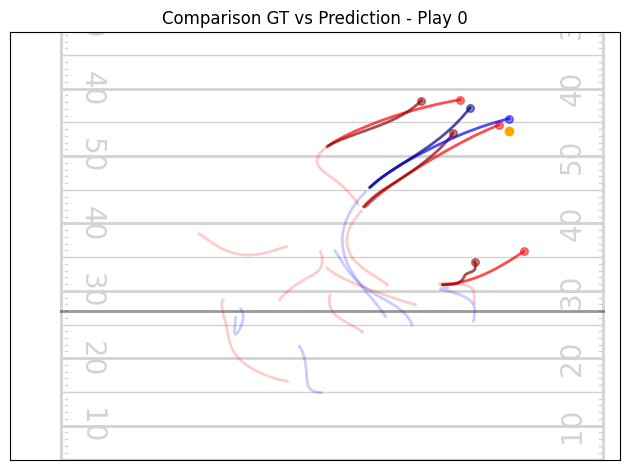

[PRE]   Player 12 mse_loss: 0.23536093533039093
[POST]  Player 12 mse_loss: 0.21261827647686005


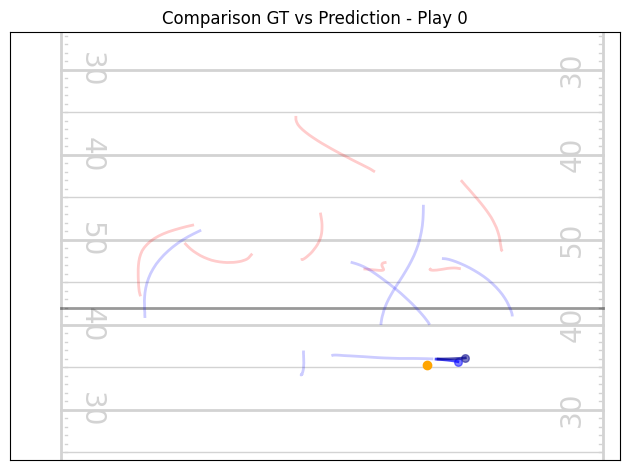

[PRE]   Player 1 mse_loss: 0.031764913350343704
[POST]  Player 1 mse_loss: 0.03190762922167778
[PRE]   Player 3 mse_loss: 1.013001561164856
[POST]  Player 3 mse_loss: 0.956321120262146
[PRE]   Player 5 mse_loss: 0.3423970341682434
[POST]  Player 5 mse_loss: 0.35700470209121704
[PRE]   Player 6 mse_loss: 1.153975248336792
[POST]  Player 6 mse_loss: 1.1746906042099
[PRE]   Player 11 mse_loss: 0.1074235811829567
[POST]  Player 11 mse_loss: 0.1190296858549118


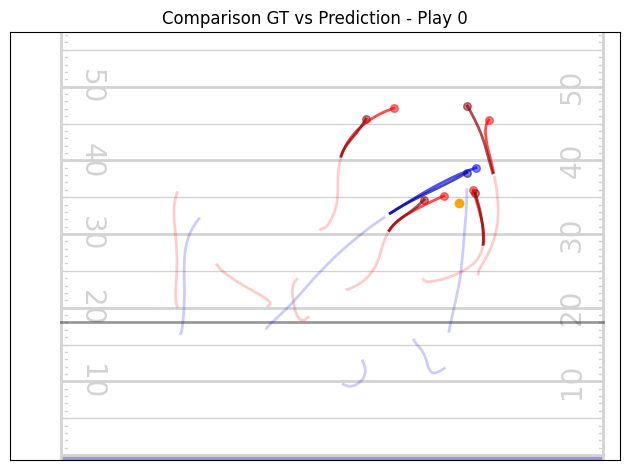

[PRE]   Player 0 mse_loss: 0.08304183185100555
[POST]  Player 0 mse_loss: 0.06585798412561417
[PRE]   Player 1 mse_loss: 0.12513765692710876
[POST]  Player 1 mse_loss: 0.1259736269712448
[PRE]   Player 12 mse_loss: 0.11355141550302505
[POST]  Player 12 mse_loss: 0.10956495255231857


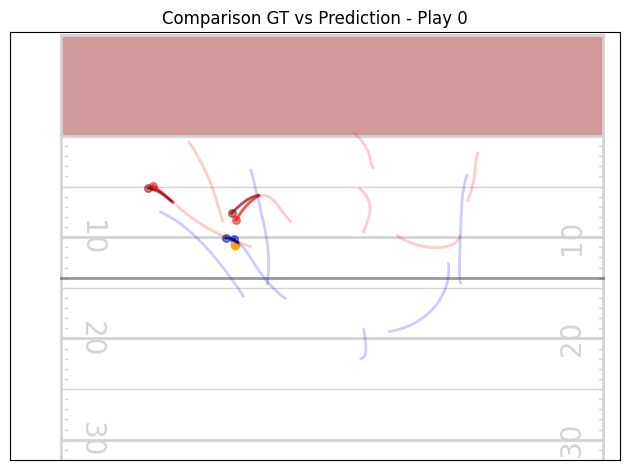

[PRE]   Player 2 mse_loss: 1.6871052980422974
[POST]  Player 2 mse_loss: 1.6835105419158936
[PRE]   Player 4 mse_loss: 0.36239367723464966
[POST]  Player 4 mse_loss: 0.36706140637397766
[PRE]   Player 6 mse_loss: 1.3756310939788818
[POST]  Player 6 mse_loss: 1.3765796422958374
[PRE]   Player 12 mse_loss: 0.18841977417469025
[POST]  Player 12 mse_loss: 0.19050976634025574


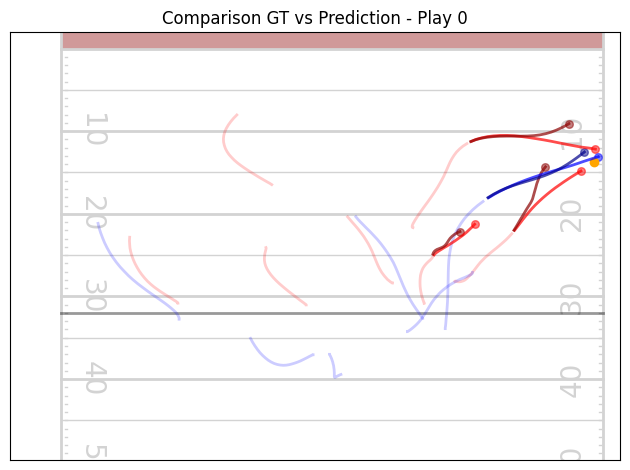

[PRE]   Player 0 mse_loss: 0.15493261814117432
[POST]  Player 0 mse_loss: 0.13830551505088806
[PRE]   Player 4 mse_loss: 1.225218415260315
[POST]  Player 4 mse_loss: 1.2247709035873413
[PRE]   Player 6 mse_loss: 1.8724424839019775
[POST]  Player 6 mse_loss: 1.8719099760055542
[PRE]   Player 12 mse_loss: 0.670531153678894
[POST]  Player 12 mse_loss: 0.6731258034706116


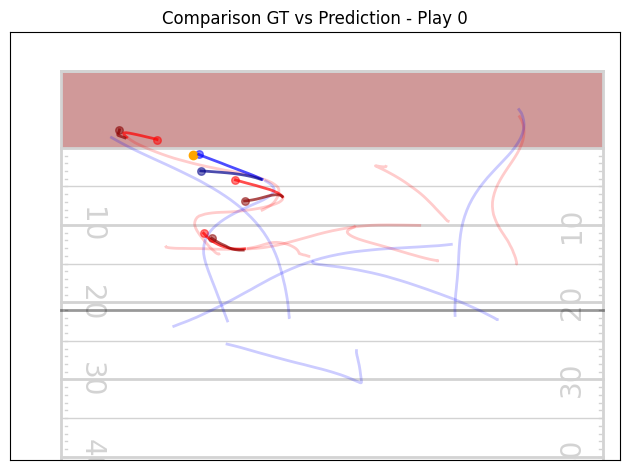

[PRE]   Player 1 mse_loss: 0.5369681715965271
[POST]  Player 1 mse_loss: 0.5519387125968933
[PRE]   Player 3 mse_loss: 0.1187722235918045
[POST]  Player 3 mse_loss: 0.13155308365821838
[PRE]   Player 4 mse_loss: 0.11584021151065826
[POST]  Player 4 mse_loss: 0.1225154921412468
[PRE]   Player 5 mse_loss: 0.3463524281978607
[POST]  Player 5 mse_loss: 0.3516770303249359
[PRE]   Player 10 mse_loss: 0.06577878445386887
[POST]  Player 10 mse_loss: 0.07942447811365128


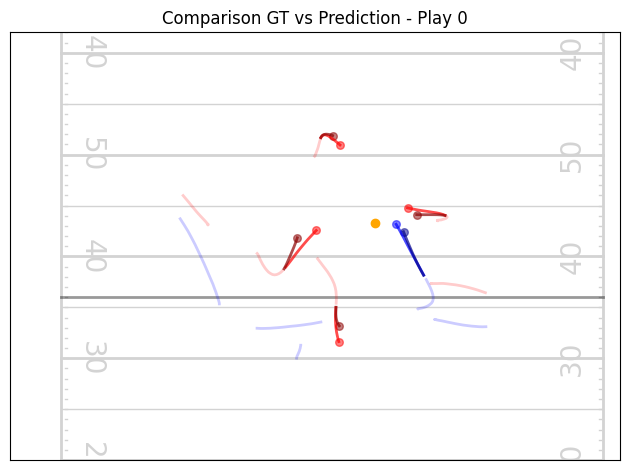

[PRE]   Player 12 mse_loss: 0.2117554396390915
[POST]  Player 12 mse_loss: 0.22466866672039032


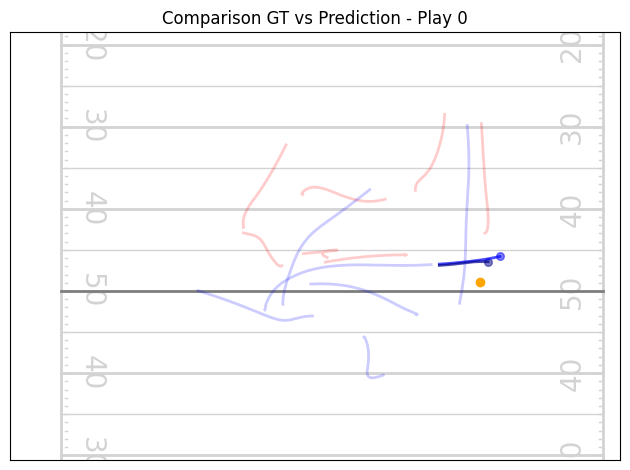

[PRE]   Player 1 mse_loss: 0.23108789324760437
[POST]  Player 1 mse_loss: 0.2460855394601822
[PRE]   Player 2 mse_loss: 0.044745735824108124
[POST]  Player 2 mse_loss: 0.04647284001111984
[PRE]   Player 12 mse_loss: 0.4366818070411682
[POST]  Player 12 mse_loss: 0.4547652304172516


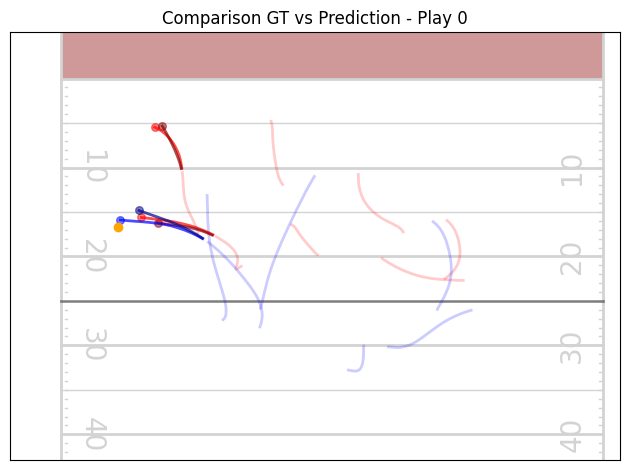

[PRE]   Player 1 mse_loss: 2.2506263256073
[POST]  Player 1 mse_loss: 2.228943347930908
[PRE]   Player 3 mse_loss: 3.2193164825439453
[POST]  Player 3 mse_loss: 3.2463808059692383
[PRE]   Player 4 mse_loss: 6.548282623291016
[POST]  Player 4 mse_loss: 6.539327144622803
[PRE]   Player 10 mse_loss: 0.12062234431505203
[POST]  Player 10 mse_loss: 0.132821187376976


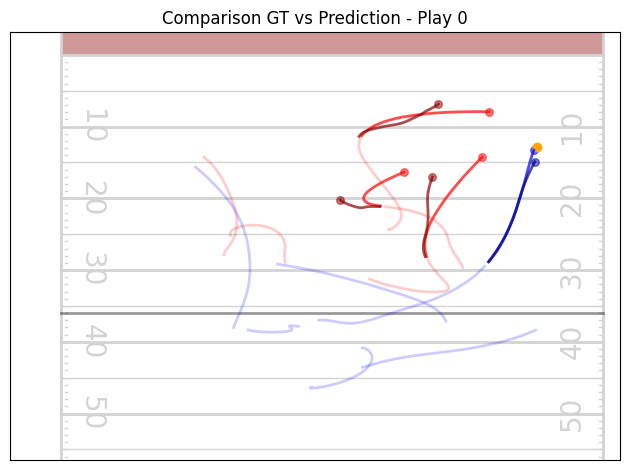

[PRE]   Player 12 mse_loss: 0.045118849724531174
[POST]  Player 12 mse_loss: 0.055072054266929626


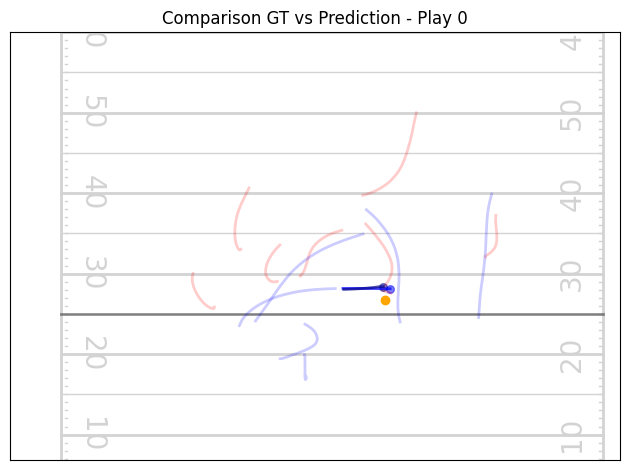

[PRE]   Player 1 mse_loss: 0.03708517178893089
[POST]  Player 1 mse_loss: 0.028405919671058655
[PRE]   Player 4 mse_loss: 0.051012858748435974
[POST]  Player 4 mse_loss: 0.050446461886167526
[PRE]   Player 6 mse_loss: 0.0019445347134023905
[POST]  Player 6 mse_loss: 0.0022840932942926884
[PRE]   Player 12 mse_loss: 0.06245945766568184
[POST]  Player 12 mse_loss: 0.05928315222263336


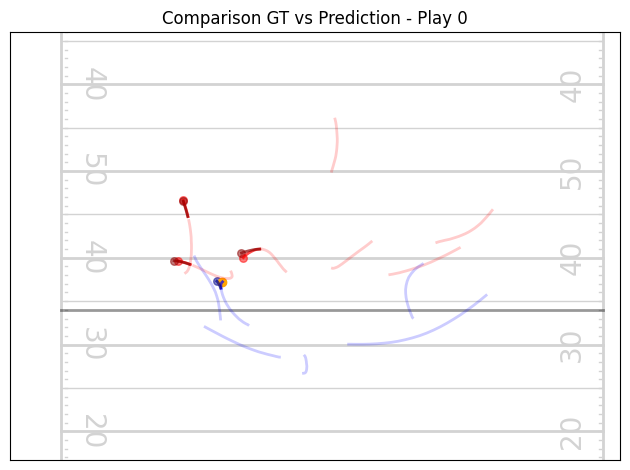

[PRE]   Player 5 mse_loss: 0.058778900653123856
[POST]  Player 5 mse_loss: 0.03758477047085762
[PRE]   Player 6 mse_loss: 0.16029399633407593
[POST]  Player 6 mse_loss: 0.15510304272174835
[PRE]   Player 12 mse_loss: 0.007783178705722094
[POST]  Player 12 mse_loss: 0.010037797503173351


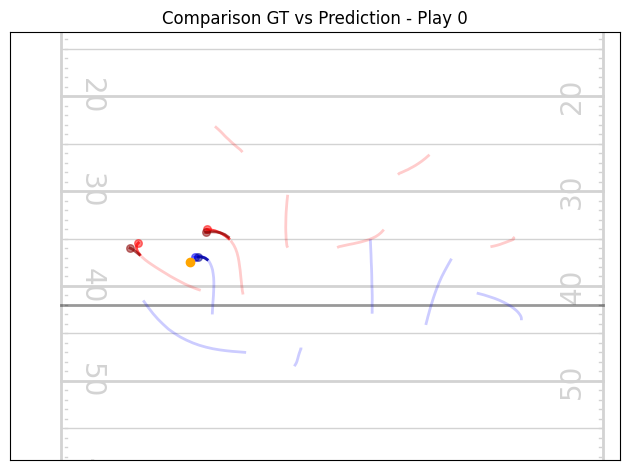

[PRE]   Player 0 mse_loss: 0.015685155987739563
[POST]  Player 0 mse_loss: 0.017998507246375084
[PRE]   Player 1 mse_loss: 0.09804603457450867
[POST]  Player 1 mse_loss: 0.10124585777521133
[PRE]   Player 12 mse_loss: 0.01730743981897831
[POST]  Player 12 mse_loss: 0.015862060710787773


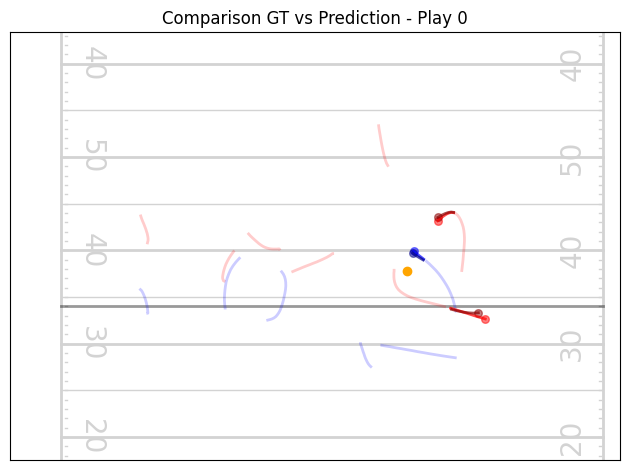

[PRE]   Player 1 mse_loss: 0.013327497988939285
[POST]  Player 1 mse_loss: 0.01006305031478405
[PRE]   Player 2 mse_loss: 0.020001431927084923
[POST]  Player 2 mse_loss: 0.0236348919570446
[PRE]   Player 12 mse_loss: 0.020220955833792686
[POST]  Player 12 mse_loss: 0.025674698874354362


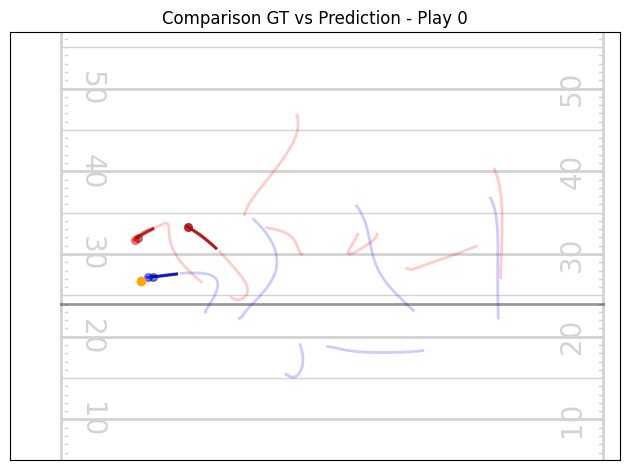

[PRE]   Player 0 mse_loss: 0.11690127104520798
[POST]  Player 0 mse_loss: 0.11226358264684677
[PRE]   Player 12 mse_loss: 0.5713379979133606
[POST]  Player 12 mse_loss: 0.5381132960319519


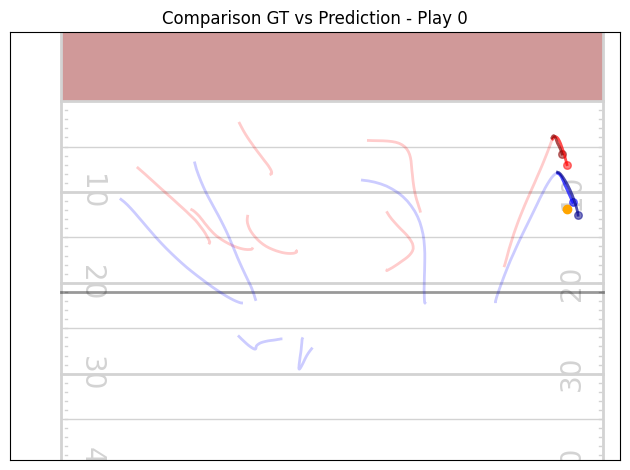

[PRE]   Player 1 mse_loss: 0.3106963634490967
[POST]  Player 1 mse_loss: 0.3253288269042969
[PRE]   Player 3 mse_loss: 0.5157868266105652
[POST]  Player 3 mse_loss: 0.5332242846488953
[PRE]   Player 4 mse_loss: 0.07844547182321548
[POST]  Player 4 mse_loss: 0.08569147437810898
[PRE]   Player 6 mse_loss: 0.14527057111263275
[POST]  Player 6 mse_loss: 0.16056957840919495
[PRE]   Player 12 mse_loss: 0.025569962337613106
[POST]  Player 12 mse_loss: 0.02977842651307583


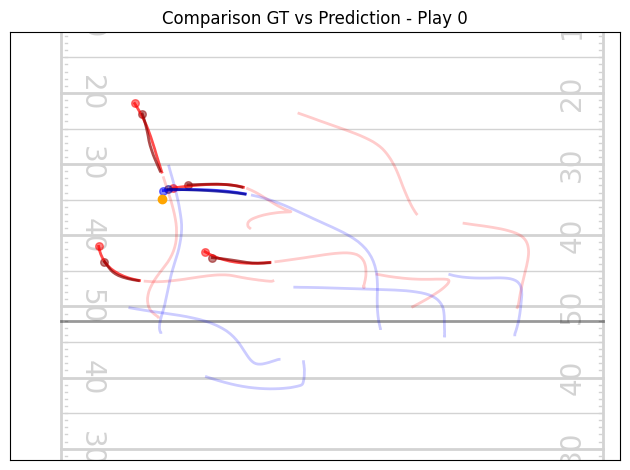

[PRE]   Player 4 mse_loss: 0.030668113380670547
[POST]  Player 4 mse_loss: 0.03899175673723221
[PRE]   Player 12 mse_loss: 0.07920018583536148
[POST]  Player 12 mse_loss: 0.09136209636926651


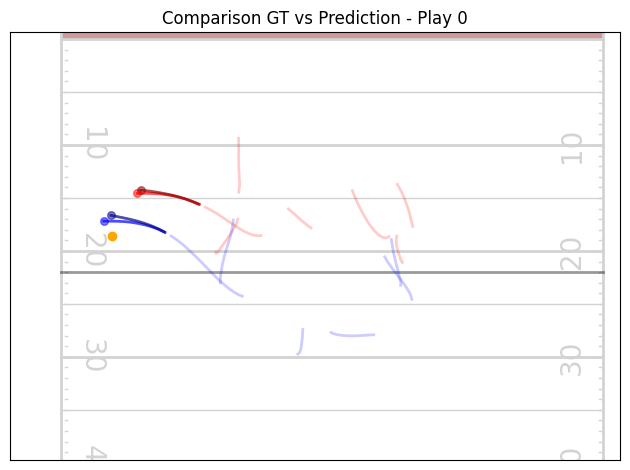

[PRE]   Player 4 mse_loss: 0.0887514278292656
[POST]  Player 4 mse_loss: 0.09863367676734924
[PRE]   Player 12 mse_loss: 0.12120236456394196
[POST]  Player 12 mse_loss: 0.11910511553287506


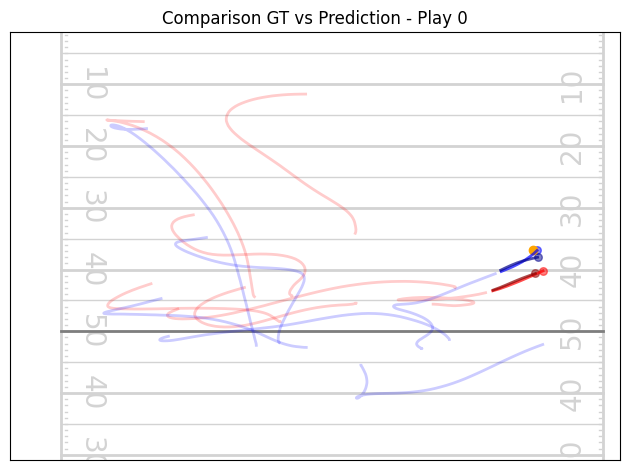

[PRE]   Player 4 mse_loss: 0.047284841537475586
[POST]  Player 4 mse_loss: 0.06560949981212616
[PRE]   Player 11 mse_loss: 0.029473332688212395
[POST]  Player 11 mse_loss: 0.0451178140938282


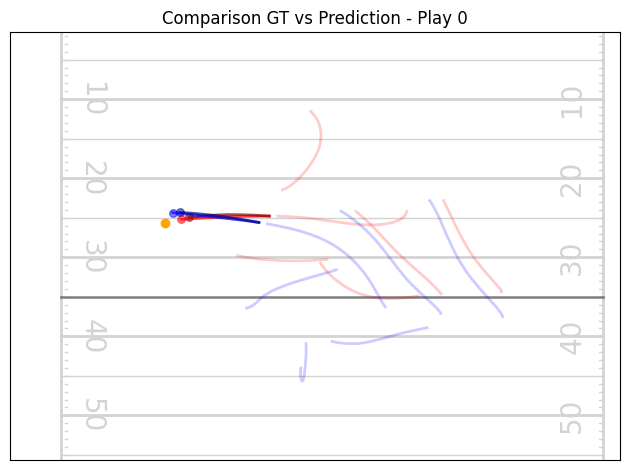

[PRE]   Player 5 mse_loss: 0.04529349133372307
[POST]  Player 5 mse_loss: 0.05363190174102783
[PRE]   Player 11 mse_loss: 0.012946623377501965
[POST]  Player 11 mse_loss: 0.014582343399524689


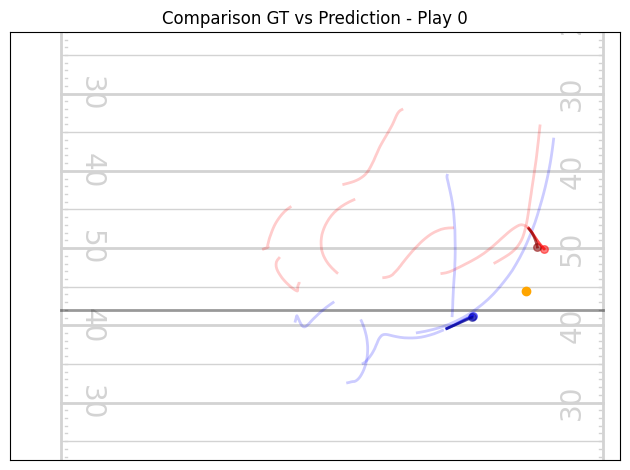

[PRE]   Player 0 mse_loss: 2.168177604675293
[POST]  Player 0 mse_loss: 1.5935167074203491
[PRE]   Player 1 mse_loss: 16.708782196044922
[POST]  Player 1 mse_loss: 16.684452056884766
[PRE]   Player 3 mse_loss: 5.026800155639648
[POST]  Player 3 mse_loss: 5.0189948081970215
[PRE]   Player 4 mse_loss: 1.280755877494812
[POST]  Player 4 mse_loss: 1.2941628694534302
[PRE]   Player 6 mse_loss: 3.5474789142608643
[POST]  Player 6 mse_loss: 3.507659912109375
[PRE]   Player 10 mse_loss: 1.5139415264129639
[POST]  Player 10 mse_loss: 1.50076162815094


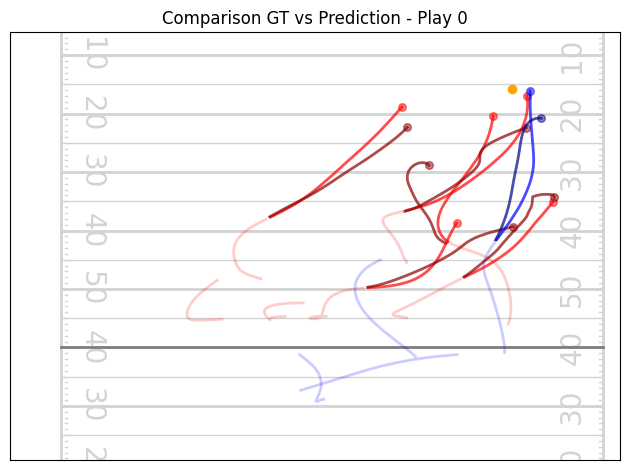

[PRE]   Player 0 mse_loss: 0.02406420186161995
[POST]  Player 0 mse_loss: 0.017894092947244644
[PRE]   Player 3 mse_loss: 0.06748174875974655
[POST]  Player 3 mse_loss: 0.06056986004114151
[PRE]   Player 4 mse_loss: 0.6495099067687988
[POST]  Player 4 mse_loss: 0.6428007483482361
[PRE]   Player 6 mse_loss: 0.17453086376190186
[POST]  Player 6 mse_loss: 0.18394434452056885
[PRE]   Player 10 mse_loss: 0.1368563324213028
[POST]  Player 10 mse_loss: 0.1255919635295868


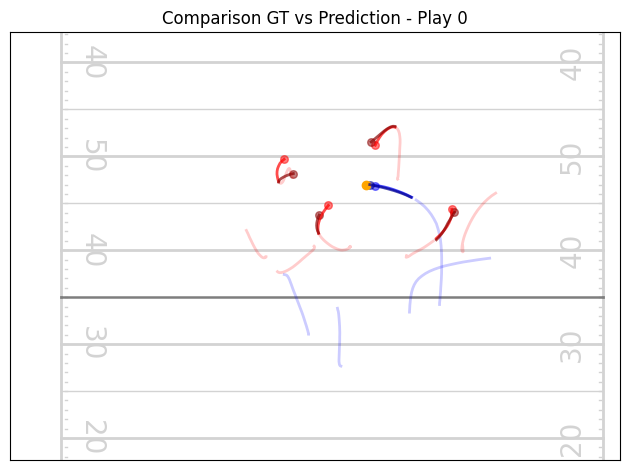

[PRE]   Player 2 mse_loss: 2.721949577331543
[POST]  Player 2 mse_loss: 2.634166955947876
[PRE]   Player 11 mse_loss: 0.5848732590675354
[POST]  Player 11 mse_loss: 0.5744930505752563


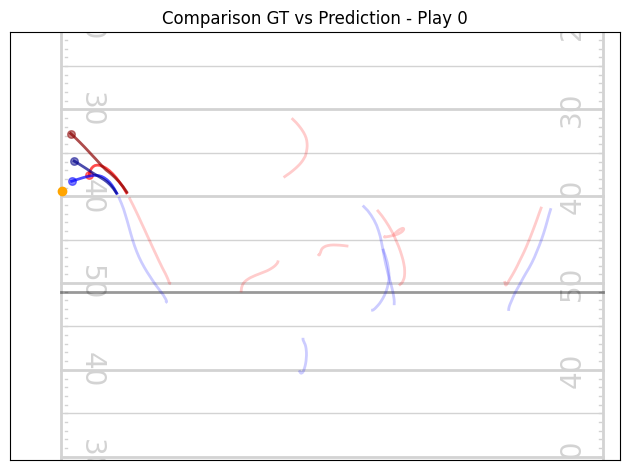

[PRE]   Player 0 mse_loss: 0.150090754032135
[POST]  Player 0 mse_loss: 0.13684512674808502
[PRE]   Player 2 mse_loss: 1.5301156044006348
[POST]  Player 2 mse_loss: 1.5346201658248901
[PRE]   Player 4 mse_loss: 0.5865656733512878
[POST]  Player 4 mse_loss: 0.5864943265914917
[PRE]   Player 5 mse_loss: 2.874652624130249
[POST]  Player 5 mse_loss: 2.8603551387786865
[PRE]   Player 6 mse_loss: 1.001510739326477
[POST]  Player 6 mse_loss: 1.0014199018478394
[PRE]   Player 12 mse_loss: 0.2637346386909485
[POST]  Player 12 mse_loss: 0.25528696179389954


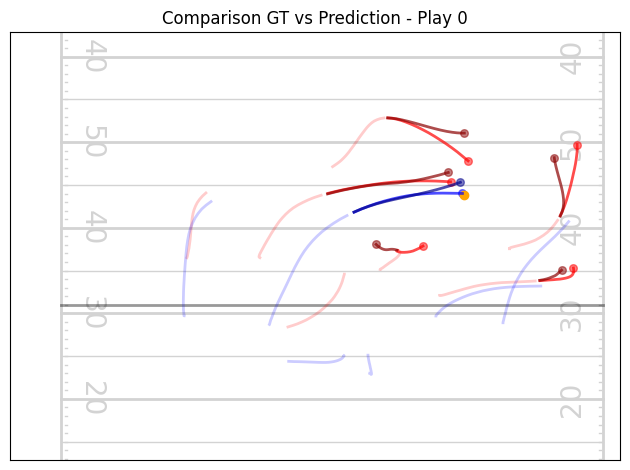

[PRE]   Player 1 mse_loss: 1.5197327136993408
[POST]  Player 1 mse_loss: 1.494267225265503
[PRE]   Player 10 mse_loss: 0.20922234654426575
[POST]  Player 10 mse_loss: 0.20644402503967285


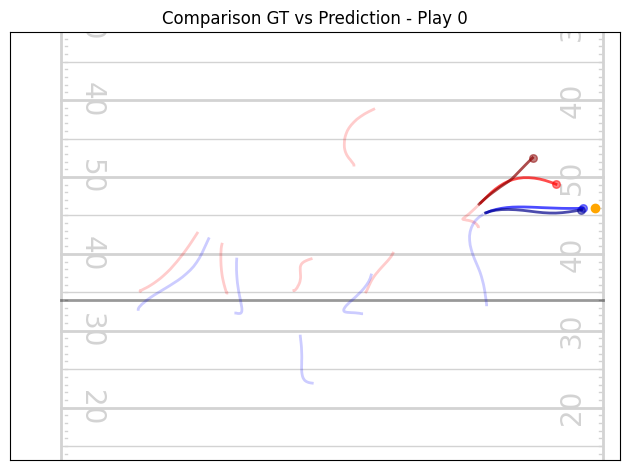

[PRE]   Player 1 mse_loss: 0.5245203375816345
[POST]  Player 1 mse_loss: 0.5331160426139832
[PRE]   Player 2 mse_loss: 0.2911175787448883
[POST]  Player 2 mse_loss: 0.29046833515167236
[PRE]   Player 12 mse_loss: 0.04369929060339928
[POST]  Player 12 mse_loss: 0.041828591376543045


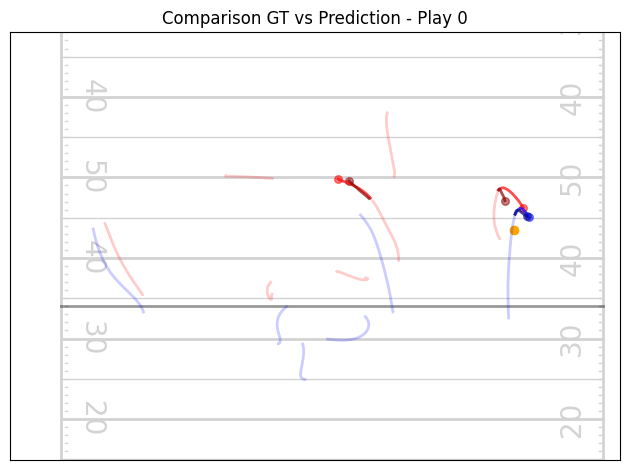

[PRE]   Player 0 mse_loss: 0.07277629524469376
[POST]  Player 0 mse_loss: 0.0639190822839737
[PRE]   Player 5 mse_loss: 0.8307887315750122
[POST]  Player 5 mse_loss: 0.8033941388130188
[PRE]   Player 10 mse_loss: 0.37040746212005615
[POST]  Player 10 mse_loss: 0.36556243896484375


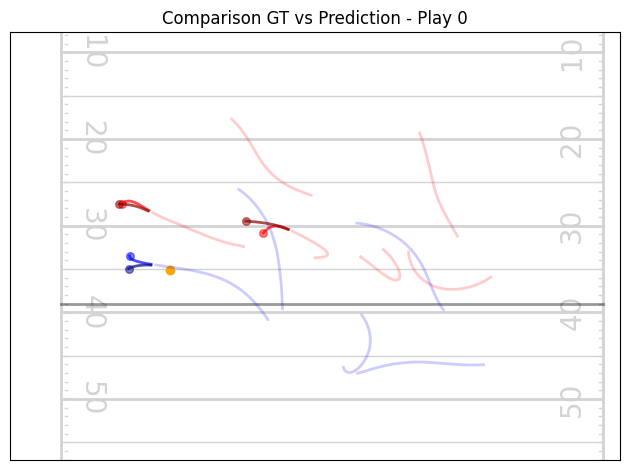

[PRE]   Player 3 mse_loss: 0.829089879989624
[POST]  Player 3 mse_loss: 0.8126022219657898
[PRE]   Player 4 mse_loss: 1.0324654579162598
[POST]  Player 4 mse_loss: 1.0308823585510254
[PRE]   Player 11 mse_loss: 1.1093405485153198
[POST]  Player 11 mse_loss: 1.09995698928833


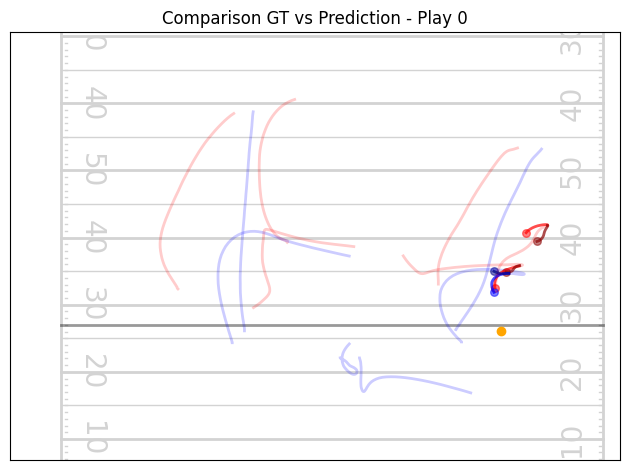

[PRE]   Player 1 mse_loss: 0.024294227361679077
[POST]  Player 1 mse_loss: 0.03705846518278122
[PRE]   Player 2 mse_loss: 0.09448888897895813
[POST]  Player 2 mse_loss: 0.09091997891664505
[PRE]   Player 9 mse_loss: 0.09012648463249207
[POST]  Player 9 mse_loss: 0.1148538812994957


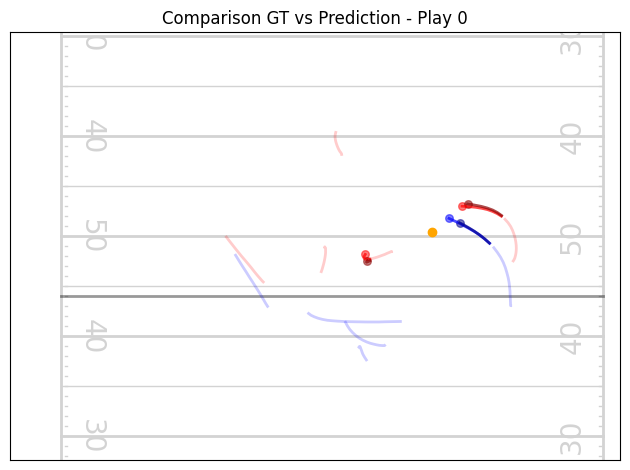

[PRE]   Player 1 mse_loss: 0.45563268661499023
[POST]  Player 1 mse_loss: 0.44299525022506714
[PRE]   Player 2 mse_loss: 1.0492616891860962
[POST]  Player 2 mse_loss: 1.0784233808517456
[PRE]   Player 5 mse_loss: 1.2064036130905151
[POST]  Player 5 mse_loss: 1.2221122980117798
[PRE]   Player 12 mse_loss: 0.40047183632850647
[POST]  Player 12 mse_loss: 0.4164712429046631


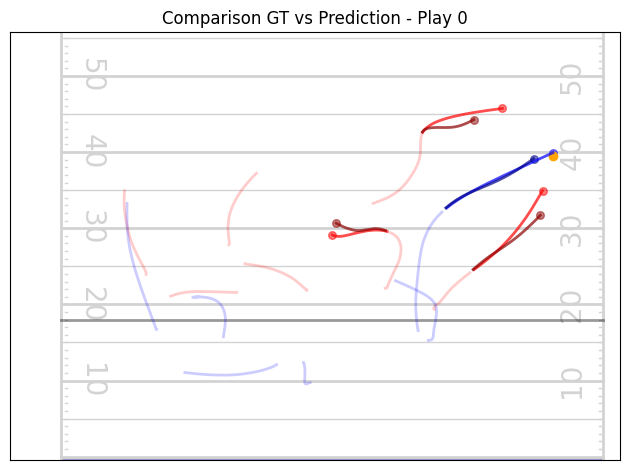

[PRE]   Player 3 mse_loss: 0.12110617011785507
[POST]  Player 3 mse_loss: 0.10885210335254669
[PRE]   Player 4 mse_loss: 0.33572250604629517
[POST]  Player 4 mse_loss: 0.3530578911304474
[PRE]   Player 6 mse_loss: 0.06903152912855148
[POST]  Player 6 mse_loss: 0.08615267276763916
[PRE]   Player 12 mse_loss: 0.05306721478700638
[POST]  Player 12 mse_loss: 0.06283280998468399


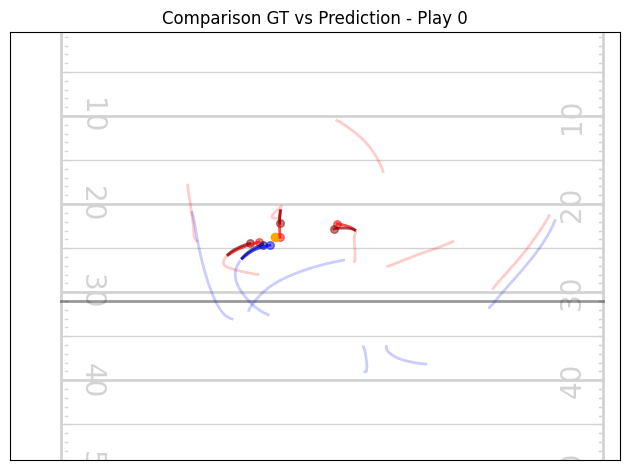

[PRE]   Player 1 mse_loss: 0.11309804767370224
[POST]  Player 1 mse_loss: 0.08435746282339096
[PRE]   Player 3 mse_loss: 0.05023223161697388
[POST]  Player 3 mse_loss: 0.05705515295267105
[PRE]   Player 7 mse_loss: 0.04425801336765289
[POST]  Player 7 mse_loss: 0.04177944362163544
[PRE]   Player 13 mse_loss: 0.07463288307189941
[POST]  Player 13 mse_loss: 0.07761789858341217


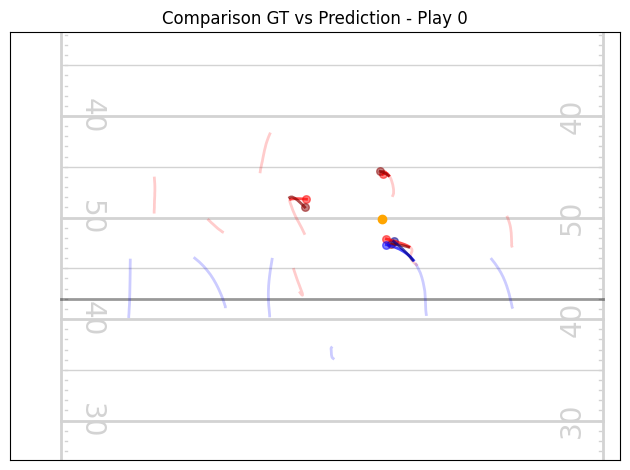

[PRE]   Player 5 mse_loss: 0.06269803643226624
[POST]  Player 5 mse_loss: 0.05170891806483269
[PRE]   Player 12 mse_loss: 0.12337228655815125
[POST]  Player 12 mse_loss: 0.11559836566448212


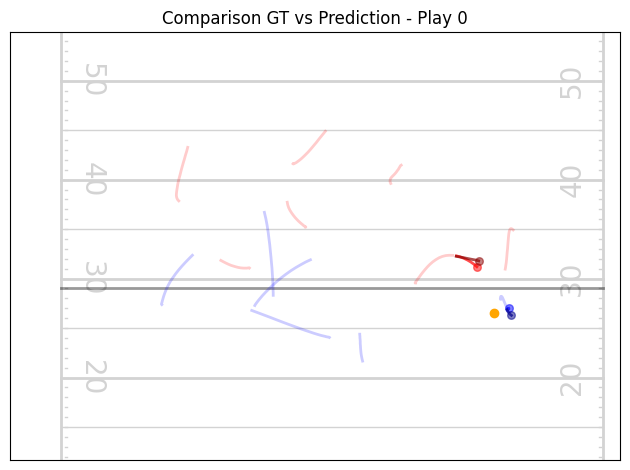

[PRE]   Player 1 mse_loss: 0.03251313045620918
[POST]  Player 1 mse_loss: 0.023253442719578743
[PRE]   Player 12 mse_loss: 0.27873438596725464
[POST]  Player 12 mse_loss: 0.2620650827884674


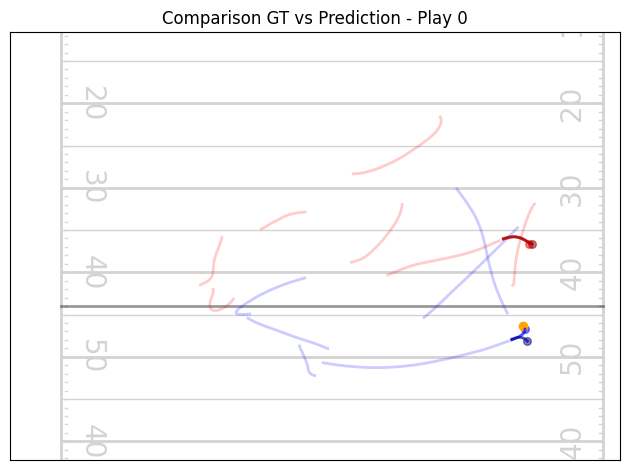

[PRE]   Player 6 mse_loss: 2.393768787384033
[POST]  Player 6 mse_loss: 2.371273994445801
[PRE]   Player 11 mse_loss: 0.14619916677474976
[POST]  Player 11 mse_loss: 0.1451931595802307


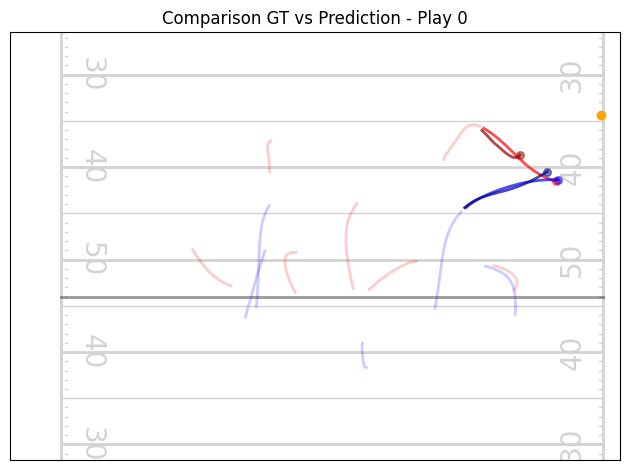

[PRE]   Player 3 mse_loss: 0.012367242947220802
[POST]  Player 3 mse_loss: 0.0119602270424366
[PRE]   Player 4 mse_loss: 0.37055814266204834
[POST]  Player 4 mse_loss: 0.34117943048477173
[PRE]   Player 10 mse_loss: 0.04218830540776253
[POST]  Player 10 mse_loss: 0.03582794964313507


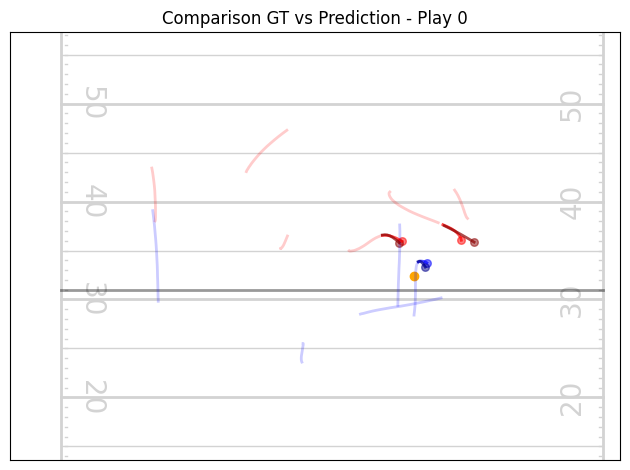

[PRE]   Player 6 mse_loss: 0.021355709061026573
[POST]  Player 6 mse_loss: 0.014915376901626587
[PRE]   Player 12 mse_loss: 0.749435305595398
[POST]  Player 12 mse_loss: 0.7364927530288696


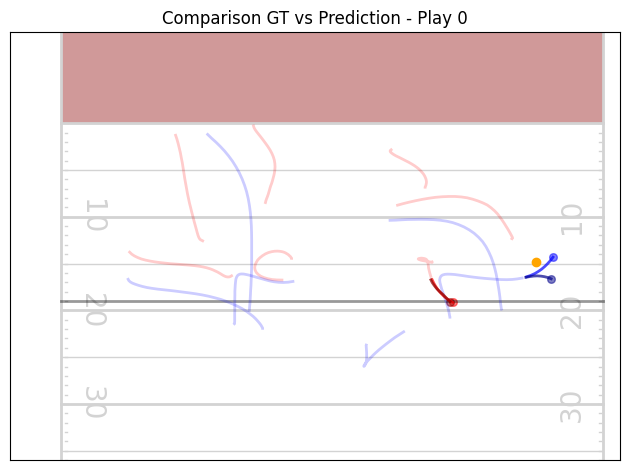

In [74]:
batch_iter= iter(test_loader)

for j in range(len(test_loader)):
    batch = next(batch_iter)

    y = batch["y"].to(device)
    preds = model(gnn_test_batch_list[j].to(device))

    for i in range(y.shape[0]):
        visualize_comparison(batch["x_nodes"],
                             batch["input_mask"],
                             y,
                             preds,
                             batch["output_mask"],
                             batch["x_global"][i, 2],
                             batch["x_global"][i, 5:7],
                             batch_idx= i)

[PRE]   Player 4 mse_loss: 0.08420675992965698
[POST]  Player 4 mse_loss: 0.06133656948804855
[PRE]   Player 6 mse_loss: 0.0784403458237648
[POST]  Player 6 mse_loss: 0.08546926826238632
[PRE]   Player 10 mse_loss: 0.08698853105306625
[POST]  Player 10 mse_loss: 0.10963402688503265


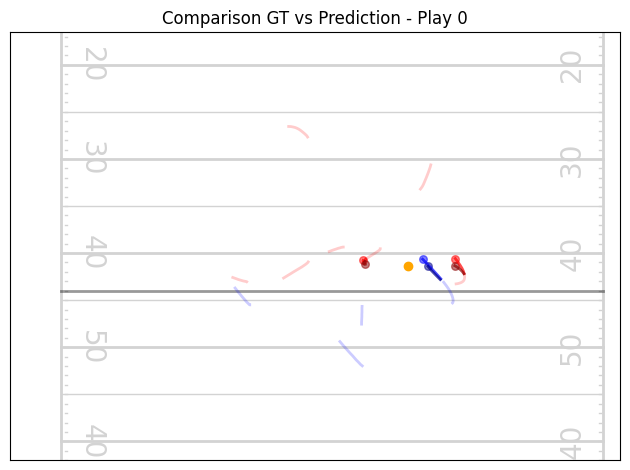

[PRE]   Player 2 mse_loss: 0.06991255283355713
[POST]  Player 2 mse_loss: 0.0689171701669693
[PRE]   Player 3 mse_loss: 0.08433368057012558
[POST]  Player 3 mse_loss: 0.08272465318441391
[PRE]   Player 9 mse_loss: 0.0590067021548748
[POST]  Player 9 mse_loss: 0.06717729568481445


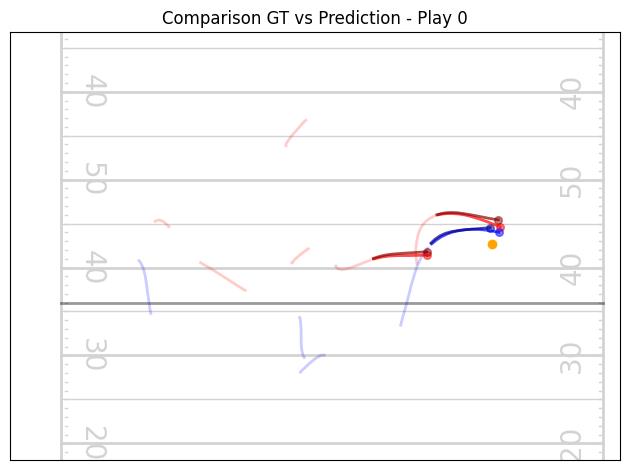

[PRE]   Player 0 mse_loss: 0.12188344448804855
[POST]  Player 0 mse_loss: 0.14000193774700165
[PRE]   Player 5 mse_loss: 0.08170182257890701
[POST]  Player 5 mse_loss: 0.07164592295885086
[PRE]   Player 12 mse_loss: 0.016853127628564835
[POST]  Player 12 mse_loss: 0.023990362882614136


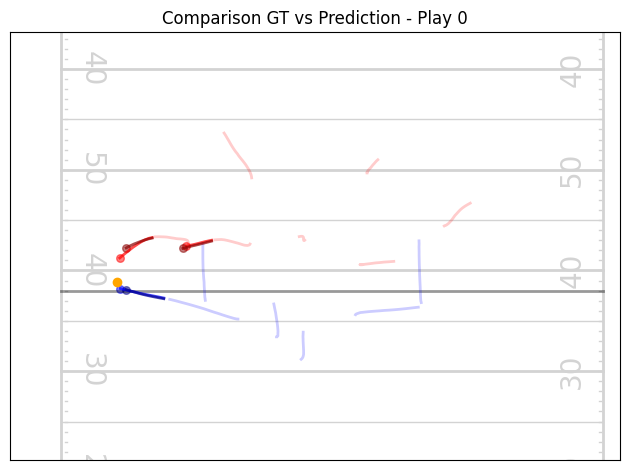

[PRE]   Player 2 mse_loss: 0.54921954870224
[POST]  Player 2 mse_loss: 0.5388392806053162
[PRE]   Player 3 mse_loss: 0.14269685745239258
[POST]  Player 3 mse_loss: 0.14907898008823395
[PRE]   Player 5 mse_loss: 0.2799392640590668
[POST]  Player 5 mse_loss: 0.27778688073158264
[PRE]   Player 10 mse_loss: 0.09685483574867249
[POST]  Player 10 mse_loss: 0.08942880481481552


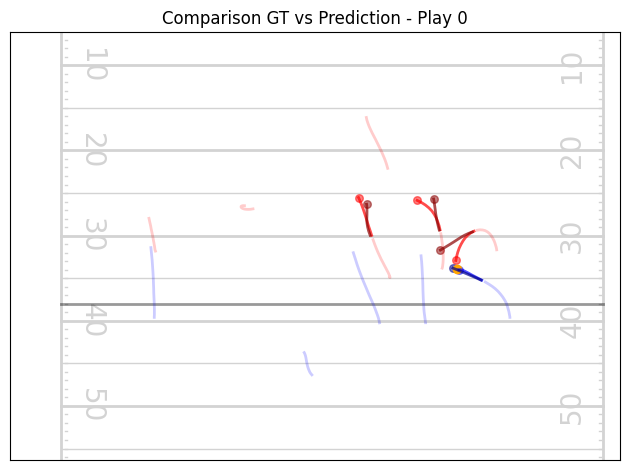

[PRE]   Player 4 mse_loss: 0.2929933965206146
[POST]  Player 4 mse_loss: 0.2976023852825165
[PRE]   Player 11 mse_loss: 0.2604545056819916
[POST]  Player 11 mse_loss: 0.2766953408718109


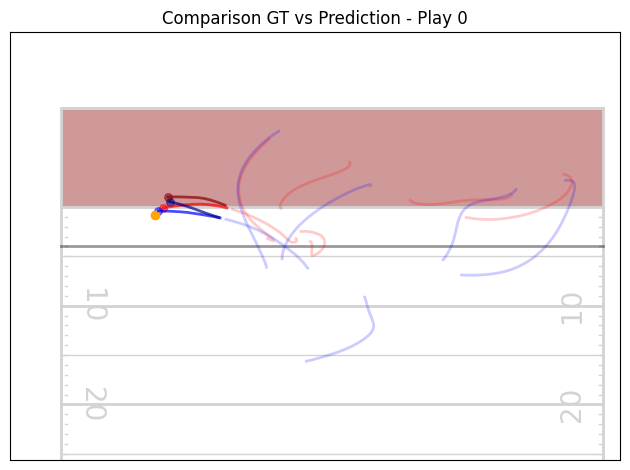

[PRE]   Player 2 mse_loss: 0.9017958641052246
[POST]  Player 2 mse_loss: 0.8898266553878784
[PRE]   Player 3 mse_loss: 0.20219576358795166
[POST]  Player 3 mse_loss: 0.22466884553432465
[PRE]   Player 4 mse_loss: 0.41217172145843506
[POST]  Player 4 mse_loss: 0.41501736640930176
[PRE]   Player 5 mse_loss: 0.7049895524978638
[POST]  Player 5 mse_loss: 0.6911308169364929
[PRE]   Player 10 mse_loss: 0.3105083405971527
[POST]  Player 10 mse_loss: 0.3246915638446808


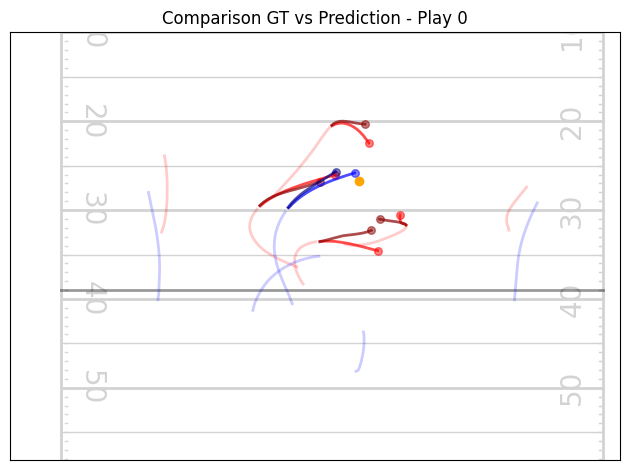

[PRE]   Player 0 mse_loss: 0.04961760714650154
[POST]  Player 0 mse_loss: 0.06870865821838379
[PRE]   Player 1 mse_loss: 0.40518710017204285
[POST]  Player 1 mse_loss: 0.3870648443698883
[PRE]   Player 4 mse_loss: 0.26116979122161865
[POST]  Player 4 mse_loss: 0.26168665289878845
[PRE]   Player 11 mse_loss: 0.07420755922794342
[POST]  Player 11 mse_loss: 0.07984563708305359


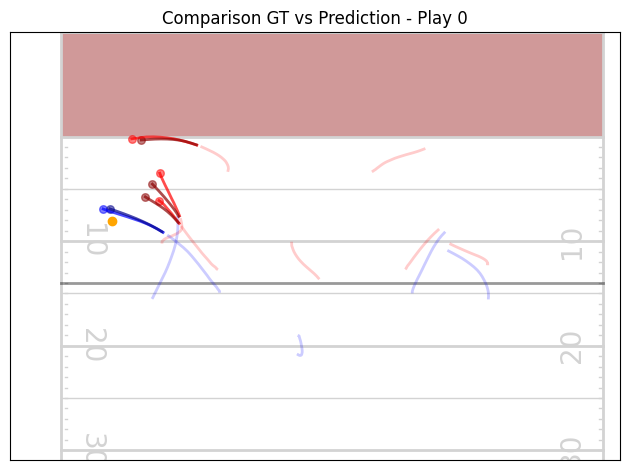

[PRE]   Player 2 mse_loss: 0.009638682007789612
[POST]  Player 2 mse_loss: 0.009792013093829155
[PRE]   Player 13 mse_loss: 0.009200440719723701
[POST]  Player 13 mse_loss: 0.018331123515963554


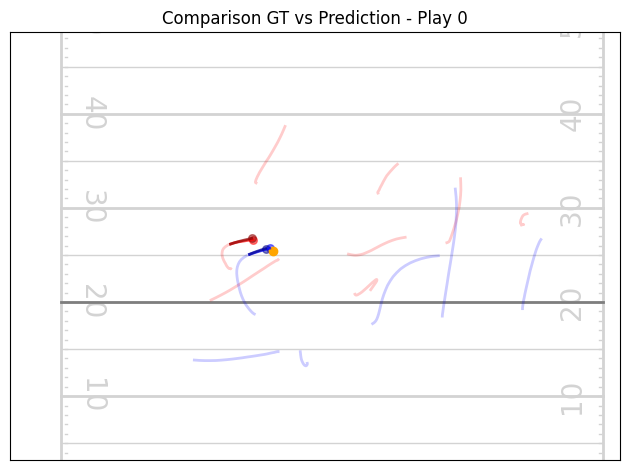

[PRE]   Player 3 mse_loss: 0.09040700644254684
[POST]  Player 3 mse_loss: 0.10966269671916962
[PRE]   Player 4 mse_loss: 1.1643646955490112
[POST]  Player 4 mse_loss: 1.1812009811401367
[PRE]   Player 6 mse_loss: 0.17576541006565094
[POST]  Player 6 mse_loss: 0.19272688031196594
[PRE]   Player 12 mse_loss: 0.24186694622039795
[POST]  Player 12 mse_loss: 0.2541331350803375


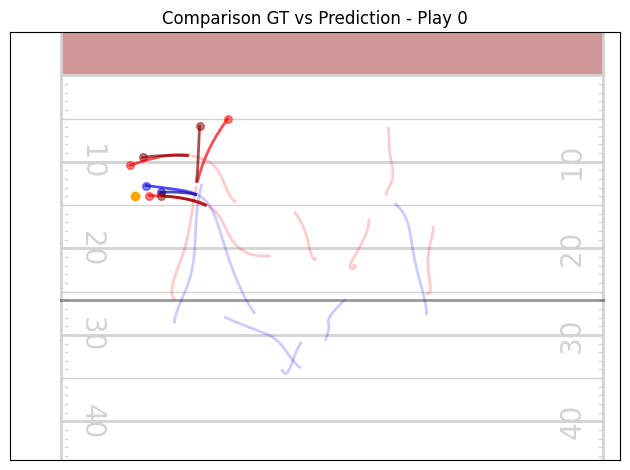

[PRE]   Player 3 mse_loss: 0.07734420150518417
[POST]  Player 3 mse_loss: 0.07552444934844971
[PRE]   Player 6 mse_loss: 0.18331710994243622
[POST]  Player 6 mse_loss: 0.1805429309606552
[PRE]   Player 12 mse_loss: 0.03705703839659691
[POST]  Player 12 mse_loss: 0.03710212931036949


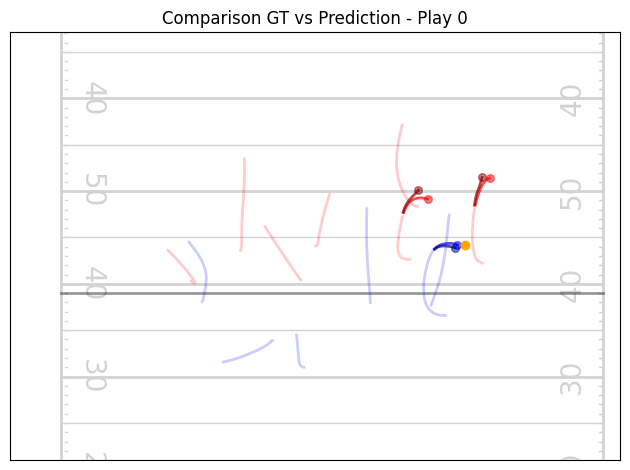

[PRE]   Player 0 mse_loss: 0.003324710763990879
[POST]  Player 0 mse_loss: 0.003402486676350236
[PRE]   Player 3 mse_loss: 0.03840294107794762
[POST]  Player 3 mse_loss: 0.03788332641124725
[PRE]   Player 5 mse_loss: 0.12902069091796875
[POST]  Player 5 mse_loss: 0.1506694257259369
[PRE]   Player 12 mse_loss: 0.0502333790063858
[POST]  Player 12 mse_loss: 0.06616213917732239


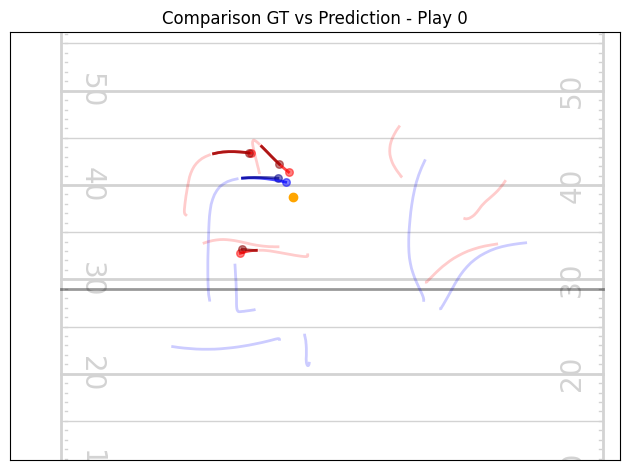

[PRE]   Player 0 mse_loss: 0.4541635811328888
[POST]  Player 0 mse_loss: 0.44611966609954834
[PRE]   Player 3 mse_loss: 0.17045123875141144
[POST]  Player 3 mse_loss: 0.17906151711940765
[PRE]   Player 4 mse_loss: 1.7439370155334473
[POST]  Player 4 mse_loss: 1.7367234230041504
[PRE]   Player 5 mse_loss: 0.18624170124530792
[POST]  Player 5 mse_loss: 0.18412931263446808
[PRE]   Player 6 mse_loss: 0.20636707544326782
[POST]  Player 6 mse_loss: 0.20642894506454468
[PRE]   Player 12 mse_loss: 0.10951370000839233
[POST]  Player 12 mse_loss: 0.11446934938430786


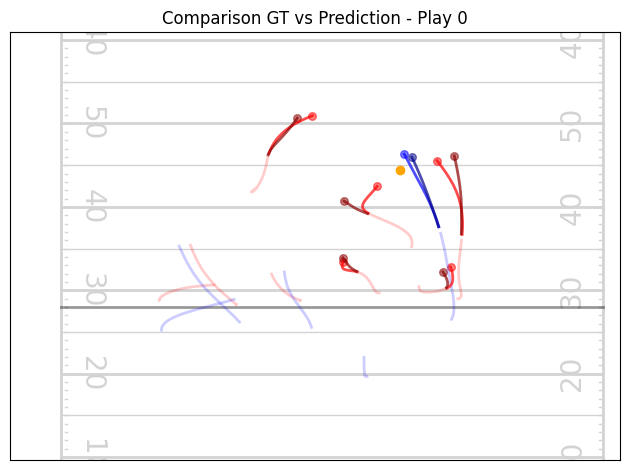

[PRE]   Player 1 mse_loss: 0.15154960751533508
[POST]  Player 1 mse_loss: 0.15741093456745148
[PRE]   Player 2 mse_loss: 0.0688122883439064
[POST]  Player 2 mse_loss: 0.07611873000860214
[PRE]   Player 3 mse_loss: 0.8160325288772583
[POST]  Player 3 mse_loss: 0.8155713081359863
[PRE]   Player 4 mse_loss: 2.2279434204101562
[POST]  Player 4 mse_loss: 2.20967960357666
[PRE]   Player 11 mse_loss: 0.1179850846529007
[POST]  Player 11 mse_loss: 0.1186596006155014


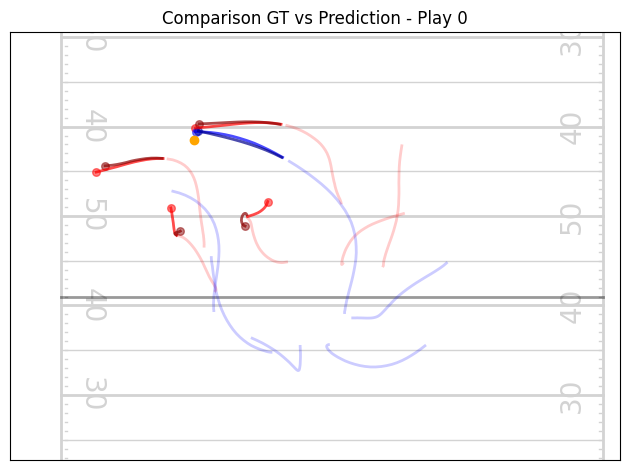

[PRE]   Player 0 mse_loss: 0.07512110471725464
[POST]  Player 0 mse_loss: 0.06463649123907089
[PRE]   Player 3 mse_loss: 0.04855920001864433
[POST]  Player 3 mse_loss: 0.05712936073541641
[PRE]   Player 4 mse_loss: 0.7858847975730896
[POST]  Player 4 mse_loss: 0.7792864441871643
[PRE]   Player 5 mse_loss: 0.0939471647143364
[POST]  Player 5 mse_loss: 0.09783436357975006
[PRE]   Player 12 mse_loss: 0.07041551172733307
[POST]  Player 12 mse_loss: 0.07265110313892365


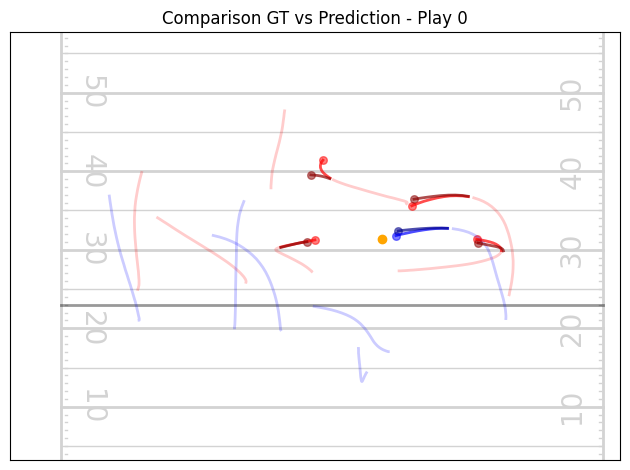

[PRE]   Player 0 mse_loss: 0.7857449054718018
[POST]  Player 0 mse_loss: 0.7766999006271362
[PRE]   Player 1 mse_loss: 1.211476445198059
[POST]  Player 1 mse_loss: 1.2322930097579956
[PRE]   Player 3 mse_loss: 0.2704319357872009
[POST]  Player 3 mse_loss: 0.2756456732749939
[PRE]   Player 5 mse_loss: 0.17552942037582397
[POST]  Player 5 mse_loss: 0.18802575767040253
[PRE]   Player 6 mse_loss: 7.78692626953125
[POST]  Player 6 mse_loss: 7.784249782562256
[PRE]   Player 10 mse_loss: 1.3960649967193604
[POST]  Player 10 mse_loss: 1.4213716983795166


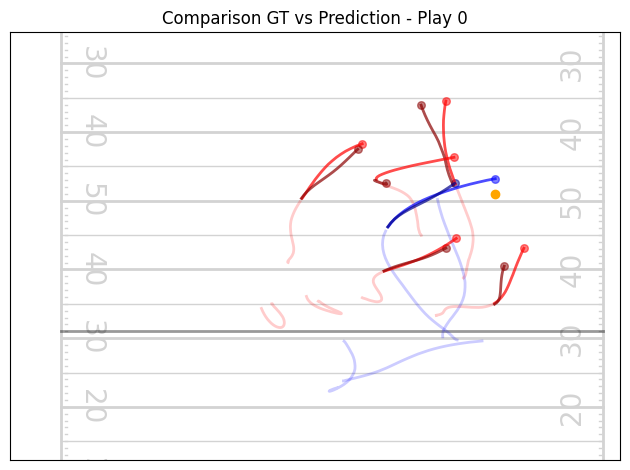

[PRE]   Player 2 mse_loss: 0.4459105134010315
[POST]  Player 2 mse_loss: 0.46342211961746216
[PRE]   Player 9 mse_loss: 0.04150613769888878
[POST]  Player 9 mse_loss: 0.045571472495794296


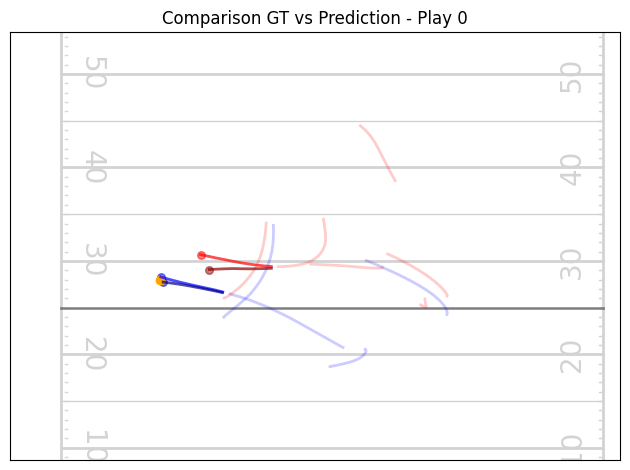

[PRE]   Player 3 mse_loss: 0.10352013260126114
[POST]  Player 3 mse_loss: 0.1002013236284256
[PRE]   Player 12 mse_loss: 0.0509834811091423
[POST]  Player 12 mse_loss: 0.0662468746304512


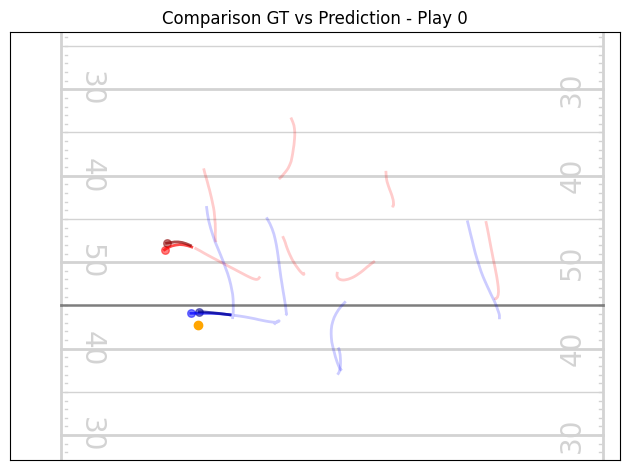

[PRE]   Player 5 mse_loss: 0.12414254248142242
[POST]  Player 5 mse_loss: 0.12892001867294312
[PRE]   Player 6 mse_loss: 0.19222784042358398
[POST]  Player 6 mse_loss: 0.17105932533740997
[PRE]   Player 12 mse_loss: 0.16964589059352875
[POST]  Player 12 mse_loss: 0.18675649166107178


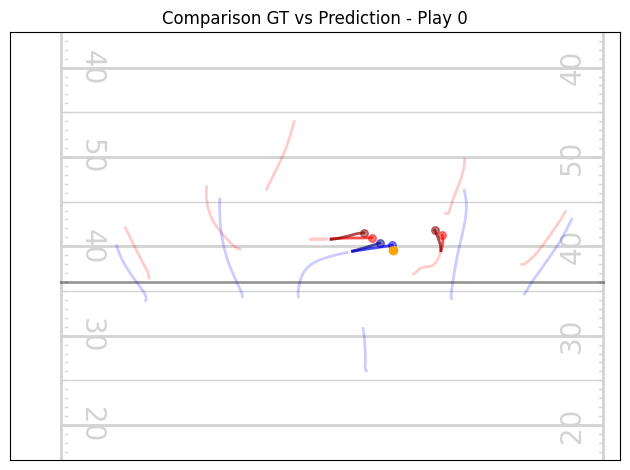

[PRE]   Player 1 mse_loss: 0.12009603530168533
[POST]  Player 1 mse_loss: 0.1321265548467636
[PRE]   Player 3 mse_loss: 0.6176007390022278
[POST]  Player 3 mse_loss: 0.6564807891845703
[PRE]   Player 6 mse_loss: 0.20968736708164215
[POST]  Player 6 mse_loss: 0.20338405668735504
[PRE]   Player 12 mse_loss: 0.027404097840189934
[POST]  Player 12 mse_loss: 0.026565667241811752


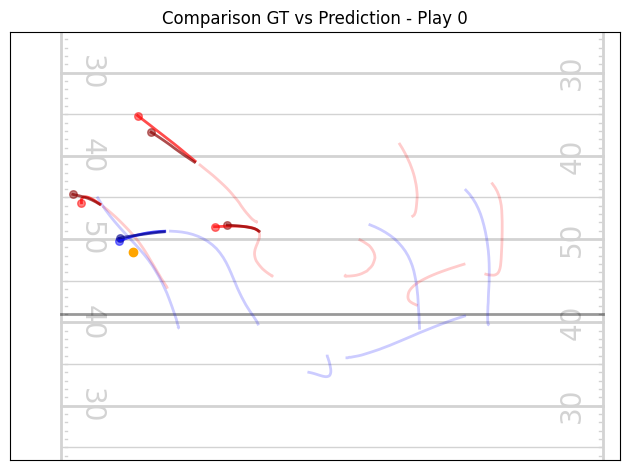

[PRE]   Player 3 mse_loss: 0.035920798778533936
[POST]  Player 3 mse_loss: 0.05294015258550644
[PRE]   Player 12 mse_loss: 0.04894616827368736
[POST]  Player 12 mse_loss: 0.05328236147761345


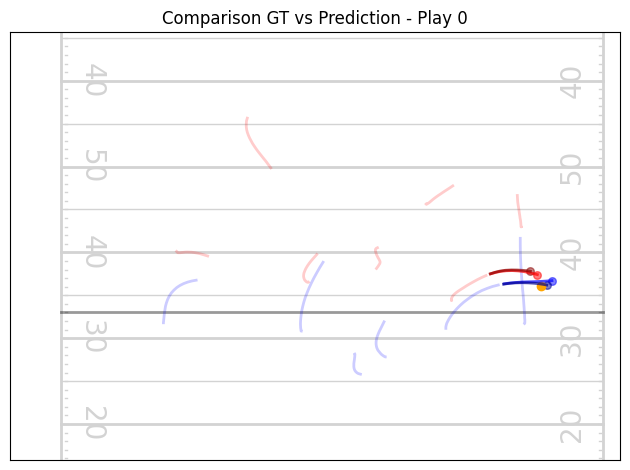

[PRE]   Player 1 mse_loss: 0.0960523709654808
[POST]  Player 1 mse_loss: 0.09490756690502167
[PRE]   Player 11 mse_loss: 0.01336739957332611
[POST]  Player 11 mse_loss: 0.01636524870991707


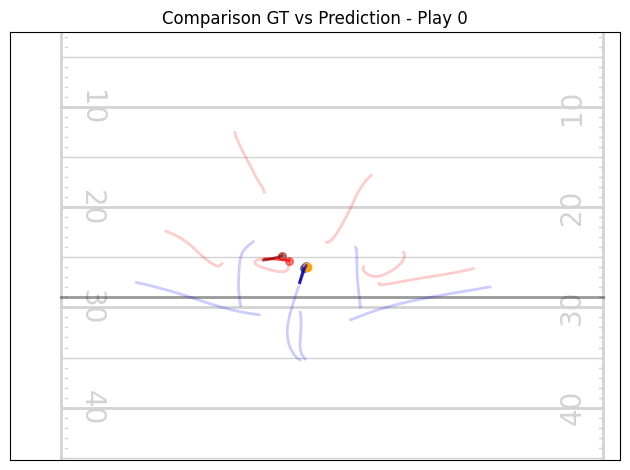

[PRE]   Player 2 mse_loss: 0.027739346027374268
[POST]  Player 2 mse_loss: 0.024905752390623093
[PRE]   Player 4 mse_loss: 0.3067893981933594
[POST]  Player 4 mse_loss: 0.30517005920410156
[PRE]   Player 5 mse_loss: 0.13564462959766388
[POST]  Player 5 mse_loss: 0.14614808559417725
[PRE]   Player 9 mse_loss: 0.021455591544508934
[POST]  Player 9 mse_loss: 0.030075054615736008


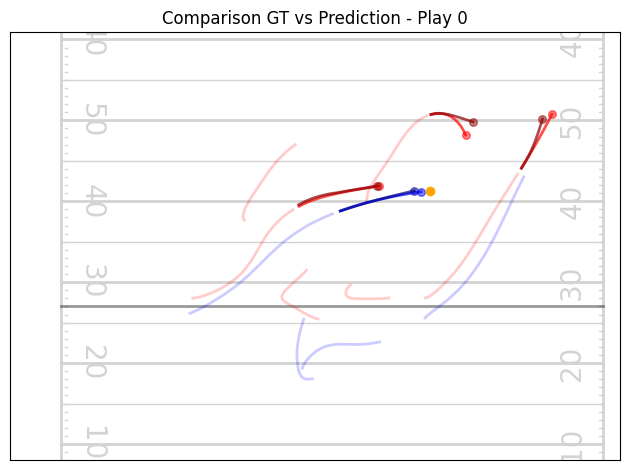

[PRE]   Player 12 mse_loss: 0.04917662590742111
[POST]  Player 12 mse_loss: 0.03902766853570938


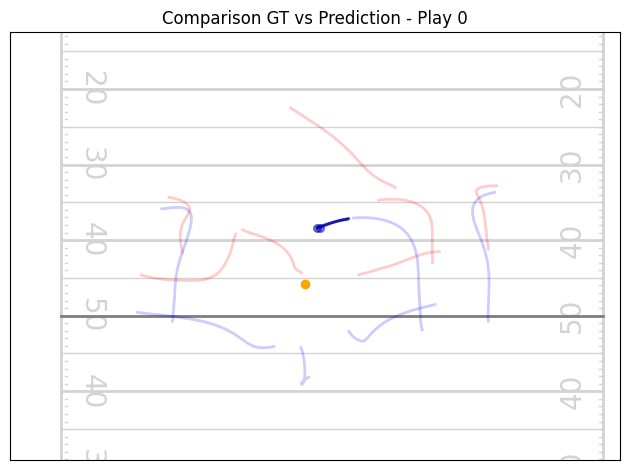

[PRE]   Player 0 mse_loss: 0.025418827310204506
[POST]  Player 0 mse_loss: 0.033846184611320496
[PRE]   Player 3 mse_loss: 0.5086036920547485
[POST]  Player 3 mse_loss: 0.4888266324996948
[PRE]   Player 9 mse_loss: 0.026341527700424194
[POST]  Player 9 mse_loss: 0.037639521062374115


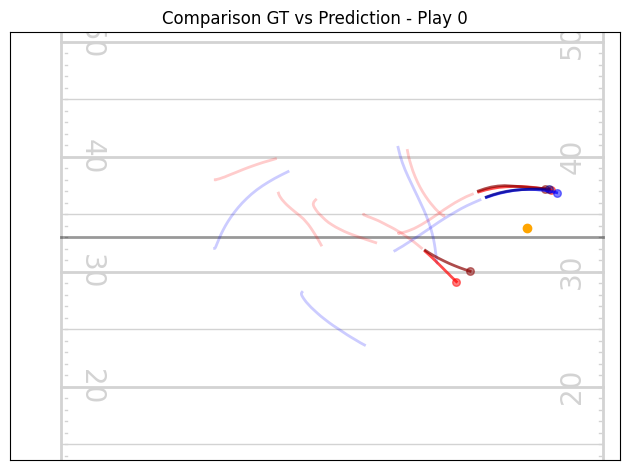

[PRE]   Player 3 mse_loss: 0.4127550721168518
[POST]  Player 3 mse_loss: 0.41478997468948364
[PRE]   Player 5 mse_loss: 0.611199140548706
[POST]  Player 5 mse_loss: 0.5970441699028015
[PRE]   Player 12 mse_loss: 0.7074481248855591
[POST]  Player 12 mse_loss: 0.7143518924713135


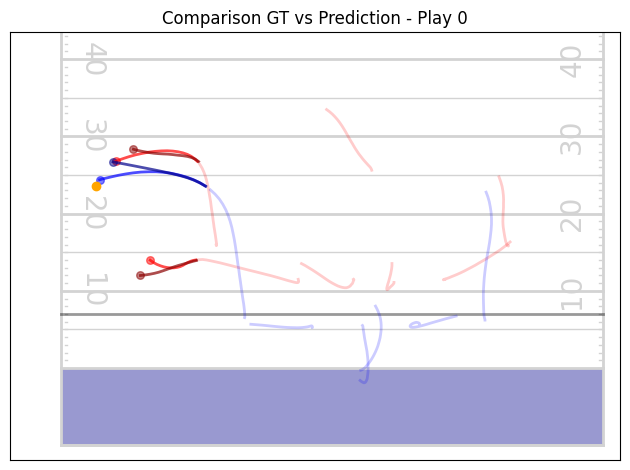

[PRE]   Player 6 mse_loss: 0.040574826300144196
[POST]  Player 6 mse_loss: 0.04338332638144493
[PRE]   Player 12 mse_loss: 0.19252991676330566
[POST]  Player 12 mse_loss: 0.2173299491405487


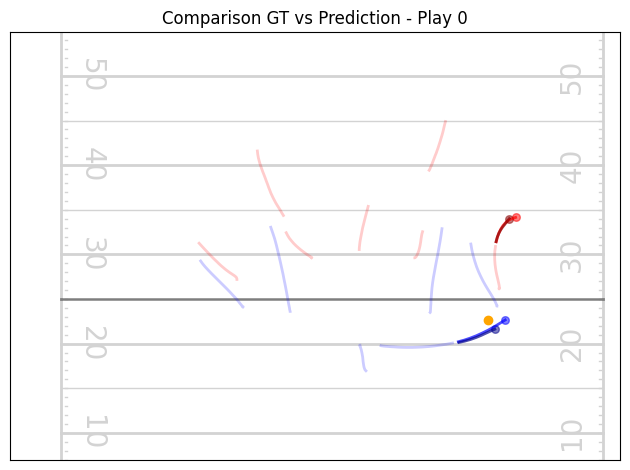

[PRE]   Player 4 mse_loss: 0.011469506658613682
[POST]  Player 4 mse_loss: 0.006138052325695753
[PRE]   Player 6 mse_loss: 0.024423502385616302
[POST]  Player 6 mse_loss: 0.030028387904167175
[PRE]   Player 12 mse_loss: 0.042785901576280594
[POST]  Player 12 mse_loss: 0.04740263149142265


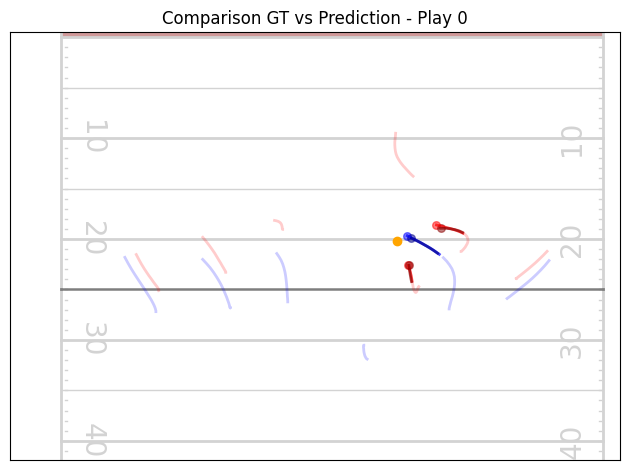

[PRE]   Player 1 mse_loss: 3.749746322631836
[POST]  Player 1 mse_loss: 3.7638092041015625
[PRE]   Player 4 mse_loss: 0.40980640053749084
[POST]  Player 4 mse_loss: 0.4116888642311096
[PRE]   Player 5 mse_loss: 0.3352014720439911
[POST]  Player 5 mse_loss: 0.3524174690246582
[PRE]   Player 9 mse_loss: 1.748574137687683
[POST]  Player 9 mse_loss: 1.7667664289474487


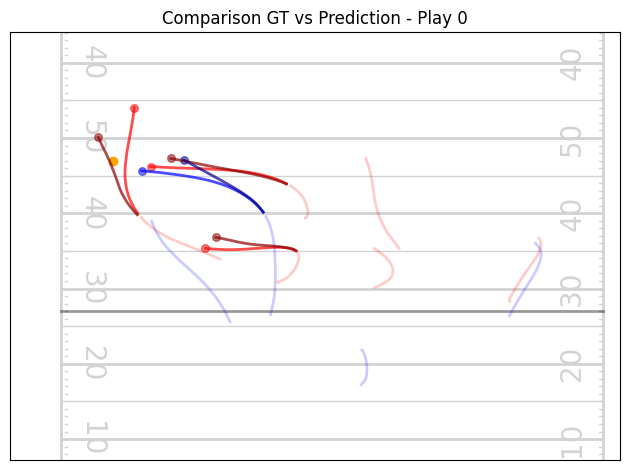

[PRE]   Player 0 mse_loss: 0.406277596950531
[POST]  Player 0 mse_loss: 0.37942829728126526
[PRE]   Player 1 mse_loss: 0.5046442151069641
[POST]  Player 1 mse_loss: 0.4996659457683563
[PRE]   Player 3 mse_loss: 0.23095427453517914
[POST]  Player 3 mse_loss: 0.2176072895526886
[PRE]   Player 12 mse_loss: 0.10509683936834335
[POST]  Player 12 mse_loss: 0.10387792438268661


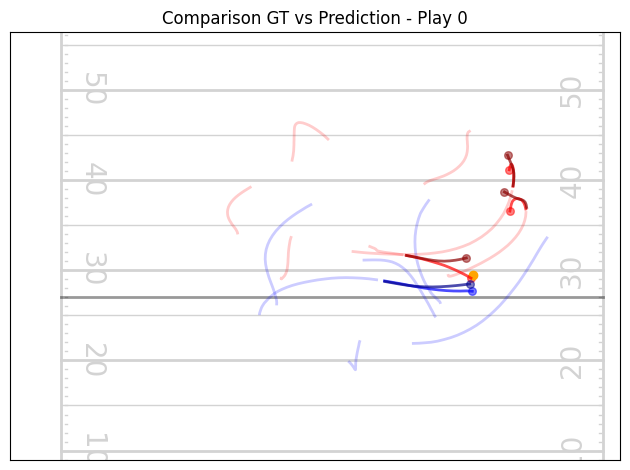

[PRE]   Player 3 mse_loss: 11.302364349365234
[POST]  Player 3 mse_loss: 11.2816162109375
[PRE]   Player 4 mse_loss: 11.955110549926758
[POST]  Player 4 mse_loss: 11.980538368225098
[PRE]   Player 5 mse_loss: 0.33765915036201477
[POST]  Player 5 mse_loss: 0.341968297958374
[PRE]   Player 12 mse_loss: 1.4297744035720825
[POST]  Player 12 mse_loss: 1.4042773246765137


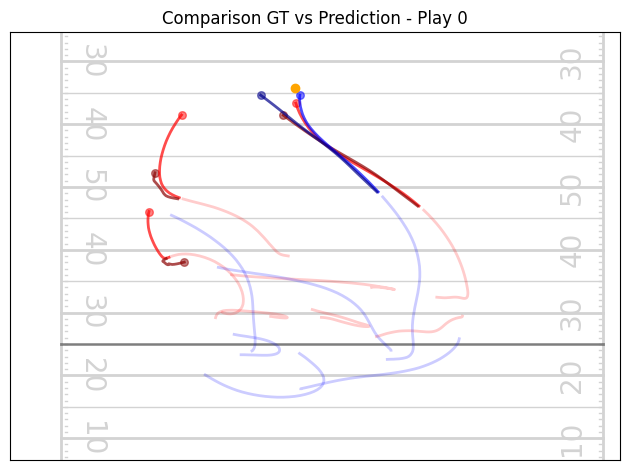

[PRE]   Player 1 mse_loss: 0.43456926941871643
[POST]  Player 1 mse_loss: 0.4095645546913147
[PRE]   Player 12 mse_loss: 0.4712795615196228
[POST]  Player 12 mse_loss: 0.4542068839073181


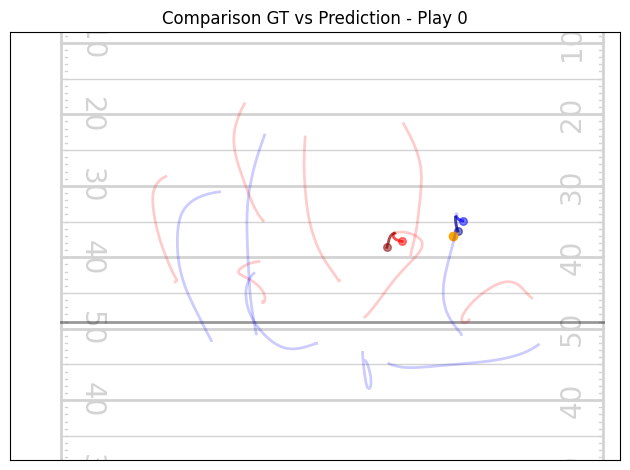

[PRE]   Player 4 mse_loss: 0.044720351696014404
[POST]  Player 4 mse_loss: 0.04755602404475212
[PRE]   Player 12 mse_loss: 0.010048691183328629
[POST]  Player 12 mse_loss: 0.013469040393829346


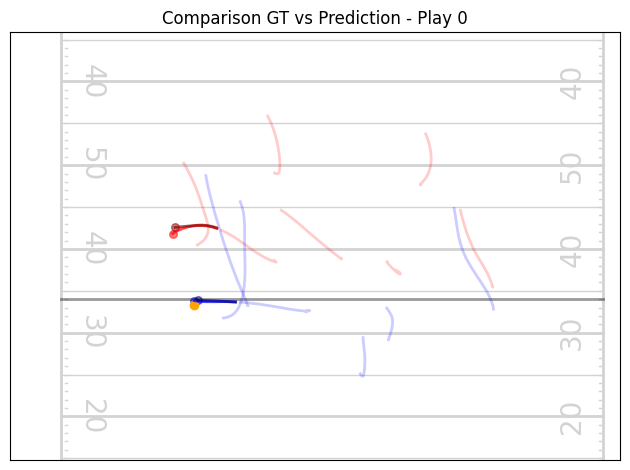

[PRE]   Player 4 mse_loss: 0.06112586334347725
[POST]  Player 4 mse_loss: 0.060189761221408844
[PRE]   Player 11 mse_loss: 0.024703482165932655
[POST]  Player 11 mse_loss: 0.03436978533864021


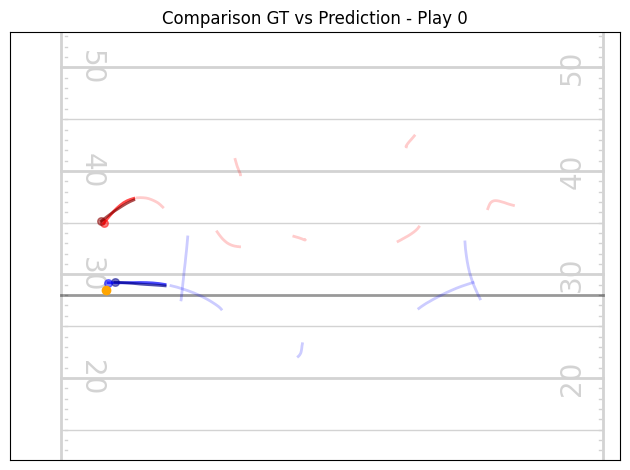

[PRE]   Player 0 mse_loss: 0.02349706180393696
[POST]  Player 0 mse_loss: 0.01835050992667675
[PRE]   Player 1 mse_loss: 0.019178660586476326
[POST]  Player 1 mse_loss: 0.028002222999930382
[PRE]   Player 3 mse_loss: 0.0748417004942894
[POST]  Player 3 mse_loss: 0.09199369698762894
[PRE]   Player 12 mse_loss: 0.2181074172258377
[POST]  Player 12 mse_loss: 0.2299664318561554


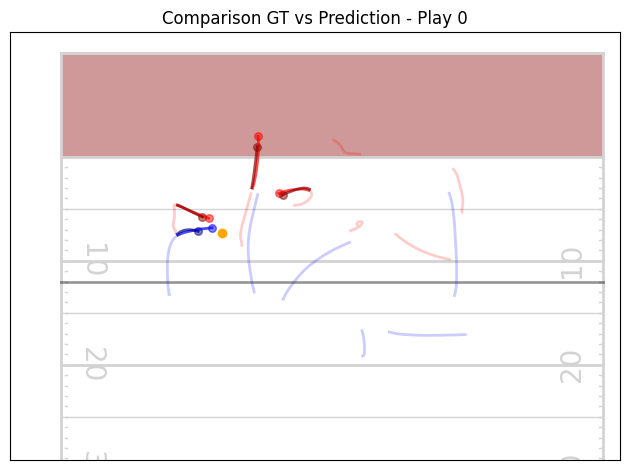

[PRE]   Player 1 mse_loss: 3.5171852111816406
[POST]  Player 1 mse_loss: 3.4606645107269287
[PRE]   Player 3 mse_loss: 0.7359551191329956
[POST]  Player 3 mse_loss: 0.7168027758598328
[PRE]   Player 10 mse_loss: 0.49005213379859924
[POST]  Player 10 mse_loss: 0.4854238033294678


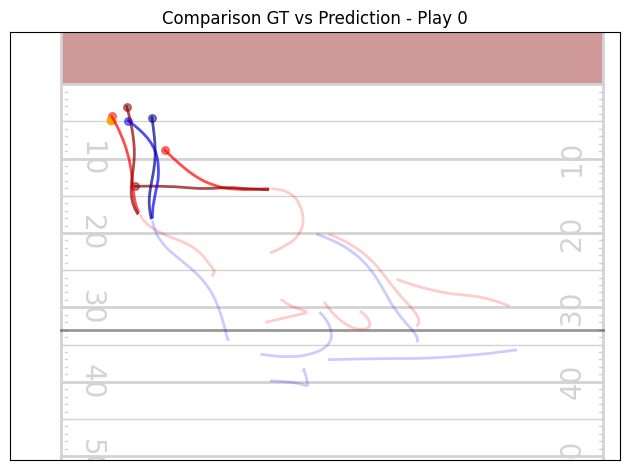

[PRE]   Player 3 mse_loss: 0.01726408302783966
[POST]  Player 3 mse_loss: 0.017820104956626892
[PRE]   Player 4 mse_loss: 0.05168812721967697
[POST]  Player 4 mse_loss: 0.057966720312833786
[PRE]   Player 11 mse_loss: 0.0869598388671875
[POST]  Player 11 mse_loss: 0.08833198994398117


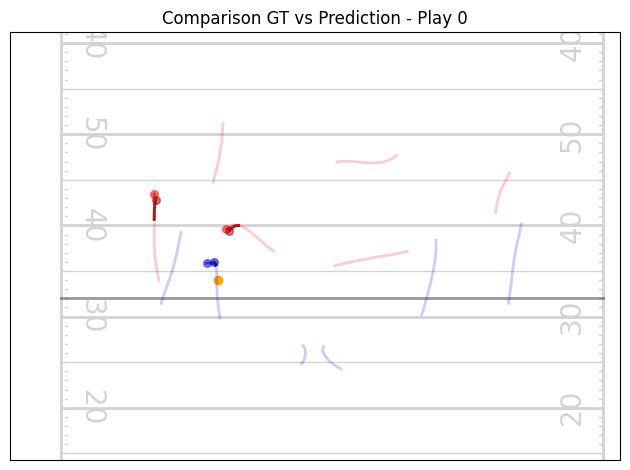

[PRE]   Player 0 mse_loss: 1.345247745513916
[POST]  Player 0 mse_loss: 1.204384684562683
[PRE]   Player 1 mse_loss: 1.9262020587921143
[POST]  Player 1 mse_loss: 1.8950695991516113
[PRE]   Player 12 mse_loss: 0.5772220492362976
[POST]  Player 12 mse_loss: 0.5747318267822266


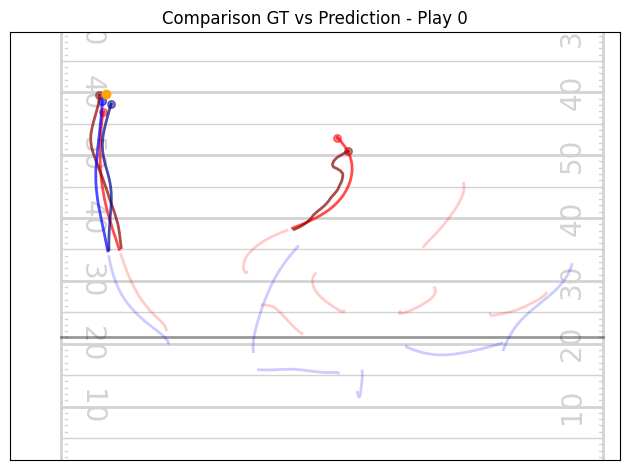

[PRE]   Player 2 mse_loss: 0.10410311818122864
[POST]  Player 2 mse_loss: 0.12395356595516205
[PRE]   Player 11 mse_loss: 0.017291733995079994
[POST]  Player 11 mse_loss: 0.03070659749209881


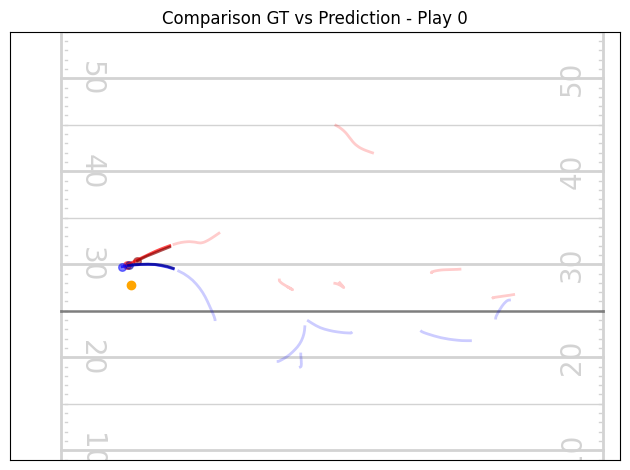

[PRE]   Player 12 mse_loss: 0.07011295855045319
[POST]  Player 12 mse_loss: 0.07273323833942413


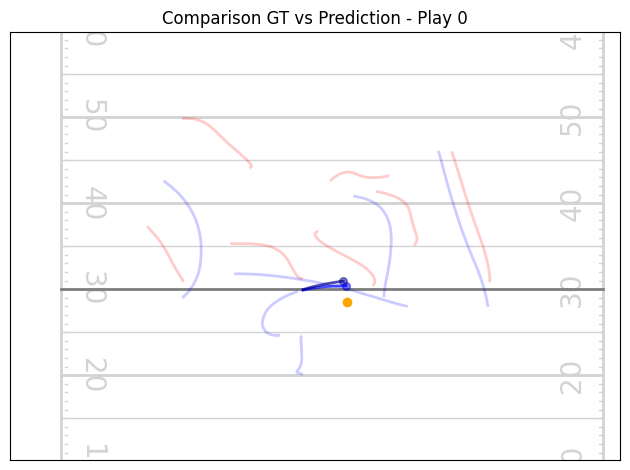

[PRE]   Player 5 mse_loss: 0.15620389580726624
[POST]  Player 5 mse_loss: 0.1521838754415512
[PRE]   Player 11 mse_loss: 0.22479234635829926
[POST]  Player 11 mse_loss: 0.22072651982307434


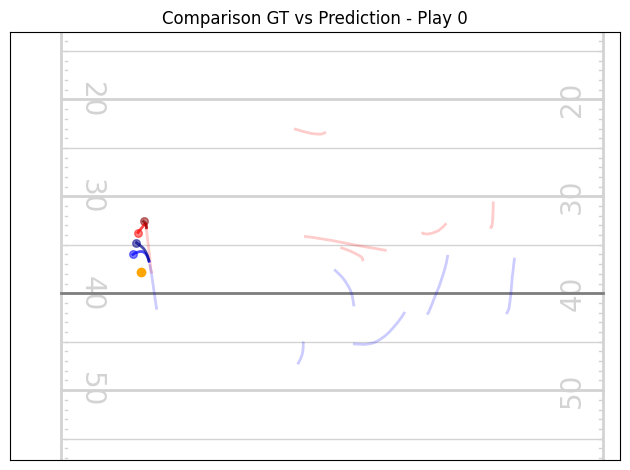

[PRE]   Player 1 mse_loss: 0.042044129222631454
[POST]  Player 1 mse_loss: 0.03102857433259487
[PRE]   Player 12 mse_loss: 0.023375865072011948
[POST]  Player 12 mse_loss: 0.019404608756303787


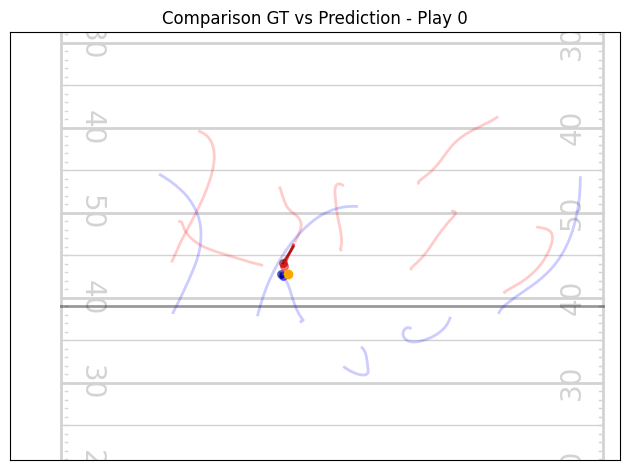

[PRE]   Player 0 mse_loss: 0.9332375526428223
[POST]  Player 0 mse_loss: 0.8928953409194946
[PRE]   Player 1 mse_loss: 1.968431830406189
[POST]  Player 1 mse_loss: 1.9705839157104492
[PRE]   Player 3 mse_loss: 0.09424881637096405
[POST]  Player 3 mse_loss: 0.09602146595716476
[PRE]   Player 12 mse_loss: 0.17742536962032318
[POST]  Player 12 mse_loss: 0.17143741250038147


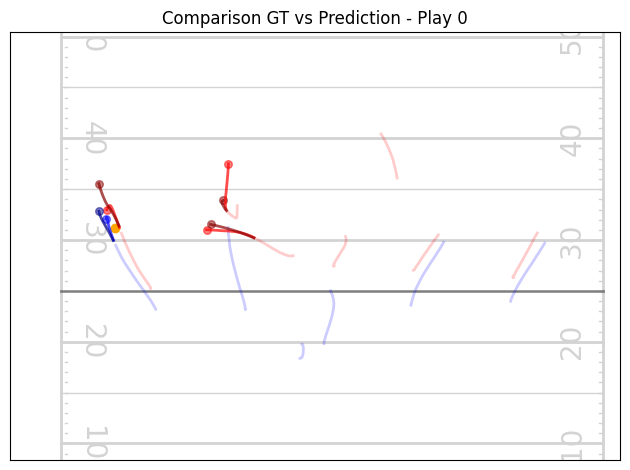

[PRE]   Player 0 mse_loss: 0.34606117010116577
[POST]  Player 0 mse_loss: 0.3344971835613251
[PRE]   Player 1 mse_loss: 0.021993858739733696
[POST]  Player 1 mse_loss: 0.028973408043384552
[PRE]   Player 2 mse_loss: 0.06799694150686264
[POST]  Player 2 mse_loss: 0.0726189985871315
[PRE]   Player 3 mse_loss: 0.4983619153499603
[POST]  Player 3 mse_loss: 0.5105364918708801
[PRE]   Player 4 mse_loss: 0.04189178720116615
[POST]  Player 4 mse_loss: 0.04052048921585083
[PRE]   Player 12 mse_loss: 0.039203960448503494
[POST]  Player 12 mse_loss: 0.0335119403898716


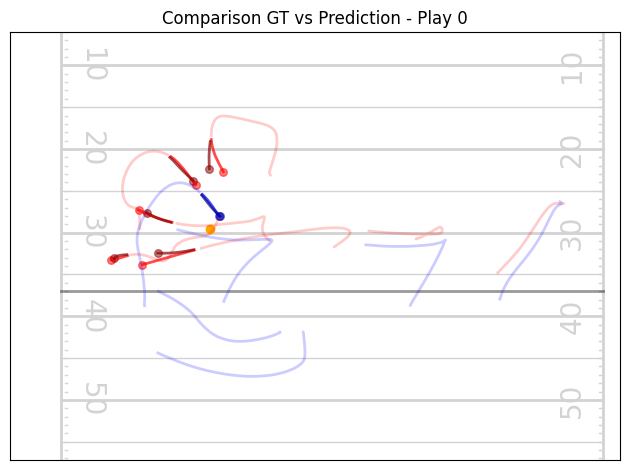

[PRE]   Player 0 mse_loss: 0.11693017929792404
[POST]  Player 0 mse_loss: 0.1017952635884285
[PRE]   Player 3 mse_loss: 0.03777439519762993
[POST]  Player 3 mse_loss: 0.04959525540471077
[PRE]   Player 9 mse_loss: 0.11140049993991852
[POST]  Player 9 mse_loss: 0.10347814112901688


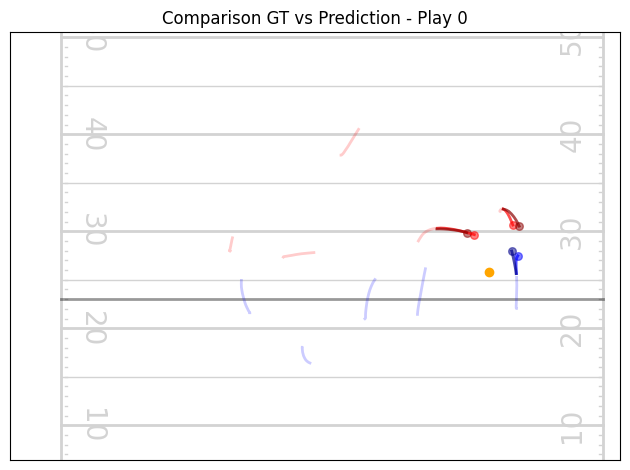

[PRE]   Player 1 mse_loss: 0.02072916552424431
[POST]  Player 1 mse_loss: 0.017302002757787704
[PRE]   Player 3 mse_loss: 0.02460445836186409
[POST]  Player 3 mse_loss: 0.026801280677318573
[PRE]   Player 4 mse_loss: 0.07296501100063324
[POST]  Player 4 mse_loss: 0.07529095560312271
[PRE]   Player 5 mse_loss: 0.22662274539470673
[POST]  Player 5 mse_loss: 0.22041571140289307
[PRE]   Player 12 mse_loss: 0.04362863302230835
[POST]  Player 12 mse_loss: 0.05398125201463699


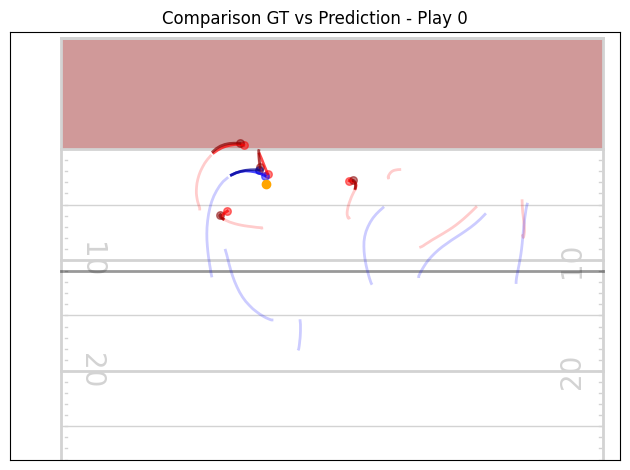

[PRE]   Player 0 mse_loss: 0.8441722393035889
[POST]  Player 0 mse_loss: 0.8403244018554688
[PRE]   Player 12 mse_loss: 0.922674834728241
[POST]  Player 12 mse_loss: 0.9378266334533691


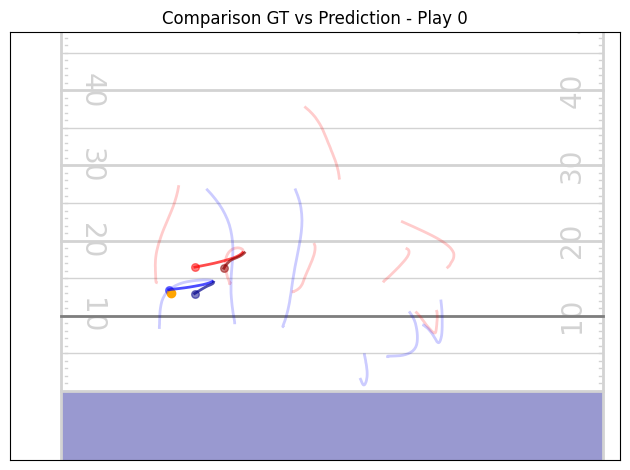

[PRE]   Player 2 mse_loss: 0.12520094215869904
[POST]  Player 2 mse_loss: 0.11045169085264206
[PRE]   Player 5 mse_loss: 0.21913538873195648
[POST]  Player 5 mse_loss: 0.2210746556520462
[PRE]   Player 12 mse_loss: 0.064832404255867
[POST]  Player 12 mse_loss: 0.07056884467601776


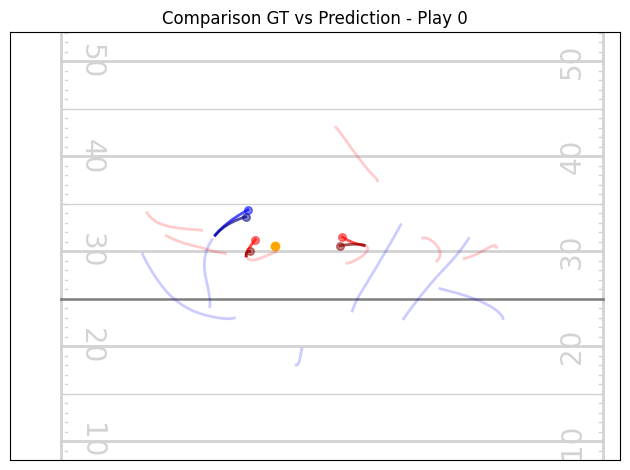

[PRE]   Player 0 mse_loss: 0.09466712921857834
[POST]  Player 0 mse_loss: 0.08560647815465927
[PRE]   Player 1 mse_loss: 0.010212145745754242
[POST]  Player 1 mse_loss: 0.015304972417652607
[PRE]   Player 4 mse_loss: 0.016702085733413696
[POST]  Player 4 mse_loss: 0.017076639458537102
[PRE]   Player 13 mse_loss: 0.051534127444028854
[POST]  Player 13 mse_loss: 0.0700642392039299


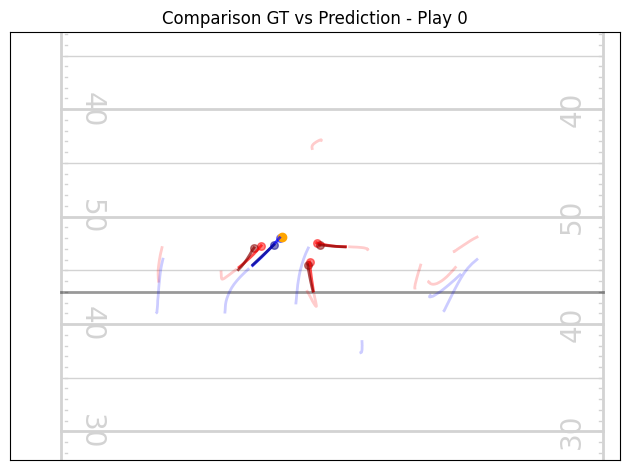

[PRE]   Player 0 mse_loss: 0.09064220637083054
[POST]  Player 0 mse_loss: 0.08861926198005676
[PRE]   Player 4 mse_loss: 0.02641071192920208
[POST]  Player 4 mse_loss: 0.03400628641247749
[PRE]   Player 11 mse_loss: 0.0358198881149292
[POST]  Player 11 mse_loss: 0.03692004084587097


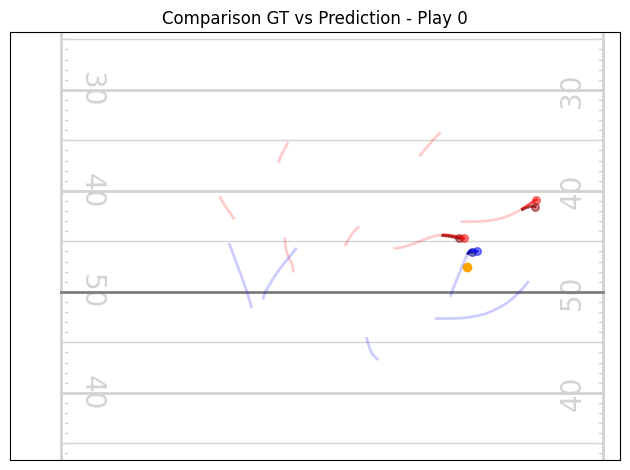

[PRE]   Player 1 mse_loss: 0.20439425110816956
[POST]  Player 1 mse_loss: 0.20285269618034363
[PRE]   Player 3 mse_loss: 0.9355300664901733
[POST]  Player 3 mse_loss: 0.939965009689331
[PRE]   Player 4 mse_loss: 0.9458960890769958
[POST]  Player 4 mse_loss: 0.9458662271499634
[PRE]   Player 11 mse_loss: 0.16176870465278625
[POST]  Player 11 mse_loss: 0.16834229230880737


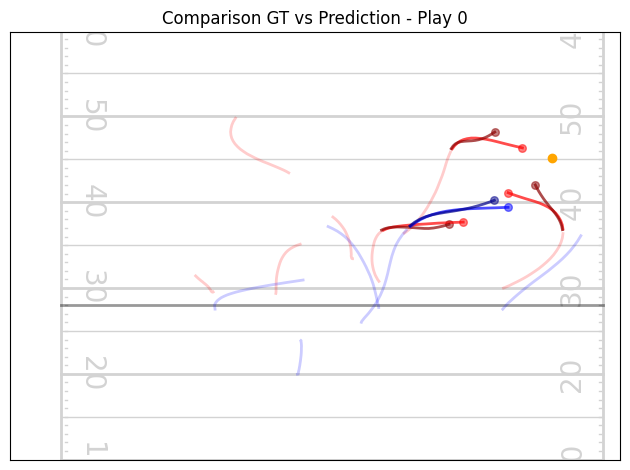

[PRE]   Player 5 mse_loss: 0.24402910470962524
[POST]  Player 5 mse_loss: 0.24577756226062775
[PRE]   Player 11 mse_loss: 0.07705174386501312
[POST]  Player 11 mse_loss: 0.07937952876091003


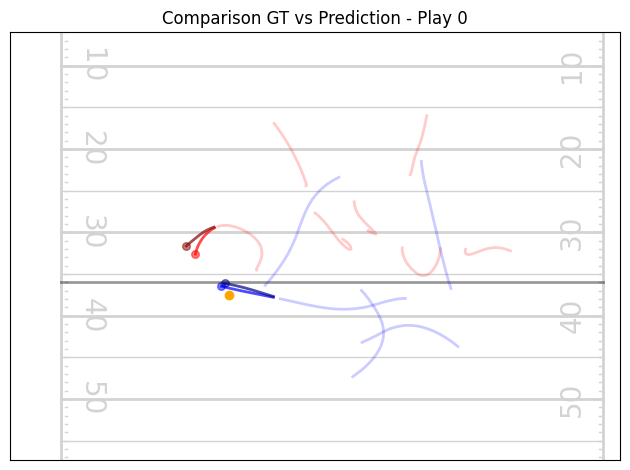

[PRE]   Player 10 mse_loss: 0.048499539494514465
[POST]  Player 10 mse_loss: 0.05171722546219826


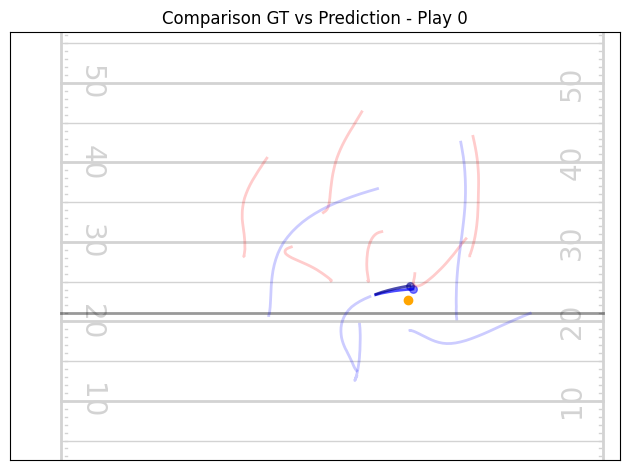

[PRE]   Player 2 mse_loss: 0.41960105299949646
[POST]  Player 2 mse_loss: 0.43674764037132263
[PRE]   Player 6 mse_loss: 0.09764617681503296
[POST]  Player 6 mse_loss: 0.09051094949245453
[PRE]   Player 12 mse_loss: 0.04824905842542648
[POST]  Player 12 mse_loss: 0.05088728666305542


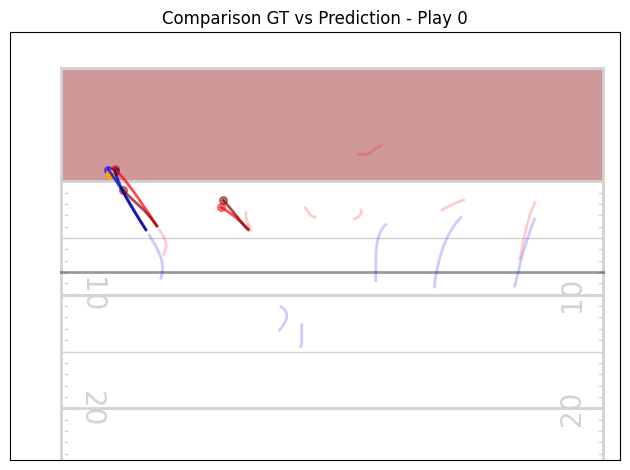

[PRE]   Player 3 mse_loss: 0.03201707825064659
[POST]  Player 3 mse_loss: 0.0413130447268486
[PRE]   Player 11 mse_loss: 0.004237735643982887
[POST]  Player 11 mse_loss: 0.01423792913556099


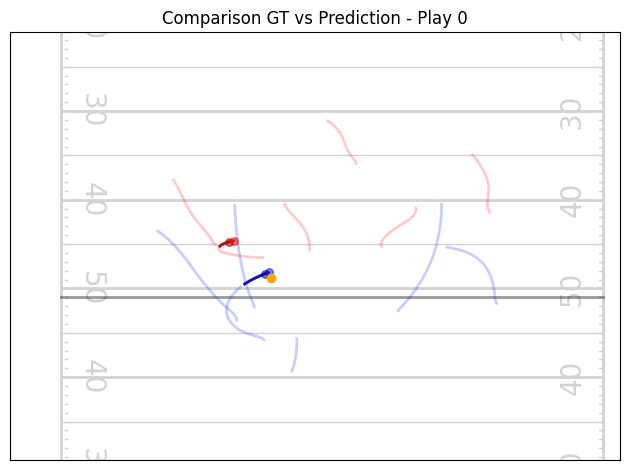

[PRE]   Player 1 mse_loss: 0.034379348158836365
[POST]  Player 1 mse_loss: 0.027545031160116196
[PRE]   Player 9 mse_loss: 0.018027091398835182
[POST]  Player 9 mse_loss: 0.019100870937108994


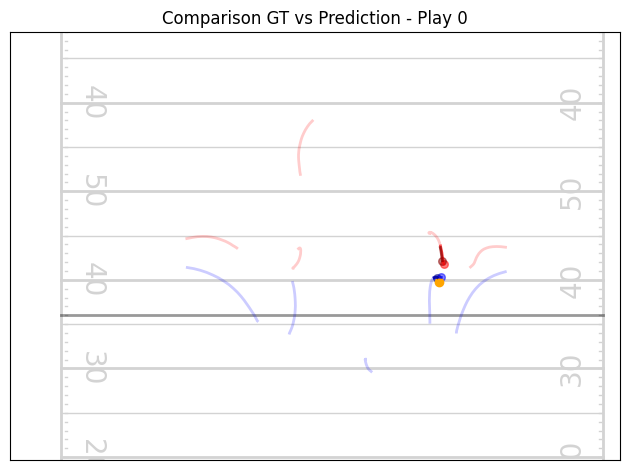

[PRE]   Player 0 mse_loss: 2.9502763748168945
[POST]  Player 0 mse_loss: 2.9309675693511963
[PRE]   Player 2 mse_loss: 3.1834499835968018
[POST]  Player 2 mse_loss: 3.187019109725952
[PRE]   Player 4 mse_loss: 0.6478264927864075
[POST]  Player 4 mse_loss: 0.6648630499839783
[PRE]   Player 12 mse_loss: 0.743388295173645
[POST]  Player 12 mse_loss: 0.763678789138794


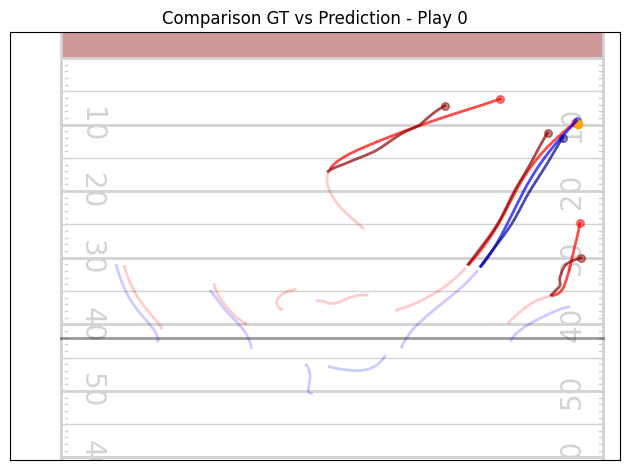

[PRE]   Player 0 mse_loss: 0.5378848314285278
[POST]  Player 0 mse_loss: 0.5150599479675293
[PRE]   Player 1 mse_loss: 0.11348051577806473
[POST]  Player 1 mse_loss: 0.10997357964515686
[PRE]   Player 2 mse_loss: 0.10612031072378159
[POST]  Player 2 mse_loss: 0.11435111612081528
[PRE]   Player 4 mse_loss: 0.12432447075843811
[POST]  Player 4 mse_loss: 0.13885828852653503
[PRE]   Player 12 mse_loss: 0.07107987999916077
[POST]  Player 12 mse_loss: 0.07110271602869034


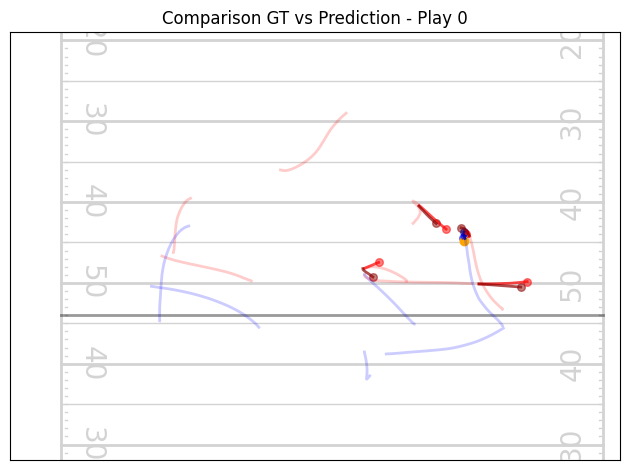

[PRE]   Player 0 mse_loss: 0.2900410592556
[POST]  Player 0 mse_loss: 0.28728505969047546
[PRE]   Player 1 mse_loss: 2.291083812713623
[POST]  Player 1 mse_loss: 2.2645957469940186
[PRE]   Player 5 mse_loss: 0.448974609375
[POST]  Player 5 mse_loss: 0.45837152004241943
[PRE]   Player 10 mse_loss: 0.04690384119749069
[POST]  Player 10 mse_loss: 0.047328609973192215


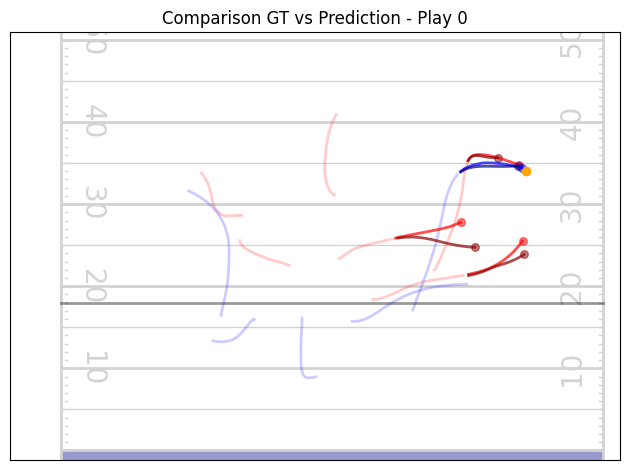

[PRE]   Player 6 mse_loss: 0.15357939898967743
[POST]  Player 6 mse_loss: 0.14393778145313263
[PRE]   Player 11 mse_loss: 0.07427244633436203
[POST]  Player 11 mse_loss: 0.07193641364574432


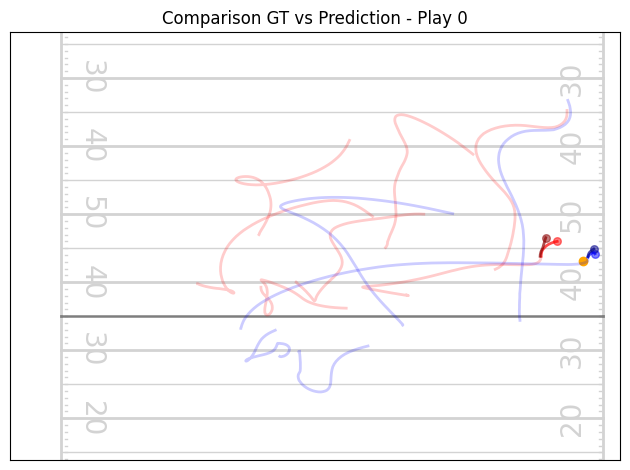

[PRE]   Player 11 mse_loss: 1.918958067893982
[POST]  Player 11 mse_loss: 1.8639860153198242


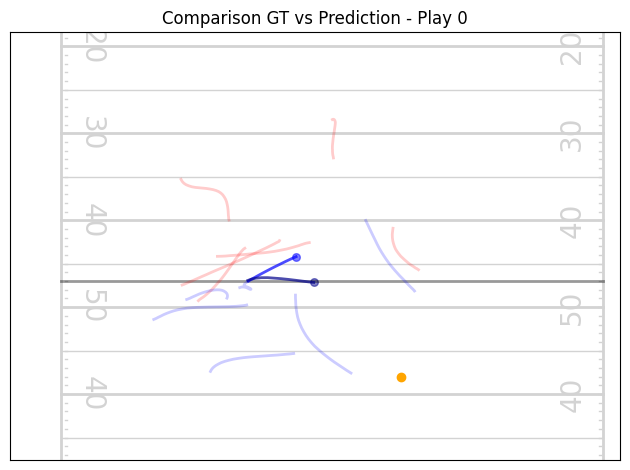

[PRE]   Player 1 mse_loss: 0.2665424048900604
[POST]  Player 1 mse_loss: 0.2822803556919098
[PRE]   Player 4 mse_loss: 0.7420719265937805
[POST]  Player 4 mse_loss: 0.689047634601593
[PRE]   Player 5 mse_loss: 0.15915247797966003
[POST]  Player 5 mse_loss: 0.15495112538337708
[PRE]   Player 11 mse_loss: 0.14997383952140808
[POST]  Player 11 mse_loss: 0.17601914703845978


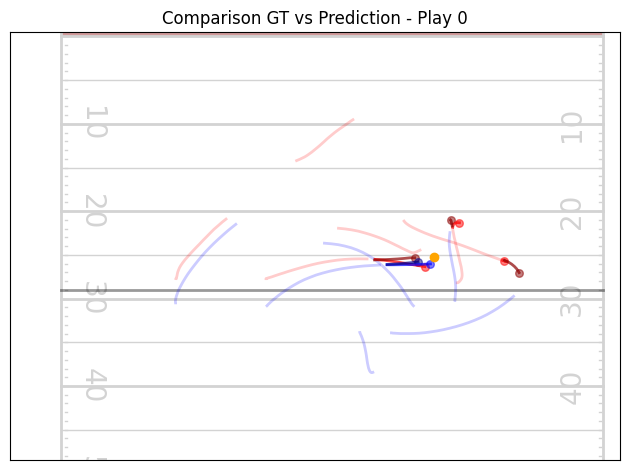

[PRE]   Player 12 mse_loss: 0.012487856671214104
[POST]  Player 12 mse_loss: 0.014300885610282421


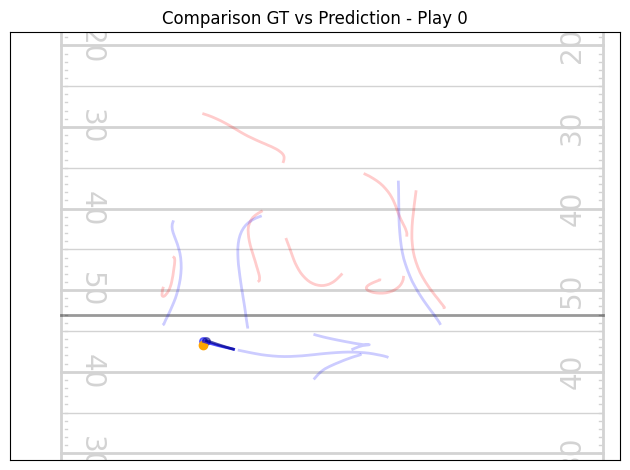

[PRE]   Player 4 mse_loss: 0.04919106513261795
[POST]  Player 4 mse_loss: 0.041112929582595825
[PRE]   Player 12 mse_loss: 0.05675206705927849
[POST]  Player 12 mse_loss: 0.046846553683280945


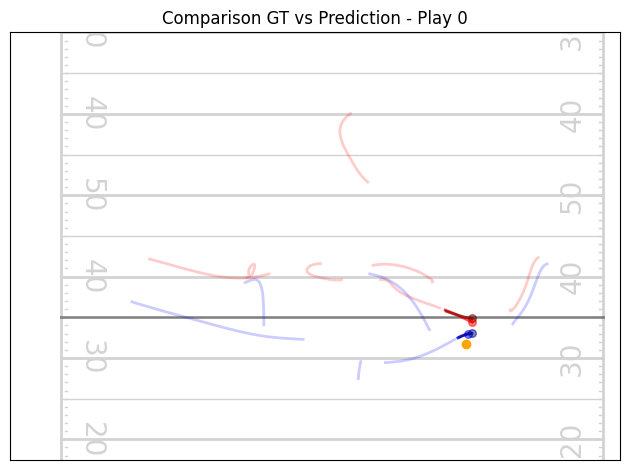

[PRE]   Player 1 mse_loss: 0.326126366853714
[POST]  Player 1 mse_loss: 0.3377416431903839
[PRE]   Player 3 mse_loss: 0.9620609879493713
[POST]  Player 3 mse_loss: 0.9605313539505005
[PRE]   Player 12 mse_loss: 0.34660783410072327
[POST]  Player 12 mse_loss: 0.3497626483440399


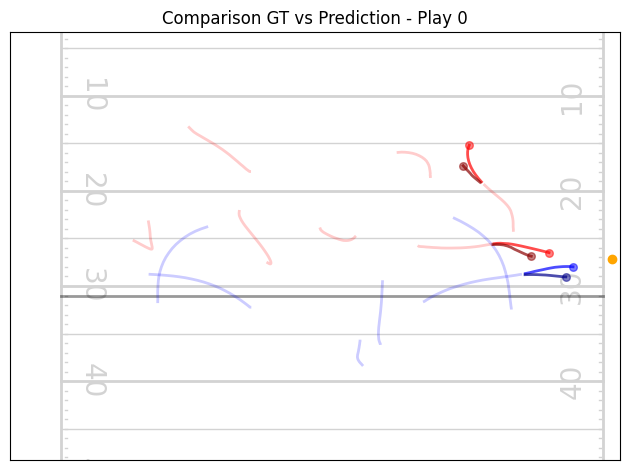

[PRE]   Player 3 mse_loss: 0.08887439966201782
[POST]  Player 3 mse_loss: 0.08936084806919098
[PRE]   Player 10 mse_loss: 0.037566088140010834
[POST]  Player 10 mse_loss: 0.034803349524736404


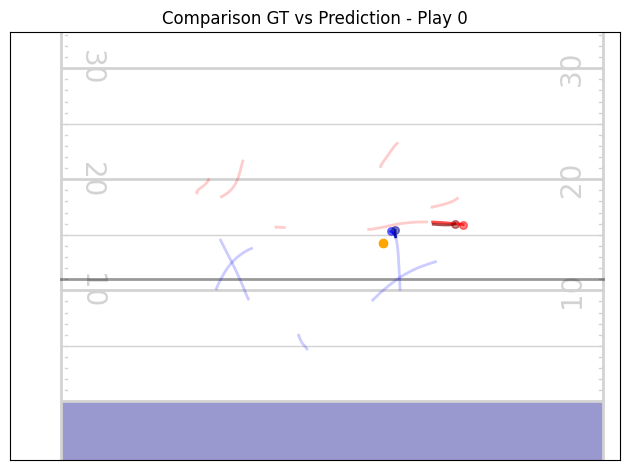

[PRE]   Player 0 mse_loss: 0.10317239165306091
[POST]  Player 0 mse_loss: 0.11780358850955963
[PRE]   Player 12 mse_loss: 0.08060301840305328
[POST]  Player 12 mse_loss: 0.1003236174583435


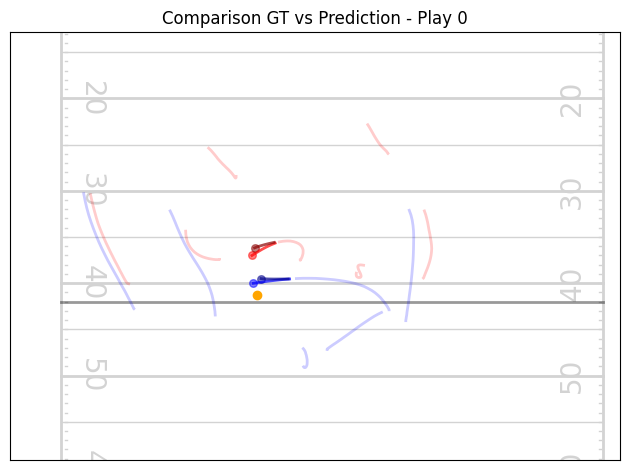

[PRE]   Player 2 mse_loss: 0.06065010279417038
[POST]  Player 2 mse_loss: 0.06864260882139206
[PRE]   Player 4 mse_loss: 0.038247425109148026
[POST]  Player 4 mse_loss: 0.030709605664014816
[PRE]   Player 6 mse_loss: 0.07679569721221924
[POST]  Player 6 mse_loss: 0.09181875735521317
[PRE]   Player 11 mse_loss: 0.03920205309987068
[POST]  Player 11 mse_loss: 0.05101998150348663


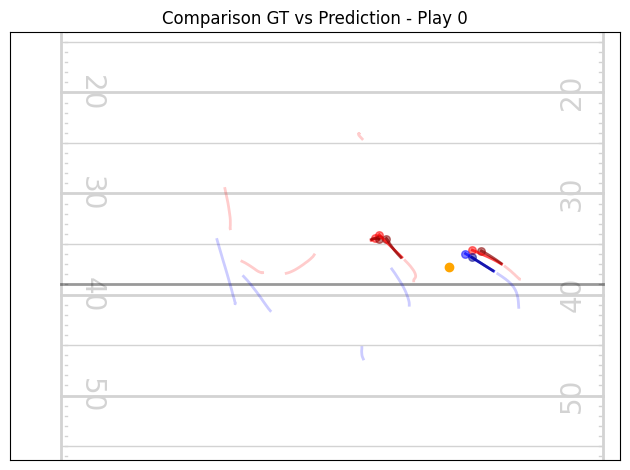

[PRE]   Player 1 mse_loss: 0.06313610076904297
[POST]  Player 1 mse_loss: 0.05519016459584236
[PRE]   Player 3 mse_loss: 0.05725804343819618
[POST]  Player 3 mse_loss: 0.054941028356552124
[PRE]   Player 11 mse_loss: 0.08380866795778275
[POST]  Player 11 mse_loss: 0.08088919520378113


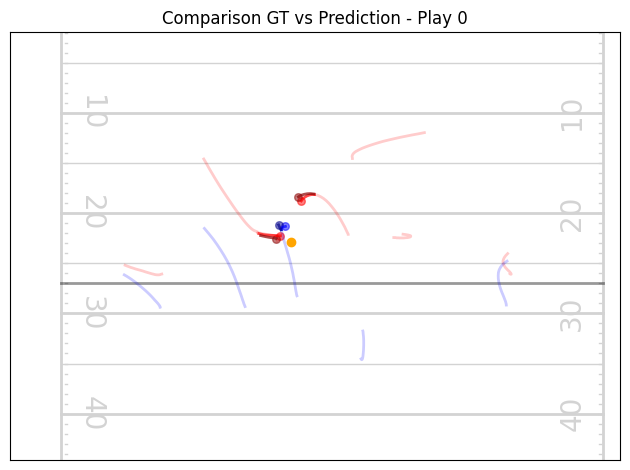

[PRE]   Player 5 mse_loss: 0.038858044892549515
[POST]  Player 5 mse_loss: 0.033641282469034195
[PRE]   Player 12 mse_loss: 0.7271487712860107
[POST]  Player 12 mse_loss: 0.746481716632843


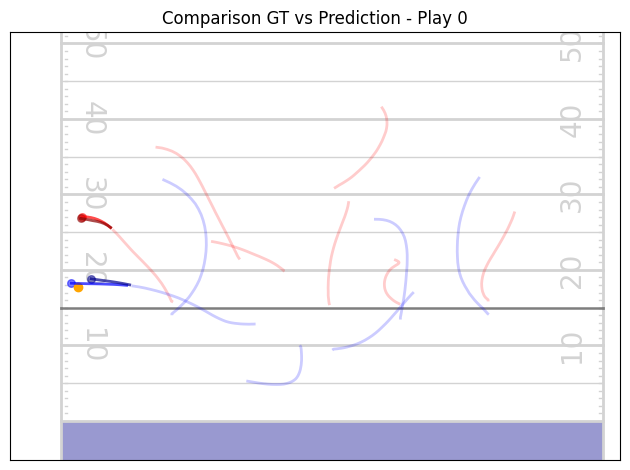

[PRE]   Player 1 mse_loss: 0.1622915267944336
[POST]  Player 1 mse_loss: 0.16489487886428833
[PRE]   Player 12 mse_loss: 0.018745502457022667
[POST]  Player 12 mse_loss: 0.022604482248425484


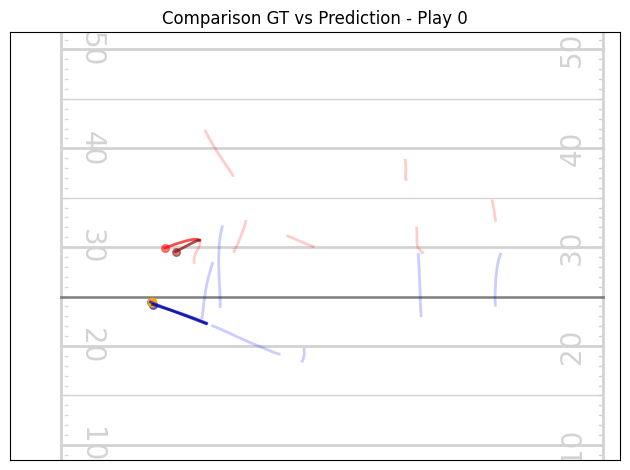

[PRE]   Player 3 mse_loss: 1.8807960748672485
[POST]  Player 3 mse_loss: 1.6059831380844116
[PRE]   Player 4 mse_loss: 1.5391905307769775
[POST]  Player 4 mse_loss: 1.5032451152801514
[PRE]   Player 6 mse_loss: 4.826887130737305
[POST]  Player 6 mse_loss: 4.778111934661865
[PRE]   Player 11 mse_loss: 0.7182167768478394
[POST]  Player 11 mse_loss: 0.7318747639656067


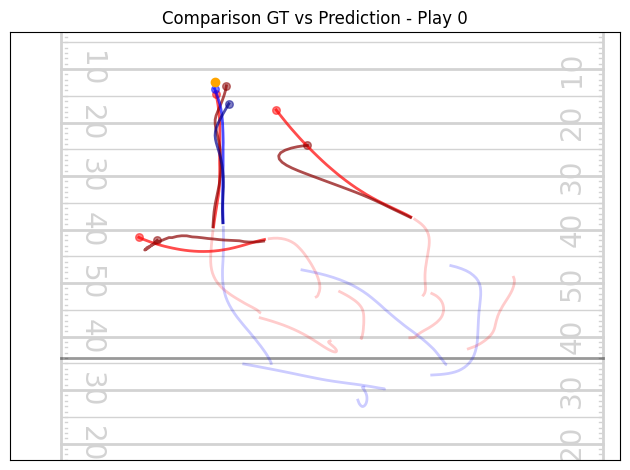

[PRE]   Player 3 mse_loss: 0.008779141120612621
[POST]  Player 3 mse_loss: 0.00720731308683753
[PRE]   Player 4 mse_loss: 0.22409777343273163
[POST]  Player 4 mse_loss: 0.1960175633430481
[PRE]   Player 12 mse_loss: 0.03974095359444618
[POST]  Player 12 mse_loss: 0.03525148704648018


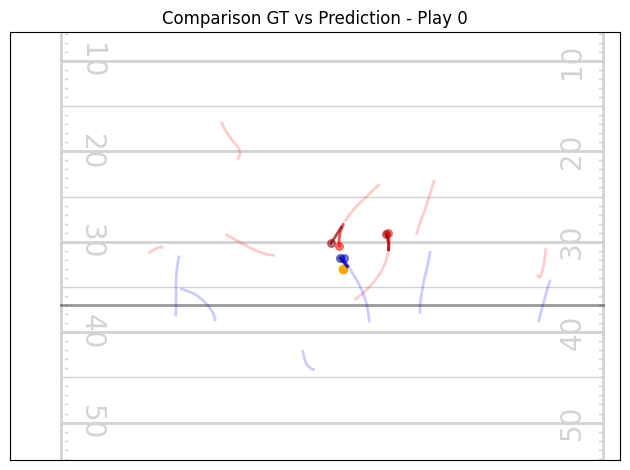

[PRE]   Player 11 mse_loss: 0.02020317316055298
[POST]  Player 11 mse_loss: 0.021136704832315445


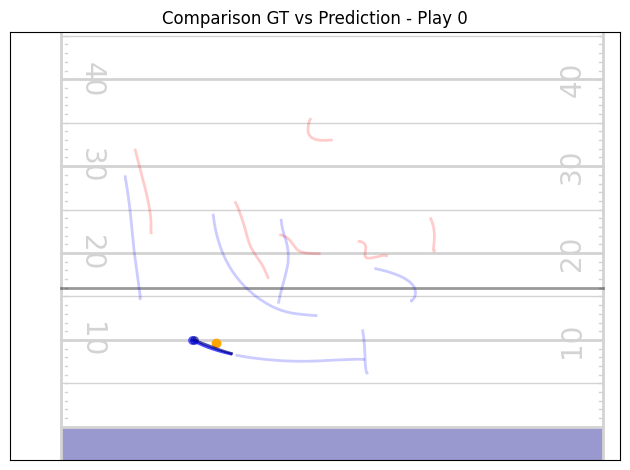

[PRE]   Player 10 mse_loss: 0.062418002635240555
[POST]  Player 10 mse_loss: 0.07718101888895035


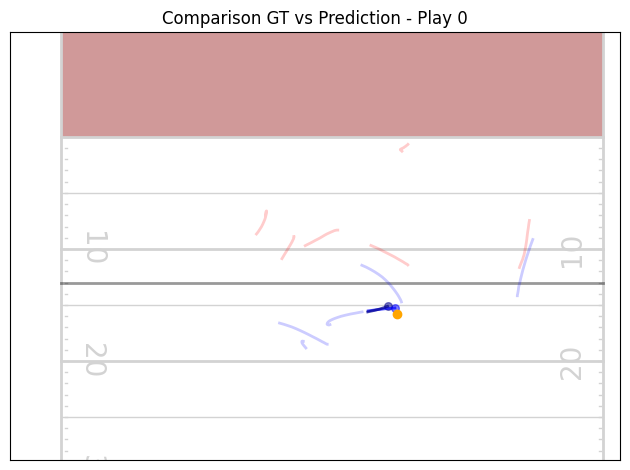

[PRE]   Player 3 mse_loss: 0.10483318567276001
[POST]  Player 3 mse_loss: 0.1123114675283432
[PRE]   Player 12 mse_loss: 0.1009725034236908
[POST]  Player 12 mse_loss: 0.10944969207048416


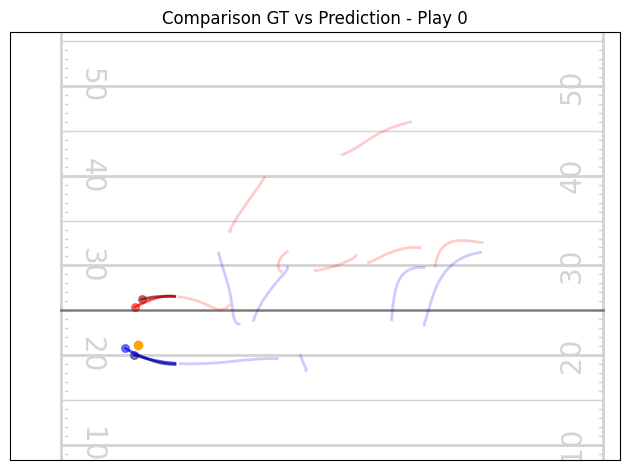

[PRE]   Player 1 mse_loss: 0.02975206822156906
[POST]  Player 1 mse_loss: 0.02154502272605896
[PRE]   Player 4 mse_loss: 0.3539740741252899
[POST]  Player 4 mse_loss: 0.36665621399879456
[PRE]   Player 6 mse_loss: 0.03861807659268379
[POST]  Player 6 mse_loss: 0.043091826140880585
[PRE]   Player 12 mse_loss: 0.024549121037125587
[POST]  Player 12 mse_loss: 0.029473543167114258


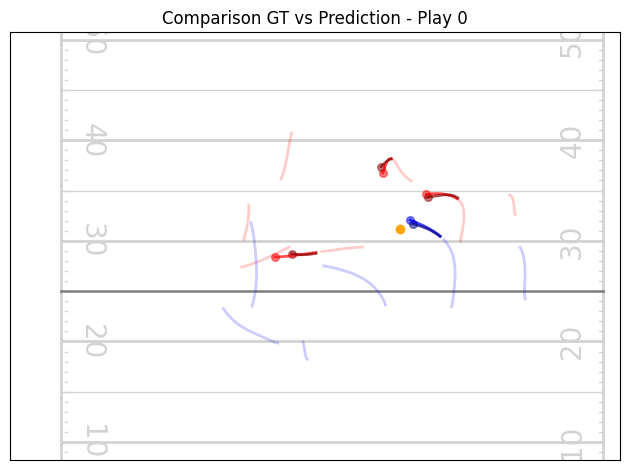

[PRE]   Player 6 mse_loss: 0.10405896604061127
[POST]  Player 6 mse_loss: 0.1156717985868454
[PRE]   Player 12 mse_loss: 0.08795719593763351
[POST]  Player 12 mse_loss: 0.10489275306463242


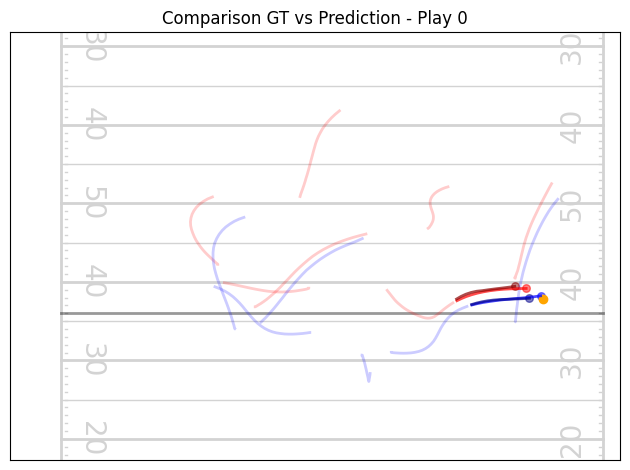

[PRE]   Player 0 mse_loss: 0.13011685013771057
[POST]  Player 0 mse_loss: 0.1414995938539505
[PRE]   Player 5 mse_loss: 0.07937119156122208
[POST]  Player 5 mse_loss: 0.07758807390928268
[PRE]   Player 10 mse_loss: 0.13909444212913513
[POST]  Player 10 mse_loss: 0.15229493379592896


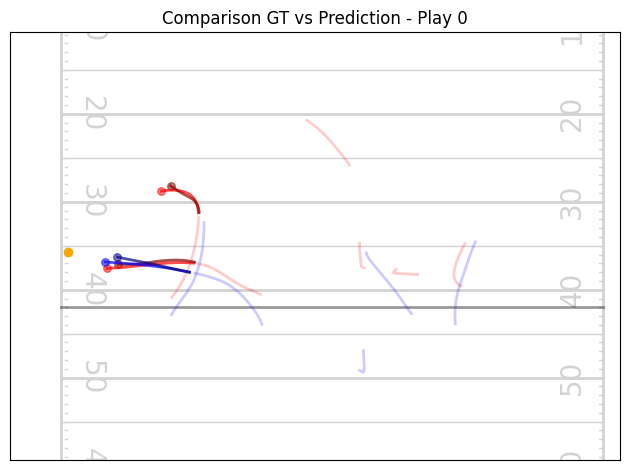

[PRE]   Player 0 mse_loss: 2.9322335720062256
[POST]  Player 0 mse_loss: 2.9029858112335205
[PRE]   Player 1 mse_loss: 0.08046531677246094
[POST]  Player 1 mse_loss: 0.0812978446483612
[PRE]   Player 3 mse_loss: 0.43906790018081665
[POST]  Player 3 mse_loss: 0.4362618923187256
[PRE]   Player 11 mse_loss: 0.1232583299279213
[POST]  Player 11 mse_loss: 0.10798908025026321


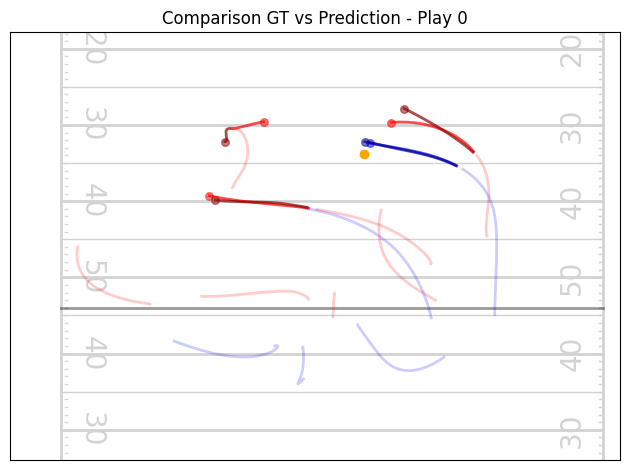

[PRE]   Player 5 mse_loss: 0.21937528252601624
[POST]  Player 5 mse_loss: 0.21837829053401947
[PRE]   Player 10 mse_loss: 1.806632161140442
[POST]  Player 10 mse_loss: 1.6999157667160034


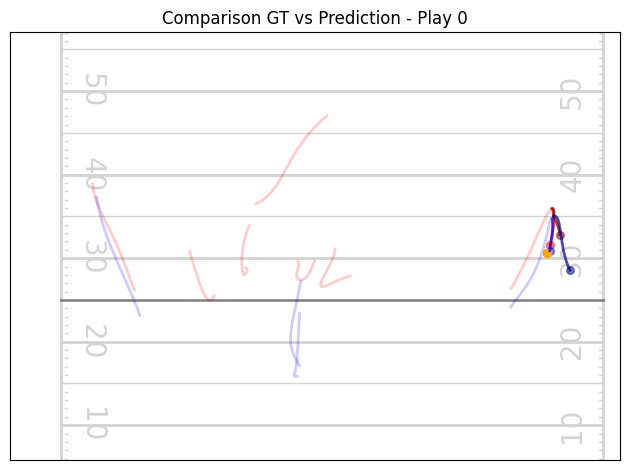

[PRE]   Player 0 mse_loss: 0.8804147243499756
[POST]  Player 0 mse_loss: 0.8765870928764343
[PRE]   Player 1 mse_loss: 0.6990106105804443
[POST]  Player 1 mse_loss: 0.7113564610481262
[PRE]   Player 3 mse_loss: 0.747369110584259
[POST]  Player 3 mse_loss: 0.760199785232544
[PRE]   Player 11 mse_loss: 0.050957418978214264
[POST]  Player 11 mse_loss: 0.04868708550930023


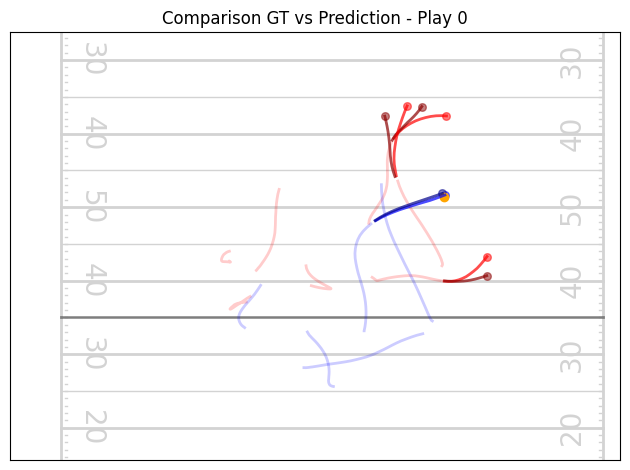

[PRE]   Player 1 mse_loss: 0.16993100941181183
[POST]  Player 1 mse_loss: 0.18147605657577515
[PRE]   Player 6 mse_loss: 0.8047555685043335
[POST]  Player 6 mse_loss: 0.8258482813835144
[PRE]   Player 12 mse_loss: 0.4265415072441101
[POST]  Player 12 mse_loss: 0.4405253827571869


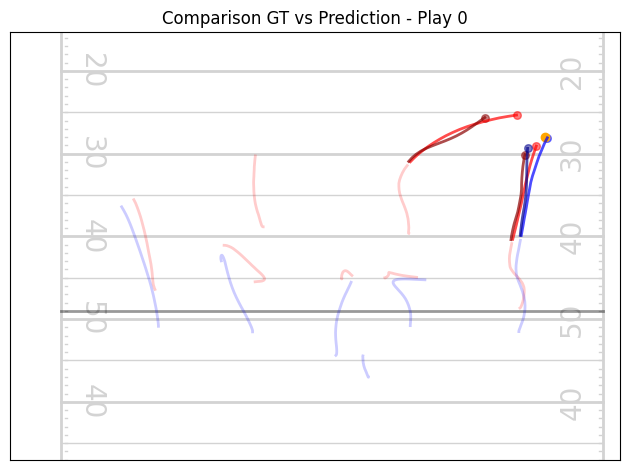

[PRE]   Player 2 mse_loss: 0.04687875509262085
[POST]  Player 2 mse_loss: 0.04763948172330856
[PRE]   Player 11 mse_loss: 0.06814534962177277
[POST]  Player 11 mse_loss: 0.07592450082302094


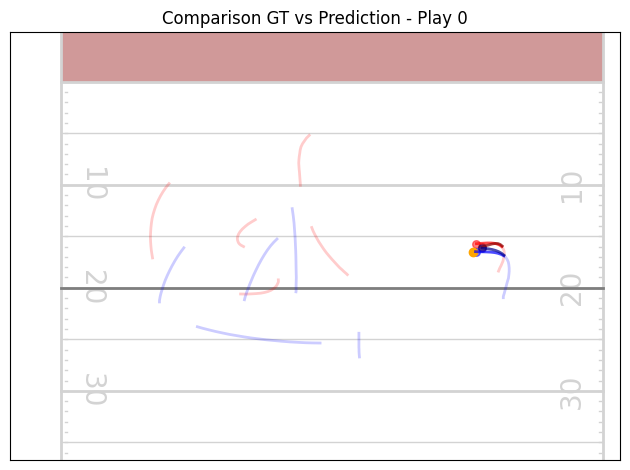

[PRE]   Player 0 mse_loss: 0.05743845924735069
[POST]  Player 0 mse_loss: 0.067110575735569
[PRE]   Player 2 mse_loss: 0.2379712164402008
[POST]  Player 2 mse_loss: 0.23973210155963898
[PRE]   Player 5 mse_loss: 0.00784169603139162
[POST]  Player 5 mse_loss: 0.00712813762947917
[PRE]   Player 11 mse_loss: 0.025316832587122917
[POST]  Player 11 mse_loss: 0.026585286483168602


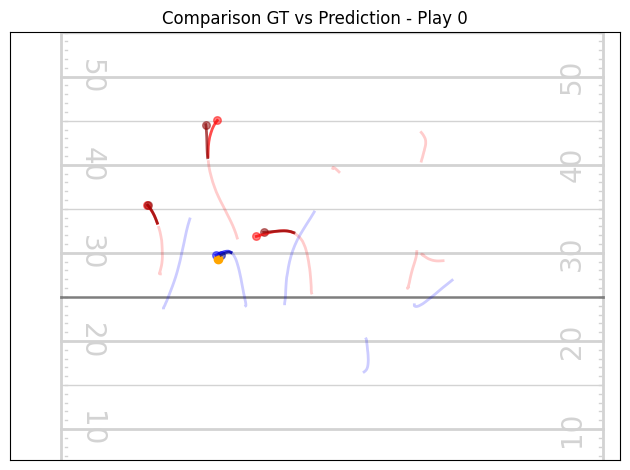

[PRE]   Player 1 mse_loss: 0.5936402678489685
[POST]  Player 1 mse_loss: 0.3333570957183838
[PRE]   Player 12 mse_loss: 0.005994786974042654
[POST]  Player 12 mse_loss: 0.004980884026736021


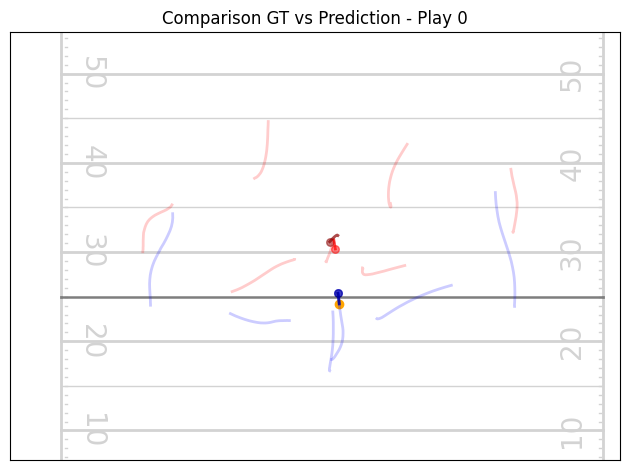

[PRE]   Player 1 mse_loss: 0.3547082543373108
[POST]  Player 1 mse_loss: 0.35492393374443054
[PRE]   Player 3 mse_loss: 0.3585260808467865
[POST]  Player 3 mse_loss: 0.35032492876052856
[PRE]   Player 11 mse_loss: 0.18125836551189423
[POST]  Player 11 mse_loss: 0.2220645397901535


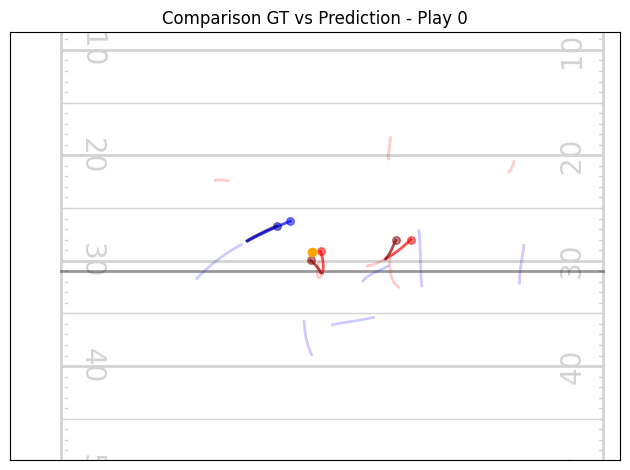

[PRE]   Player 2 mse_loss: 0.35922345519065857
[POST]  Player 2 mse_loss: 0.34878799319267273
[PRE]   Player 3 mse_loss: 0.31148284673690796
[POST]  Player 3 mse_loss: 0.29806190729141235
[PRE]   Player 5 mse_loss: 0.6736542582511902
[POST]  Player 5 mse_loss: 0.5924323797225952
[PRE]   Player 12 mse_loss: 0.24256792664527893
[POST]  Player 12 mse_loss: 0.2624706029891968


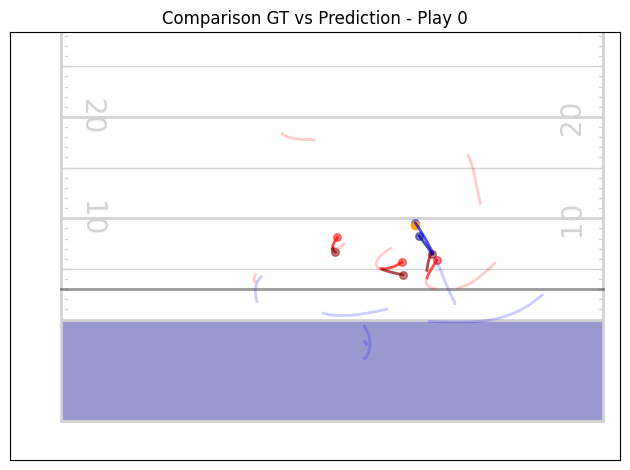

[PRE]   Player 5 mse_loss: 0.09212278574705124
[POST]  Player 5 mse_loss: 0.09549935162067413
[PRE]   Player 12 mse_loss: 0.017421012744307518
[POST]  Player 12 mse_loss: 0.02982274442911148


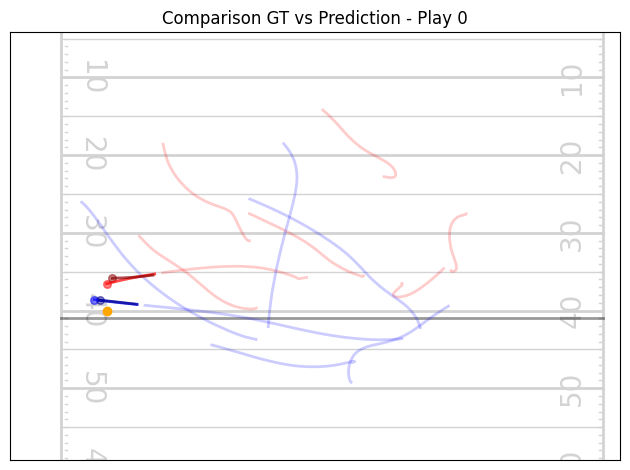

[PRE]   Player 5 mse_loss: 0.016166087239980698
[POST]  Player 5 mse_loss: 0.02286919206380844
[PRE]   Player 12 mse_loss: 0.015181699767708778
[POST]  Player 12 mse_loss: 0.021676290780305862


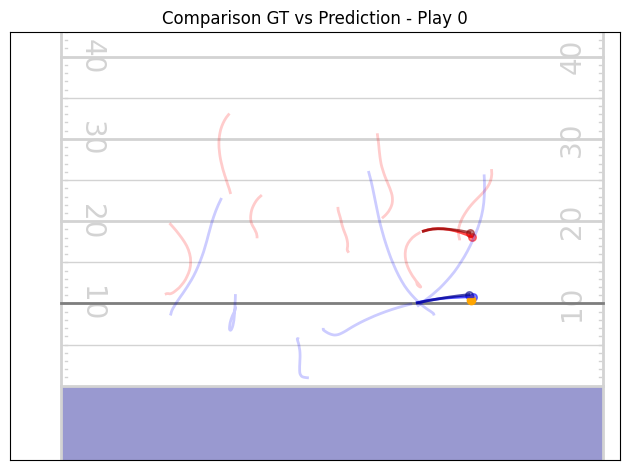

[PRE]   Player 2 mse_loss: 1.0275527238845825
[POST]  Player 2 mse_loss: 1.0374693870544434
[PRE]   Player 3 mse_loss: 0.08607646077871323
[POST]  Player 3 mse_loss: 0.08973842859268188
[PRE]   Player 5 mse_loss: 4.284590721130371
[POST]  Player 5 mse_loss: 4.282690048217773
[PRE]   Player 12 mse_loss: 5.403212070465088
[POST]  Player 12 mse_loss: 5.396816730499268


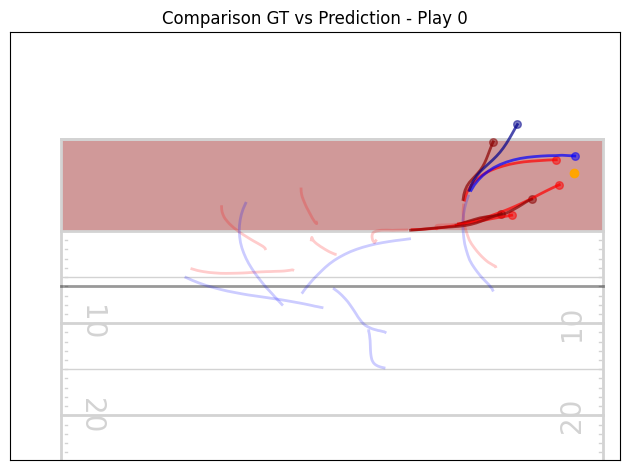

[PRE]   Player 1 mse_loss: 0.060424283146858215
[POST]  Player 1 mse_loss: 0.048311442136764526
[PRE]   Player 2 mse_loss: 0.1212645024061203
[POST]  Player 2 mse_loss: 0.11699480563402176
[PRE]   Player 3 mse_loss: 0.12830877304077148
[POST]  Player 3 mse_loss: 0.11425197124481201
[PRE]   Player 12 mse_loss: 0.03797629475593567
[POST]  Player 12 mse_loss: 0.04914822429418564


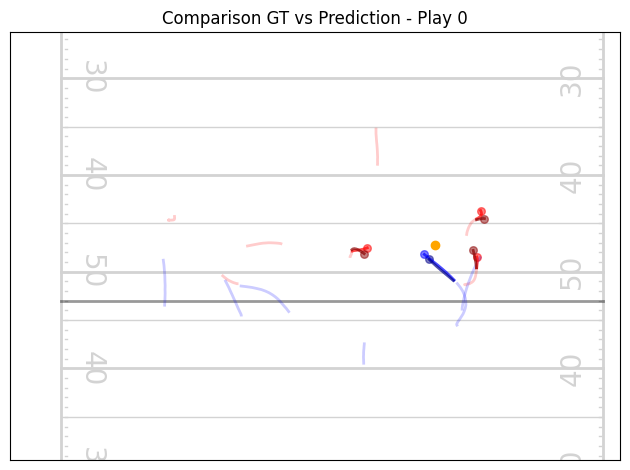

[PRE]   Player 2 mse_loss: 0.028422920033335686
[POST]  Player 2 mse_loss: 0.01913399063050747
[PRE]   Player 5 mse_loss: 0.012720733880996704
[POST]  Player 5 mse_loss: 0.01421805378049612
[PRE]   Player 12 mse_loss: 0.051021184772253036
[POST]  Player 12 mse_loss: 0.04490569233894348


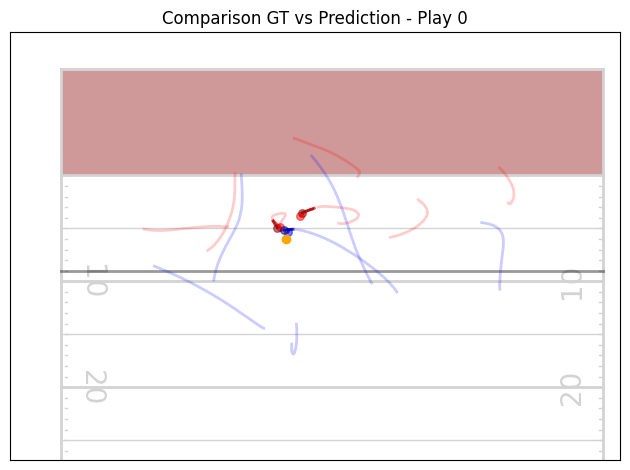

[PRE]   Player 2 mse_loss: 0.5878193974494934
[POST]  Player 2 mse_loss: 0.5627232789993286
[PRE]   Player 4 mse_loss: 0.10783474892377853
[POST]  Player 4 mse_loss: 0.11439130455255508
[PRE]   Player 5 mse_loss: 1.0935677289962769
[POST]  Player 5 mse_loss: 1.1058012247085571
[PRE]   Player 12 mse_loss: 0.017809180542826653
[POST]  Player 12 mse_loss: 0.017989538609981537


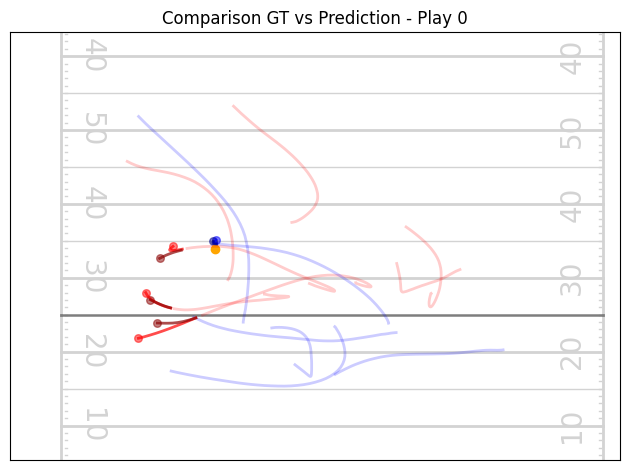

[PRE]   Player 3 mse_loss: 0.5466814041137695
[POST]  Player 3 mse_loss: 0.5673157572746277
[PRE]   Player 12 mse_loss: 0.3415759801864624
[POST]  Player 12 mse_loss: 0.31908300518989563


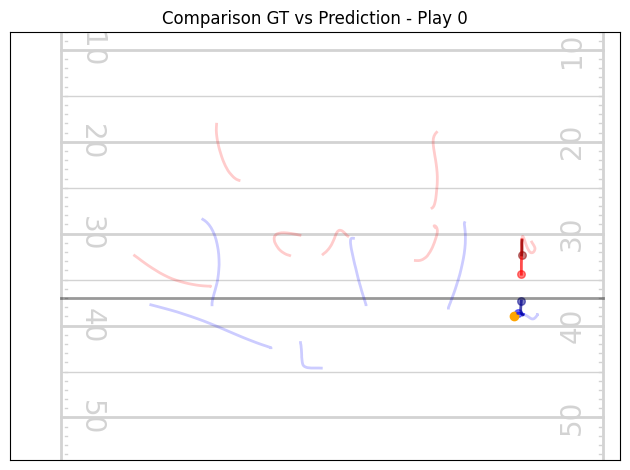

[PRE]   Player 2 mse_loss: 0.060020562261343
[POST]  Player 2 mse_loss: 0.05792677029967308
[PRE]   Player 5 mse_loss: 0.011677457951009274
[POST]  Player 5 mse_loss: 0.0122903510928154
[PRE]   Player 13 mse_loss: 0.02263456955552101
[POST]  Player 13 mse_loss: 0.021253500133752823


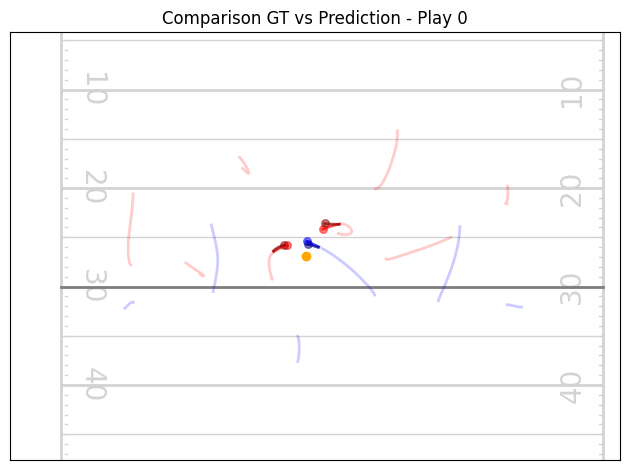

[PRE]   Player 5 mse_loss: 0.2586137056350708
[POST]  Player 5 mse_loss: 0.27277877926826477
[PRE]   Player 11 mse_loss: 0.21497222781181335
[POST]  Player 11 mse_loss: 0.22267989814281464


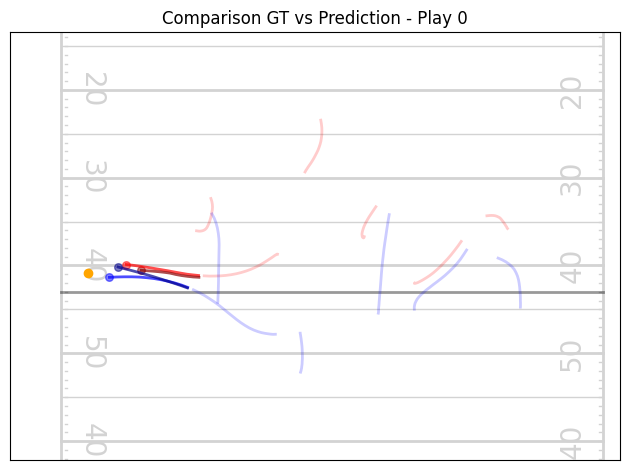

[PRE]   Player 0 mse_loss: 2.348541736602783
[POST]  Player 0 mse_loss: 2.354999303817749
[PRE]   Player 3 mse_loss: 1.7129191160202026
[POST]  Player 3 mse_loss: 1.7385550737380981
[PRE]   Player 5 mse_loss: 2.8891732692718506
[POST]  Player 5 mse_loss: 2.8711962699890137
[PRE]   Player 10 mse_loss: 0.2825906276702881
[POST]  Player 10 mse_loss: 0.2863774299621582


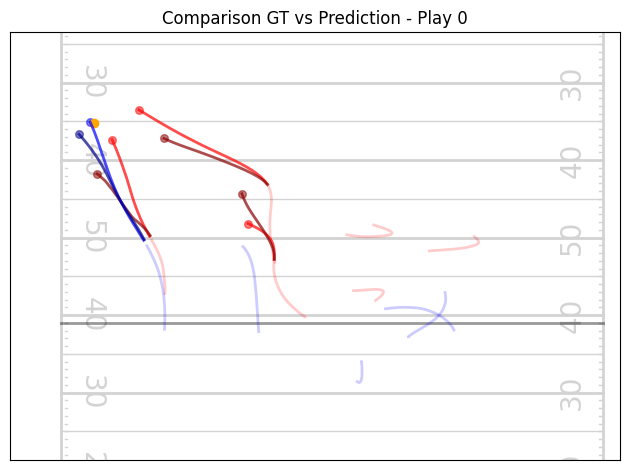

[PRE]   Player 0 mse_loss: 0.0815742015838623
[POST]  Player 0 mse_loss: 0.08719365298748016
[PRE]   Player 2 mse_loss: 0.08416608721017838
[POST]  Player 2 mse_loss: 0.097682423889637
[PRE]   Player 3 mse_loss: 0.07357523590326309
[POST]  Player 3 mse_loss: 0.05928569287061691
[PRE]   Player 4 mse_loss: 0.04709313437342644
[POST]  Player 4 mse_loss: 0.044447917491197586
[PRE]   Player 11 mse_loss: 0.055203743278980255
[POST]  Player 11 mse_loss: 0.06769200414419174


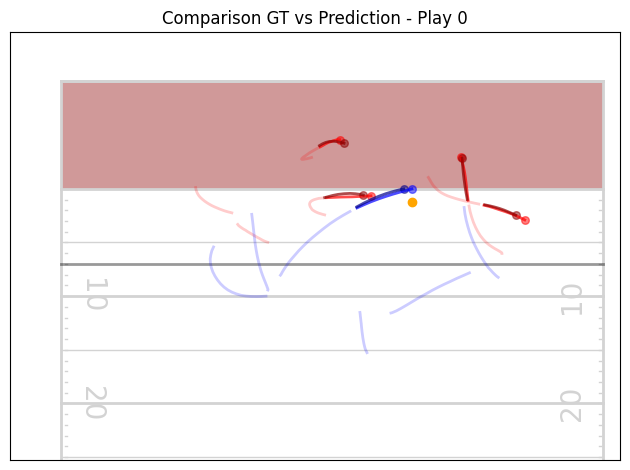

[PRE]   Player 1 mse_loss: 0.24521513283252716
[POST]  Player 1 mse_loss: 0.23797069489955902
[PRE]   Player 6 mse_loss: 2.0936639308929443
[POST]  Player 6 mse_loss: 2.1033384799957275
[PRE]   Player 11 mse_loss: 0.07829585671424866
[POST]  Player 11 mse_loss: 0.06868615746498108


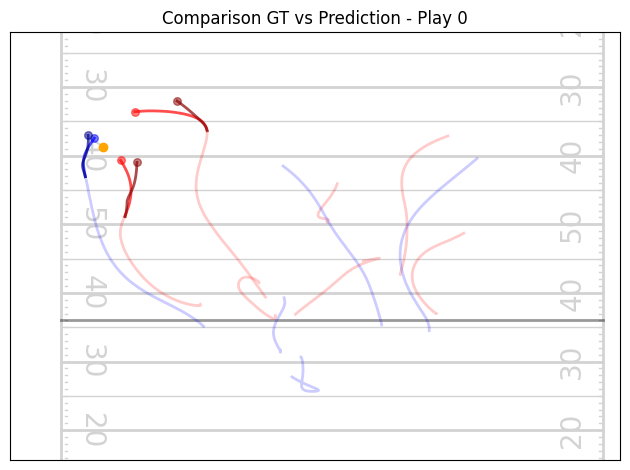

[PRE]   Player 1 mse_loss: 0.1504105180501938
[POST]  Player 1 mse_loss: 0.17086556553840637
[PRE]   Player 2 mse_loss: 0.30267438292503357
[POST]  Player 2 mse_loss: 0.28028202056884766
[PRE]   Player 12 mse_loss: 0.0755036473274231
[POST]  Player 12 mse_loss: 0.08447679877281189


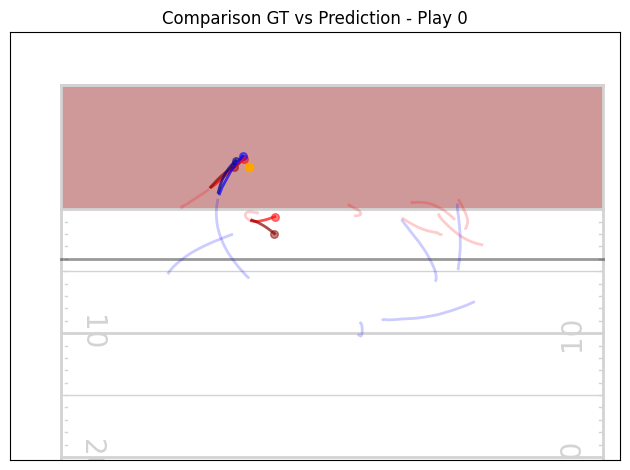

[PRE]   Player 0 mse_loss: 0.06953886896371841
[POST]  Player 0 mse_loss: 0.055796947330236435
[PRE]   Player 2 mse_loss: 0.0811866819858551
[POST]  Player 2 mse_loss: 0.09409597516059875
[PRE]   Player 4 mse_loss: 0.0876457616686821
[POST]  Player 4 mse_loss: 0.09059364348649979
[PRE]   Player 5 mse_loss: 0.5116530656814575
[POST]  Player 5 mse_loss: 0.5417137742042542
[PRE]   Player 11 mse_loss: 0.1995047628879547
[POST]  Player 11 mse_loss: 0.22379007935523987


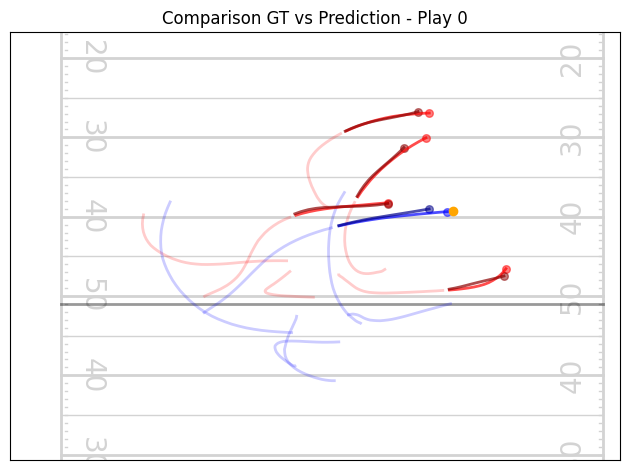

[PRE]   Player 12 mse_loss: 0.009947250597178936
[POST]  Player 12 mse_loss: 0.009646376594901085


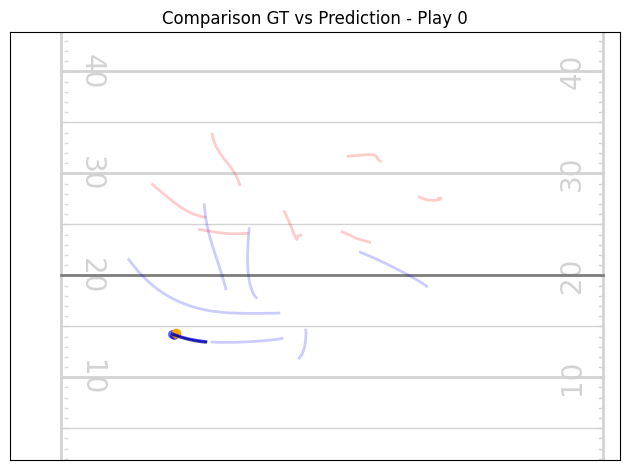

[PRE]   Player 0 mse_loss: 0.26057374477386475
[POST]  Player 0 mse_loss: 0.24212299287319183
[PRE]   Player 11 mse_loss: 0.10785803943872452
[POST]  Player 11 mse_loss: 0.09601767361164093


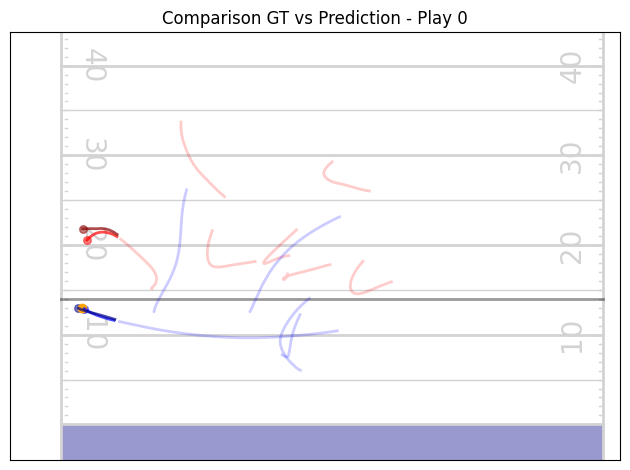

[PRE]   Player 1 mse_loss: 0.14242786169052124
[POST]  Player 1 mse_loss: 0.13676592707633972
[PRE]   Player 2 mse_loss: 0.2359616458415985
[POST]  Player 2 mse_loss: 0.22218310832977295
[PRE]   Player 3 mse_loss: 0.06981221586465836
[POST]  Player 3 mse_loss: 0.07160592079162598
[PRE]   Player 4 mse_loss: 0.042419955134391785
[POST]  Player 4 mse_loss: 0.03844881057739258
[PRE]   Player 6 mse_loss: 0.03954894840717316
[POST]  Player 6 mse_loss: 0.04025682061910629
[PRE]   Player 12 mse_loss: 0.22252768278121948
[POST]  Player 12 mse_loss: 0.22724293172359467


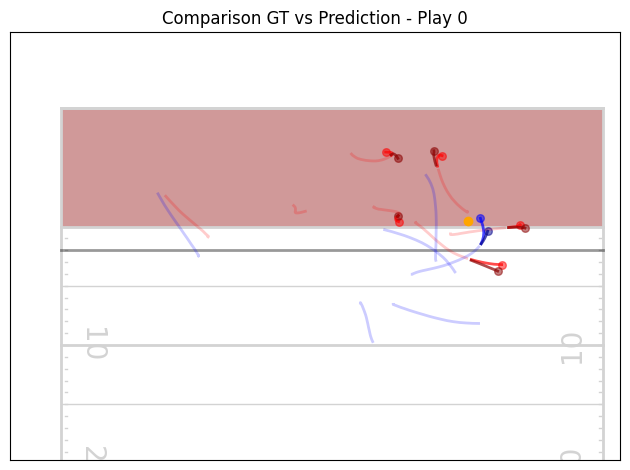

[PRE]   Player 3 mse_loss: 0.29184097051620483
[POST]  Player 3 mse_loss: 0.2896074056625366
[PRE]   Player 4 mse_loss: 0.4357108473777771
[POST]  Player 4 mse_loss: 0.3839876353740692
[PRE]   Player 12 mse_loss: 0.27530962228775024
[POST]  Player 12 mse_loss: 0.2761708199977875


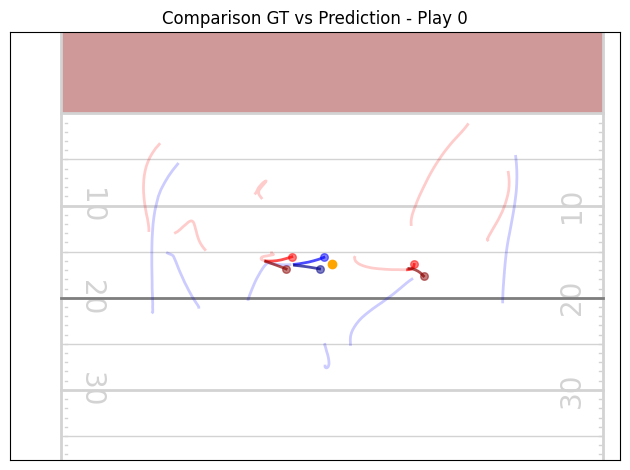

[PRE]   Player 0 mse_loss: 0.05478527024388313
[POST]  Player 0 mse_loss: 0.07594683766365051
[PRE]   Player 3 mse_loss: 0.48358386754989624
[POST]  Player 3 mse_loss: 0.4758759140968323
[PRE]   Player 5 mse_loss: 0.2527061998844147
[POST]  Player 5 mse_loss: 0.23950454592704773
[PRE]   Player 12 mse_loss: 0.1171794906258583
[POST]  Player 12 mse_loss: 0.14061878621578217


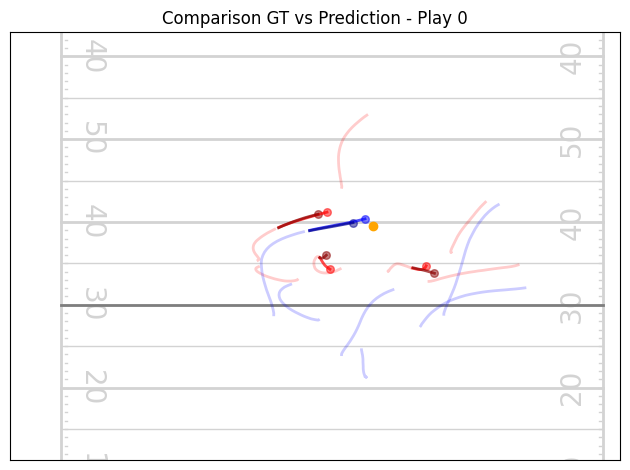

[PRE]   Player 0 mse_loss: 0.44310811161994934
[POST]  Player 0 mse_loss: 0.4200708866119385
[PRE]   Player 2 mse_loss: 2.4404966831207275
[POST]  Player 2 mse_loss: 2.4676811695098877
[PRE]   Player 4 mse_loss: 0.18510617315769196
[POST]  Player 4 mse_loss: 0.18679481744766235
[PRE]   Player 9 mse_loss: 0.11620800197124481
[POST]  Player 9 mse_loss: 0.12191778421401978


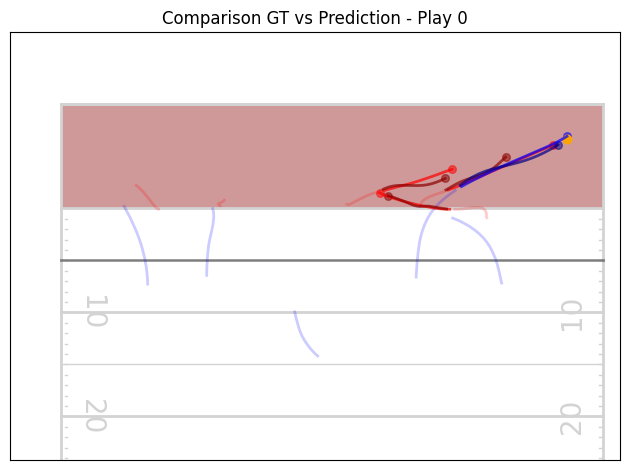

[PRE]   Player 2 mse_loss: 0.014217227697372437
[POST]  Player 2 mse_loss: 0.02203279361128807
[PRE]   Player 3 mse_loss: 0.09214391559362411
[POST]  Player 3 mse_loss: 0.10358364880084991
[PRE]   Player 4 mse_loss: 0.05461151897907257
[POST]  Player 4 mse_loss: 0.06080799549818039
[PRE]   Player 12 mse_loss: 0.02297068201005459
[POST]  Player 12 mse_loss: 0.01903904601931572


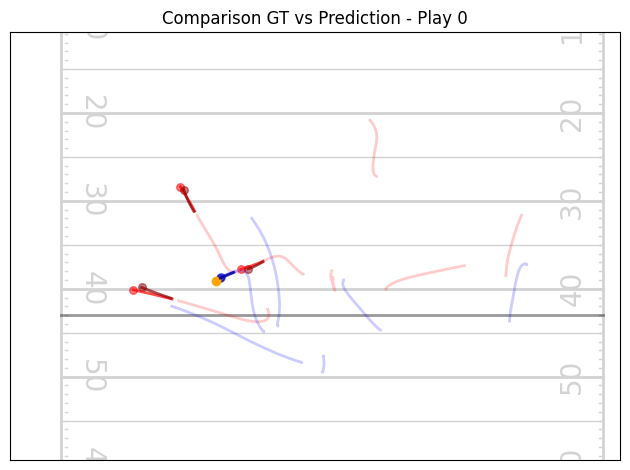

[PRE]   Player 3 mse_loss: 5.107816696166992
[POST]  Player 3 mse_loss: 5.070613861083984
[PRE]   Player 4 mse_loss: 0.1672997772693634
[POST]  Player 4 mse_loss: 0.16331295669078827
[PRE]   Player 5 mse_loss: 2.4131710529327393
[POST]  Player 5 mse_loss: 2.421255588531494
[PRE]   Player 11 mse_loss: 0.71495121717453
[POST]  Player 11 mse_loss: 0.7285134196281433


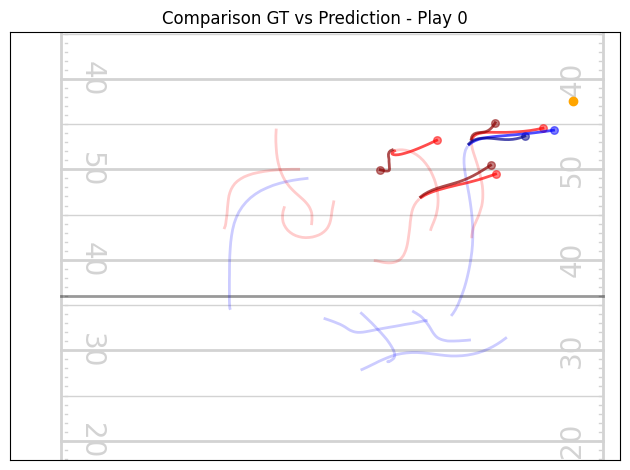

[PRE]   Player 3 mse_loss: 0.07536695897579193
[POST]  Player 3 mse_loss: 0.05796613544225693
[PRE]   Player 4 mse_loss: 0.10217843949794769
[POST]  Player 4 mse_loss: 0.0982847809791565
[PRE]   Player 5 mse_loss: 0.34609031677246094
[POST]  Player 5 mse_loss: 0.3577722907066345
[PRE]   Player 6 mse_loss: 1.0042996406555176
[POST]  Player 6 mse_loss: 0.9924671053886414
[PRE]   Player 12 mse_loss: 0.44770193099975586
[POST]  Player 12 mse_loss: 0.46231159567832947


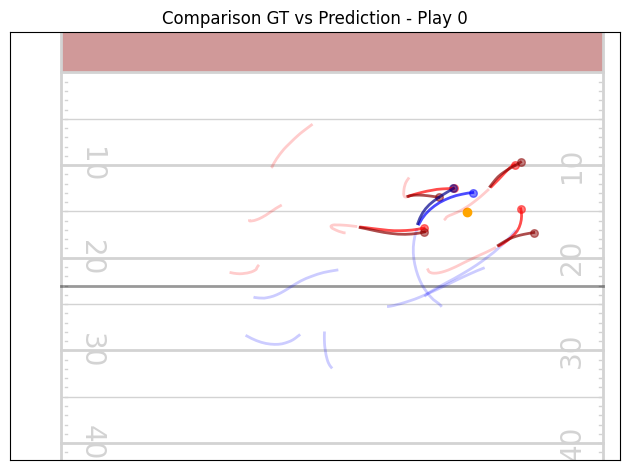

[PRE]   Player 12 mse_loss: 0.040812842547893524
[POST]  Player 12 mse_loss: 0.060117267072200775


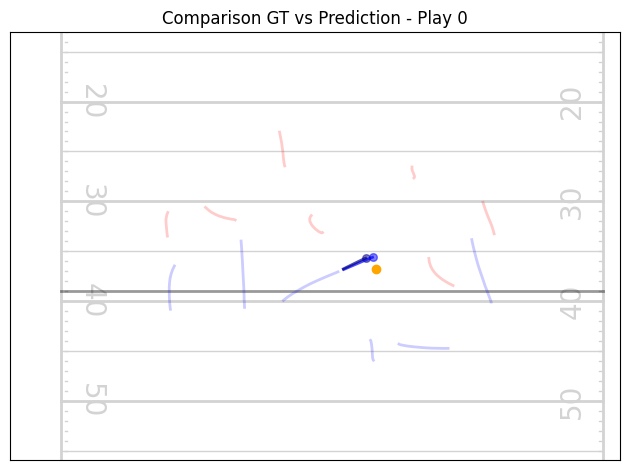

[PRE]   Player 2 mse_loss: 551.5986938476562
[POST]  Player 2 mse_loss: 344.528076171875
[PRE]   Player 4 mse_loss: 319.121826171875
[POST]  Player 4 mse_loss: 271.3703308105469
[PRE]   Player 6 mse_loss: 216.22097778320312
[POST]  Player 6 mse_loss: 191.85011291503906
[PRE]   Player 11 mse_loss: 263.41815185546875
[POST]  Player 11 mse_loss: 239.59950256347656


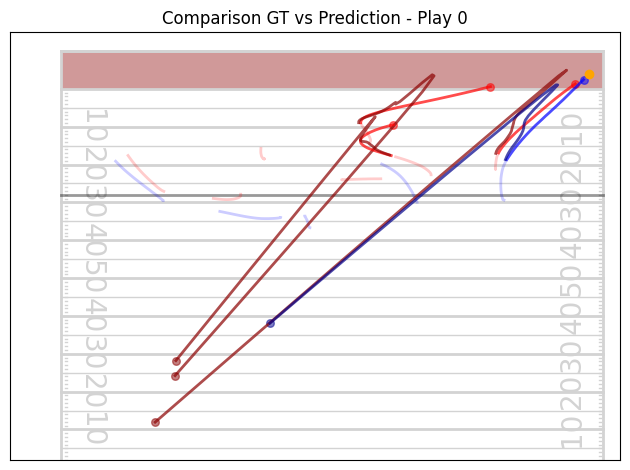

[PRE]   Player 0 mse_loss: 0.21560624241828918
[POST]  Player 0 mse_loss: 0.20995201170444489
[PRE]   Player 1 mse_loss: 0.8318607807159424
[POST]  Player 1 mse_loss: 0.8624265193939209
[PRE]   Player 2 mse_loss: 0.35510388016700745
[POST]  Player 2 mse_loss: 0.3758487403392792
[PRE]   Player 3 mse_loss: 0.1759425550699234
[POST]  Player 3 mse_loss: 0.18827562034130096
[PRE]   Player 5 mse_loss: 1.7586582899093628
[POST]  Player 5 mse_loss: 1.751610517501831
[PRE]   Player 11 mse_loss: 0.056787725538015366
[POST]  Player 11 mse_loss: 0.06644455343484879


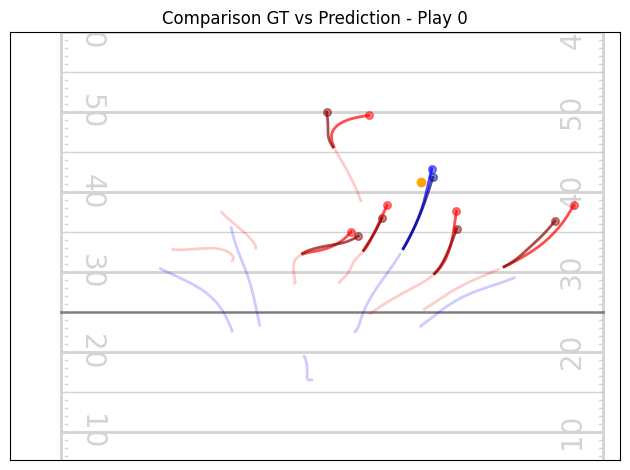

[PRE]   Player 1 mse_loss: 0.11934196949005127
[POST]  Player 1 mse_loss: 0.10514814406633377
[PRE]   Player 4 mse_loss: 0.20515145361423492
[POST]  Player 4 mse_loss: 0.20350342988967896
[PRE]   Player 12 mse_loss: 0.07664614915847778
[POST]  Player 12 mse_loss: 0.082620769739151


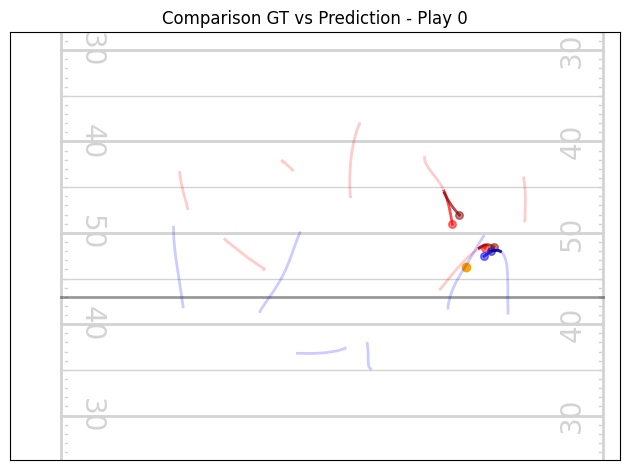

[PRE]   Player 4 mse_loss: 0.05524591729044914
[POST]  Player 4 mse_loss: 0.07110072672367096
[PRE]   Player 5 mse_loss: 0.24248367547988892
[POST]  Player 5 mse_loss: 0.2697368562221527
[PRE]   Player 10 mse_loss: 0.024545269086956978
[POST]  Player 10 mse_loss: 0.037734560668468475


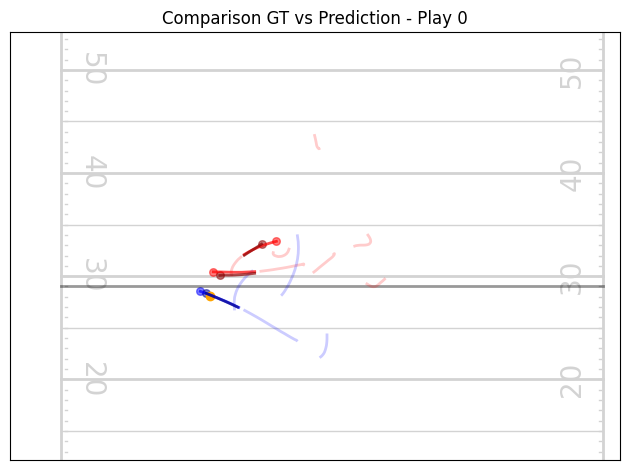

[PRE]   Player 0 mse_loss: 0.05181094631552696
[POST]  Player 0 mse_loss: 0.05472785234451294
[PRE]   Player 1 mse_loss: 0.13296912610530853
[POST]  Player 1 mse_loss: 0.14843975007534027
[PRE]   Player 2 mse_loss: 0.11359959095716476
[POST]  Player 2 mse_loss: 0.11120454221963882
[PRE]   Player 3 mse_loss: 0.14908282458782196
[POST]  Player 3 mse_loss: 0.1569632738828659
[PRE]   Player 4 mse_loss: 0.17626123130321503
[POST]  Player 4 mse_loss: 0.16386933624744415
[PRE]   Player 6 mse_loss: 0.03632568195462227
[POST]  Player 6 mse_loss: 0.03820914775133133
[PRE]   Player 12 mse_loss: 0.16216139495372772
[POST]  Player 12 mse_loss: 0.17891035974025726


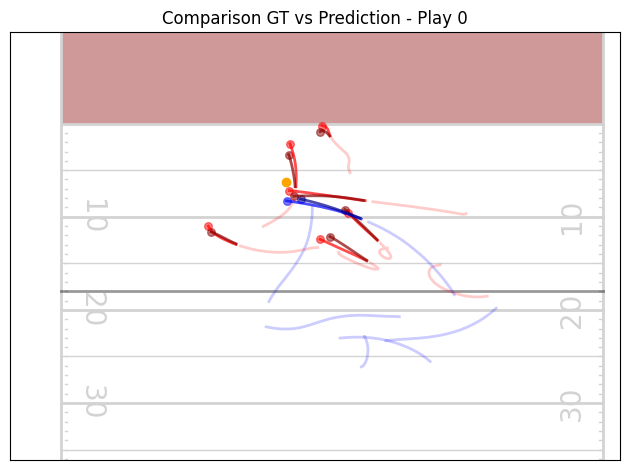

[PRE]   Player 2 mse_loss: 0.11412452161312103
[POST]  Player 2 mse_loss: 0.12633103132247925
[PRE]   Player 12 mse_loss: 0.2214421182870865
[POST]  Player 12 mse_loss: 0.22216758131980896


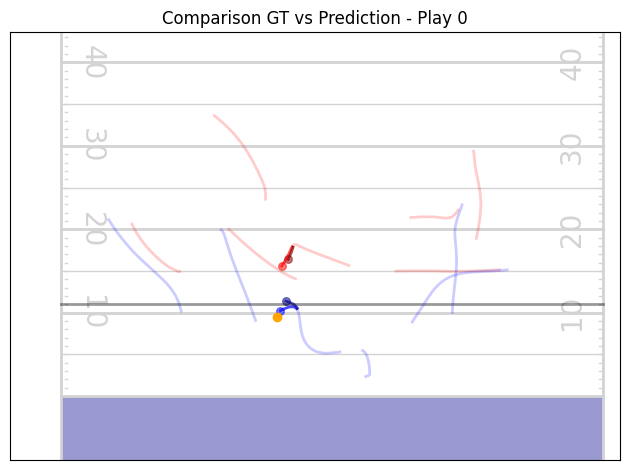

[PRE]   Player 4 mse_loss: 0.05030570179224014
[POST]  Player 4 mse_loss: 0.04828312247991562
[PRE]   Player 12 mse_loss: 0.02664639614522457
[POST]  Player 12 mse_loss: 0.028353536501526833


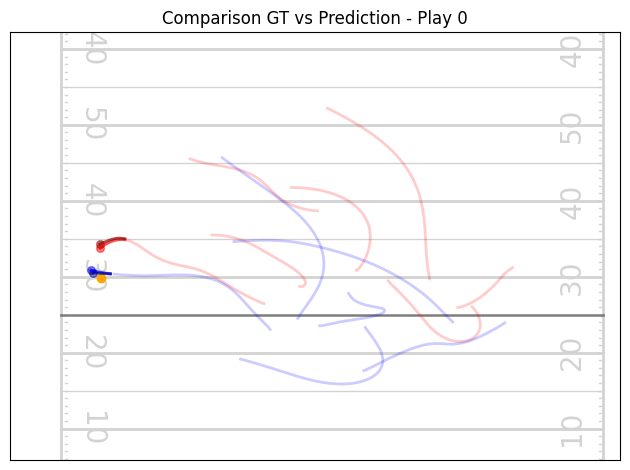

[PRE]   Player 3 mse_loss: 0.12945504486560822
[POST]  Player 3 mse_loss: 0.12705573439598083
[PRE]   Player 4 mse_loss: 0.24719099700450897
[POST]  Player 4 mse_loss: 0.26626452803611755
[PRE]   Player 5 mse_loss: 3.5349745750427246
[POST]  Player 5 mse_loss: 3.450570583343506
[PRE]   Player 12 mse_loss: 0.13700810074806213
[POST]  Player 12 mse_loss: 0.1574745774269104


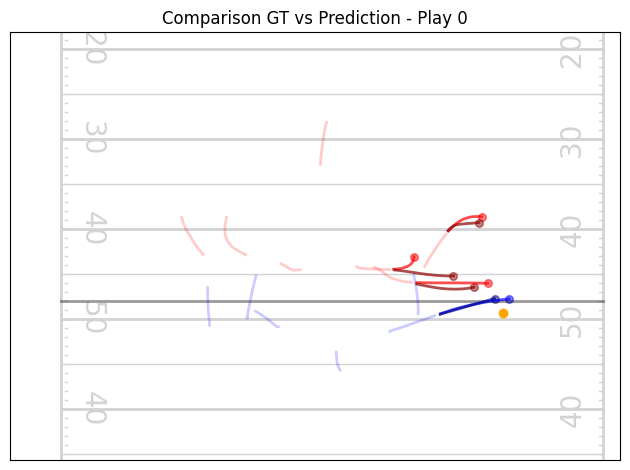

[PRE]   Player 1 mse_loss: 0.08362509310245514
[POST]  Player 1 mse_loss: 0.09434619545936584
[PRE]   Player 3 mse_loss: 0.12165196239948273
[POST]  Player 3 mse_loss: 0.12457063049077988
[PRE]   Player 4 mse_loss: 0.30536675453186035
[POST]  Player 4 mse_loss: 0.297578901052475
[PRE]   Player 5 mse_loss: 0.09705593436956406
[POST]  Player 5 mse_loss: 0.11049161106348038
[PRE]   Player 12 mse_loss: 0.13536176085472107
[POST]  Player 12 mse_loss: 0.1542171686887741


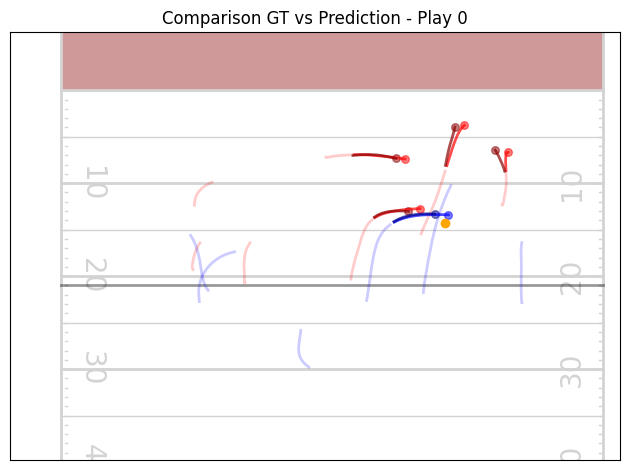

[PRE]   Player 5 mse_loss: 0.023498522117733955
[POST]  Player 5 mse_loss: 0.03559039160609245
[PRE]   Player 10 mse_loss: 0.033511798828840256
[POST]  Player 10 mse_loss: 0.04750142619013786


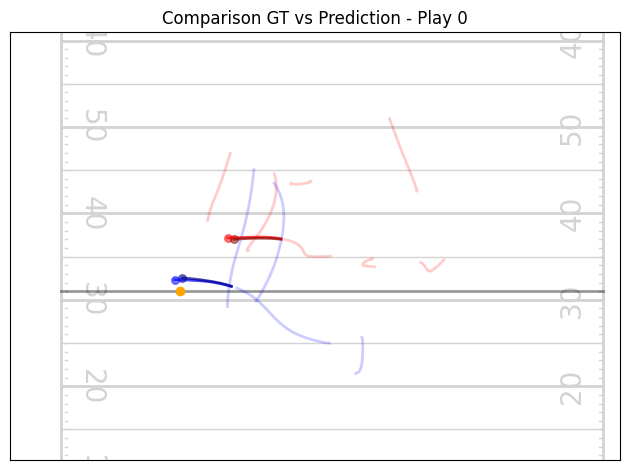

[PRE]   Player 3 mse_loss: 0.05228371545672417
[POST]  Player 3 mse_loss: 0.03879702836275101
[PRE]   Player 4 mse_loss: 0.15563258528709412
[POST]  Player 4 mse_loss: 0.1860194206237793
[PRE]   Player 12 mse_loss: 0.018574059009552002
[POST]  Player 12 mse_loss: 0.0201066043227911


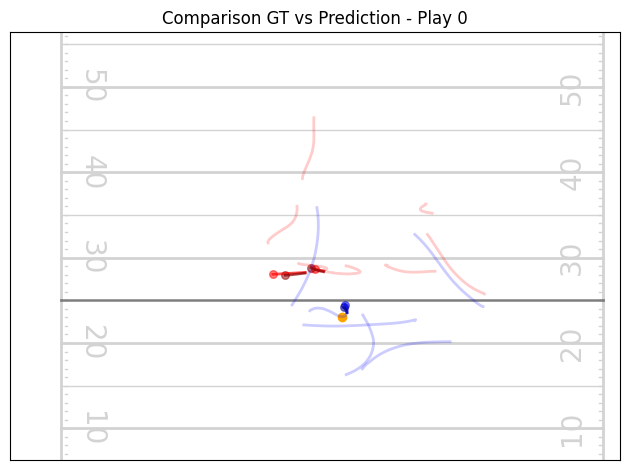

[PRE]   Player 0 mse_loss: 0.4625406265258789
[POST]  Player 0 mse_loss: 0.454568088054657
[PRE]   Player 2 mse_loss: 0.8063425421714783
[POST]  Player 2 mse_loss: 0.8380632400512695
[PRE]   Player 3 mse_loss: 0.2780689597129822
[POST]  Player 3 mse_loss: 0.27995994687080383
[PRE]   Player 12 mse_loss: 0.15662424266338348
[POST]  Player 12 mse_loss: 0.1750679463148117


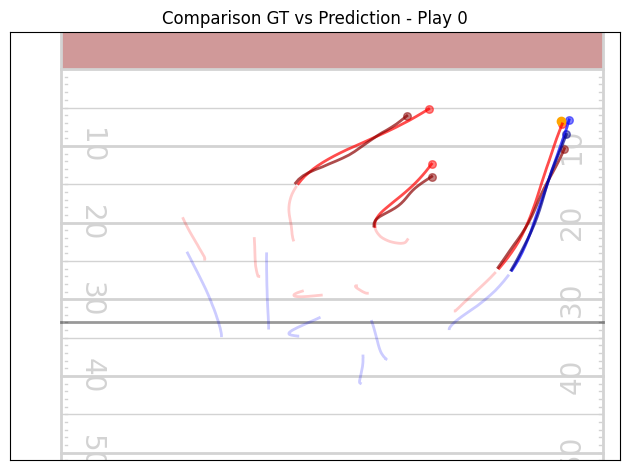

[PRE]   Player 0 mse_loss: 0.05603097751736641
[POST]  Player 0 mse_loss: 0.06373614072799683
[PRE]   Player 3 mse_loss: 0.12267012149095535
[POST]  Player 3 mse_loss: 0.13733990490436554
[PRE]   Player 4 mse_loss: 0.08545570820569992
[POST]  Player 4 mse_loss: 0.10141701251268387
[PRE]   Player 12 mse_loss: 0.03673749044537544
[POST]  Player 12 mse_loss: 0.03329180181026459


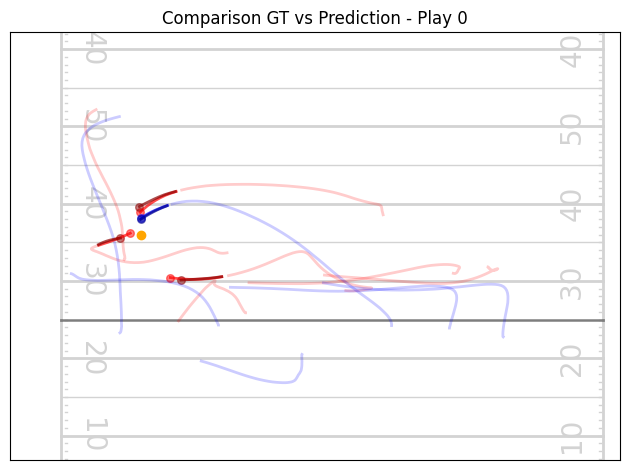

[PRE]   Player 0 mse_loss: 0.0489954948425293
[POST]  Player 0 mse_loss: 0.05189807713031769
[PRE]   Player 3 mse_loss: 3.259833812713623
[POST]  Player 3 mse_loss: 3.275165319442749
[PRE]   Player 12 mse_loss: 0.3526492118835449
[POST]  Player 12 mse_loss: 0.3780217170715332


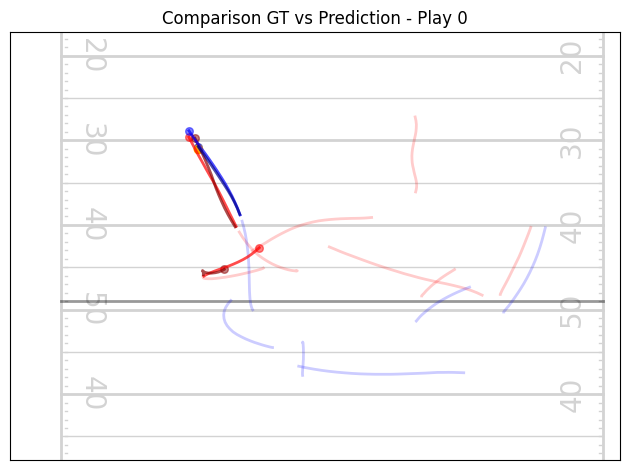

[PRE]   Player 0 mse_loss: 0.055846937000751495
[POST]  Player 0 mse_loss: 0.05836322531104088
[PRE]   Player 2 mse_loss: 0.02602420747280121
[POST]  Player 2 mse_loss: 0.022879254072904587
[PRE]   Player 3 mse_loss: 0.08023464679718018
[POST]  Player 3 mse_loss: 0.08499862998723984
[PRE]   Player 11 mse_loss: 0.16197796165943146
[POST]  Player 11 mse_loss: 0.1543409377336502


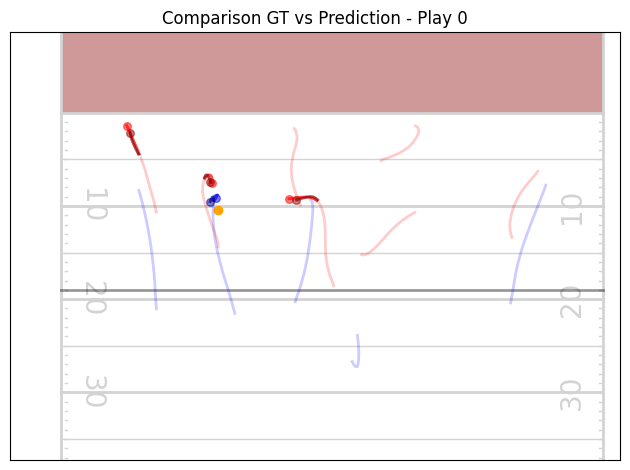

[PRE]   Player 2 mse_loss: 0.11026722192764282
[POST]  Player 2 mse_loss: 0.09219158440828323
[PRE]   Player 3 mse_loss: 0.1585637927055359
[POST]  Player 3 mse_loss: 0.17408137023448944
[PRE]   Player 4 mse_loss: 0.07035962492227554
[POST]  Player 4 mse_loss: 0.08549993485212326
[PRE]   Player 12 mse_loss: 0.017980176955461502
[POST]  Player 12 mse_loss: 0.015229356475174427


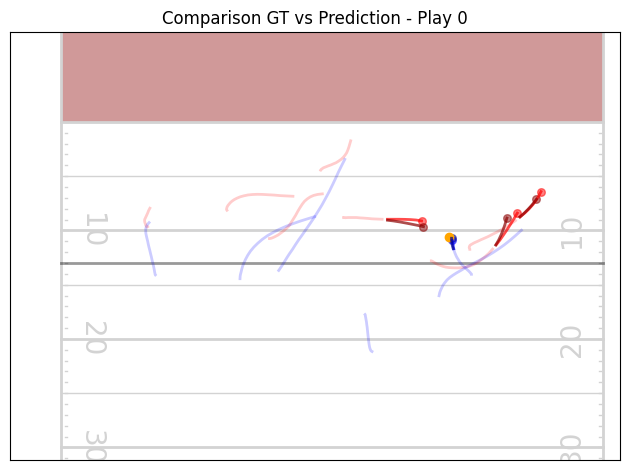

[PRE]   Player 1 mse_loss: 0.06139465421438217
[POST]  Player 1 mse_loss: 0.08163942396640778
[PRE]   Player 2 mse_loss: 0.293955534696579
[POST]  Player 2 mse_loss: 0.32358497381210327
[PRE]   Player 6 mse_loss: 0.08913545310497284
[POST]  Player 6 mse_loss: 0.10499142855405807
[PRE]   Player 12 mse_loss: 0.20666643977165222
[POST]  Player 12 mse_loss: 0.22927185893058777


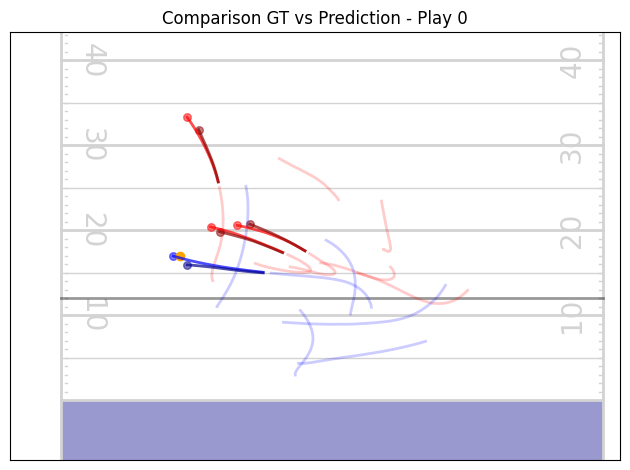

[PRE]   Player 3 mse_loss: 0.07168281823396683
[POST]  Player 3 mse_loss: 0.07743795961141586
[PRE]   Player 5 mse_loss: 0.053106408566236496
[POST]  Player 5 mse_loss: 0.04714994877576828
[PRE]   Player 13 mse_loss: 0.06928016990423203
[POST]  Player 13 mse_loss: 0.08145948499441147


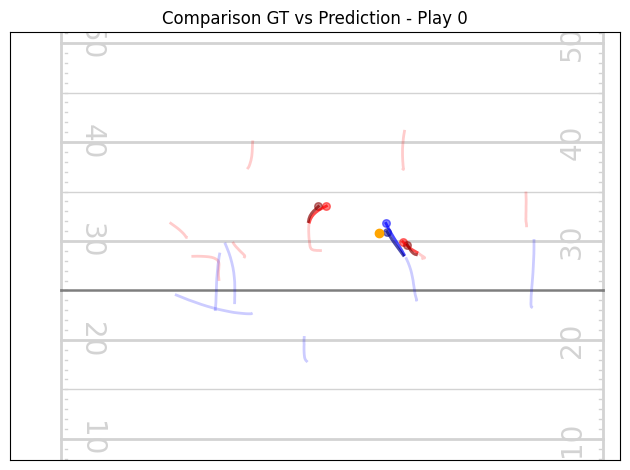

[PRE]   Player 1 mse_loss: 0.15688617527484894
[POST]  Player 1 mse_loss: 0.17051894962787628
[PRE]   Player 2 mse_loss: 0.34978777170181274
[POST]  Player 2 mse_loss: 0.34823185205459595
[PRE]   Player 11 mse_loss: 0.16097858548164368
[POST]  Player 11 mse_loss: 0.1786459982395172


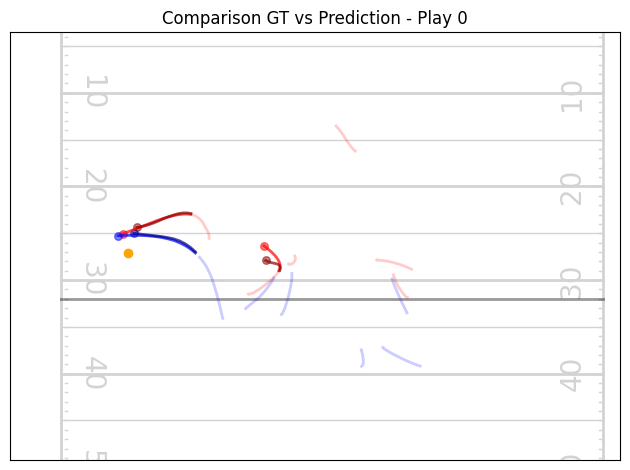

[PRE]   Player 0 mse_loss: 0.13201259076595306
[POST]  Player 0 mse_loss: 0.13808220624923706
[PRE]   Player 11 mse_loss: 0.21780869364738464
[POST]  Player 11 mse_loss: 0.2231711447238922


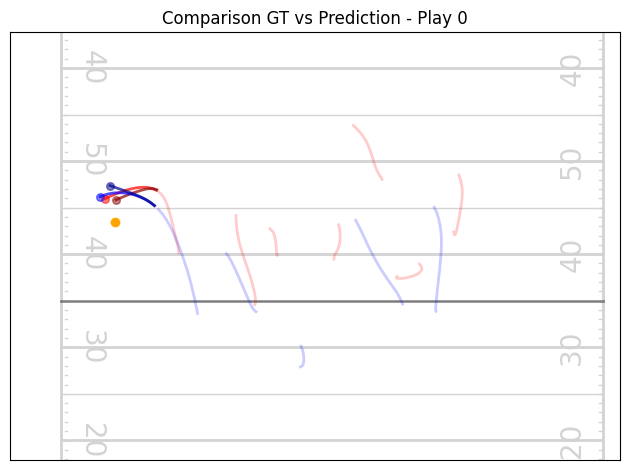

[PRE]   Player 2 mse_loss: 0.26713189482688904
[POST]  Player 2 mse_loss: 0.2542605698108673
[PRE]   Player 3 mse_loss: 0.592715322971344
[POST]  Player 3 mse_loss: 0.5665813684463501
[PRE]   Player 4 mse_loss: 0.38519155979156494
[POST]  Player 4 mse_loss: 0.4020352065563202
[PRE]   Player 12 mse_loss: 0.269313246011734
[POST]  Player 12 mse_loss: 0.2525803744792938


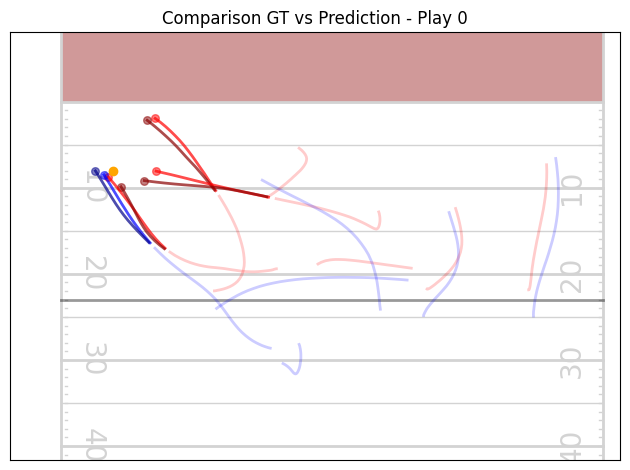

[PRE]   Player 1 mse_loss: 0.7827897667884827
[POST]  Player 1 mse_loss: 0.7666603922843933
[PRE]   Player 3 mse_loss: 1.0337109565734863
[POST]  Player 3 mse_loss: 1.012033224105835
[PRE]   Player 4 mse_loss: 4.02117919921875
[POST]  Player 4 mse_loss: 4.004408359527588
[PRE]   Player 8 mse_loss: 1.0258034467697144
[POST]  Player 8 mse_loss: 1.011757731437683


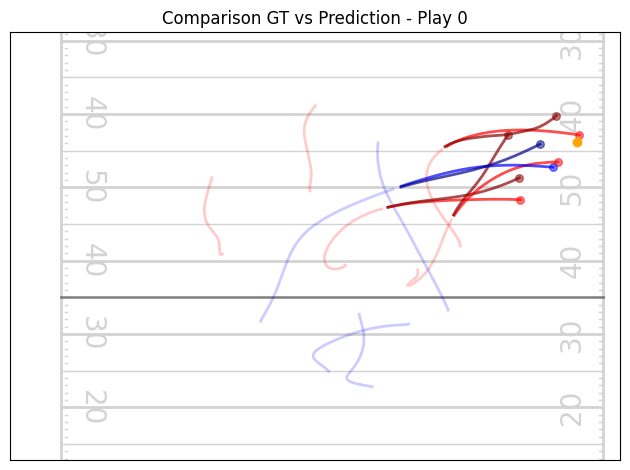

[PRE]   Player 1 mse_loss: 0.019066786393523216
[POST]  Player 1 mse_loss: 0.01500018686056137
[PRE]   Player 2 mse_loss: 0.06642904132604599
[POST]  Player 2 mse_loss: 0.06971462815999985
[PRE]   Player 3 mse_loss: 0.21588313579559326
[POST]  Player 3 mse_loss: 0.21186457574367523
[PRE]   Player 4 mse_loss: 0.12218894809484482
[POST]  Player 4 mse_loss: 0.13707223534584045
[PRE]   Player 13 mse_loss: 0.060932088643312454
[POST]  Player 13 mse_loss: 0.06454577296972275


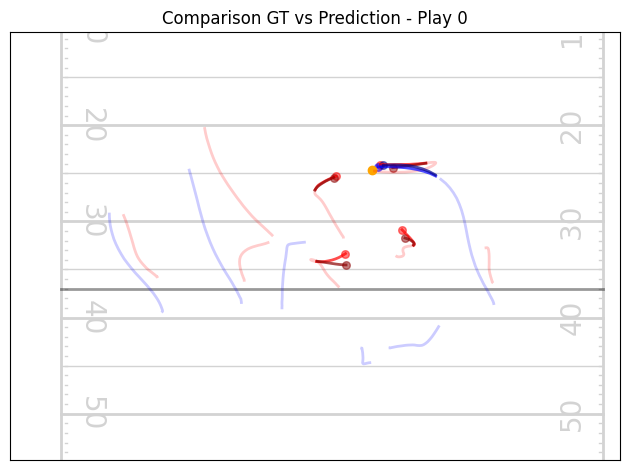

[PRE]   Player 0 mse_loss: 0.025035809725522995
[POST]  Player 0 mse_loss: 0.03490925580263138
[PRE]   Player 11 mse_loss: 0.05118436738848686
[POST]  Player 11 mse_loss: 0.07076297700405121


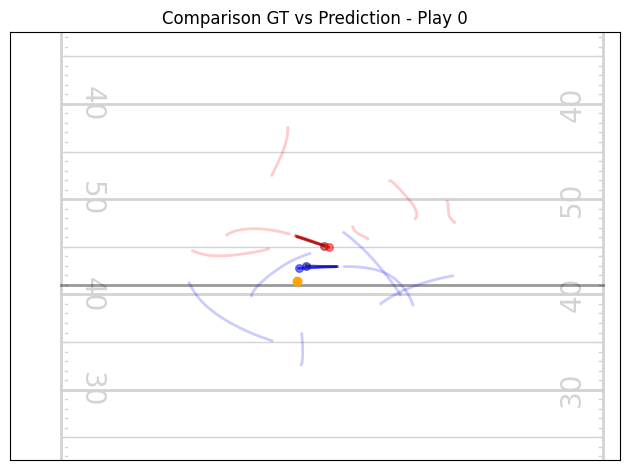

[PRE]   Player 2 mse_loss: 0.5650131106376648
[POST]  Player 2 mse_loss: 0.5689315795898438
[PRE]   Player 3 mse_loss: 0.16523593664169312
[POST]  Player 3 mse_loss: 0.18419985473155975
[PRE]   Player 4 mse_loss: 0.03713986650109291
[POST]  Player 4 mse_loss: 0.0519399419426918
[PRE]   Player 5 mse_loss: 0.08938422799110413
[POST]  Player 5 mse_loss: 0.08650460094213486
[PRE]   Player 6 mse_loss: 0.11751017719507217
[POST]  Player 6 mse_loss: 0.12251843512058258
[PRE]   Player 12 mse_loss: 0.05018238350749016
[POST]  Player 12 mse_loss: 0.0636843591928482


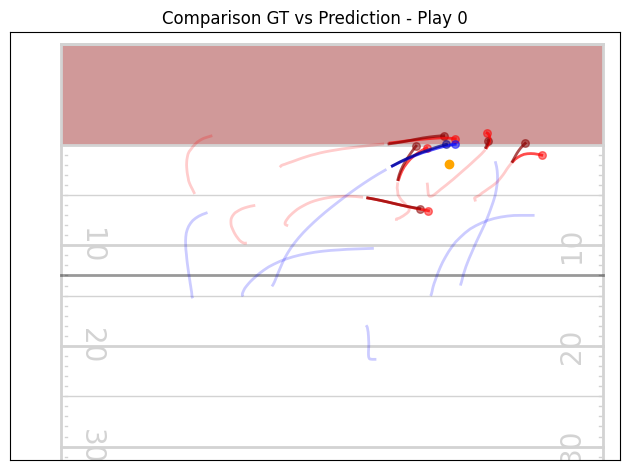

[PRE]   Player 5 mse_loss: 0.028147179633378983
[POST]  Player 5 mse_loss: 0.03500625491142273
[PRE]   Player 6 mse_loss: 0.41794511675834656
[POST]  Player 6 mse_loss: 0.40033793449401855
[PRE]   Player 12 mse_loss: 0.024888217449188232
[POST]  Player 12 mse_loss: 0.03596700727939606


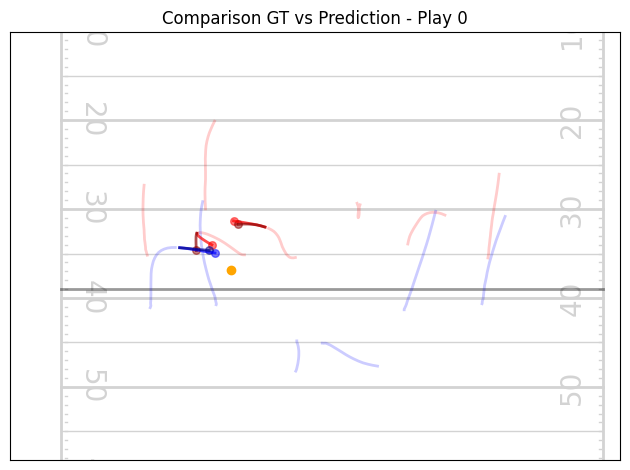

[PRE]   Player 2 mse_loss: 1.247744083404541
[POST]  Player 2 mse_loss: 1.1888046264648438
[PRE]   Player 3 mse_loss: 4.531787395477295
[POST]  Player 3 mse_loss: 4.544040679931641
[PRE]   Player 4 mse_loss: 2.234013557434082
[POST]  Player 4 mse_loss: 2.235960006713867
[PRE]   Player 5 mse_loss: 0.7684360146522522
[POST]  Player 5 mse_loss: 0.7536381483078003
[PRE]   Player 12 mse_loss: 1.072489619255066
[POST]  Player 12 mse_loss: 1.085201382637024


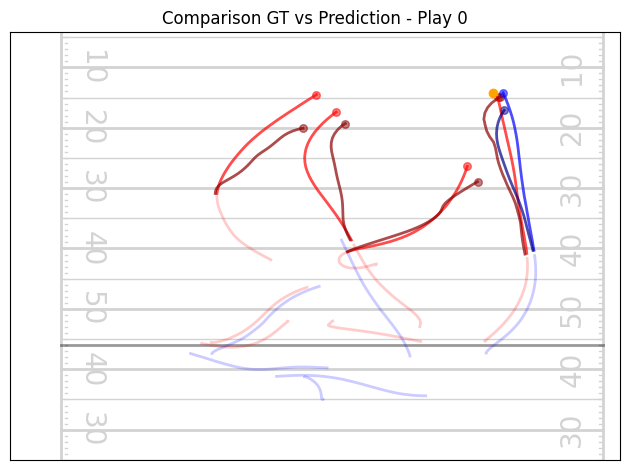

[PRE]   Player 3 mse_loss: 0.02900705859065056
[POST]  Player 3 mse_loss: 0.03312167525291443
[PRE]   Player 4 mse_loss: 0.3994337320327759
[POST]  Player 4 mse_loss: 0.39801374077796936
[PRE]   Player 5 mse_loss: 0.049285974353551865
[POST]  Player 5 mse_loss: 0.056578293442726135
[PRE]   Player 11 mse_loss: 0.21033786237239838
[POST]  Player 11 mse_loss: 0.22951796650886536


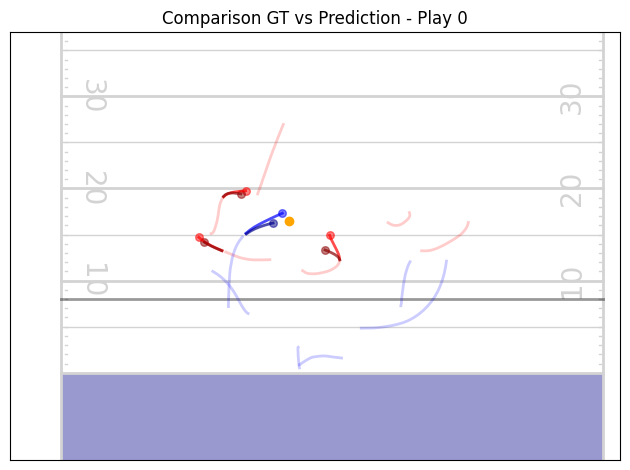

[PRE]   Player 0 mse_loss: 2.479429244995117
[POST]  Player 0 mse_loss: 2.4928784370422363
[PRE]   Player 1 mse_loss: 7.0587992668151855
[POST]  Player 1 mse_loss: 7.017598628997803
[PRE]   Player 2 mse_loss: 6.958757400512695
[POST]  Player 2 mse_loss: 6.866517543792725
[PRE]   Player 3 mse_loss: 2.0083606243133545
[POST]  Player 3 mse_loss: 1.9945948123931885
[PRE]   Player 9 mse_loss: 0.046235352754592896
[POST]  Player 9 mse_loss: 0.048456162214279175


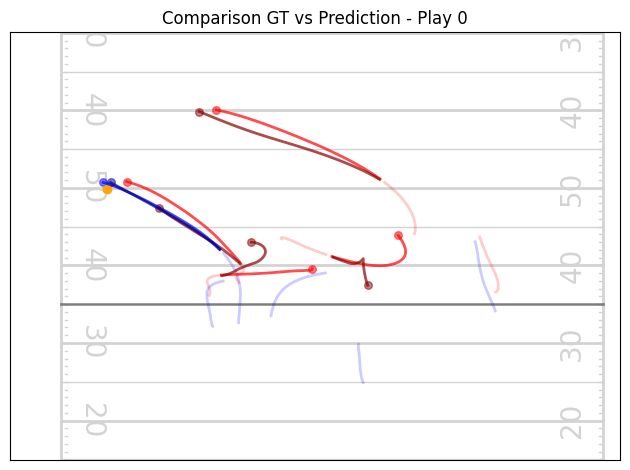

[PRE]   Player 0 mse_loss: 0.1273810714483261
[POST]  Player 0 mse_loss: 0.12096123397350311
[PRE]   Player 3 mse_loss: 0.0875362977385521
[POST]  Player 3 mse_loss: 0.10005971044301987
[PRE]   Player 4 mse_loss: 0.05180177092552185
[POST]  Player 4 mse_loss: 0.056060075759887695
[PRE]   Player 5 mse_loss: 0.4000953733921051
[POST]  Player 5 mse_loss: 0.4321371614933014
[PRE]   Player 11 mse_loss: 0.13617512583732605
[POST]  Player 11 mse_loss: 0.15358884632587433


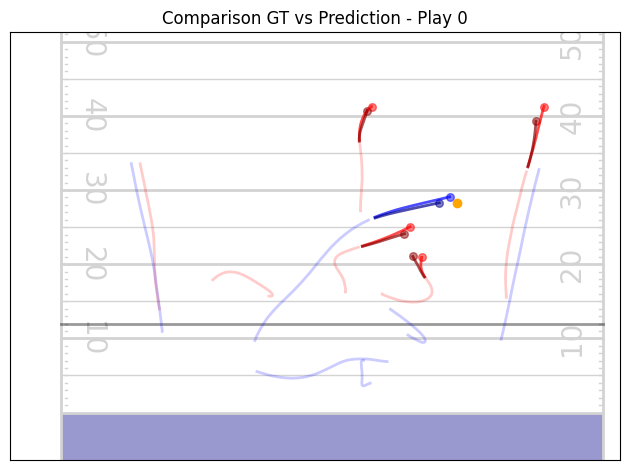

[PRE]   Player 5 mse_loss: 0.011117455549538136
[POST]  Player 5 mse_loss: 0.014319919049739838
[PRE]   Player 6 mse_loss: 0.1780707836151123
[POST]  Player 6 mse_loss: 0.22689713537693024
[PRE]   Player 12 mse_loss: 0.18307259678840637
[POST]  Player 12 mse_loss: 0.21996469795703888


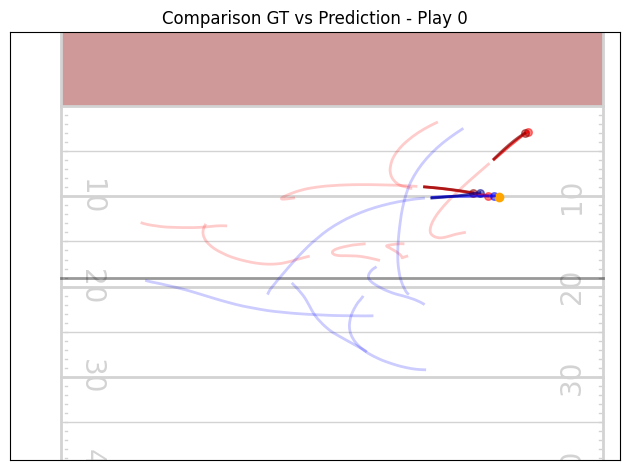

[PRE]   Player 3 mse_loss: 0.06418729573488235
[POST]  Player 3 mse_loss: 0.07863976806402206
[PRE]   Player 4 mse_loss: 0.061215393245220184
[POST]  Player 4 mse_loss: 0.038365911692380905
[PRE]   Player 12 mse_loss: 0.19466596841812134
[POST]  Player 12 mse_loss: 0.217569500207901


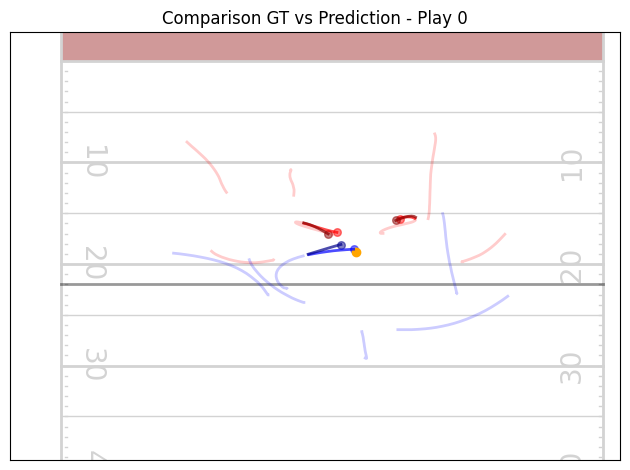

[PRE]   Player 1 mse_loss: 0.11367662250995636
[POST]  Player 1 mse_loss: 0.11970726400613785
[PRE]   Player 12 mse_loss: 0.00358811323530972
[POST]  Player 12 mse_loss: 0.008691071532666683


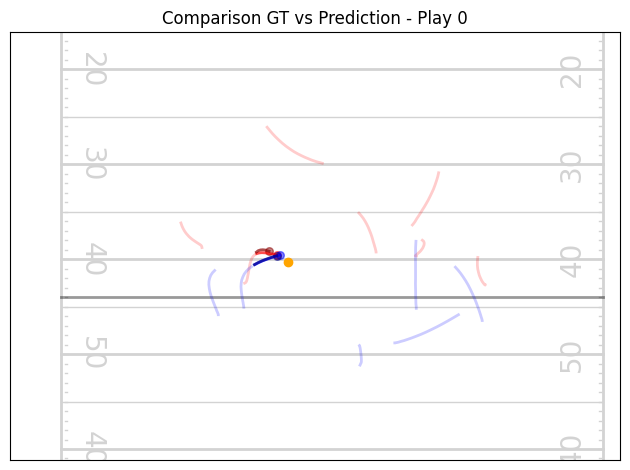

[PRE]   Player 5 mse_loss: 0.3937988579273224
[POST]  Player 5 mse_loss: 0.363801509141922
[PRE]   Player 10 mse_loss: 0.026752673089504242
[POST]  Player 10 mse_loss: 0.02938673458993435


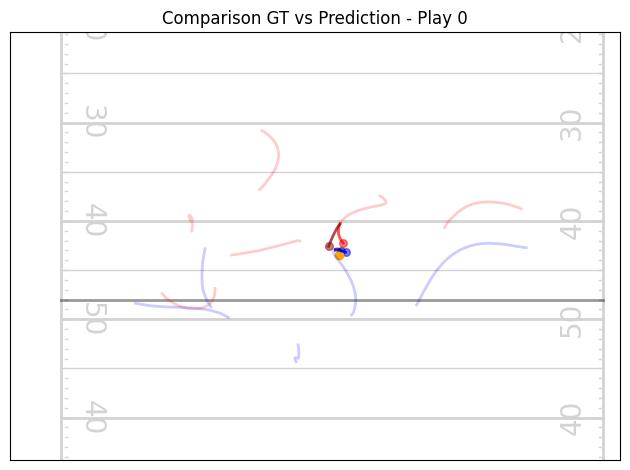

[PRE]   Player 2 mse_loss: 1.6933236122131348
[POST]  Player 2 mse_loss: 1.6750956773757935
[PRE]   Player 5 mse_loss: 1.8528974056243896
[POST]  Player 5 mse_loss: 1.8505009412765503
[PRE]   Player 11 mse_loss: 0.7640970349311829
[POST]  Player 11 mse_loss: 0.7525113224983215


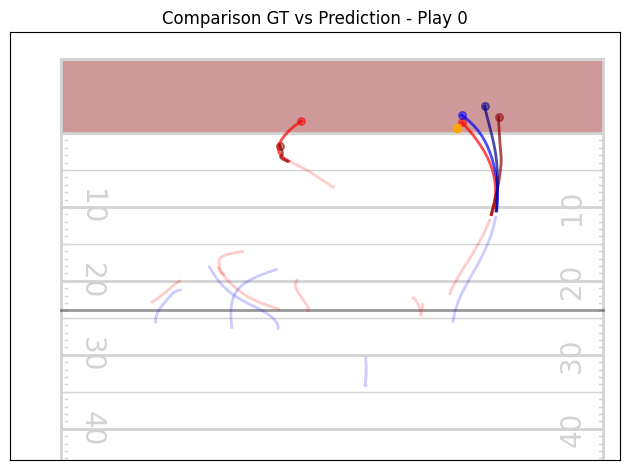

[PRE]   Player 0 mse_loss: 0.13912780582904816
[POST]  Player 0 mse_loss: 0.1419880986213684
[PRE]   Player 1 mse_loss: 0.4010835587978363
[POST]  Player 1 mse_loss: 0.3964318037033081
[PRE]   Player 2 mse_loss: 0.26845139265060425
[POST]  Player 2 mse_loss: 0.2797278165817261
[PRE]   Player 5 mse_loss: 0.20714472234249115
[POST]  Player 5 mse_loss: 0.20214885473251343
[PRE]   Player 11 mse_loss: 0.8715282082557678
[POST]  Player 11 mse_loss: 0.855422854423523


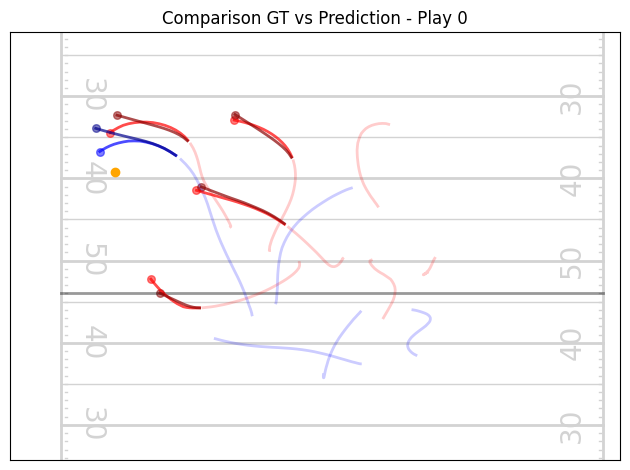

[PRE]   Player 0 mse_loss: 0.08969259262084961
[POST]  Player 0 mse_loss: 0.08381026983261108
[PRE]   Player 6 mse_loss: 0.8127031326293945
[POST]  Player 6 mse_loss: 0.8021411895751953
[PRE]   Player 12 mse_loss: 0.14725270867347717
[POST]  Player 12 mse_loss: 0.17281274497509003


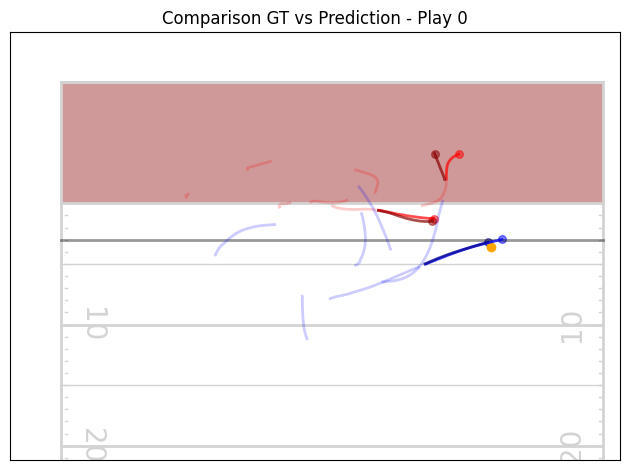

[PRE]   Player 3 mse_loss: 0.19559721648693085
[POST]  Player 3 mse_loss: 0.21394458413124084
[PRE]   Player 4 mse_loss: 0.5279709100723267
[POST]  Player 4 mse_loss: 0.5384734272956848
[PRE]   Player 10 mse_loss: 0.044377584010362625
[POST]  Player 10 mse_loss: 0.05532537028193474


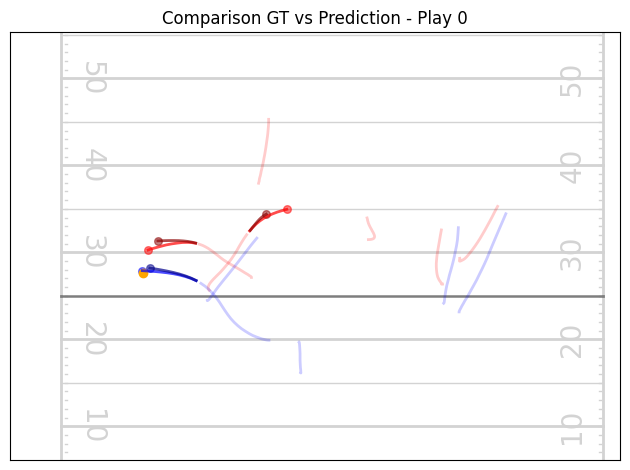

[PRE]   Player 0 mse_loss: 0.06983985751867294
[POST]  Player 0 mse_loss: 0.07798872143030167
[PRE]   Player 1 mse_loss: 0.03501015529036522
[POST]  Player 1 mse_loss: 0.027811629697680473
[PRE]   Player 12 mse_loss: 0.02709440514445305
[POST]  Player 12 mse_loss: 0.039599984884262085


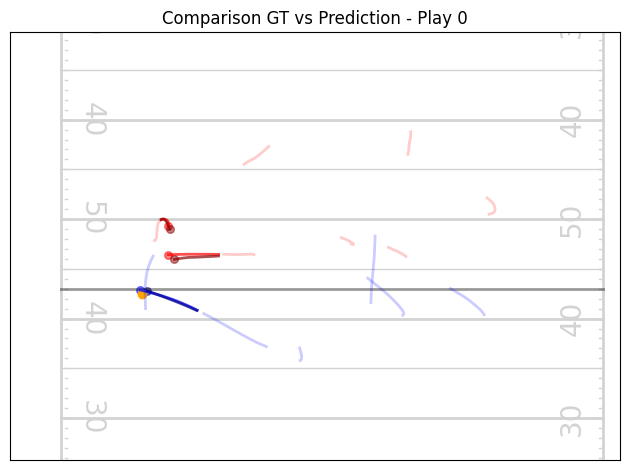

[PRE]   Player 9 mse_loss: 0.10460691899061203
[POST]  Player 9 mse_loss: 0.12362430989742279


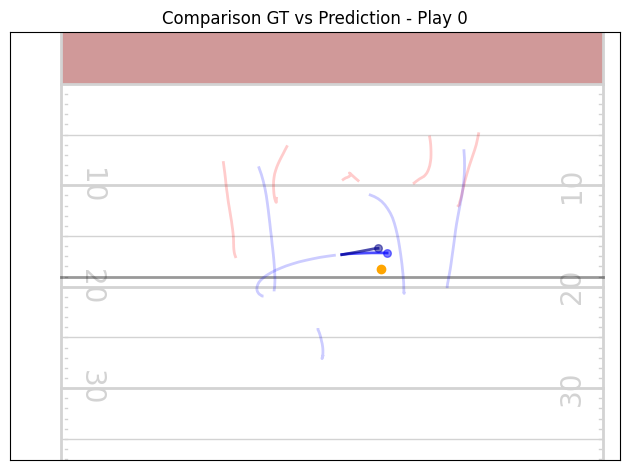

[PRE]   Player 0 mse_loss: 0.06725864112377167
[POST]  Player 0 mse_loss: 0.0694386437535286
[PRE]   Player 1 mse_loss: 0.03607501462101936
[POST]  Player 1 mse_loss: 0.05313640460371971
[PRE]   Player 2 mse_loss: 0.052095506340265274
[POST]  Player 2 mse_loss: 0.06651419401168823
[PRE]   Player 3 mse_loss: 0.03738272935152054
[POST]  Player 3 mse_loss: 0.037754420191049576
[PRE]   Player 5 mse_loss: 0.21876868605613708
[POST]  Player 5 mse_loss: 0.24333158135414124
[PRE]   Player 9 mse_loss: 0.0874650627374649
[POST]  Player 9 mse_loss: 0.10563334077596664


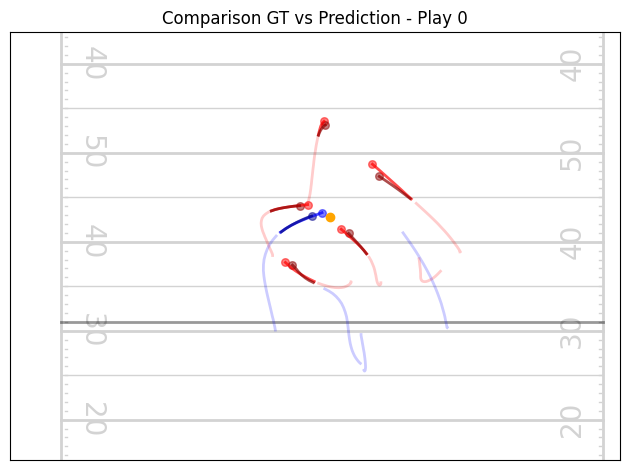

[PRE]   Player 10 mse_loss: 0.07042530179023743
[POST]  Player 10 mse_loss: 0.0791115015745163


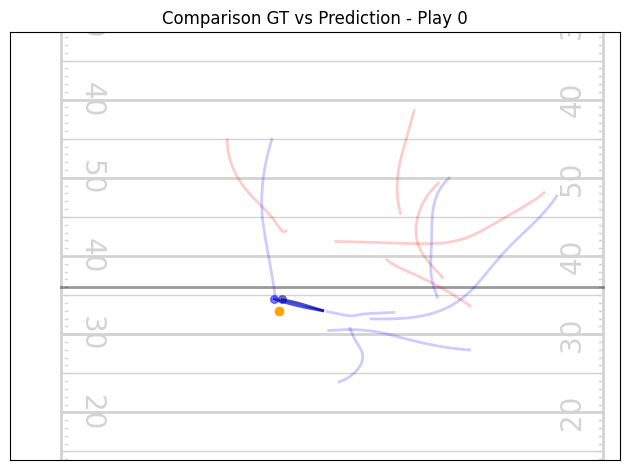

[PRE]   Player 0 mse_loss: 0.503675103187561
[POST]  Player 0 mse_loss: 0.483570396900177
[PRE]   Player 1 mse_loss: 0.4621623158454895
[POST]  Player 1 mse_loss: 0.44833144545555115
[PRE]   Player 2 mse_loss: 0.5851805806159973
[POST]  Player 2 mse_loss: 0.5957837700843811
[PRE]   Player 7 mse_loss: 1.3440604209899902
[POST]  Player 7 mse_loss: 1.3328860998153687
[PRE]   Player 13 mse_loss: 0.6031864285469055
[POST]  Player 13 mse_loss: 0.5956392884254456


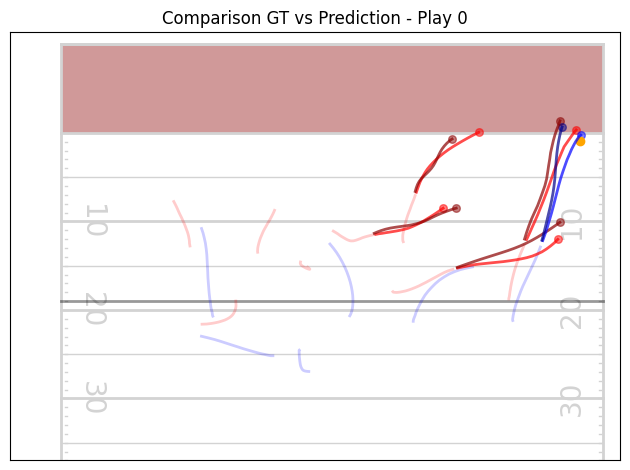

[PRE]   Player 6 mse_loss: 0.06984178721904755
[POST]  Player 6 mse_loss: 0.0720754936337471
[PRE]   Player 12 mse_loss: 0.017973128706216812
[POST]  Player 12 mse_loss: 0.03092755377292633


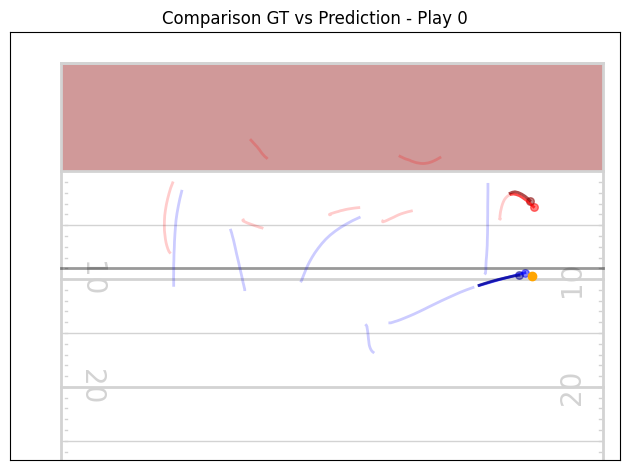

[PRE]   Player 0 mse_loss: 0.43811559677124023
[POST]  Player 0 mse_loss: 0.4244946837425232
[PRE]   Player 4 mse_loss: 0.7240096926689148
[POST]  Player 4 mse_loss: 0.738456666469574
[PRE]   Player 12 mse_loss: 0.20803609490394592
[POST]  Player 12 mse_loss: 0.20345139503479004


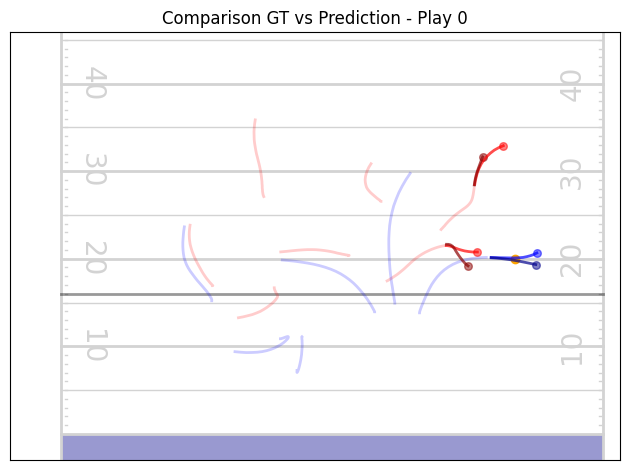

[PRE]   Player 4 mse_loss: 0.08912529796361923
[POST]  Player 4 mse_loss: 0.09180476516485214
[PRE]   Player 10 mse_loss: 0.07882590591907501
[POST]  Player 10 mse_loss: 0.0884762853384018


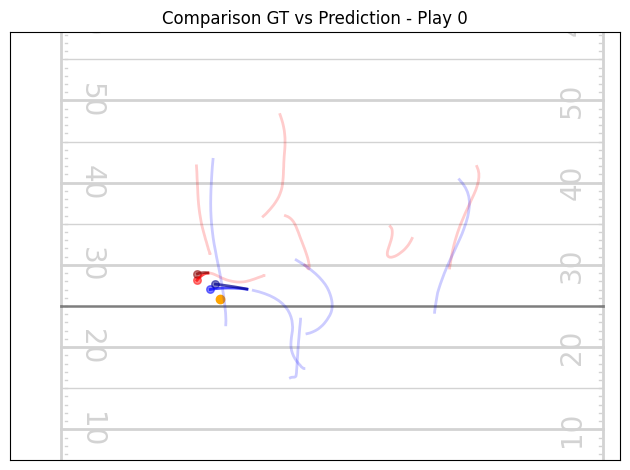

[PRE]   Player 2 mse_loss: 0.06600411981344223
[POST]  Player 2 mse_loss: 0.08216924965381622
[PRE]   Player 11 mse_loss: 0.04869009181857109
[POST]  Player 11 mse_loss: 0.05799943208694458


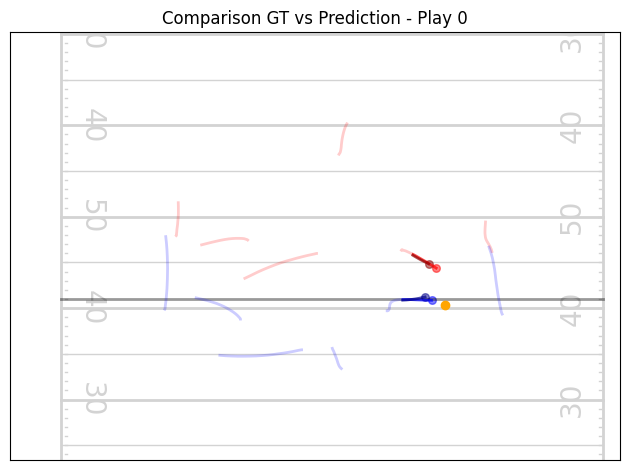

[PRE]   Player 3 mse_loss: 0.31575629115104675
[POST]  Player 3 mse_loss: 0.2840496003627777
[PRE]   Player 6 mse_loss: 0.20501300692558289
[POST]  Player 6 mse_loss: 0.20020300149917603
[PRE]   Player 12 mse_loss: 0.07574145495891571
[POST]  Player 12 mse_loss: 0.07078801095485687


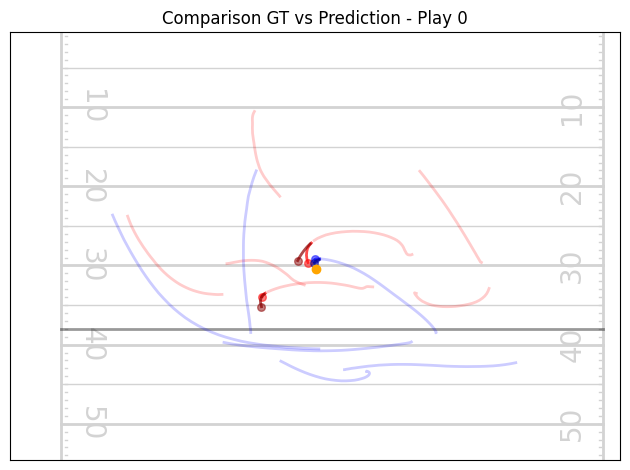

[PRE]   Player 4 mse_loss: 0.39020201563835144
[POST]  Player 4 mse_loss: 0.4128958284854889
[PRE]   Player 5 mse_loss: 1.1174646615982056
[POST]  Player 5 mse_loss: 1.1369563341140747
[PRE]   Player 12 mse_loss: 0.12061075121164322
[POST]  Player 12 mse_loss: 0.13905532658100128


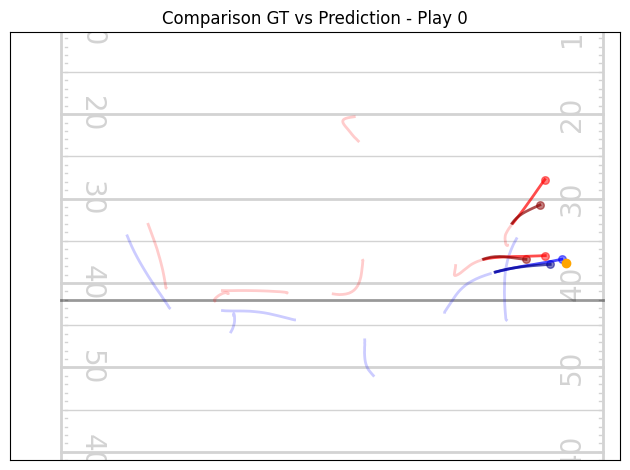

[PRE]   Player 2 mse_loss: 0.46619927883148193
[POST]  Player 2 mse_loss: 0.4785805642604828
[PRE]   Player 3 mse_loss: 2.8095290660858154
[POST]  Player 3 mse_loss: 2.7785680294036865
[PRE]   Player 4 mse_loss: 0.2738529443740845
[POST]  Player 4 mse_loss: 0.29077965021133423
[PRE]   Player 9 mse_loss: 0.25625303387641907
[POST]  Player 9 mse_loss: 0.2663169801235199


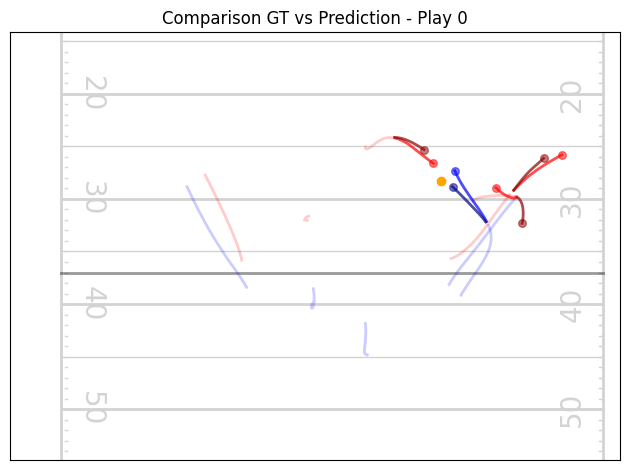

[PRE]   Player 4 mse_loss: 0.21008875966072083
[POST]  Player 4 mse_loss: 0.21924641728401184
[PRE]   Player 10 mse_loss: 0.0481540746986866
[POST]  Player 10 mse_loss: 0.07062364369630814


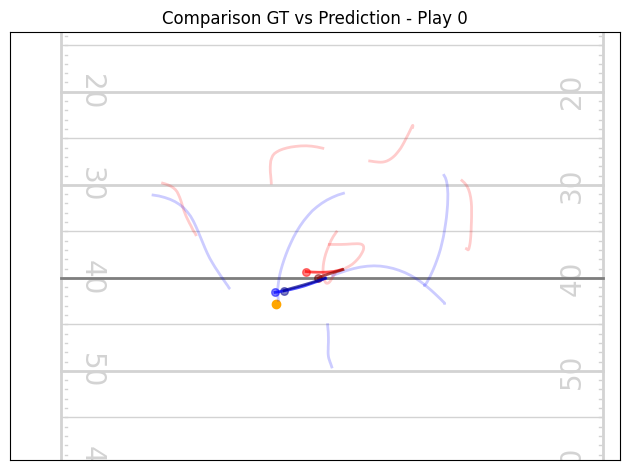

[PRE]   Player 0 mse_loss: 3.4321141242980957
[POST]  Player 0 mse_loss: 3.334866762161255
[PRE]   Player 4 mse_loss: 1.8497059345245361
[POST]  Player 4 mse_loss: 1.8818901777267456
[PRE]   Player 7 mse_loss: 1.0761381387710571
[POST]  Player 7 mse_loss: 1.0903319120407104
[PRE]   Player 12 mse_loss: 1.523179054260254
[POST]  Player 12 mse_loss: 1.5234941244125366


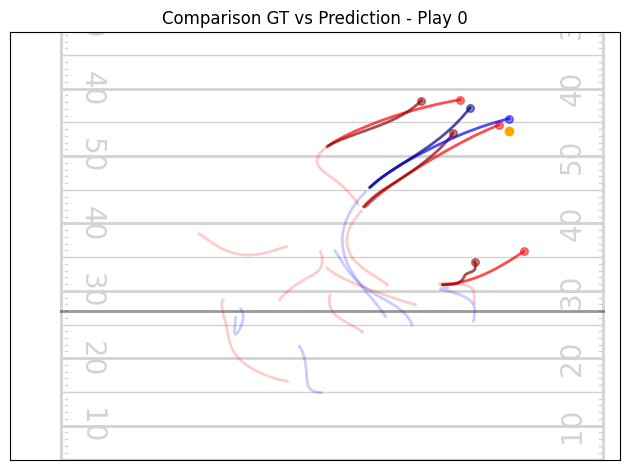

[PRE]   Player 12 mse_loss: 0.23536093533039093
[POST]  Player 12 mse_loss: 0.21261827647686005


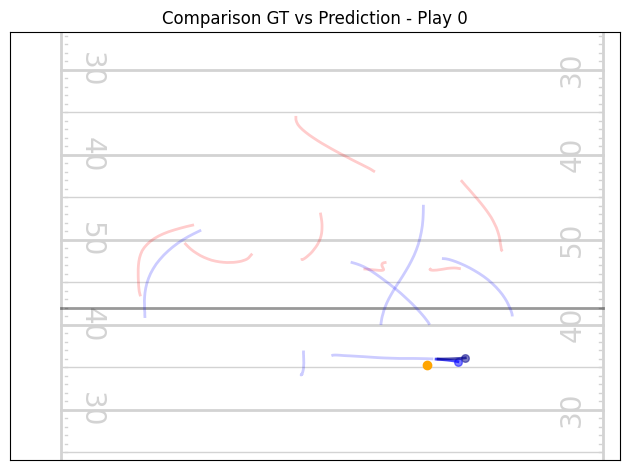

[PRE]   Player 1 mse_loss: 0.031764913350343704
[POST]  Player 1 mse_loss: 0.03190762922167778
[PRE]   Player 3 mse_loss: 1.013001561164856
[POST]  Player 3 mse_loss: 0.956321120262146
[PRE]   Player 5 mse_loss: 0.3423970341682434
[POST]  Player 5 mse_loss: 0.35700470209121704
[PRE]   Player 6 mse_loss: 1.153975248336792
[POST]  Player 6 mse_loss: 1.1746906042099
[PRE]   Player 11 mse_loss: 0.1074235811829567
[POST]  Player 11 mse_loss: 0.1190296858549118


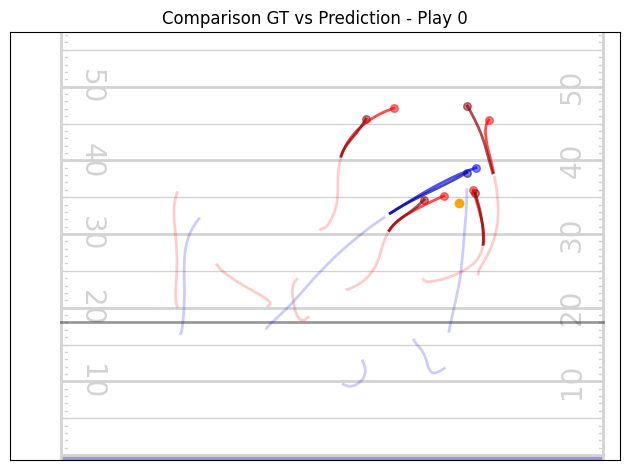

[PRE]   Player 0 mse_loss: 0.08304183185100555
[POST]  Player 0 mse_loss: 0.06585798412561417
[PRE]   Player 1 mse_loss: 0.12513765692710876
[POST]  Player 1 mse_loss: 0.1259736269712448
[PRE]   Player 12 mse_loss: 0.11355141550302505
[POST]  Player 12 mse_loss: 0.10956495255231857


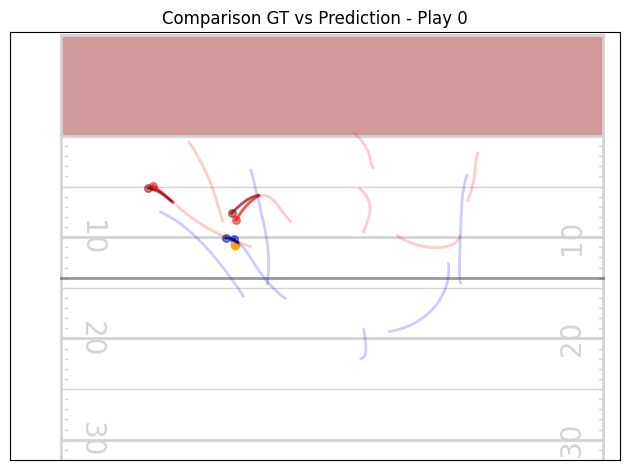

[PRE]   Player 2 mse_loss: 1.6871052980422974
[POST]  Player 2 mse_loss: 1.6835105419158936
[PRE]   Player 4 mse_loss: 0.3623938262462616
[POST]  Player 4 mse_loss: 0.36706140637397766
[PRE]   Player 6 mse_loss: 1.3756310939788818
[POST]  Player 6 mse_loss: 1.3765796422958374
[PRE]   Player 12 mse_loss: 0.18841977417469025
[POST]  Player 12 mse_loss: 0.19050976634025574


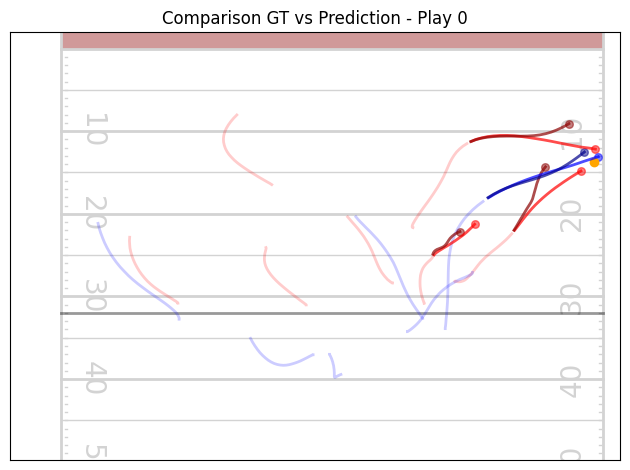

[PRE]   Player 0 mse_loss: 0.15493255853652954
[POST]  Player 0 mse_loss: 0.13830530643463135
[PRE]   Player 4 mse_loss: 1.225218415260315
[POST]  Player 4 mse_loss: 1.2247709035873413
[PRE]   Player 6 mse_loss: 1.8724424839019775
[POST]  Player 6 mse_loss: 1.8719099760055542
[PRE]   Player 12 mse_loss: 0.670531153678894
[POST]  Player 12 mse_loss: 0.6731258034706116


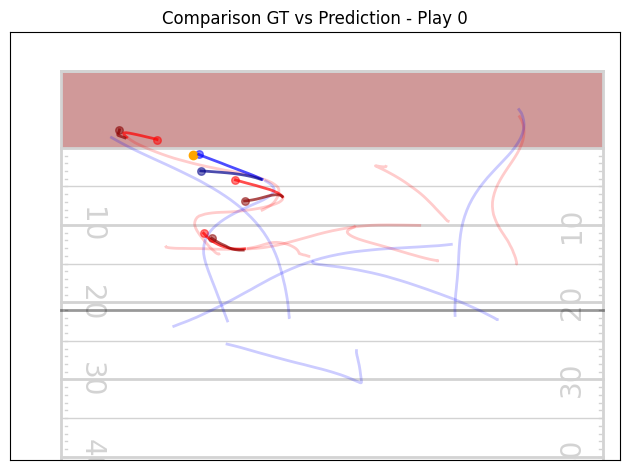

[PRE]   Player 1 mse_loss: 0.5369681715965271
[POST]  Player 1 mse_loss: 0.5519387125968933
[PRE]   Player 3 mse_loss: 0.1187722235918045
[POST]  Player 3 mse_loss: 0.13155308365821838
[PRE]   Player 4 mse_loss: 0.11584021151065826
[POST]  Player 4 mse_loss: 0.1225154921412468
[PRE]   Player 5 mse_loss: 0.3463524281978607
[POST]  Player 5 mse_loss: 0.3516770303249359
[PRE]   Player 10 mse_loss: 0.06577878445386887
[POST]  Player 10 mse_loss: 0.07942447811365128


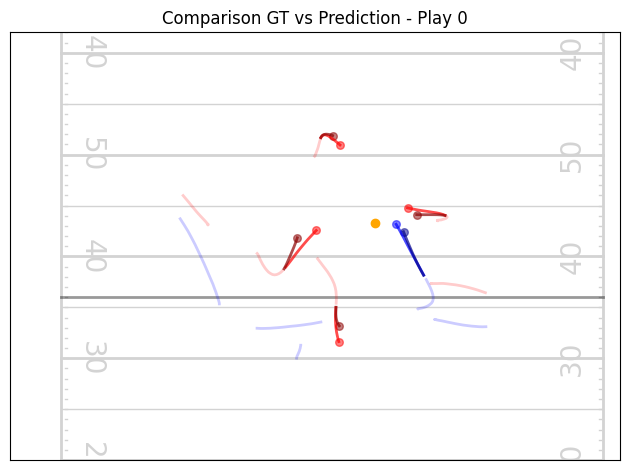

[PRE]   Player 12 mse_loss: 0.2117554396390915
[POST]  Player 12 mse_loss: 0.22466866672039032


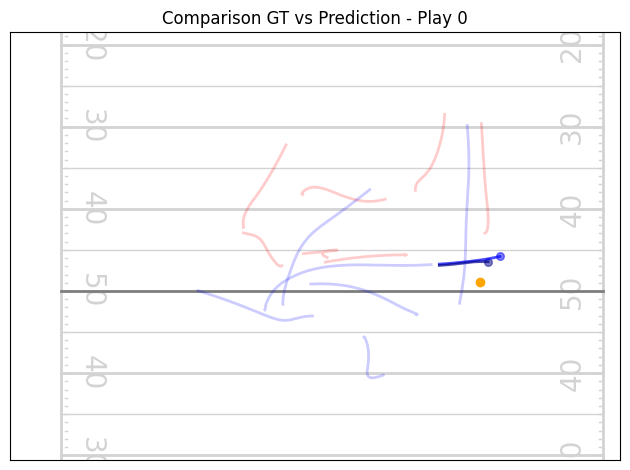

[PRE]   Player 1 mse_loss: 0.23108789324760437
[POST]  Player 1 mse_loss: 0.2460855394601822
[PRE]   Player 2 mse_loss: 0.04474572837352753
[POST]  Player 2 mse_loss: 0.04647284001111984
[PRE]   Player 12 mse_loss: 0.4366818070411682
[POST]  Player 12 mse_loss: 0.4547652304172516


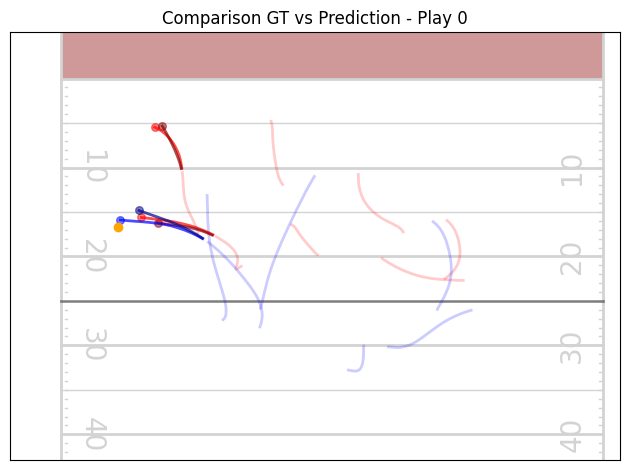

[PRE]   Player 1 mse_loss: 2.2506263256073
[POST]  Player 1 mse_loss: 2.228943347930908
[PRE]   Player 3 mse_loss: 3.2193164825439453
[POST]  Player 3 mse_loss: 3.2463808059692383
[PRE]   Player 4 mse_loss: 6.548282623291016
[POST]  Player 4 mse_loss: 6.539327144622803
[PRE]   Player 10 mse_loss: 0.12062234431505203
[POST]  Player 10 mse_loss: 0.132821187376976


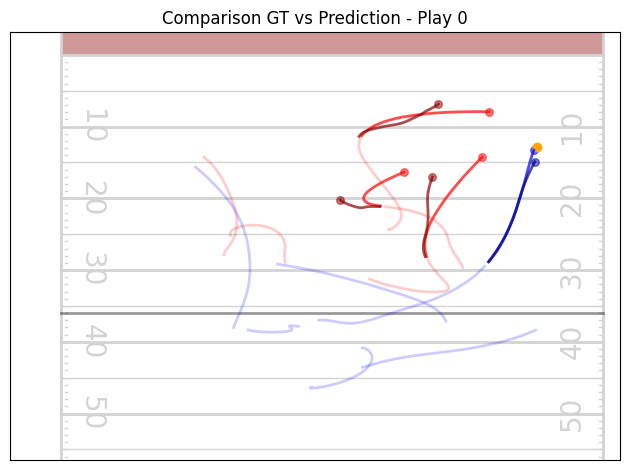

[PRE]   Player 12 mse_loss: 0.045118849724531174
[POST]  Player 12 mse_loss: 0.055072054266929626


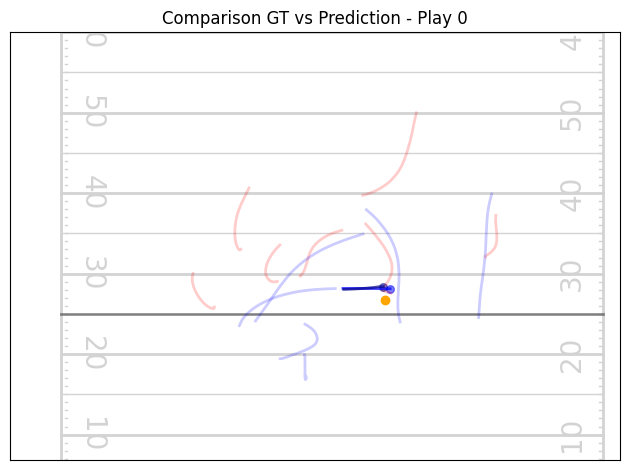

[PRE]   Player 1 mse_loss: 0.03708517178893089
[POST]  Player 1 mse_loss: 0.028405919671058655
[PRE]   Player 4 mse_loss: 0.051012858748435974
[POST]  Player 4 mse_loss: 0.050446461886167526
[PRE]   Player 6 mse_loss: 0.0019445347134023905
[POST]  Player 6 mse_loss: 0.0022840932942926884
[PRE]   Player 12 mse_loss: 0.06245945766568184
[POST]  Player 12 mse_loss: 0.05928315222263336


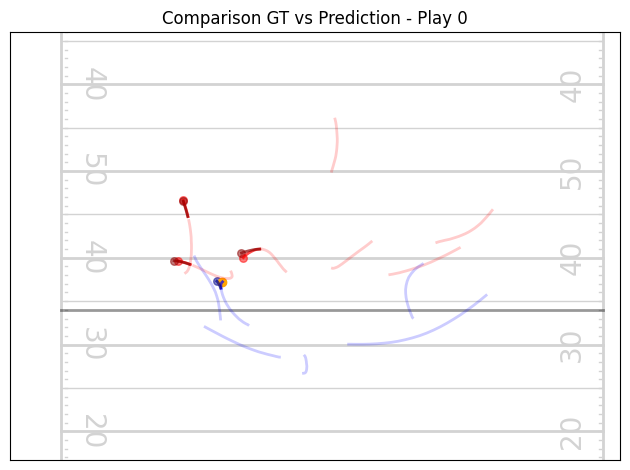

[PRE]   Player 5 mse_loss: 0.058778900653123856
[POST]  Player 5 mse_loss: 0.03758477047085762
[PRE]   Player 6 mse_loss: 0.16029399633407593
[POST]  Player 6 mse_loss: 0.15510304272174835
[PRE]   Player 12 mse_loss: 0.007783178705722094
[POST]  Player 12 mse_loss: 0.010037797503173351


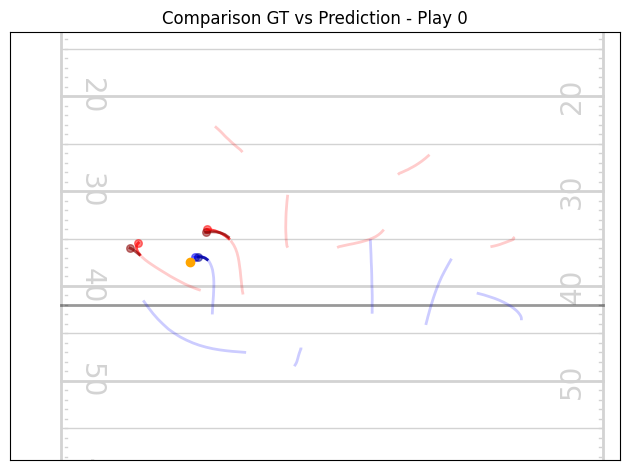

[PRE]   Player 0 mse_loss: 0.015685155987739563
[POST]  Player 0 mse_loss: 0.017998507246375084
[PRE]   Player 1 mse_loss: 0.09804603457450867
[POST]  Player 1 mse_loss: 0.10124585777521133
[PRE]   Player 12 mse_loss: 0.01730743981897831
[POST]  Player 12 mse_loss: 0.015862060710787773


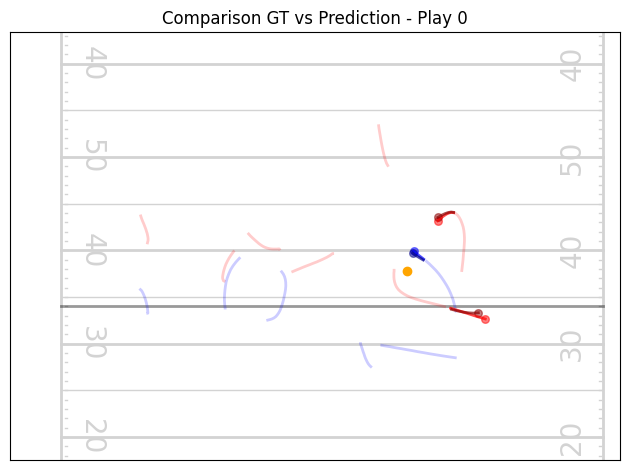

[PRE]   Player 1 mse_loss: 0.013327497988939285
[POST]  Player 1 mse_loss: 0.01006305031478405
[PRE]   Player 2 mse_loss: 0.020001431927084923
[POST]  Player 2 mse_loss: 0.0236348919570446
[PRE]   Player 12 mse_loss: 0.020220955833792686
[POST]  Player 12 mse_loss: 0.025674698874354362


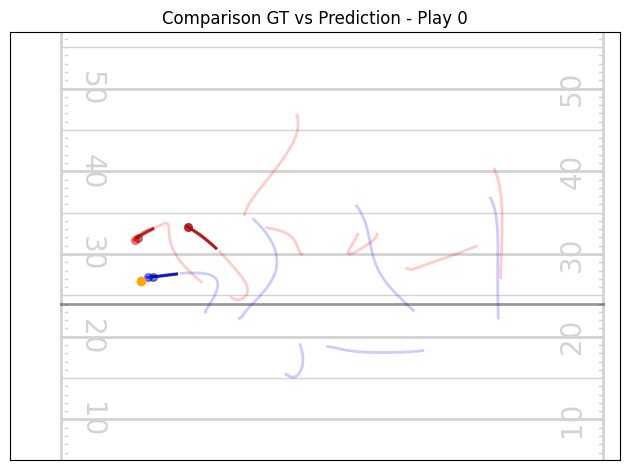

[PRE]   Player 0 mse_loss: 0.11690127104520798
[POST]  Player 0 mse_loss: 0.11226358264684677
[PRE]   Player 12 mse_loss: 0.5713379979133606
[POST]  Player 12 mse_loss: 0.5381132960319519


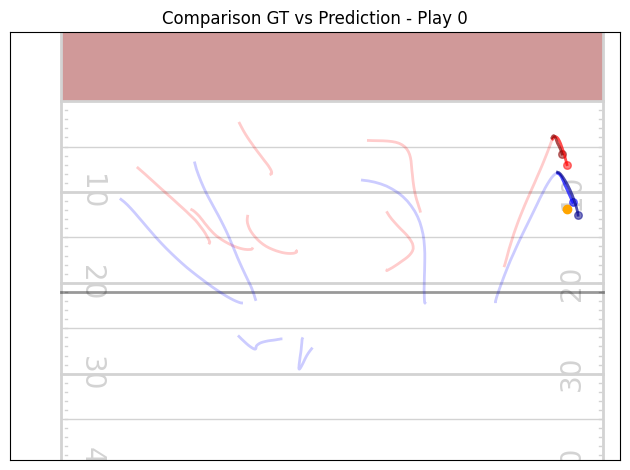

[PRE]   Player 1 mse_loss: 0.3106963634490967
[POST]  Player 1 mse_loss: 0.3253288269042969
[PRE]   Player 3 mse_loss: 0.5157868266105652
[POST]  Player 3 mse_loss: 0.5332242846488953
[PRE]   Player 4 mse_loss: 0.07844547182321548
[POST]  Player 4 mse_loss: 0.08569147437810898
[PRE]   Player 6 mse_loss: 0.14527057111263275
[POST]  Player 6 mse_loss: 0.16056957840919495
[PRE]   Player 12 mse_loss: 0.025569917634129524
[POST]  Player 12 mse_loss: 0.0297783762216568


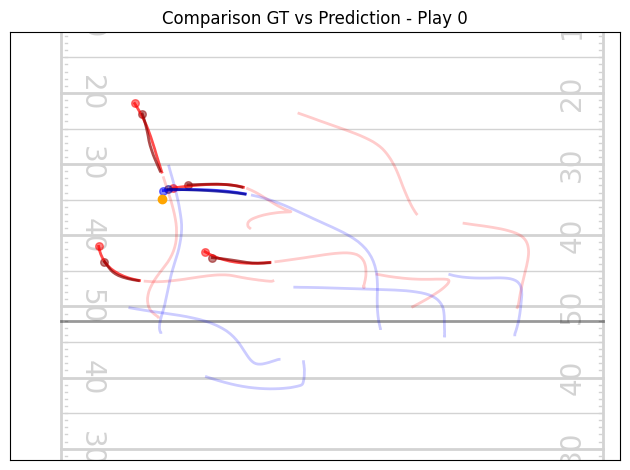

[PRE]   Player 4 mse_loss: 0.030668113380670547
[POST]  Player 4 mse_loss: 0.03899175673723221
[PRE]   Player 12 mse_loss: 0.07920018583536148
[POST]  Player 12 mse_loss: 0.09136209636926651


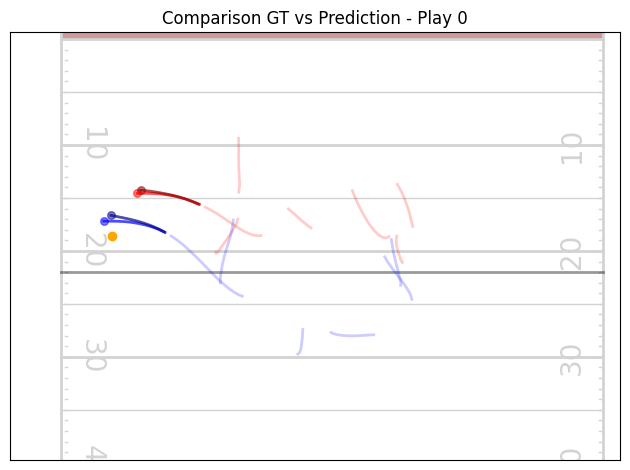

[PRE]   Player 4 mse_loss: 0.0887514278292656
[POST]  Player 4 mse_loss: 0.09863367676734924
[PRE]   Player 12 mse_loss: 0.12120236456394196
[POST]  Player 12 mse_loss: 0.11910511553287506


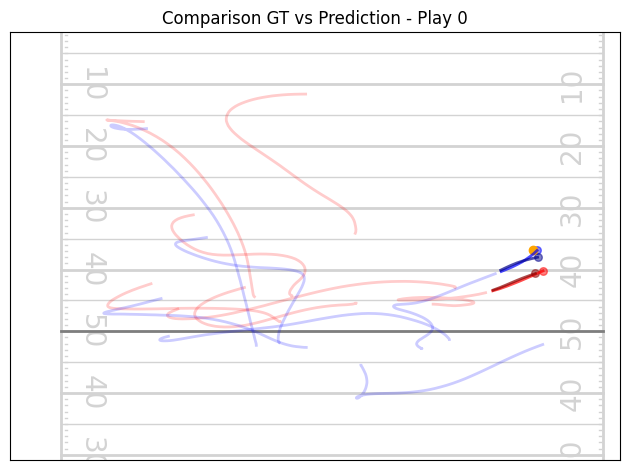

[PRE]   Player 4 mse_loss: 0.047284841537475586
[POST]  Player 4 mse_loss: 0.06560949981212616
[PRE]   Player 11 mse_loss: 0.029473332688212395
[POST]  Player 11 mse_loss: 0.0451178140938282


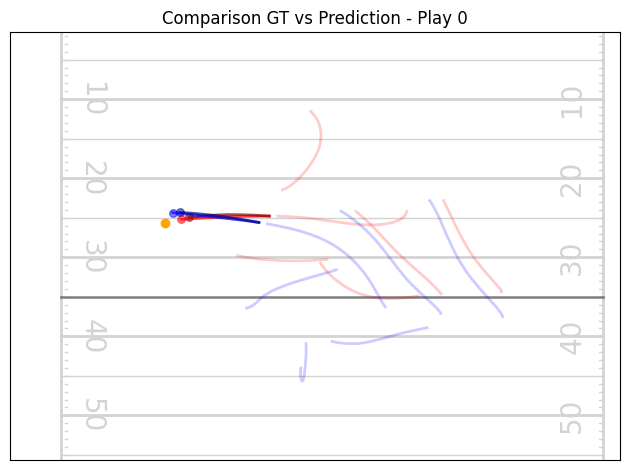

[PRE]   Player 5 mse_loss: 0.04529349133372307
[POST]  Player 5 mse_loss: 0.05363190174102783
[PRE]   Player 11 mse_loss: 0.012946623377501965
[POST]  Player 11 mse_loss: 0.014582343399524689


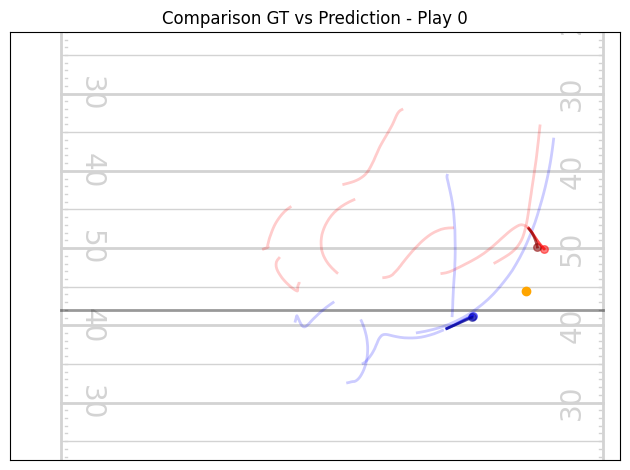

[PRE]   Player 0 mse_loss: 2.168177604675293
[POST]  Player 0 mse_loss: 1.5935167074203491
[PRE]   Player 1 mse_loss: 16.708782196044922
[POST]  Player 1 mse_loss: 16.684452056884766
[PRE]   Player 3 mse_loss: 5.026800155639648
[POST]  Player 3 mse_loss: 5.018993854522705
[PRE]   Player 4 mse_loss: 1.280755877494812
[POST]  Player 4 mse_loss: 1.2941628694534302
[PRE]   Player 6 mse_loss: 3.5474789142608643
[POST]  Player 6 mse_loss: 3.507659912109375
[PRE]   Player 10 mse_loss: 1.5139415264129639
[POST]  Player 10 mse_loss: 1.50076162815094


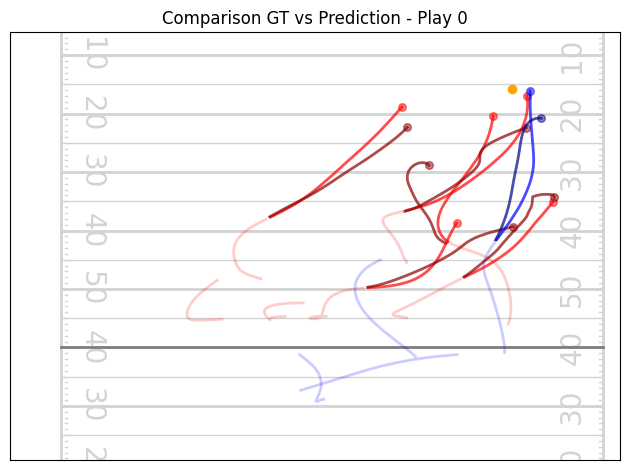

[PRE]   Player 0 mse_loss: 0.02406420186161995
[POST]  Player 0 mse_loss: 0.017894092947244644
[PRE]   Player 3 mse_loss: 0.06748174875974655
[POST]  Player 3 mse_loss: 0.06056986004114151
[PRE]   Player 4 mse_loss: 0.6495099067687988
[POST]  Player 4 mse_loss: 0.6428007483482361
[PRE]   Player 6 mse_loss: 0.17453086376190186
[POST]  Player 6 mse_loss: 0.18394434452056885
[PRE]   Player 10 mse_loss: 0.1368563324213028
[POST]  Player 10 mse_loss: 0.1255919635295868


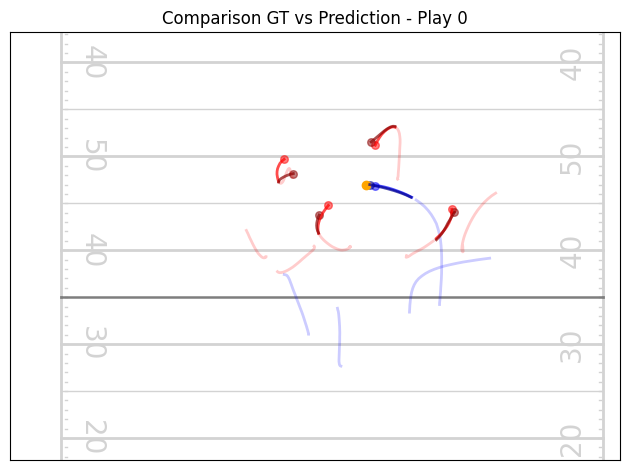

[PRE]   Player 2 mse_loss: 2.721949577331543
[POST]  Player 2 mse_loss: 2.634166955947876
[PRE]   Player 11 mse_loss: 0.5848732590675354
[POST]  Player 11 mse_loss: 0.5744930505752563


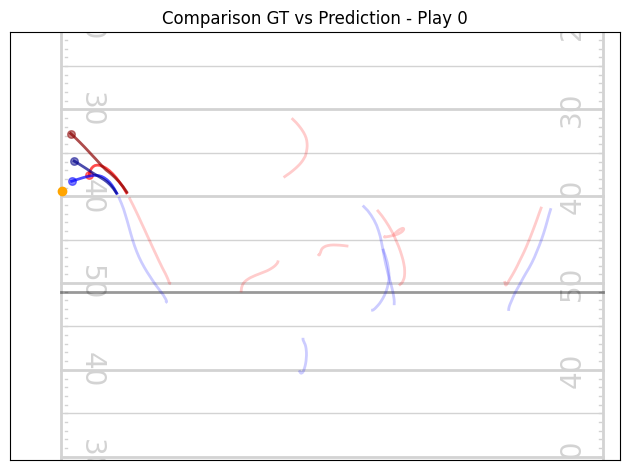

[PRE]   Player 0 mse_loss: 0.150090754032135
[POST]  Player 0 mse_loss: 0.13684512674808502
[PRE]   Player 2 mse_loss: 1.5301156044006348
[POST]  Player 2 mse_loss: 1.5346201658248901
[PRE]   Player 4 mse_loss: 0.5865656733512878
[POST]  Player 4 mse_loss: 0.5864943265914917
[PRE]   Player 5 mse_loss: 2.874652624130249
[POST]  Player 5 mse_loss: 2.8603551387786865
[PRE]   Player 6 mse_loss: 1.001510739326477
[POST]  Player 6 mse_loss: 1.0014199018478394
[PRE]   Player 12 mse_loss: 0.2637346386909485
[POST]  Player 12 mse_loss: 0.25528696179389954


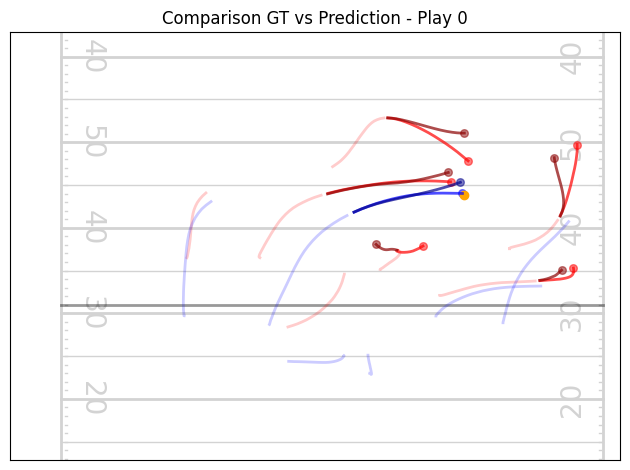

[PRE]   Player 1 mse_loss: 1.5197327136993408
[POST]  Player 1 mse_loss: 1.494267225265503
[PRE]   Player 10 mse_loss: 0.20922234654426575
[POST]  Player 10 mse_loss: 0.20644402503967285


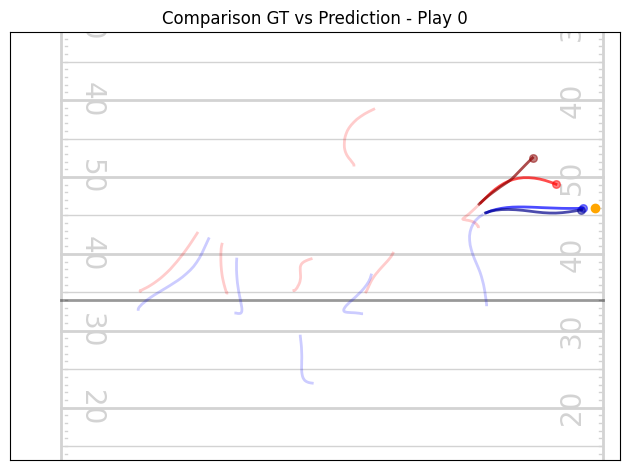

[PRE]   Player 1 mse_loss: 0.5245203375816345
[POST]  Player 1 mse_loss: 0.5331160426139832
[PRE]   Player 2 mse_loss: 0.2911175787448883
[POST]  Player 2 mse_loss: 0.29046833515167236
[PRE]   Player 12 mse_loss: 0.04369929060339928
[POST]  Player 12 mse_loss: 0.041828591376543045


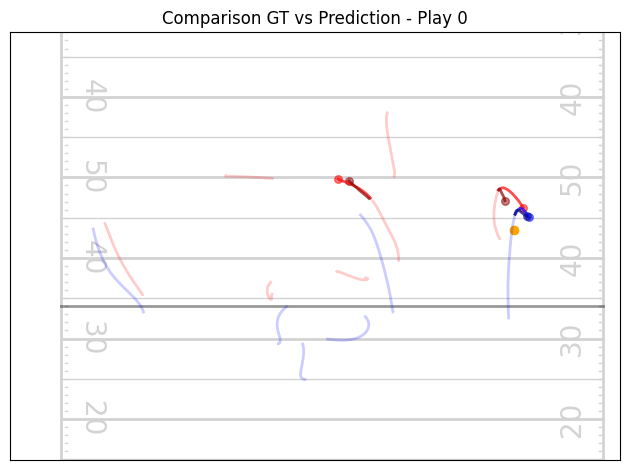

[PRE]   Player 0 mse_loss: 0.07277629524469376
[POST]  Player 0 mse_loss: 0.0639190822839737
[PRE]   Player 5 mse_loss: 0.8307887315750122
[POST]  Player 5 mse_loss: 0.8033941388130188
[PRE]   Player 10 mse_loss: 0.37040746212005615
[POST]  Player 10 mse_loss: 0.36556243896484375


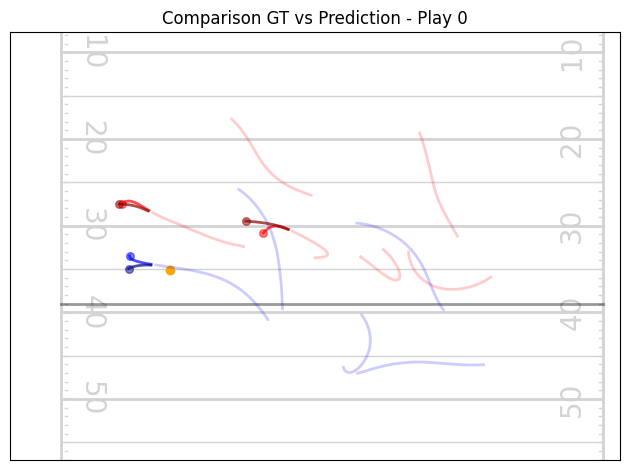

[PRE]   Player 3 mse_loss: 0.829089879989624
[POST]  Player 3 mse_loss: 0.8126022219657898
[PRE]   Player 4 mse_loss: 1.0324654579162598
[POST]  Player 4 mse_loss: 1.0308823585510254
[PRE]   Player 11 mse_loss: 1.1093405485153198
[POST]  Player 11 mse_loss: 1.09995698928833


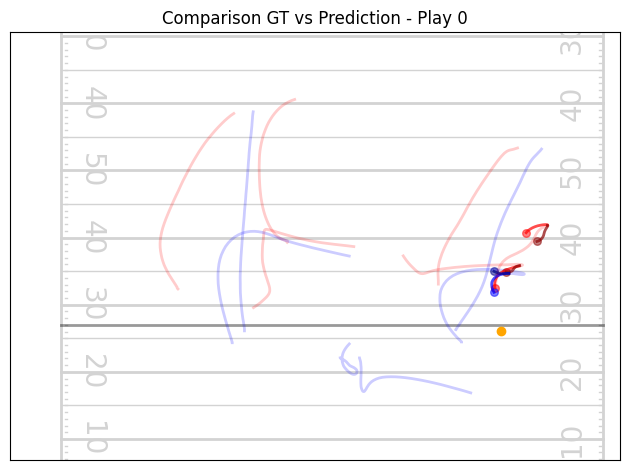

[PRE]   Player 1 mse_loss: 0.024294227361679077
[POST]  Player 1 mse_loss: 0.03705846518278122
[PRE]   Player 2 mse_loss: 0.09448888897895813
[POST]  Player 2 mse_loss: 0.09091997891664505
[PRE]   Player 9 mse_loss: 0.09012648463249207
[POST]  Player 9 mse_loss: 0.1148538812994957


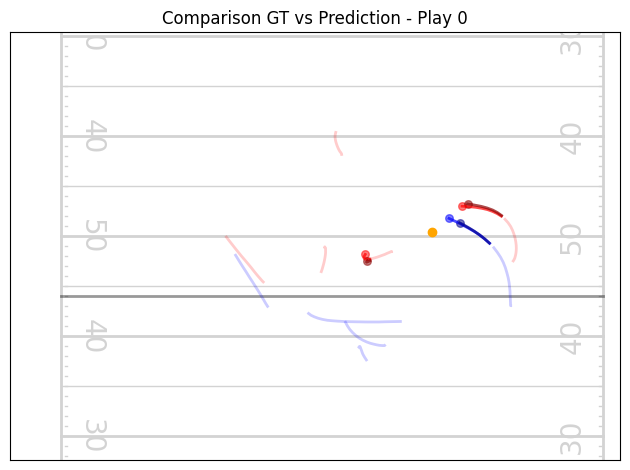

[PRE]   Player 1 mse_loss: 0.45563268661499023
[POST]  Player 1 mse_loss: 0.44299525022506714
[PRE]   Player 2 mse_loss: 1.0492616891860962
[POST]  Player 2 mse_loss: 1.0784233808517456
[PRE]   Player 5 mse_loss: 1.2064036130905151
[POST]  Player 5 mse_loss: 1.2221122980117798
[PRE]   Player 12 mse_loss: 0.40047183632850647
[POST]  Player 12 mse_loss: 0.4164712429046631


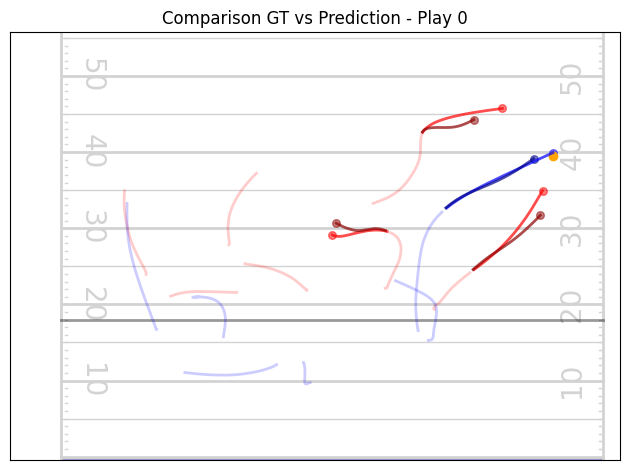

[PRE]   Player 3 mse_loss: 0.12110617011785507
[POST]  Player 3 mse_loss: 0.10885210335254669
[PRE]   Player 4 mse_loss: 0.33572250604629517
[POST]  Player 4 mse_loss: 0.3530578911304474
[PRE]   Player 6 mse_loss: 0.06903152912855148
[POST]  Player 6 mse_loss: 0.08615267276763916
[PRE]   Player 12 mse_loss: 0.05306721478700638
[POST]  Player 12 mse_loss: 0.06283280998468399


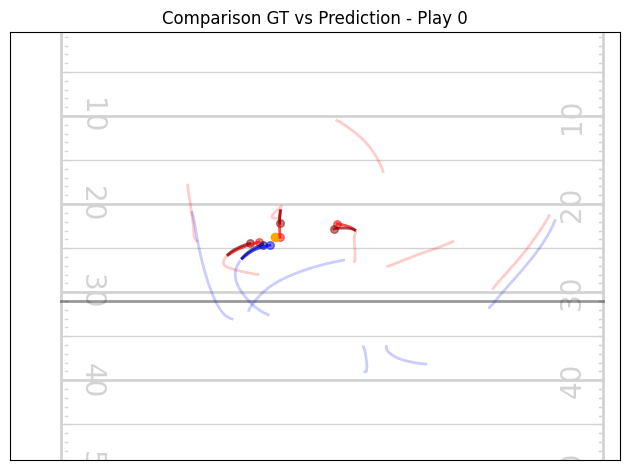

[PRE]   Player 1 mse_loss: 0.11309804767370224
[POST]  Player 1 mse_loss: 0.08435746282339096
[PRE]   Player 3 mse_loss: 0.05023223161697388
[POST]  Player 3 mse_loss: 0.05705515295267105
[PRE]   Player 7 mse_loss: 0.04425801336765289
[POST]  Player 7 mse_loss: 0.04177944362163544
[PRE]   Player 13 mse_loss: 0.07463288307189941
[POST]  Player 13 mse_loss: 0.07761789858341217


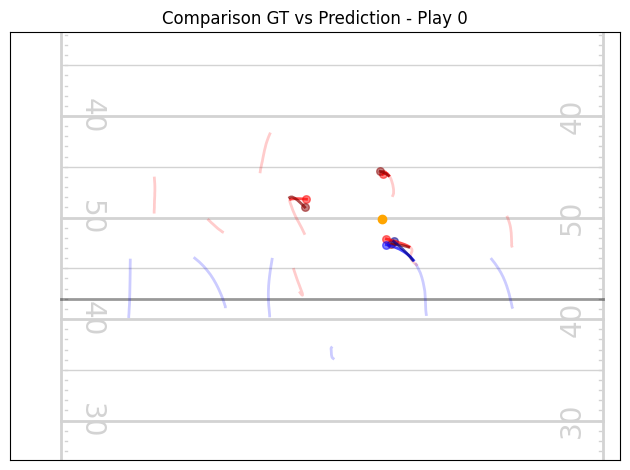

[PRE]   Player 5 mse_loss: 0.06269803643226624
[POST]  Player 5 mse_loss: 0.05170891806483269
[PRE]   Player 12 mse_loss: 0.12337228655815125
[POST]  Player 12 mse_loss: 0.11559836566448212


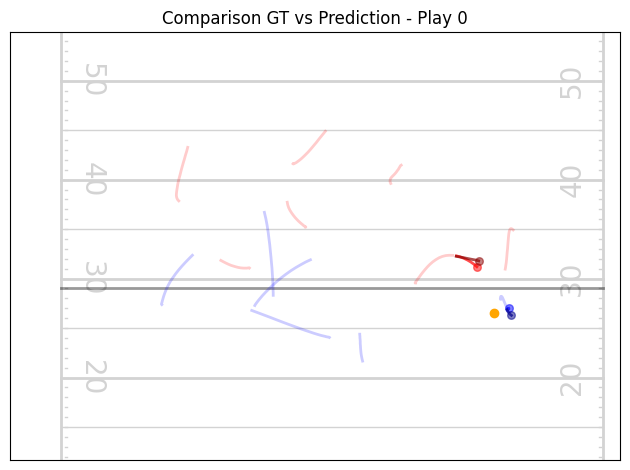

[PRE]   Player 1 mse_loss: 0.03251313045620918
[POST]  Player 1 mse_loss: 0.023253442719578743
[PRE]   Player 12 mse_loss: 0.27873438596725464
[POST]  Player 12 mse_loss: 0.2620650827884674


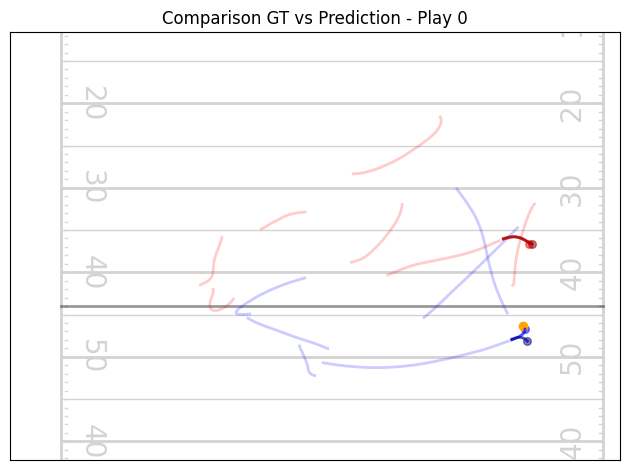

[PRE]   Player 6 mse_loss: 2.393768787384033
[POST]  Player 6 mse_loss: 2.371273994445801
[PRE]   Player 11 mse_loss: 0.14619916677474976
[POST]  Player 11 mse_loss: 0.1451931595802307


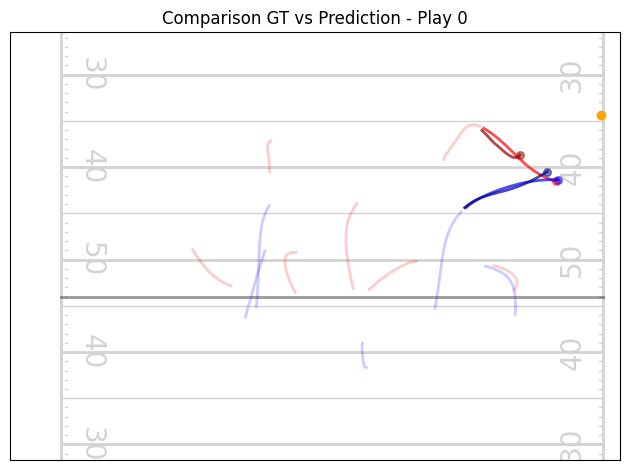

[PRE]   Player 3 mse_loss: 0.01236712746322155
[POST]  Player 3 mse_loss: 0.011959962546825409
[PRE]   Player 4 mse_loss: 0.37055814266204834
[POST]  Player 4 mse_loss: 0.34117943048477173
[PRE]   Player 10 mse_loss: 0.04218830540776253
[POST]  Player 10 mse_loss: 0.03582794964313507


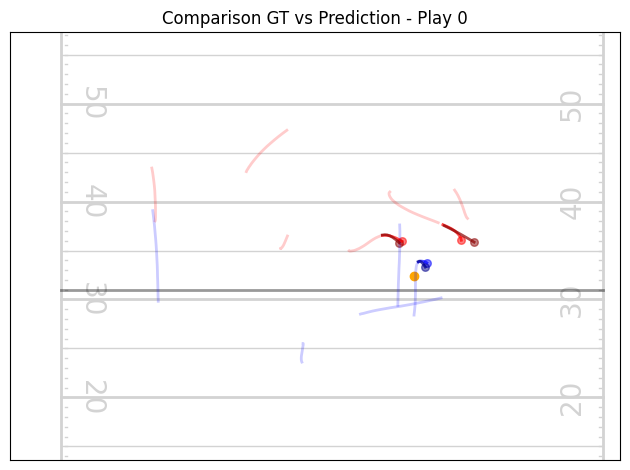

[PRE]   Player 6 mse_loss: 0.021355709061026573
[POST]  Player 6 mse_loss: 0.014915376901626587
[PRE]   Player 12 mse_loss: 0.749435305595398
[POST]  Player 12 mse_loss: 0.7364927530288696


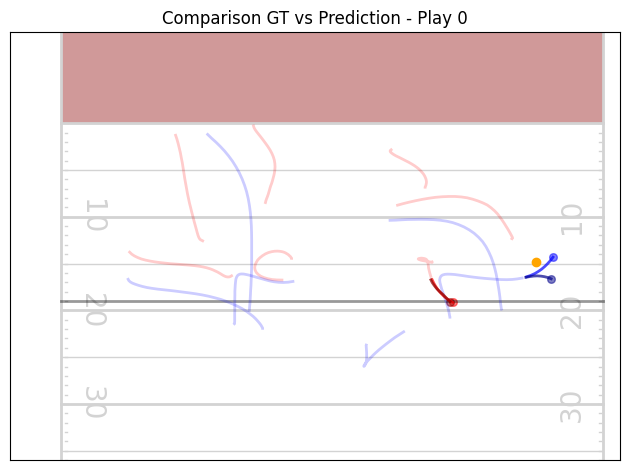

In [75]:
batch_iter= iter(test_loader)

for j in range(len(test_loader)):
    batch = next(batch_iter)

    y = batch["y"].to(device)
    preds = model(gnn_test_batch_list[j].to(device))

    for i in range(y.shape[0]):
        visualize_comparison(batch["x_nodes"],
                             batch["input_mask"],
                             y,
                             preds,
                             batch["output_mask"],
                             batch["x_global"][i, 2],
                             batch["x_global"][i, 5:7],
                             batch_idx= i)

## 9.3 Play Visualizations

## 9.1 Play Visualization with Direction Scaled by Speed and Acceleration

In [76]:
def visualize_play_with_direction_scaled(game_id, play_id):

    example_play, output_example_play = get_play(game_id, play_id)

    # Ball landing position
    ball_x = example_play['ball_land_x'].iloc[0]
    ball_y = example_play['ball_land_y'].iloc[0]

    # --- Dynamic field bounds ---
    scrimmage = example_play["absolute_yardline_number"].iloc[0]
    all_x = list(example_play["x"]) + list(output_example_play["x"])
    all_y = list(example_play["y"]) + list(output_example_play["y"])
    xmin, xmax = min(all_x) - 8, max(all_x) + 8
    ymin, ymax = 0 - 5 , 53.3 + 5

    # --- Pivot for plotting ---
    players_positions_x = example_play.pivot(index="nfl_id", columns="frame_id", values="x")
    players_positions_y = example_play.pivot(index="nfl_id", columns="frame_id", values="y")
    players_speed = example_play.pivot(index="nfl_id", columns="frame_id", values="s")
    players_accel = example_play.pivot(index="nfl_id", columns="frame_id", values="a")
    players_dir = example_play.pivot(index="nfl_id", columns="frame_id", values="dir")

    input_frames = players_positions_x.columns
    num_input_frames = len(input_frames)

    output_players_positions_x = output_example_play.pivot(index="nfl_id", columns="frame_id", values="x")
    output_players_positions_y = output_example_play.pivot(index="nfl_id", columns="frame_id", values="y")
    output_frames = output_players_positions_x.columns
    num_output_frames = len(output_frames)

    # Player roles
    player_roles = example_play.drop_duplicates("nfl_id").set_index("nfl_id")["player_role"]

    # Colors
    offense_roles = ["Passer", "Other Route Runner"]
    offense_color = 'blue'
    defense_color = 'red'
    target_color = 'darkblue'
    ball_color = 'orange'
    trail_alpha = 0.4

    def get_player_color(player):
        role = player_roles.get(player, "Unknown")
        if role == "Targeted Receiver":
            return target_color
        elif role == "Passer":
            return 'skyblue'
        elif role in offense_roles:
            return offense_color
        else:
            return defense_color

    # --- Compute global arrow scale factor for input frames ---
    arrow_lengths = (players_speed + 0.5 * players_accel).values.flatten()
    max_arrow_length = np.nanmax(arrow_lengths)
    arrow_scale = 3 / max_arrow_length if max_arrow_length > 0 else 1  # scale to ~3 units max

    total_frames = num_input_frames + num_output_frames
    cols = 3
    rows = math.ceil(total_frames / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 6*rows))
    axes = axes.flatten()

    # --- Helper: plot arrows ---
    def plot_arrow(ax, x, y, length, dir_val, color):
        if np.isnan(length) or np.isnan(dir_val):
            return
        theta = np.deg2rad(dir_val)
        theta_plot = theta
        dx = length * np.cos(theta_plot)
        dy = length * np.sin(theta_plot)
        ax.arrow(x, y, dx, dy, color=color, width=0.15, head_length=0.7, head_width=0.5,
                 length_includes_head=True, alpha=0.8)

    # --- Plot input frames ---
    for i, frame in enumerate(input_frames):
        ax = axes[i]
        draw_football_field(ax, scrimmage)
        for player in players_positions_x.index:
            x = players_positions_x.loc[player, input_frames[:i+1]].values
            y = players_positions_y.loc[player, input_frames[:i+1]].values
            color = get_player_color(player)
            ax.plot(y, x, color=color, alpha=trail_alpha, linewidth=2)
            ax.scatter(y[-1], x[-1], color=color)

            # Arrow
            s_val = players_speed.loc[player, frame]
            a_val = players_accel.loc[player, frame]
            dir_val = players_dir.loc[player, frame]
            length = (s_val + 0.5*a_val) * arrow_scale if not np.isnan(s_val + 0.5*a_val) else 0
            plot_arrow(ax,y[-1], x[-1], length, dir_val, color)

        ax.set_ylim(xmin, xmax)
        ax.set_xlim(ymin, ymax)
        ax.set_title(f"Frame {frame}")
        ax.grid(False)
        ax.invert_xaxis()

    # --- Plot output frames (estimate arrows from last two positions, scaled similarly) ---
    for i, frame in enumerate(output_frames):
        ax = axes[i + num_input_frames]
        draw_football_field(ax, scrimmage)
        for player in set(players_positions_x.index) | set(output_players_positions_x.index):
            # Input trail
            x_input = players_positions_x.loc[player].values if player in players_positions_x.index else []
            y_input = players_positions_y.loc[player].values if player in players_positions_y.index else []
            if len(x_input) > 0:
                ax.plot(y_input, x_input, color=get_player_color(player), alpha=trail_alpha, linewidth=2)

            # Output trail
            x_output = output_players_positions_x.loc[player, output_frames[:i+1]].values if player in output_players_positions_x.index else []
            y_output = output_players_positions_y.loc[player, output_frames[:i+1]].values if player in output_players_positions_y.index else []
            color = get_player_color(player)
            if len(x_output) > 0:
                ax.plot(y_output, x_output, color=color, linestyle='--', alpha=trail_alpha*2, linewidth=2)
                ax.scatter(y_output[-1], x_output[-1], color=color)

                # Arrow estimation from displacement
                if len(x_output) > 1:
                    dx_disp = x_output[-1] - x_output[-2]
                    dy_disp = y_output[-1] - y_output[-2]
                    # Scale displacement to match input arrow scaling
                    disp_length = np.sqrt(dx_disp**2 + dy_disp**2) * arrow_scale
                    angle_disp = np.arctan2(dx_disp, dy_disp)
                    # Convert radians to degrees for plot_arrow
                    dir_val = np.rad2deg(angle_disp)

        if i == num_output_frames - 1:
            ax.scatter(ball_y, ball_x, color=ball_color, s=100)

        ax.set_ylim(xmin, xmax)
        ax.set_xlim(ymin, ymax)
        ax.set_title(f"Frame {frame}")
        ax.grid(False)
        ax.invert_xaxis()

    # Hide unused axes
    for j in range(total_frames, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

## 9.2 Play Visualization with Orientation

In [77]:
def visualize_play_with_orientation(game_id, play_id):
    # --- Prepare Input and Output Data ---
    example_play = input_df[(input_df["game_id"] == game_id) & (input_df["play_id"] == play_id)]
    output_example_play = output_df[(output_df["game_id"] == game_id) & (output_df["play_id"] == play_id)]

    if example_play.empty:
        print(f"No input data found for game_id={game_id}, play_id={play_id}")
        return
    if output_example_play.empty:
        print(f"No output data found for game_id={game_id}, play_id={play_id}")
        return

    # Offset predicted frames
    last_input_frame = example_play['frame_id'].max()
    output_example_play = output_example_play.copy()
    output_example_play['frame_id'] += last_input_frame

    # Ball landing position
    ball_x = example_play['ball_land_x'].iloc[0]
    ball_y = example_play['ball_land_y'].iloc[0]

    # --- Dynamic field bounds ---
    scrimmage = example_play["absolute_yardline_number"].iloc[0]
    all_x = list(example_play["x"]) + list(output_example_play["x"])
    all_y = list(example_play["y"]) + list(output_example_play["y"])
    xmin, xmax = min(all_x) - 8, max(all_x) + 8
    ymin, ymax = 0 - 5 , 53.3 + 5

    # --- Pivot for plotting ---
    players_positions_x = example_play.pivot(index="nfl_id", columns="frame_id", values="x")
    players_positions_y = example_play.pivot(index="nfl_id", columns="frame_id", values="y")
    players_speed = example_play.pivot(index="nfl_id", columns="frame_id", values="s")
    players_accel = example_play.pivot(index="nfl_id", columns="frame_id", values="a")
    players_dir = example_play.pivot(index="nfl_id", columns="frame_id", values="o")  # degrees

    input_frames = players_positions_x.columns
    num_input_frames = len(input_frames)

    output_players_positions_x = output_example_play.pivot(index="nfl_id", columns="frame_id", values="x")
    output_players_positions_y = output_example_play.pivot(index="nfl_id", columns="frame_id", values="y")
    output_frames = output_players_positions_x.columns
    num_output_frames = len(output_frames)

    # Player roles
    player_roles = example_play.drop_duplicates("nfl_id").set_index("nfl_id")["player_role"]

    # Colors
    offense_roles = ["Passer", "Other Route Runner"]
    offense_color = 'blue'
    defense_color = 'red'
    target_color = 'darkblue'
    ball_color = 'orange'
    trail_alpha = 0.4

    def get_player_color(player):
        role = player_roles.get(player, "Unknown")
        if role == "Targeted Receiver":
            return target_color
        elif role == "Passer":
            return 'skyblue'
        elif role in offense_roles:
            return offense_color
        else:
            return defense_color

    # --- Compute global arrow scale factor for input frames ---
    arrow_lengths = (players_speed + 0.5 * players_accel).values.flatten()
    max_arrow_length = np.nanmax(arrow_lengths)
    arrow_scale = 3 / max_arrow_length if max_arrow_length > 0 else 1  # scale to ~3 units max

    total_frames = num_input_frames + num_output_frames
    cols = 3
    rows = math.ceil(total_frames / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 6*rows))
    axes = axes.flatten()

    # --- Helper: plot arrows ---
    def plot_arrow(ax, x, y, length, dir_val, color):
        if np.isnan(length) or np.isnan(dir_val):
            return
        theta = np.deg2rad(dir_val)
        theta_plot = theta
        dx = length * np.cos(theta_plot)
        dy = length * np.sin(theta_plot)
        ax.arrow(x, y, dx, dy, color=color, width=0.15, head_length=0.7, head_width=0.5,
                 length_includes_head=True, alpha=0.8)

    # --- Plot input frames ---
    for i, frame in enumerate(input_frames):
        ax = axes[i]
        draw_football_field(ax, scrimmage)
        for player in players_positions_x.index:
            x = players_positions_x.loc[player, input_frames[:i+1]].values
            y = players_positions_y.loc[player, input_frames[:i+1]].values
            color = get_player_color(player)
            ax.plot(y, x, color=color, alpha=trail_alpha, linewidth=2)
            ax.scatter(y[-1], x[-1], color=color)

            # Arrow
            s_val = players_speed.loc[player, frame]
            a_val = players_accel.loc[player, frame]
            dir_val = players_dir.loc[player, frame]
            length = 2#(s_val + 0.5*a_val) * arrow_scale if not np.isnan(s_val + 0.5*a_val) else 0
            plot_arrow(ax, y[-1], x[-1], length, dir_val, color)

        ax.set_xlim(ymin, ymax)
        ax.set_ylim(xmin, xmax)
        ax.set_title(f"Frame {frame}")
        ax.grid(False)
        ax.invert_xaxis()

    # --- Plot output frames (estimate arrows from last two positions, scaled similarly) ---
    for i, frame in enumerate(output_frames):
        ax = axes[i + num_input_frames]
        draw_football_field(ax, scrimmage)
        for player in set(players_positions_x.index) | set(output_players_positions_x.index):
            # Input trail
            x_input = players_positions_x.loc[player].values if player in players_positions_x.index else []
            y_input = players_positions_y.loc[player].values if player in players_positions_y.index else []
            if len(x_input) > 0:
                ax.plot(y_input, x_input, color=get_player_color(player), alpha=trail_alpha, linewidth=2)

            # Output trail
            x_output = output_players_positions_x.loc[player, output_frames[:i+1]].values if player in output_players_positions_x.index else []
            y_output = output_players_positions_y.loc[player, output_frames[:i+1]].values if player in output_players_positions_y.index else []
            color = get_player_color(player)
            if len(x_output) > 0:
                ax.plot(y_output, x_output, color=color, linestyle='--', alpha=trail_alpha*2, linewidth=2)
                ax.scatter(y_output[-1], x_output[-1], color=color)

                # Arrow estimation from displacement
                if len(x_output) > 1:
                    dx_disp = x_output[-1] - x_output[-2]
                    dy_disp = y_output[-1] - y_output[-2]
                    # Scale displacement to match input arrow scaling
                    disp_length = np.sqrt(dx_disp**2 + dy_disp**2) * arrow_scale
                    angle_disp = np.arctan2(dy_disp, dx_disp)
                    # Convert radians to degrees for plot_arrow
                    dir_val = np.rad2deg(angle_disp)

        if i == num_output_frames - 1:
            ax.scatter(ball_y, ball_x, color=ball_color, s=100)

        ax.set_ylim(xmin, xmax)
        ax.set_xlim(ymin, ymax)
        ax.set_title(f"Frame {frame}")
        ax.grid(False)
        ax.invert_xaxis()

    # Hide unused axes
    for j in range(total_frames, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()